# Objetivo del proyecto

En este notebook queremos trabajar con diferentes algoritmos de scikit-learn así como con redes neuronales para predecir el valor de mercado de un futbolista.

El objetivo es analizar el dataset usando algunas técnicas para explorar los datos, usar diferentes algoritmos aprendidos y comparar los resultados para ver cual es la performance. Así podremos aprender cómo trabajar con estos algoritmos y que sea la puerta de entrada para mejorar la predicción en estos datos.

<br>
Por lo tanto, será un problema de regresión. En este problema de regresión tenemos un dataset en el que cada muestra corresponde a un futbolista y algunas métricas suyas. Además tenemos el precio en millones de libras de lo que costó un jugador en esa temporada (el precio que se pagó por él).

Por lo tanto:
 - Será un sistema supervisado porque tenemos un dataset de jugadores con su precio en ese mercado.
 - Será un sistema de regresión porque queremos predecir un valor continuo.
 
Datos: los datos que se utilizan son de fbref y transfermarkt.

##### Importamos las librerías

In [2]:
import warnings
warnings.filterwarnings(action="ignore")

import pandas as pd
pd.set_option('display.max_columns', None)
import numpy as np

from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sn

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor
from sklearn.svm import LinearSVR
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.model_selection import GridSearchCV

from sklearn.metrics import mean_squared_error

import tensorflow as tf
from tensorflow import keras

##### Versiones que estamos usando de tensorflow y keras

In [ ]:
tf.__version__

'2.0.0'

In [ ]:
keras.__version__

'2.2.4-tf'

##### Funciones

La función AddModel se ha creado para ir añadiendo a un dataframe los modelos que se van a ir probando, así podremos ir completando una tabla con diferentes modelos y sus métricas para su posterior comparación.

In [ ]:
model_comparative = pd.DataFrame(columns=['RMSE'])

def AddModel(metric, value, model_comparative):

    met = pd.DataFrame(columns=['RMSE'], data=[np.round(value, 3)]).xs(0)
    met.name = metric
    model_comparative = model_comparative.append(met)

    model_comparative = model_comparative.sort_values(by=['RMSE'], ascending=True)
    
    return model_comparative

##### Leemos el dataset y lo exploramos

In [ ]:
dt = pd.read_csv('data/ann_pricefootball.csv')

In [ ]:
dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3728 entries, 0 to 3727
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   PlayerName     3728 non-null   object 
 1   Age            3728 non-null   float64
 2   Position       3728 non-null   object 
 3   TeamName       3728 non-null   object 
 4   Season         3728 non-null   object 
 5   PlayedGames    3728 non-null   int64  
 6   StartedGames   3728 non-null   float64
 7   PlayedMinutes  3728 non-null   float64
 8   Goals          3728 non-null   float64
 9   Assist         3728 non-null   float64
 10  Penalty        3728 non-null   float64
 11  YellowCard     3728 non-null   float64
 12  RedCard        3728 non-null   float64
 13  NextTeam       3728 non-null   object 
 14  Price          3728 non-null   float64
dtypes: float64(9), int64(1), object(5)
memory usage: 437.0+ KB


In [ ]:
dt.head()

,PlayerName,Age,Position,TeamName,Season,PlayedGames,StartedGames,PlayedMinutes,Goals,Assist,Penalty,YellowCard,RedCard,NextTeam,Price
0,Juan Mata,24.0,DL.CC,Chelsea FC,2012-2013,84,72.0,6385.0,26.0,31.0,0.0,6.0,0.0,Man Utd,40.26
1,Walter Gargano,30.0,CC,SSC Napoli,2014-2015,81,59.0,5155.0,0.0,3.0,0.0,19.0,0.0,Monterrey,1.35
2,Jonathan dos Santos,26.0,CC,Villarreal CF,2016-2017,80,54.0,5316.0,5.0,8.0,0.0,10.0,0.0,LA Galaxy,3.87
3,Jonathan de Guzmán,26.0,CC,SSC Napoli,2014-2015,80,44.0,4265.0,13.0,4.0,0.0,3.0,0.0,Carpi,0.00
4,Nampalys Mendy,23.0,CC,OGC Nice,2015-2016,77,77.0,6874.0,2.0,4.0,0.0,4.0,2.0,Leicester,13.95


In [ ]:
dt.describe()

,Age,PlayedGames,StartedGames,PlayedMinutes,Goals,Assist,Penalty,YellowCard,RedCard,Price
count,3728.000000,3728.000000,3728.000000,3728.000000,3728.000000,3728.000000,3728.000000,3728.000000,3728.000000,3728.000000
mean,24.666577,18.985515,12.476395,1141.511534,2.885193,1.602200,0.274410,2.484442,0.140558,2.602195
std,4.367310,14.180893,12.933878,1116.934655,4.983064,2.602607,0.969107,3.078139,0.474843,8.887444
min,15.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,21.000000,7.000000,2.000000,208.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,24.000000,17.000000,8.000000,772.500000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000
75%,28.000000,29.000000,21.000000,1864.250000,4.000000,2.000000,0.000000,4.000000,0.000000,0.900000
max,40.000000,84.000000,77.000000,6874.000000,55.000000,31.000000,14.000000,28.000000,6.000000,199.800000


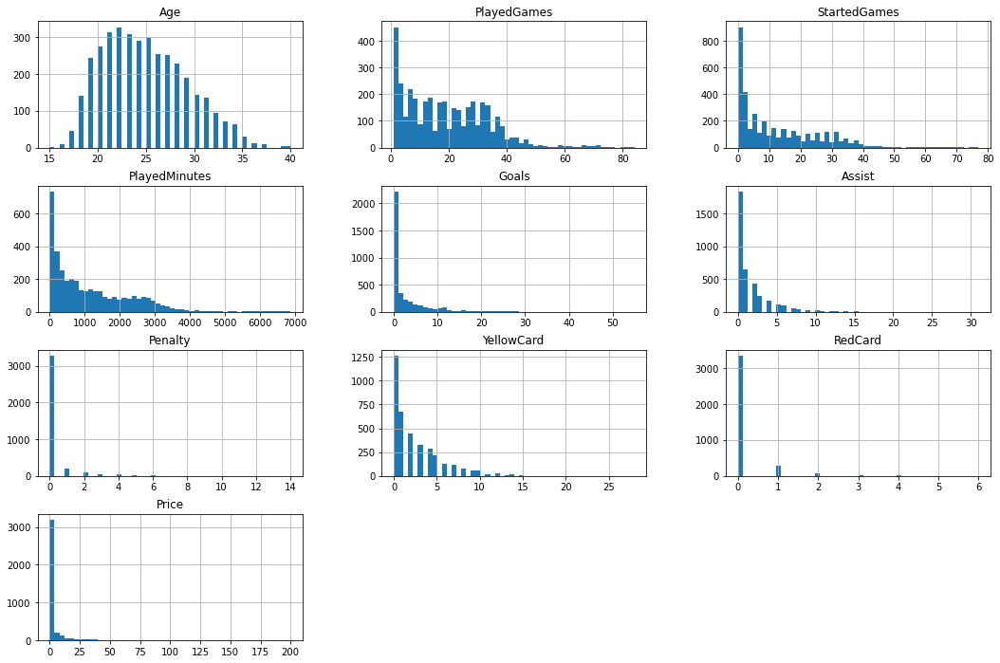

In [ ]:
dt.hist(bins=50, figsize=(18, 12));

##### Echamos un vistazo a los outliers

In [ ]:
dt[dt['Goals'] > 30.0]

,PlayerName,Age,Position,TeamName,Season,PlayedGames,StartedGames,PlayedMinutes,Goals,Assist,Penalty,YellowCard,RedCard,NextTeam,Price
10,Islam Slimani,27.0,DL,Sporting CP,2015-2016,73,67.0,5995.0,55.0,6.0,4.0,16.0,0.0,Leicester,27.45
24,Hatem Ben Arfa,28.0,DL.CC,OGC Nice,2015-2016,70,67.0,5789.0,34.0,12.0,10.0,4.0,0.0,Paris SG,0.00
26,Mohamed Salah,24.0,CC.DL,AS Roma,2016-2017,68,62.0,5318.0,32.0,23.0,0.0,4.0,0.0,Liverpool,37.80
28,Khalid Boutaïb,29.0,DL.CC,RC Strasbourg Alsace,2016-2017,68,64.0,5808.0,40.0,10.0,10.0,12.0,0.0,Y. Malatyaspor,0.00
29,Max Gradel,26.0,DL.CC,AS Saint-Étienne,2014-2015,68,51.0,4868.0,34.0,6.0,8.0,13.0,0.0,Bournemouth,9.00
40,Mario Balotelli,26.0,DL,OGC Nice,2017-2018,64,59.0,5192.0,43.0,3.0,14.0,25.0,2.0,Marseille,0.00
114,Pierre-Emerick Aubameyang,27.0,DL,Borussia Dortmund,2016-2017,46,44.0,3954.0,40.0,5.0,3.0,4.0,0.0,Arsenal,57.38
142,Diego Costa,24.0,DL,Atlético Madrid,2013-2014,44,43.0,3529.0,35.0,4.0,6.0,9.0,0.0,Chelsea,34.20
216,Edinson Cavani,25.0,DL.CC,SSC Napoli,2012-2013,41,37.0,3443.0,36.0,3.0,9.0,9.0,0.0,Paris SG,58.05
229,Gonzalo Higuaín,27.0,DL,SSC Napoli,2015-2016,40,37.0,3182.0,38.0,2.0,3.0,2.0,1.0,Juventus,81.00


In [ ]:
dt[dt['StartedGames'] > 60.0]

,PlayerName,Age,Position,TeamName,Season,PlayedGames,StartedGames,PlayedMinutes,Goals,Assist,Penalty,YellowCard,RedCard,NextTeam,Price
0,Juan Mata,24.0,DL.CC,Chelsea FC,2012-2013,84,72.0,6385.0,26.0,31.0,0.0,6.0,0.0,Man Utd,40.26
4,Nampalys Mendy,23.0,CC,OGC Nice,2015-2016,77,77.0,6874.0,2.0,4.0,0.0,4.0,2.0,Leicester,13.95
5,Guillaume Gillet,32.0,CC,FC Nantes,2016-2017,76,76.0,6732.0,6.0,0.0,0.0,10.0,0.0,Olympiacos,0.90
6,Roberto Soriano,24.0,CC,UC Sampdoria,2015-2016,75,67.0,5722.0,16.0,8.0,0.0,14.0,0.0,Villarreal,12.38
8,Jordan Veretout,21.0,CC,FC Nantes,2014-2015,74,74.0,6579.0,14.0,12.0,8.0,12.0,0.0,Aston Villa,9.00
10,Islam Slimani,27.0,DL,Sporting CP,2015-2016,73,67.0,5995.0,55.0,6.0,4.0,16.0,0.0,Leicester,27.45
11,Bryan Dabo,23.0,CC.DF,Montpellier HSC,2015-2016,72,64.0,5702.0,10.0,2.0,0.0,14.0,0.0,Saint-Étienne,3.60
12,Arturo Vidal,27.0,CC,Juventus FC,2014-2015,72,62.0,5579.0,15.0,8.0,5.0,19.0,0.0,Bayern Munich,35.33
14,Jonas Martin,25.0,CC,Montpellier HSC,2015-2016,72,70.0,6268.0,8.0,6.0,4.0,10.0,0.0,Real Betis,2.34
15,Steve Mounié,21.0,DL,Montpellier HSC,2016-2017,72,65.0,5770.0,29.0,4.0,0.0,10.0,4.0,Huddersfield,11.70


In [ ]:
dt[dt['Penalty'] > 8.0]

,PlayerName,Age,Position,TeamName,Season,PlayedGames,StartedGames,PlayedMinutes,Goals,Assist,Penalty,YellowCard,RedCard,NextTeam,Price
24,Hatem Ben Arfa,28.0,DL.CC,OGC Nice,2015-2016,70,67.0,5789.0,34.0,12.0,10.0,4.0,0.0,Paris SG,0.00
28,Khalid Boutaïb,29.0,DL.CC,RC Strasbourg Alsace,2016-2017,68,64.0,5808.0,40.0,10.0,10.0,12.0,0.0,Y. Malatyaspor,0.00
40,Mario Balotelli,26.0,DL,OGC Nice,2017-2018,64,59.0,5192.0,43.0,3.0,14.0,25.0,2.0,Marseille,0.00
51,Antonio Candreva,28.0,DL.CC,SS Lazio,2015-2016,60,56.0,4374.0,20.0,6.0,12.0,8.0,0.0,Inter,19.80
216,Edinson Cavani,25.0,DL.CC,SSC Napoli,2012-2013,41,37.0,3443.0,36.0,3.0,9.0,9.0,0.0,Paris SG,58.05
304,Santi Cazorla,34.0,CC,Villarreal CF,2019-2020,38,31.0,2662.0,14.0,10.0,9.0,5.0,0.0,Al-Sadd SC,0.00
1156,Bas Dost,29.0,DL,Sporting CP,2018-2019,26,21.0,1856.0,16.0,0.0,9.0,2.0,0.0,E. Frankfurt,6.30


In [ ]:
dt[dt['Price'] > 50.0]

,PlayerName,Age,Position,TeamName,Season,PlayedGames,StartedGames,PlayedMinutes,Goals,Assist,Penalty,YellowCard,RedCard,NextTeam,Price
68,Eden Hazard,27.0,DL,Chelsea FC,2018-2019,52,40.0,3909.0,21.0,17.0,6.0,2.0,0.0,Real Madrid,103.50
69,Raheem Sterling,19.0,DL.CC,Liverpool FC,2014-2015,52,49.0,4511.0,11.0,9.0,0.0,7.0,0.0,Man City,57.33
74,Kevin De Bruyne,23.0,CC,VfL Wolfsburg,2014-2015,51,51.0,4545.0,16.0,23.0,0.0,7.0,0.0,Man City,68.40
85,Paul Pogba,22.0,CC,Juventus FC,2015-2016,49,46.0,4284.0,10.0,15.0,1.0,12.0,0.0,Man Utd,94.50
114,Pierre-Emerick Aubameyang,27.0,DL,Borussia Dortmund,2016-2017,46,44.0,3954.0,40.0,5.0,3.0,4.0,0.0,Arsenal,57.38
122,Antoine Griezmann,27.0,DL,Atlético Madrid,2018-2019,46,46.0,3974.0,19.0,11.0,3.0,7.0,0.0,FC Barcelona,108.00
170,Rodri,22.0,CC,Atlético Madrid,2018-2019,43,39.0,3412.0,3.0,1.0,0.0,5.0,0.0,Man City,63.00
174,Miralem Pjanic,29.0,CC,Juventus FC,2019-2020,43,41.0,3337.0,3.0,6.0,0.0,11.0,0.0,FC Barcelona,54.00
180,Ousmane Dembélé,19.0,CC.DL,Borussia Dortmund,2016-2017,42,31.0,2806.0,8.0,17.0,0.0,8.0,0.0,FC Barcelona,124.20
200,Diego Costa,27.0,DL,Chelsea FC,2016-2017,42,38.0,3484.0,22.0,6.0,0.0,11.0,0.0,Atlético Madrid,59.40


##### Miramos las correlaciones

In [ ]:
corr_matrix = dt.corr()
corr_matrix['Price'].sort_values(ascending=False)

Price            1.000000
Assist           0.459648
Goals            0.424213
PlayedMinutes    0.369723
StartedGames     0.365493
PlayedGames      0.325519
YellowCard       0.243749
Penalty          0.216085
RedCard          0.088049
Age             -0.077930
Name: Price, dtype: float64

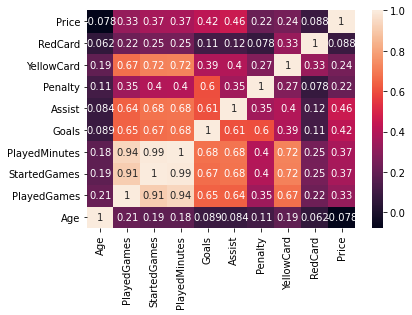

In [ ]:
corr_matrix = dt.corr()
heatmap = sn.heatmap(corr_matrix, annot=True)
heatmap.set(ylim=(0,len(corr_matrix)))
heatmap.set(xlim=(0,len(corr_matrix)))

plt.show()

##### Visualizamos algunas relaciones entre variables

<AxesSubplot:xlabel='Goals', ylabel='Price'>

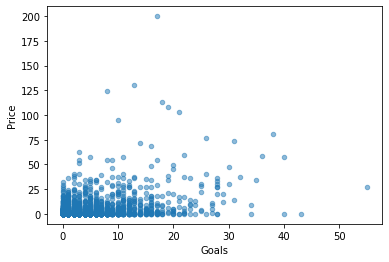

In [ ]:
dt.plot(kind="scatter", x="Goals", y="Price", alpha=0.5)

In [ ]:
dt[(dt['Goals'] > 50) & (dt['Price']<50)]

,PlayerName,Age,Position,TeamName,Season,PlayedGames,StartedGames,PlayedMinutes,Goals,Assist,Penalty,YellowCard,RedCard,NextTeam,Price
10,Islam Slimani,27.0,DL,Sporting CP,2015-2016,73,67.0,5995.0,55.0,6.0,4.0,16.0,0.0,Leicester,27.45


<AxesSubplot:xlabel='Assist', ylabel='Price'>

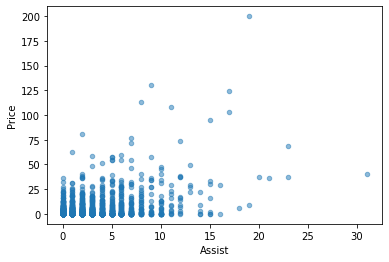

In [ ]:
dt.plot(kind="scatter", x="Assist", y="Price", alpha=0.5)

In [ ]:
dt[(dt['Assist'] > 15) & (dt['Price']<25)]

,PlayerName,Age,Position,TeamName,Season,PlayedGames,StartedGames,PlayedMinutes,Goals,Assist,Penalty,YellowCard,RedCard,NextTeam,Price
37,Ryad Boudebouz,26.0,CC.DL,Montpellier HSC,2016-2017,66,66.0,5842.0,22.0,18.0,6.0,8.0,0.0,Real Betis,6.30
46,Mark Uth,25.0,DL.CC,TSG 1899 Hoffenheim,2017-2018,62,48.0,4354.0,28.0,16.0,0.0,10.0,0.0,FC Schalke 04,0.00
552,Dries Mertens,25.0,DL.CC,PSV Eindhoven,2012-2013,34,34.0,2767.0,17.0,19.0,4.0,2.0,0.0,SSC Napoli,8.53


<AxesSubplot:xlabel='PlayedMinutes', ylabel='Price'>

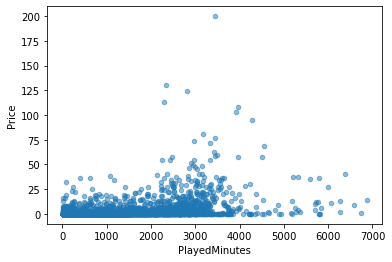

In [ ]:
dt.plot(kind="scatter", x="PlayedMinutes", y="Price", alpha=0.5)

##### Procesamos los datos: one-hot encoding

In [ ]:
dt = pd.get_dummies(dt, columns=['Position', 'TeamName', 'NextTeam', 'Season'])

In [ ]:
corr_matrix = dt.corr()

In [ ]:
corr_matrix['Price'].sort_values(ascending=False).head(20)

Price                         1.000000
Assist                        0.459648
Goals                         0.424213
PlayedMinutes                 0.369723
StartedGames                  0.365493
PlayedGames                   0.325519
NextTeam_FC Barcelona         0.300918
NextTeam_Man Utd              0.253498
YellowCard                    0.243749
Penalty                       0.216085
NextTeam_Paris SG             0.195965
NextTeam_Man City             0.187600
NextTeam_Chelsea              0.183225
NextTeam_Real Madrid          0.171909
NextTeam_Atlético Madrid      0.151436
NextTeam_Liverpool            0.137528
TeamName_Borussia Dortmund    0.108277
NextTeam_Arsenal              0.105254
TeamName_Liverpool FC         0.096896
NextTeam_SH SIPG              0.094743
Name: Price, dtype: float64

In [ ]:
corr_matrix['Price'].sort_values(ascending=False).tail(20)

TeamName_Roda JC Kerkrade   -0.023062
Position_CC.DF              -0.023967
TeamName_Barnsley FC        -0.024130
TeamName_FC Augsburg        -0.024308
TeamName_Heracles Almelo    -0.024509
TeamName_CS Marítimo        -0.024564
TeamName_Boavista FC        -0.024643
TeamName_FC Utrecht         -0.025109
TeamName_Millwall FC        -0.026749
TeamName_PEC Zwolle         -0.028297
Position_DF.CC              -0.028397
Position_DF                 -0.028653
TeamName_Reading FC         -0.031681
TeamName_ADO Den Haag       -0.031861
Season_2012-2013            -0.035136
Position_CC                 -0.042040
Season_2013-2014            -0.044177
NextTeam_Retired            -0.045796
NextTeam_Without Club       -0.067861
Age                         -0.077930
Name: Price, dtype: float64

##### La variable PlayerName no parece relevante para usar

In [ ]:
dt = dt.drop(['PlayerName'], axis=1)

##### Función que separa features y labels

In [ ]:
def splitDT(dt, label):
    labels = dt[[label]].values
    features = dt.drop([label], axis=1).values

    return features, labels

##### Obtenemos nuestro set de train, test y validación

In [ ]:
# Fijamos el set de test en un 20% del original, y para entrenar el 80%.
size = 0.2
train_set_full, test_set = train_test_split(dt, test_size=size, random_state=42)

# Set de validacion
train_set, valid_set = train_test_split(train_set_full, test_size=size, random_state=42)

In [ ]:
X_train, y_train = splitDT(train_set, 'Price')
X_valid, y_valid = splitDT(valid_set, 'Price')
X_test, y_test = splitDT(test_set, 'Price')

In [ ]:
X_train.shape

(2385, 1038)

##### Escalamos las features para que los modelos trabajen mejor

In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_valid = scaler.transform(X_valid)
X_test = scaler.transform(X_test)

##### Trabajamos con varios modelos con los que queremos ver la performance.

La idea es:
 - Entrenar con train.
 - Cross Validation para ver si hay overfitting.
 - Evaluamos con test.
 - Visualizamos las predicciones vs valores reales.
 - Almacenamos en nuestra tabla comparativa el resultado de test.

### Linear Regression

RMSE Train Mean: 2674104828739705.0
RMSE Test: 45072379317739.01


,RMSE
Linear Regression Model,4.507238e+13


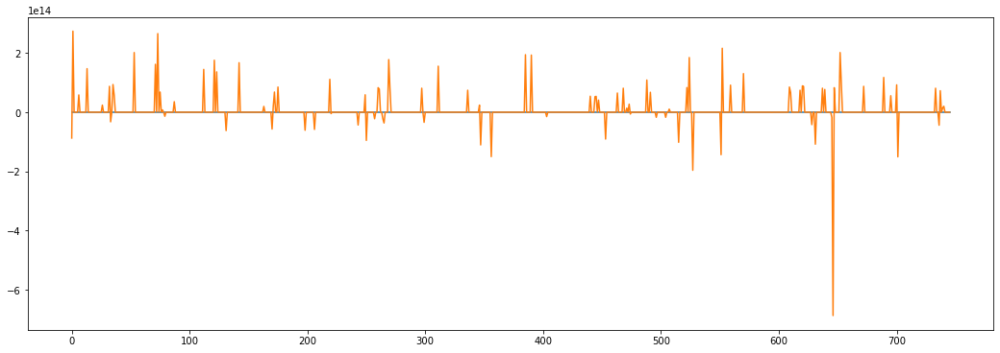

In [ ]:
# Entrenamiento
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)
lin_reg_scores = cross_val_score(lin_reg, X_train, y_train, scoring="neg_mean_squared_error", cv=10)

# Métricas Train
lin_reg_rmse_train = np.sqrt(-lin_reg_scores).mean()
print("RMSE Train Mean:", np.round(lin_reg_rmse_train, 3))

# Métricas Test
lin_reg_rmse = np.sqrt(mean_squared_error(y_test, lin_reg.predict(X_test)))
print("RMSE Test:", np.round(lin_reg_rmse, 3))

# Visualizamos
figure(num=None, figsize=(18, 6))
plt.plot(y_test)
plt.plot(lin_reg.predict(X_test))

# Añadir a la tabla comparativa
model_comparative = AddModel('Linear Regression Model', lin_reg_rmse, model_comparative)
model_comparative.sort_values(by=['RMSE'], ascending=True).head()

### SGD Regression

RMSE Train Mean: 141.789
RMSE Test: 386.648


,RMSE
SGD Regression Model,3.866480e+02
Linear Regression Model,4.507238e+13


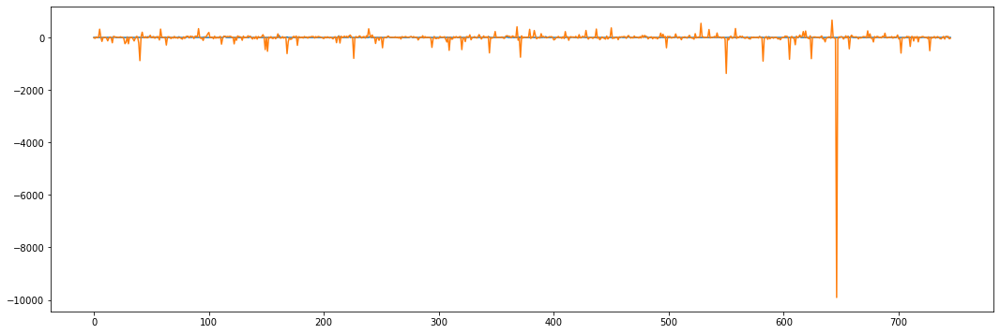

In [ ]:
# Entrenamiento
sgd_reg = SGDRegressor(max_iter=1000, tol=1e-3)
sgd_reg.fit(X_train, y_train)
sgd_reg_scores = cross_val_score(sgd_reg, X_train, y_train, scoring="neg_mean_squared_error", cv=10)

# Métricas Train
sgd_reg_rmse_train = np.sqrt(-sgd_reg_scores).mean()
print("RMSE Train Mean:", np.round(sgd_reg_rmse_train, 3))

# Métricas Test
sgd_reg_rmse = np.sqrt(mean_squared_error(y_test, sgd_reg.predict(X_test)))
print("RMSE Test:", np.round(sgd_reg_rmse, 3))

# Visualizamos
figure(num=None, figsize=(18, 6))
plt.plot(y_test)
plt.plot(sgd_reg.predict(X_test))

# Añadir a la tabla comparativa
model_comparative = AddModel('SGD Regression Model', sgd_reg_rmse, model_comparative)
model_comparative.sort_values(by=['RMSE'], ascending=True).head()

### Linear SVM

RMSE Train Mean: 141.789
RMSE Test: 8.16


,RMSE
Linear SVM Model,8.160000e+00
SGD Regression Model,3.866480e+02
Linear Regression Model,4.507238e+13


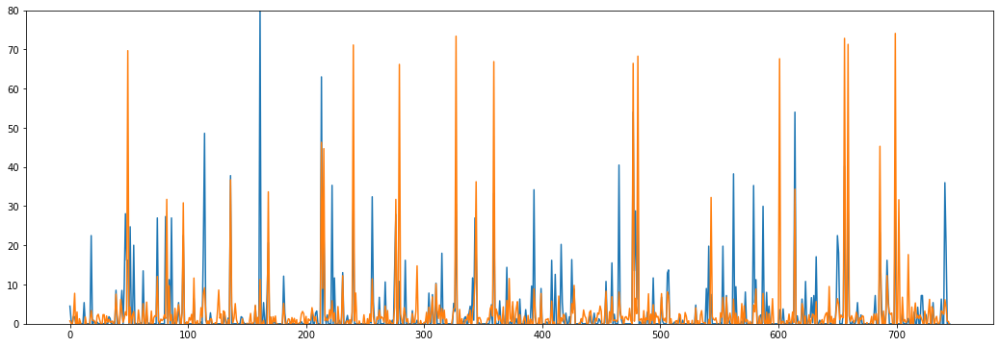

In [ ]:
# Entrenamiento
svm_reg = LinearSVR(epsilon=1.5)
svm_reg.fit(X_train, y_train)
svm_reg_scores = cross_val_score(svm_reg, X_train, y_train, scoring="neg_mean_squared_error", cv=10)

# Métricas Train
svm_reg_rmse_train = np.sqrt(-svm_reg_scores).mean()
print("RMSE Train Mean:", np.round(sgd_reg_rmse_train, 3))

# Métricas Test
svm_reg_rmse = np.sqrt(mean_squared_error(y_test, svm_reg.predict(X_test)))
print("RMSE Test:", np.round(svm_reg_rmse, 3))

# Visualizamos
figure(num=None, figsize=(18, 6))
plt.ylim([0,80])
plt.plot(y_test)
plt.plot(svm_reg.predict(X_test))

# Añadir a la tabla comparativa
model_comparative = AddModel('Linear SVM Model', svm_reg_rmse, model_comparative)
model_comparative.sort_values(by=['RMSE'], ascending=True).head()

### Decision Tree

RMSE Train Mean: 9.83
RMSE Test: 10.552


,RMSE
Linear SVM Model,8.160000e+00
Decision Tree Model,1.055200e+01
SGD Regression Model,3.866480e+02
Linear Regression Model,4.507238e+13


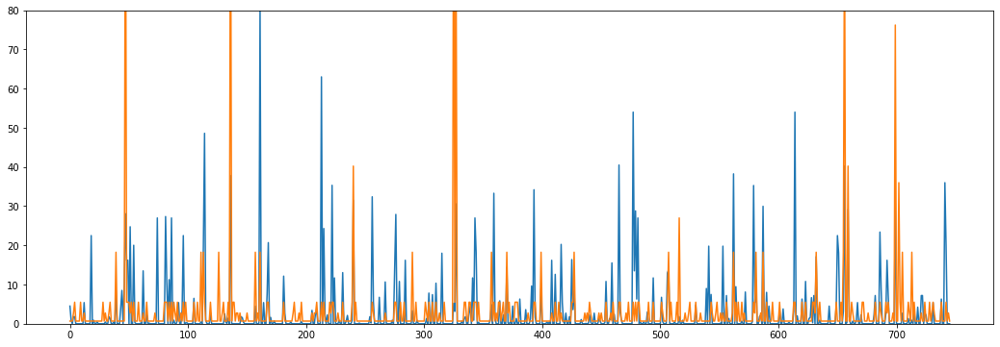

In [ ]:
# Entrenamiento
tree_reg = DecisionTreeRegressor(max_depth=6)
tree_reg.fit(X_train, y_train)
tree_reg_scores = cross_val_score(tree_reg, X_train, y_train, scoring="neg_mean_squared_error", cv=10)

# Métricas Train
tree_reg_rmse_train = np.sqrt(-tree_reg_scores).mean()
print("RMSE Train Mean:", np.round(tree_reg_rmse_train, 3))

# Métricas Test
tree_reg_rmse = np.sqrt(mean_squared_error(y_test, tree_reg.predict(X_test)))
print("RMSE Test:", np.round(tree_reg_rmse, 3))

# Visualizamos
figure(num=None, figsize=(18, 6))
plt.ylim([0,80])
plt.plot(y_test)
plt.plot(tree_reg.predict(X_test))

# Añadir a la tabla comparativa
model_comparative = AddModel('Decision Tree Model', tree_reg_rmse, model_comparative)
model_comparative.sort_values(by=['RMSE'], ascending=True).head()

### Random Forest

RMSE Train Mean: 8.246
RMSE Test: 7.621


,RMSE
Random Forest Model,7.621000e+00
Linear SVM Model,8.160000e+00
Decision Tree Model,1.055200e+01
SGD Regression Model,3.866480e+02
Linear Regression Model,4.507238e+13


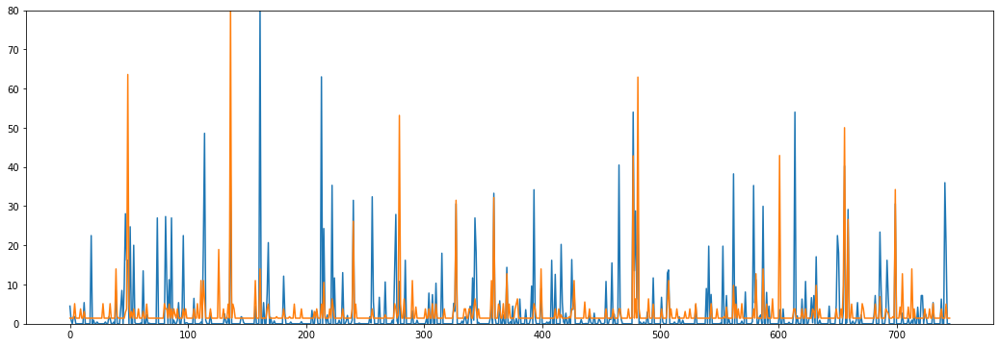

In [ ]:
# Entrenamiento
rf_reg = RandomForestRegressor(max_depth=3, random_state=0)
rf_reg.fit(X_train, y_train)
rf_reg_scores = cross_val_score(rf_reg, X_train, y_train, scoring="neg_mean_squared_error", cv=10)

# Métricas Train
rf_reg_rmse_train = np.sqrt(-rf_reg_scores).mean()
print("RMSE Train Mean:", np.round(rf_reg_rmse_train, 3))

# Métricas Test
rf_reg_rmse = np.sqrt(mean_squared_error(y_test, rf_reg.predict(X_test)))
print("RMSE Test:", np.round(rf_reg_rmse, 3))

# Visualizamos
figure(num=None, figsize=(18, 6))
plt.ylim([0,80])
plt.plot(y_test)
plt.plot(rf_reg.predict(X_test))

# Añadir a la tabla comparativa
model_comparative = AddModel('Random Forest Model', rf_reg_rmse, model_comparative)
model_comparative.sort_values(by=['RMSE'], ascending=True).head()

### Gradient Boosting

RMSE Train Mean: 8.859
RMSE Test: 8.651


,RMSE
Random Forest Model,7.621
Linear SVM Model,8.160
Gradient Boosting Model,8.651
Decision Tree Model,10.552
SGD Regression Model,386.648


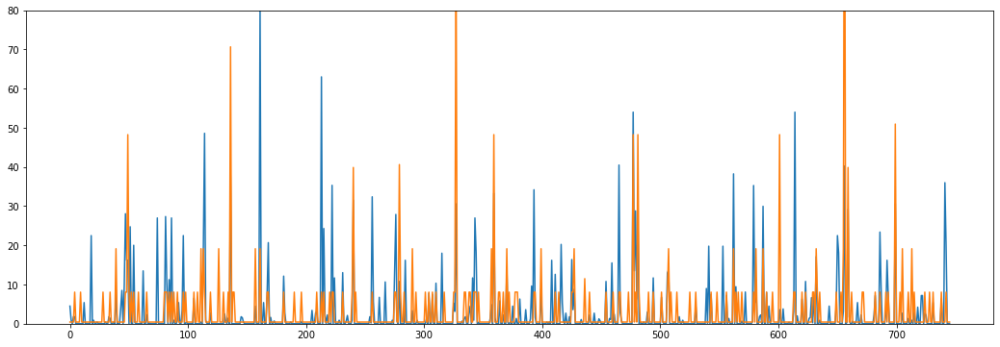

In [ ]:
# Entrenamiento
gb_reg = GradientBoostingRegressor(max_depth=2, n_estimators=3, learning_rate=1.0)
gb_reg.fit(X_train, y_train)
gb_reg_scores = cross_val_score(gb_reg, X_train, y_train, scoring="neg_mean_squared_error", cv=10)

# Métricas Train
gb_reg_rmse_train = np.sqrt(-gb_reg_scores).mean()
print("RMSE Train Mean:", np.round(gb_reg_rmse_train, 3))

# Métricas Test
gb_reg_rmse = np.sqrt(mean_squared_error(y_test, gb_reg.predict(X_test)))
print("RMSE Test:", np.round(gb_reg_rmse, 3))

# Visualizamos
figure(num=None, figsize=(18, 6))
plt.ylim([0,80])
plt.plot(y_test)
plt.plot(gb_reg.predict(X_test))

# Añadir a la tabla comparativa
model_comparative = AddModel('Gradient Boosting Model', gb_reg_rmse, model_comparative)
model_comparative.sort_values(by=['RMSE'], ascending=True).head()

### ANN Sequence Model

In [ ]:
tf.__version__

'2.0.0'

In [ ]:
keras.__version__

'2.2.4-tf'

In [ ]:
model_seq = keras.models.Sequential([
    keras.layers.Dense(30, activation="relu", input_shape = X_train.shape[1:]),
    keras.layers.Dense(1)
])

In [ ]:
model_seq.compile(loss="mean_squared_error", optimizer="adam")

In [ ]:
history_seq = model_seq.fit(X_train, y_train, epochs=20, validation_data = (X_valid, y_valid))

Train on 2385 samples, validate on 597 samples
Epoch 1/20
2385/2385 [==============================] - 1s 344us/sample - loss: 102.7958 - val_loss: 28.6657
Epoch 2/20
2385/2385 [==============================] - 0s 73us/sample - loss: 79.4347 - val_loss: 23.1692
Epoch 3/20
2385/2385 [==============================] - 0s 79us/sample - loss: 68.0460 - val_loss: 22.7451
Epoch 4/20
2385/2385 [==============================] - 0s 72us/sample - loss: 60.7617 - val_loss: 22.8409
Epoch 5/20
2385/2385 [==============================] - 0s 74us/sample - loss: 54.8833 - val_loss: 23.9207
Epoch 6/20
2385/2385 [==============================] - 0s 78us/sample - loss: 50.5447 - val_loss: 24.3046
Epoch 7/20
2385/2385 [==============================] - 0s 71us/sample - loss: 46.4043 - val_loss: 25.4252
Epoch 8/20
2385/2385 [==============================] - 0s 74us/sample - loss: 43.1875 - val_loss: 27.3640
Epoch 9/20
2385/2385 [==============================] - 0s 72us/sample - loss: 40.2809 - val_lo

In [ ]:
ann_seq_mse = model_seq.evaluate(X_test, y_test)
ann_seq_rmse = np.sqrt(ann_seq_mse)

746/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

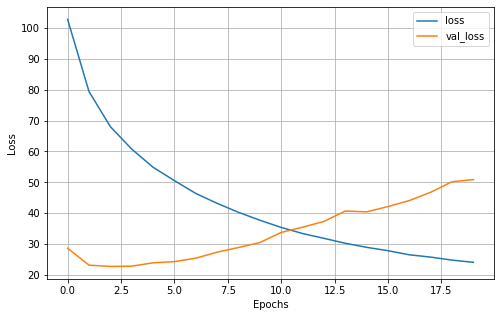

In [ ]:
# Learning Curves
pd.DataFrame(history_seq.history).plot(figsize=(8,5))
plt.grid(True)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

RMSE Mean: 8.207


,RMSE
Random Forest Model,7.621
Linear SVM Model,8.160
ANN Sequential Model,8.207
Gradient Boosting Model,8.651
Decision Tree Model,10.552


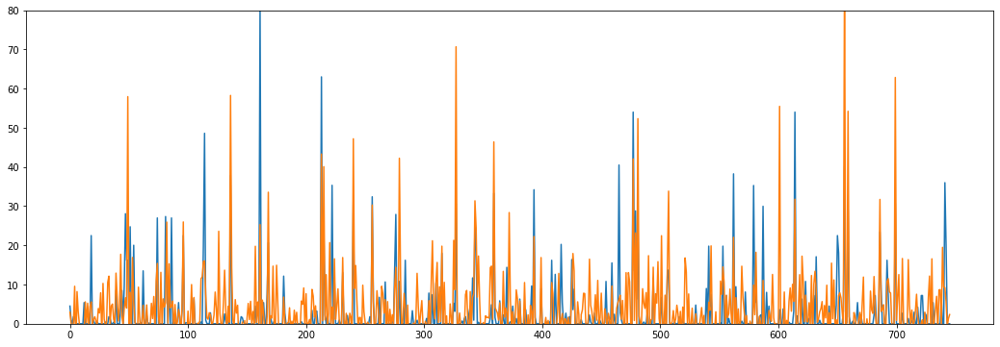

In [ ]:
# Métricas
print("RMSE Mean:", np.round(ann_seq_rmse, 3))

# Visualizamos
figure(num=None, figsize=(18, 6))
plt.ylim([0,80])
plt.plot(y_test)
plt.plot(model_seq.predict(X_test))

# Añadir a la tabla comparativa
model_comparative = AddModel('ANN Sequential Model', ann_seq_rmse, model_comparative)
model_comparative.sort_values(by=['RMSE'], ascending=True).head()

### ANN Functional Model

In [ ]:
# Creando una ANN Functional

input_ = keras.layers.Input(shape=X_train.shape[1:])
hidden1 = keras.layers.Dense(30, activation="relu")(input_)
hidden2 = keras.layers.Dense(30, activation="relu")(hidden1)
concat = keras.layers.Concatenate()([input_, hidden2])
output = keras.layers.Dense(1)(concat)

model_func = keras.Model(inputs=[input_], outputs=[output])

model_func.compile(loss="mean_squared_error", optimizer="adam")

In [ ]:
history_func = model_func.fit(X_train, y_train, epochs=20, validation_data = (X_valid, y_valid))

Train on 2385 samples, validate on 597 samples
Epoch 1/20
2385/2385 [==============================] - 1s 340us/sample - loss: 93.8289 - val_loss: 23.9775
Epoch 2/20
2385/2385 [==============================] - 0s 84us/sample - loss: 71.1922 - val_loss: 21.2727
Epoch 3/20
2385/2385 [==============================] - 0s 91us/sample - loss: 56.9000 - val_loss: 18.1841
Epoch 4/20
2385/2385 [==============================] - 0s 86us/sample - loss: 45.8442 - val_loss: 23.8762
Epoch 5/20
2385/2385 [==============================] - 0s 84us/sample - loss: 37.6718 - val_loss: 33.8454
Epoch 6/20
2385/2385 [==============================] - 0s 90us/sample - loss: 32.4861 - val_loss: 30.0450
Epoch 7/20
2385/2385 [==============================] - 0s 88us/sample - loss: 27.5413 - val_loss: 34.8855
Epoch 8/20
2385/2385 [==============================] - 0s 87us/sample - loss: 24.6781 - val_loss: 45.4931
Epoch 9/20
2385/2385 [==============================] - 0s 84us/sample - loss: 21.7957 - val_los

In [ ]:
ann_funct_mse = model_func.evaluate(X_test, y_test)
ann_funct_rmse = np.sqrt(ann_funct_mse)

746/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

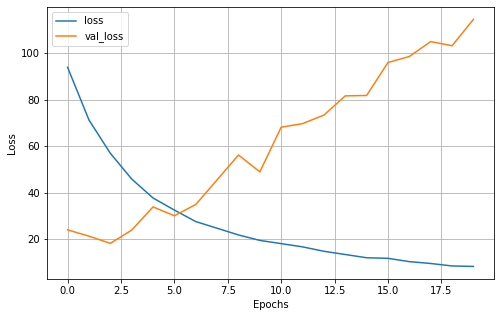

In [ ]:
# Learning Curves
pd.DataFrame(history_func.history).plot(figsize=(8,5))
plt.grid(True)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

RMSE Mean: 10.402


,RMSE
Random Forest Model,7.621
Linear SVM Model,8.160
ANN Sequential Model,8.207
Gradient Boosting Model,8.651
ANN Functional Model,10.402


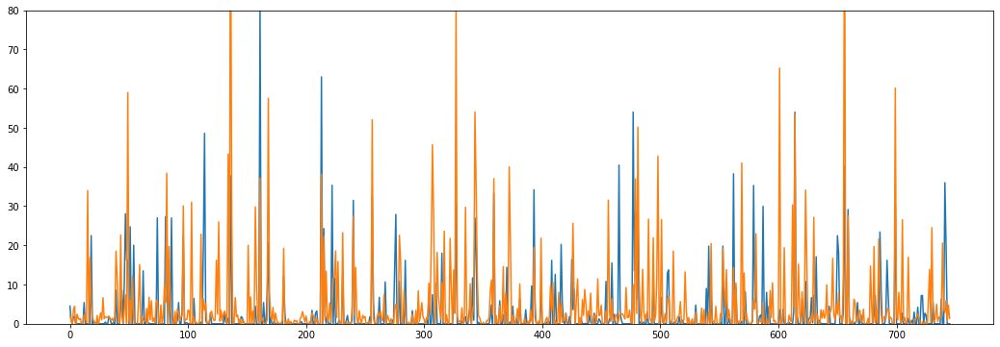

In [ ]:
# Métricas
print("RMSE Mean:", np.round(ann_funct_rmse, 3))

# Visualizamos
figure(num=None, figsize=(18, 6))
plt.ylim([0,80])
plt.plot(y_test)
plt.plot(model_func.predict(X_test))

# Añadir a la tabla comparativa
model_comparative = AddModel('ANN Functional Model', ann_funct_rmse, model_comparative)
model_comparative.sort_values(by=['RMSE'], ascending=True).head()

### Comparamos modelos

In [ ]:
model_comparative.sort_values(by=['RMSE'], ascending=True)

,RMSE
Random Forest Model,7.621000e+00
Linear SVM Model,8.160000e+00
ANN Sequential Model,8.207000e+00
Gradient Boosting Model,8.651000e+00
ANN Functional Model,1.040200e+01
Decision Tree Model,1.055200e+01
SGD Regression Model,3.866480e+02
Linear Regression Model,4.507238e+13


### ¿Problemas?

Como podemos ver, las redes neuronales no funcionan mejor que lo que hemos usado con scikit-learn. No siempre tiene que funcionar mejor, pero si esperábamos que trabajar con redes neuronales que simula el comportamiento humano pues obtuvieramos algo mejor aquí.

Pero no hemos trabajado mucho o incidido en redes neuronales, simplemente hemos ejecutado un par y vemos su funcionamiento. ¿Cómo mejorar la performance?

Podemos usar callbacks, hacer fine-tuning... vamos a ello!

### Early Stopping

Con las redes neuronales hemos podido comprobar que es fácil que tienda al overfitting si no tenemos cuidado, hay un número de epochs en los que training se va muy lejos de validation y podemos encontrarnos con ese problema.

Por ello podemos utilizar callbacks: en cada iteración, se ejecuta la función que comprueba algo de la propia ejecución, y se puede parar dicha ejecución o lo que es lo mismo el entrenamiento.

Con Early Stopping podemos decir qué variable quiero que monitoree y qué paciencia quiero que tenga. En este caso, vamos a usar la función perdida del set de validación.

In [ ]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=1)

model_early = keras.models.Sequential([
    keras.layers.Dense(30, activation="relu", input_shape = X_train.shape[1:]),
    keras.layers.Dense(1)
])

model_early.compile(loss="mean_squared_error", optimizer="adam")

history_early = model_early.fit(X_train, y_train, epochs=20, validation_data = (X_valid, y_valid), callbacks=[callback])

Train on 2385 samples, validate on 597 samples
Epoch 1/20
2385/2385 [==============================] - 1s 286us/sample - loss: 92.2427 - val_loss: 24.5407
Epoch 2/20
2385/2385 [==============================] - 0s 79us/sample - loss: 75.9482 - val_loss: 21.0147
Epoch 3/20
2385/2385 [==============================] - 0s 78us/sample - loss: 64.2605 - val_loss: 20.4696
Epoch 4/20
2385/2385 [==============================] - 0s 79us/sample - loss: 56.8451 - val_loss: 22.6464


In [ ]:
ann_early_mse = model_early.evaluate(X_test, y_test)
ann_early_rmse = np.sqrt(ann_early_mse)

746/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

RMSE Mean: 6.195


,RMSE
ANN Sequential (Early Stopping) Model,6.195
Random Forest Model,7.621
Linear SVM Model,8.160
ANN Sequential Model,8.207
Gradient Boosting Model,8.651


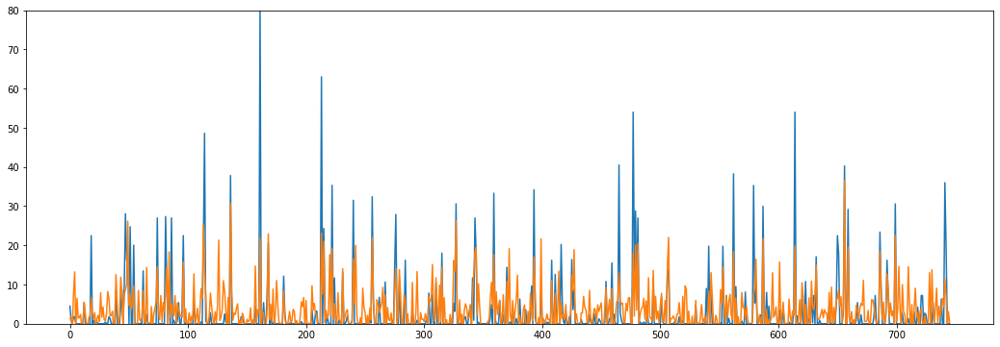

In [ ]:
# Métricas
print("RMSE Mean:", np.round(ann_early_rmse, 3))

# Visualizamos
figure(num=None, figsize=(18, 6))
plt.ylim([0,80])
plt.plot(y_test)
plt.plot(model_early.predict(X_test))

# Añadir a la tabla comparativa
model_comparative = AddModel('ANN Sequential (Early Stopping) Model', ann_early_rmse, model_comparative)
model_comparative.sort_values(by=['RMSE'], ascending=True).head()

Evitando el overfitting, podemos comprobar cómo mejoramos por mucho la métrica en el set de test. Es una forma de evitar el overfitting en nuestro modelo.

También podemos trabajar con más capas, y más neuronas. Probemos a ver...

## Fine-Tuning

In [ ]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=1)

model_ft = keras.models.Sequential([
    keras.layers.Dense(30, activation="relu", input_shape = X_train.shape[1:]),
    keras.layers.Dense(20, activation="relu"),
    keras.layers.Dense(1)
])

model_ft.compile(loss="mean_squared_error", optimizer="adam")

history_ft = model_ft.fit(X_train, y_train, epochs=20, validation_data = (X_valid, y_valid), callbacks=[callback])

Train on 2385 samples, validate on 597 samples
Epoch 1/20
2385/2385 [==============================] - 1s 360us/sample - loss: 92.1780 - val_loss: 23.9554
Epoch 2/20
2385/2385 [==============================] - 0s 81us/sample - loss: 72.3536 - val_loss: 19.0807
Epoch 3/20
2385/2385 [==============================] - 0s 81us/sample - loss: 58.7011 - val_loss: 18.2022
Epoch 4/20
2385/2385 [==============================] - 0s 79us/sample - loss: 48.3580 - val_loss: 23.8153


In [ ]:
ann_ft_mse = model_ft.evaluate(X_test, y_test)
ann_ft_rmse = np.sqrt(ann_ft_mse)

746/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

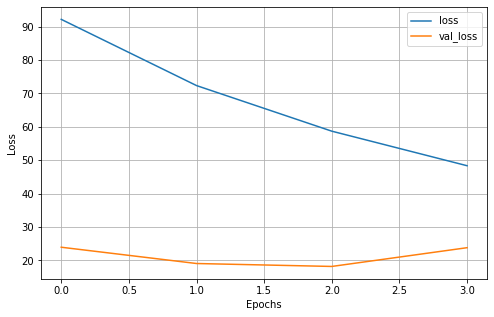

In [ ]:
# Learning Curves
pd.DataFrame(history_ft.history).plot(figsize=(8,5))
plt.grid(True)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

RMSE Mean: 6.168


,RMSE
ANN Sequential (Early Stopping) Model - Fine Tuning,6.168
ANN Sequential (Early Stopping) Model,6.195
Random Forest Model,7.621
Linear SVM Model,8.160
ANN Sequential Model,8.207


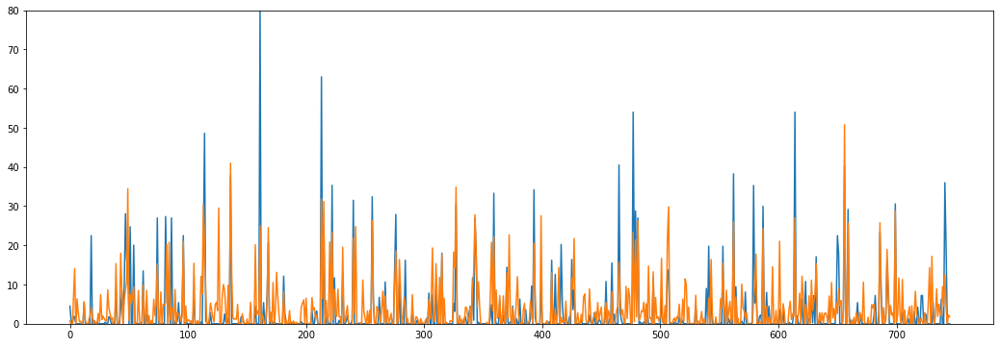

In [ ]:
# Métricas
print("RMSE Mean:", np.round(ann_ft_rmse, 3))

# Visualizamos
figure(num=None, figsize=(18, 6))
plt.ylim([0,80])
plt.plot(y_test)
plt.plot(model_ft.predict(X_test))

# Añadir a la tabla comparativa
model_comparative = AddModel('ANN Sequential (Early Stopping) Model - Fine Tuning', ann_ft_rmse, model_comparative)
model_comparative.sort_values(by=['RMSE'], ascending=True).head()

Mejora, ¿verdad? Es decir, si añadimos más capas y más neuronas el modelo podrá aprender mejor. Y si mantenemos como hemos hecho el early stopping podemos tratar de evitar el overfitting.

¿El resultado? Parece el mejor de todos los modelos que hemos hecho.

¿Así hacemos overfitting?
Como hacíamos en scikit-learn, podemos usar funciones como Grid Search para encontrar la mejor permutación... pero ojo, tenemos que hacer algún tipo de transformación.

### Grid Search CV

In [ ]:
from scipy.stats import reciprocal
from sklearn.model_selection import RandomizedSearchCV

callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=1)

param_distribs = {
    "n_hidden": [0, 1, 2, 3, 4],
    "n_neurons": np.arange(1,50),
}

def build_model(n_hidden=1, n_neurons=1, input_shape=[1038]):
    model = keras.models.Sequential()
    model.add(keras.layers.InputLayer(input_shape=input_shape))
    
    for layer in range(n_hidden):
        model.add(keras.layers.Dense(n_neurons, activation="relu"))
        
    model.add(keras.layers.Dense(1))
    
    model.compile(loss="mean_squared_error", optimizer="adam")
    
    return model

keras_reg = keras.wrappers.scikit_learn.KerasRegressor(build_model)

grid_search_cv = GridSearchCV(keras_reg, param_distribs, cv=3)
grid_search_cv.fit(X_train, y_train, epochs=500, validation_data = (X_valid, y_valid), callbacks=[callback])

model = grid_search_cv.best_estimator_.model

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 315us/sample - loss: 62.5159 - val_loss: 34.1038
Epoch 2/500
1590/1590 [==============================] - 0s 80us/sample - loss: 58.1625 - val_loss: 31.8438
Epoch 3/500
1590/1590 [==============================] - 0s 78us/sample - loss: 54.8484 - val_loss: 30.3146
Epoch 4/500
1590/1590 [==============================] - 0s 80us/sample - loss: 52.0528 - val_loss: 29.5309
Epoch 5/500
1590/1590 [==============================] - 0s 81us/sample - loss: 49.6872 - val_loss: 29.1936
Epoch 6/500
1590/1590 [==============================] - 0s 80us/sample - loss: 47.6283 - val_loss: 29.3351
795/1 [=========================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 332us/sample - loss: 120.5706 - val_loss: 34.1651
Epoch 2/500
1590/1590 [==============================] - 0s 90us/sample - loss: 114.5573 - val_loss: 32.0872
Epoch 3/500
1590/1590 [==============================] - 0s 77us/sample - loss: 109.5852 - val_loss: 30.7361
Epoch 4/500
1590/1590 [==============================] - 0s 77us/sample - loss: 105.2373 - val_loss: 30.0142
Epoch 5/500
1590/1590 [==============================] - 0s 76us/sample - loss: 101.4232 - val_loss: 29.8953
Epoch 6/500
1590/1590 [==============================] - 0s 75us/sample - loss: 98.1492 - val_loss: 30.3095
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 436us/sample - loss: 117.3821 - val_loss: 31.6348
Epoch 2/500
1590/1590 [==============================] - 0s 75us/sample - loss: 111.7599 - val_loss: 29.2116
Epoch 3/500
1590/1590 [==============================] - 0s 77us/sample - loss: 107.1111 - val_loss: 27.7576
Epoch 4/500
1590/1590 [==============================] - 0s 78us/sample - loss: 103.1639 - val_loss: 26.5512
Epoch 5/500
1590/1590 [==============================] - 0s 76us/sample - loss: 99.6481 - val_loss: 25.9735
Epoch 6/500
1590/1590 [==============================] - 0s 82us/sample - loss: 96.5055 - val_loss: 25.8275
Epoch 7/500
1590/1590 [==============================] - 0s 75us/sample - loss: 93.7630 - val_loss: 26.0599
795/1 [=========================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 383us/sample - loss: 62.9465 - val_loss: 34.3292
Epoch 2/500
1590/1590 [==============================] - 0s 77us/sample - loss: 58.6963 - val_loss: 32.2394
Epoch 3/500
1590/1590 [==============================] - 0s 80us/sample - loss: 55.3385 - val_loss: 30.7421
Epoch 4/500
1590/1590 [==============================] - 0s 79us/sample - loss: 52.4565 - val_loss: 30.0159
Epoch 5/500
1590/1590 [==============================] - 0s 80us/sample - loss: 50.0696 - val_loss: 29.7882
Epoch 6/500
1590/1590 [==============================] - 0s 80us/sample - loss: 47.9846 - val_loss: 29.9274
795/1 [=========================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 333us/sample - loss: 121.0159 - val_loss: 33.4626
Epoch 2/500
1590/1590 [==============================] - 0s 83us/sample - loss: 114.8857 - val_loss: 31.3936
Epoch 3/500
1590/1590 [==============================] - 0s 81us/sample - loss: 109.9031 - val_loss: 30.3999
Epoch 4/500
1590/1590 [==============================] - 0s 83us/sample - loss: 105.7865 - val_loss: 30.0003
Epoch 5/500
1590/1590 [==============================] - 0s 78us/sample - loss: 101.9792 - val_loss: 30.2194
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 320us/sample - loss: 119.3099 - val_loss: 33.0406
Epoch 2/500
1590/1590 [==============================] - 0s 90us/sample - loss: 113.5151 - val_loss: 30.8345
Epoch 3/500
1590/1590 [==============================] - 0s 97us/sample - loss: 108.7543 - val_loss: 29.3185
Epoch 4/500
1590/1590 [==============================] - 0s 85us/sample - loss: 104.5823 - val_loss: 28.2731
Epoch 5/500
1590/1590 [==============================] - 0s 86us/sample - loss: 101.0118 - val_loss: 27.7159
Epoch 6/500
1590/1590 [==============================] - 0s 82us/sample - loss: 97.7749 - val_loss: 27.6540
Epoch 7/500
1590/1590 [==============================] - 0s 82us/sample - loss: 94.9426 - val_loss: 27.8290
795/1 [========================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 315us/sample - loss: 61.7803 - val_loss: 33.6101
Epoch 2/500
1590/1590 [==============================] - 0s 76us/sample - loss: 57.6823 - val_loss: 31.4582
Epoch 3/500
1590/1590 [==============================] - 0s 76us/sample - loss: 54.4910 - val_loss: 29.9317
Epoch 4/500
1590/1590 [==============================] - 0s 77us/sample - loss: 51.7003 - val_loss: 29.0394
Epoch 5/500
1590/1590 [==============================] - 0s 80us/sample - loss: 49.3514 - val_loss: 28.6647
Epoch 6/500
1590/1590 [==============================] - 0s 85us/sample - loss: 47.3177 - val_loss: 28.7279
795/1 [=========================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - ETA: 0s - loss: 155.117 - 1s 364us/sample - loss: 123.0449 - val_loss: 35.0740
Epoch 2/500
1590/1590 [==============================] - 0s 79us/sample - loss: 116.9100 - val_loss: 32.8932
Epoch 3/500
1590/1590 [==============================] - 0s 75us/sample - loss: 111.8415 - val_loss: 31.4078
Epoch 4/500
1590/1590 [==============================] - 0s 80us/sample - loss: 107.3420 - val_loss: 30.6882
Epoch 5/500
1590/1590 [==============================] - 0s 81us/sample - loss: 103.5360 - val_loss: 30.5315
Epoch 6/500
1590/1590 [==============================] - 0s 83us/sample - loss: 100.1277 - val_loss: 30.8783
795/1 [=========================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 0s 310us/sample - loss: 119.9641 - val_loss: 34.6732
Epoch 2/500
1590/1590 [==============================] - 0s 80us/sample - loss: 113.8845 - val_loss: 32.0637
Epoch 3/500
1590/1590 [==============================] - 0s 86us/sample - loss: 109.3386 - val_loss: 30.0137
Epoch 4/500
1590/1590 [==============================] - 0s 96us/sample - loss: 105.1448 - val_loss: 28.7332
Epoch 5/500
1590/1590 [==============================] - 0s 113us/sample - loss: 101.5840 - val_loss: 27.9718
Epoch 6/500
1590/1590 [==============================] - 0s 85us/sample - loss: 98.3559 - val_loss: 27.5885
Epoch 7/500
1590/1590 [==============================] - 0s 88us/sample - loss: 95.4587 - val_loss: 27.5420
Epoch 8/500
1590/1590 [==============================] - 0s 79us/sample - loss: 92.7974 - val_loss: 27.8485
795/1 [===========================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 553us/sample - loss: 61.8118 - val_loss: 33.4481
Epoch 2/500
1590/1590 [==============================] - 0s 77us/sample - loss: 57.4889 - val_loss: 31.2135
Epoch 3/500
1590/1590 [==============================] - 0s 78us/sample - loss: 54.1445 - val_loss: 29.7590
Epoch 4/500
1590/1590 [==============================] - 0s 72us/sample - loss: 51.3329 - val_loss: 28.9228
Epoch 5/500
1590/1590 [==============================] - 0s 75us/sample - loss: 48.9184 - val_loss: 28.7068
Epoch 6/500
1590/1590 [==============================] - 0s 74us/sample - loss: 46.8428 - val_loss: 28.8747
795/1 [=========================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 334us/sample - loss: 121.1029 - val_loss: 33.7268
Epoch 2/500
1590/1590 [==============================] - 0s 82us/sample - loss: 115.0597 - val_loss: 31.7553
Epoch 3/500
1590/1590 [==============================] - 0s 85us/sample - loss: 110.2048 - val_loss: 30.5399
Epoch 4/500
1590/1590 [==============================] - 0s 117us/sample - loss: 105.9231 - val_loss: 30.0940
Epoch 5/500
1590/1590 [==============================] - 0s 92us/sample - loss: 102.2608 - val_loss: 30.1101
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 378us/sample - loss: 118.9522 - val_loss: 33.2105
Epoch 2/500
1590/1590 [==============================] - 0s 84us/sample - loss: 113.1566 - val_loss: 30.9138
Epoch 3/500
1590/1590 [==============================] - 0s 80us/sample - loss: 108.4172 - val_loss: 29.3237
Epoch 4/500
1590/1590 [==============================] - 0s 74us/sample - loss: 104.4056 - val_loss: 28.2383
Epoch 5/500
1590/1590 [==============================] - 0s 76us/sample - loss: 100.7596 - val_loss: 27.7470
Epoch 6/500
1590/1590 [==============================] - 0s 76us/sample - loss: 97.6153 - val_loss: 27.6209
Epoch 7/500
1590/1590 [==============================] - 0s 76us/sample - loss: 94.8542 - val_loss: 27.7973
795/1 [========================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 323us/sample - loss: 62.9943 - val_loss: 33.7466
Epoch 2/500
1590/1590 [==============================] - 0s 78us/sample - loss: 58.7132 - val_loss: 31.5902
Epoch 3/500
1590/1590 [==============================] - 0s 77us/sample - loss: 55.3147 - val_loss: 30.1344
Epoch 4/500
1590/1590 [==============================] - 0s 78us/sample - loss: 52.5174 - val_loss: 29.3213
Epoch 5/500
1590/1590 [==============================] - 0s 78us/sample - loss: 50.0546 - val_loss: 29.1220
Epoch 6/500
1590/1590 [==============================] - 0s 76us/sample - loss: 48.0422 - val_loss: 29.3110
795/1 [=========================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 444us/sample - loss: 122.3973 - val_loss: 34.1493
Epoch 2/500
1590/1590 [==============================] - 0s 78us/sample - loss: 116.3635 - val_loss: 32.0562
Epoch 3/500
1590/1590 [==============================] - 0s 78us/sample - loss: 111.4217 - val_loss: 30.8664
Epoch 4/500
1590/1590 [==============================] - 0s 80us/sample - loss: 107.1533 - val_loss: 30.2950
Epoch 5/500
1590/1590 [==============================] - 0s 83us/sample - loss: 103.2292 - val_loss: 30.2936
Epoch 6/500
1590/1590 [==============================] - 0s 84us/sample - loss: 99.8481 - val_loss: 30.7390
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 513us/sample - loss: 119.6981 - val_loss: 34.5031
Epoch 2/500
1590/1590 [==============================] - 0s 80us/sample - loss: 113.6538 - val_loss: 32.0245
Epoch 3/500
1590/1590 [==============================] - 0s 83us/sample - loss: 108.9279 - val_loss: 30.0921
Epoch 4/500
1590/1590 [==============================] - 0s 82us/sample - loss: 104.6611 - val_loss: 28.9866
Epoch 5/500
1590/1590 [==============================] - 0s 80us/sample - loss: 101.0132 - val_loss: 28.3219
Epoch 6/500
1590/1590 [==============================] - 0s 78us/sample - loss: 97.7297 - val_loss: 28.0359
Epoch 7/500
1590/1590 [==============================] - 0s 78us/sample - loss: 94.8095 - val_loss: 28.1369
795/1 [========================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 361us/sample - loss: 64.6134 - val_loss: 35.2504
Epoch 2/500
1590/1590 [==============================] - 0s 74us/sample - loss: 59.9917 - val_loss: 33.0545
Epoch 3/500
1590/1590 [==============================] - 0s 85us/sample - loss: 56.4179 - val_loss: 31.5189
Epoch 4/500
1590/1590 [==============================] - 0s 78us/sample - loss: 53.5726 - val_loss: 30.7115
Epoch 5/500
1590/1590 [==============================] - 0s 78us/sample - loss: 51.0071 - val_loss: 30.5040
Epoch 6/500
1590/1590 [==============================] - 0s 80us/sample - loss: 48.8746 - val_loss: 30.6856
795/1 [=========================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 321us/sample - loss: 120.3992 - val_loss: 33.2148
Epoch 2/500
1590/1590 [==============================] - 0s 83us/sample - loss: 114.4200 - val_loss: 31.3352
Epoch 3/500
1590/1590 [==============================] - 0s 82us/sample - loss: 109.6142 - val_loss: 30.2531
Epoch 4/500
1590/1590 [==============================] - 0s 79us/sample - loss: 105.3817 - val_loss: 29.8679
Epoch 5/500
1590/1590 [==============================] - 0s 82us/sample - loss: 101.7275 - val_loss: 30.0470
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 436us/sample - loss: 119.7520 - val_loss: 34.6922
Epoch 2/500
1590/1590 [==============================] - 0s 78us/sample - loss: 113.6797 - val_loss: 32.0817
Epoch 3/500
1590/1590 [==============================] - 0s 77us/sample - loss: 108.8548 - val_loss: 30.1874
Epoch 4/500
1590/1590 [==============================] - 0s 77us/sample - loss: 104.6677 - val_loss: 28.8975
Epoch 5/500
1590/1590 [==============================] - 0s 77us/sample - loss: 101.0320 - val_loss: 28.1584
Epoch 6/500
1590/1590 [==============================] - 0s 78us/sample - loss: 97.7615 - val_loss: 27.9300
Epoch 7/500
1590/1590 [==============================] - 0s 78us/sample - loss: 94.9501 - val_loss: 28.0053
795/1 [========================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 323us/sample - loss: 62.0402 - val_loss: 33.0580
Epoch 2/500
1590/1590 [==============================] - 0s 78us/sample - loss: 57.6717 - val_loss: 30.4758
Epoch 3/500
1590/1590 [==============================] - 0s 82us/sample - loss: 54.4057 - val_loss: 28.9357
Epoch 4/500
1590/1590 [==============================] - 0s 81us/sample - loss: 51.6648 - val_loss: 28.0251
Epoch 5/500
1590/1590 [==============================] - 0s 82us/sample - loss: 49.3328 - val_loss: 27.6023
Epoch 6/500
1590/1590 [==============================] - 0s 82us/sample - loss: 47.3136 - val_loss: 27.5588
Epoch 7/500
1590/1590 [==============================] - 0s 79us/sample - loss: 45.5443 - val_loss: 27.9273
795/1 [=============================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 328us/sample - loss: 119.5511 - val_loss: 33.0158
Epoch 2/500
1590/1590 [==============================] - 0s 80us/sample - loss: 113.4922 - val_loss: 31.0188
Epoch 3/500
1590/1590 [==============================] - 0s 79us/sample - loss: 108.5861 - val_loss: 30.0920
Epoch 4/500
1590/1590 [==============================] - 0s 84us/sample - loss: 104.4788 - val_loss: 29.6888
Epoch 5/500
1590/1590 [==============================] - 0s 83us/sample - loss: 100.8510 - val_loss: 29.8242
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 332us/sample - loss: 118.9496 - val_loss: 32.9560
Epoch 2/500
1590/1590 [==============================] - 0s 78us/sample - loss: 113.1775 - val_loss: 30.5025
Epoch 3/500
1590/1590 [==============================] - 0s 82us/sample - loss: 108.3779 - val_loss: 28.9242
Epoch 4/500
1590/1590 [==============================] - 0s 84us/sample - loss: 104.3731 - val_loss: 27.8716
Epoch 5/500
1590/1590 [==============================] - 0s 85us/sample - loss: 100.8204 - val_loss: 27.3971
Epoch 6/500
1590/1590 [==============================] - 0s 103us/sample - loss: 97.7470 - val_loss: 27.3146
Epoch 7/500
1590/1590 [==============================] - 0s 92us/sample - loss: 94.8995 - val_loss: 27.5629
795/1 [=======================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 437us/sample - loss: 61.9275 - val_loss: 33.5791
Epoch 2/500
1590/1590 [==============================] - 0s 86us/sample - loss: 57.6567 - val_loss: 31.4541
Epoch 3/500
1590/1590 [==============================] - 0s 103us/sample - loss: 54.3527 - val_loss: 30.0666
Epoch 4/500
1590/1590 [==============================] - 0s 134us/sample - loss: 51.5916 - val_loss: 29.4034
Epoch 5/500
1590/1590 [==============================] - 0s 99us/sample - loss: 49.2644 - val_loss: 29.1810
Epoch 6/500
1590/1590 [==============================] - 0s 98us/sample - loss: 47.2015 - val_loss: 29.4498
795/1 [=======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 479us/sample - loss: 120.1370 - val_loss: 34.6810
Epoch 2/500
1590/1590 [==============================] - 0s 81us/sample - loss: 114.2725 - val_loss: 32.7447
Epoch 3/500
1590/1590 [==============================] - 0s 83us/sample - loss: 109.4225 - val_loss: 31.7007
Epoch 4/500
1590/1590 [==============================] - 0s 84us/sample - loss: 105.2378 - val_loss: 31.2978
Epoch 5/500
1590/1590 [==============================] - 0s 88us/sample - loss: 101.5058 - val_loss: 31.4554
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 344us/sample - loss: 120.9932 - val_loss: 34.0187
Epoch 2/500
1590/1590 [==============================] - 0s 87us/sample - loss: 114.9382 - val_loss: 31.5434
Epoch 3/500
1590/1590 [==============================] - 0s 89us/sample - loss: 110.0515 - val_loss: 29.8042
Epoch 4/500
1590/1590 [==============================] - 0s 88us/sample - loss: 105.8986 - val_loss: 28.5494
Epoch 5/500
1590/1590 [==============================] - 0s 95us/sample - loss: 102.2413 - val_loss: 27.8765
Epoch 6/500
1590/1590 [==============================] - 0s 93us/sample - loss: 98.9518 - val_loss: 27.6461
Epoch 7/500
1590/1590 [==============================] - 0s 114us/sample - loss: 96.0482 - val_loss: 27.7335
795/1 [=======================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 341us/sample - loss: 62.2592 - val_loss: 33.6054
Epoch 2/500
1590/1590 [==============================] - 0s 93us/sample - loss: 57.9111 - val_loss: 31.3439
Epoch 3/500
1590/1590 [==============================] - 0s 102us/sample - loss: 54.5912 - val_loss: 29.7191
Epoch 4/500
1590/1590 [==============================] - 0s 97us/sample - loss: 51.7759 - val_loss: 28.7589
Epoch 5/500
1590/1590 [==============================] - 0s 100us/sample - loss: 49.3712 - val_loss: 28.3528
Epoch 6/500
1590/1590 [==============================] - 0s 90us/sample - loss: 47.3270 - val_loss: 28.3744
795/1 [=======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 326us/sample - loss: 121.3859 - val_loss: 33.7268
Epoch 2/500
1590/1590 [==============================] - 0s 86us/sample - loss: 115.4501 - val_loss: 31.8244
Epoch 3/500
1590/1590 [==============================] - 0s 85us/sample - loss: 110.4655 - val_loss: 30.7637
Epoch 4/500
1590/1590 [==============================] - 0s 85us/sample - loss: 106.2727 - val_loss: 30.2654
Epoch 5/500
1590/1590 [==============================] - 0s 86us/sample - loss: 102.4215 - val_loss: 30.3730
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 529us/sample - loss: 118.0699 - val_loss: 32.2420
Epoch 2/500
1590/1590 [==============================] - 0s 87us/sample - loss: 112.0260 - val_loss: 29.7010
Epoch 3/500
1590/1590 [==============================] - 0s 90us/sample - loss: 107.1581 - val_loss: 28.0984
Epoch 4/500
1590/1590 [==============================] - 0s 87us/sample - loss: 103.1484 - val_loss: 26.9999
Epoch 5/500
1590/1590 [==============================] - 0s 82us/sample - loss: 99.3673 - val_loss: 26.3677
Epoch 6/500
1590/1590 [==============================] - 0s 87us/sample - loss: 96.2369 - val_loss: 26.1374
Epoch 7/500
1590/1590 [==============================] - 0s 89us/sample - loss: 93.3643 - val_loss: 26.3311
795/1 [=========================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 381us/sample - loss: 63.3100 - val_loss: 34.3621
Epoch 2/500
1590/1590 [==============================] - 0s 83us/sample - loss: 58.8440 - val_loss: 31.9464
Epoch 3/500
1590/1590 [==============================] - 0s 90us/sample - loss: 55.3572 - val_loss: 30.3602
Epoch 4/500
1590/1590 [==============================] - 0s 86us/sample - loss: 52.4560 - val_loss: 29.4723
Epoch 5/500
1590/1590 [==============================] - 0s 88us/sample - loss: 49.9955 - val_loss: 29.0718
Epoch 6/500
1590/1590 [==============================] - 0s 86us/sample - loss: 47.8672 - val_loss: 29.0860
795/1 [=========================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 390us/sample - loss: 120.2962 - val_loss: 33.7496
Epoch 2/500
1590/1590 [==============================] - 0s 87us/sample - loss: 114.4469 - val_loss: 31.8268
Epoch 3/500
1590/1590 [==============================] - 0s 92us/sample - loss: 109.6633 - val_loss: 30.7379
Epoch 4/500
1590/1590 [==============================] - 0s 85us/sample - loss: 105.5513 - val_loss: 30.1295
Epoch 5/500
1590/1590 [==============================] - 0s 85us/sample - loss: 101.8901 - val_loss: 30.1314
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 331us/sample - loss: 117.9905 - val_loss: 32.7685
Epoch 2/500
1590/1590 [==============================] - 0s 84us/sample - loss: 111.9250 - val_loss: 30.2693
Epoch 3/500
1590/1590 [==============================] - 0s 87us/sample - loss: 107.1347 - val_loss: 28.6381
Epoch 4/500
1590/1590 [==============================] - 0s 88us/sample - loss: 103.0296 - val_loss: 27.6168
Epoch 5/500
1590/1590 [==============================] - 0s 82us/sample - loss: 99.4366 - val_loss: 27.1046
Epoch 6/500
1590/1590 [==============================] - 0s 85us/sample - loss: 96.2799 - val_loss: 26.9164
Epoch 7/500
1590/1590 [==============================] - 0s 90us/sample - loss: 93.4367 - val_loss: 27.1996
795/1 [=========================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 464us/sample - loss: 63.5458 - val_loss: 34.2701
Epoch 2/500
1590/1590 [==============================] - 0s 109us/sample - loss: 59.0161 - val_loss: 31.9015
Epoch 3/500
1590/1590 [==============================] - 0s 96us/sample - loss: 55.6716 - val_loss: 30.3777
Epoch 4/500
1590/1590 [==============================] - 0s 103us/sample - loss: 52.7506 - val_loss: 29.5401
Epoch 5/500
1590/1590 [==============================] - 0s 88us/sample - loss: 50.3779 - val_loss: 29.2040
Epoch 6/500
1590/1590 [==============================] - 0s 78us/sample - loss: 48.1850 - val_loss: 29.3322
795/1 [=======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 565us/sample - loss: 121.2814 - val_loss: 33.9069
Epoch 2/500
1590/1590 [==============================] - 0s 98us/sample - loss: 115.2588 - val_loss: 31.9914
Epoch 3/500
1590/1590 [==============================] - 0s 101us/sample - loss: 110.4212 - val_loss: 30.7168
Epoch 4/500
1590/1590 [==============================] - 0s 108us/sample - loss: 106.1155 - val_loss: 30.2190
Epoch 5/500
1590/1590 [==============================] - 0s 105us/sample - loss: 102.3491 - val_loss: 30.2629
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 471us/sample - loss: 118.4863 - val_loss: 33.0904
Epoch 2/500
1590/1590 [==============================] - 0s 101us/sample - loss: 112.6045 - val_loss: 30.7268
Epoch 3/500
1590/1590 [==============================] - 0s 230us/sample - loss: 107.8716 - val_loss: 28.8886
Epoch 4/500
1590/1590 [==============================] - 0s 233us/sample - loss: 103.6746 - val_loss: 27.8858
Epoch 5/500
1590/1590 [==============================] - 0s 212us/sample - loss: 100.1047 - val_loss: 27.2924
Epoch 6/500
1590/1590 [==============================] - 0s 240us/sample - loss: 96.8844 - val_loss: 27.1277
Epoch 7/500
1590/1590 [==============================] - 0s 159us/sample - loss: 94.0760 - val_loss: 27.2694
795/1 [==================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 62.9946 - val_loss: 34.2211
Epoch 2/500
1590/1590 [==============================] - 0s 230us/sample - loss: 58.5983 - val_loss: 32.0223
Epoch 3/500
1590/1590 [==============================] - 0s 225us/sample - loss: 55.1121 - val_loss: 30.5653
Epoch 4/500
1590/1590 [==============================] - 0s 234us/sample - loss: 52.2323 - val_loss: 29.7121
Epoch 5/500
1590/1590 [==============================] - 0s 254us/sample - loss: 49.8276 - val_loss: 29.4150
Epoch 6/500
1590/1590 [==============================] - 0s 237us/sample - loss: 47.8159 - val_loss: 29.5605
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 121.9982 - val_loss: 36.1460
Epoch 2/500
1590/1590 [==============================] - 0s 262us/sample - loss: 116.3476 - val_loss: 34.0188
Epoch 3/500
1590/1590 [==============================] - 0s 288us/sample - loss: 111.4196 - val_loss: 32.6109
Epoch 4/500
1590/1590 [==============================] - 0s 254us/sample - loss: 107.1088 - val_loss: 31.8595
Epoch 5/500
1590/1590 [==============================] - 0s 238us/sample - loss: 103.2551 - val_loss: 31.6058
Epoch 6/500
1590/1590 [==============================] - 0s 229us/sample - loss: 99.7947 - val_loss: 31.9125
795/1 [=================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 118.2349 - val_loss: 33.0158
Epoch 2/500
1590/1590 [==============================] - 0s 260us/sample - loss: 112.1906 - val_loss: 30.6569
Epoch 3/500
1590/1590 [==============================] - 0s 266us/sample - loss: 107.5292 - val_loss: 29.0454
Epoch 4/500
1590/1590 [==============================] - 0s 241us/sample - loss: 103.5554 - val_loss: 28.0703
Epoch 5/500
1590/1590 [==============================] - 0s 291us/sample - loss: 100.0776 - val_loss: 27.4961
Epoch 6/500
1590/1590 [==============================] - 0s 268us/sample - loss: 96.8602 - val_loss: 27.3799
Epoch 7/500
1590/1590 [==============================] - 0s 246us/sample - loss: 94.1376 - val_loss: 27.5334
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 2ms/sample - loss: 62.5160 - val_loss: 33.1531
Epoch 2/500
1590/1590 [==============================] - 0s 223us/sample - loss: 58.1120 - val_loss: 30.7906
Epoch 3/500
1590/1590 [==============================] - 0s 249us/sample - loss: 54.7988 - val_loss: 29.3525
Epoch 4/500
1590/1590 [==============================] - 0s 264us/sample - loss: 52.0219 - val_loss: 28.5559
Epoch 5/500
1590/1590 [==============================] - 0s 272us/sample - loss: 49.6455 - val_loss: 28.3082
Epoch 6/500
1590/1590 [==============================] - 0s 284us/sample - loss: 47.6590 - val_loss: 28.4091
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 121.0677 - val_loss: 33.4311
Epoch 2/500
1590/1590 [==============================] - 0s 215us/sample - loss: 115.0547 - val_loss: 31.5572
Epoch 3/500
1590/1590 [==============================] - 0s 276us/sample - loss: 110.1444 - val_loss: 30.3681
Epoch 4/500
1590/1590 [==============================] - 0s 256us/sample - loss: 105.9343 - val_loss: 29.9159
Epoch 5/500
1590/1590 [==============================] - 1s 375us/sample - loss: 102.2091 - val_loss: 30.0076
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 119.0883 - val_loss: 33.0674
Epoch 2/500
1590/1590 [==============================] - 0s 307us/sample - loss: 113.1594 - val_loss: 30.6937
Epoch 3/500
1590/1590 [==============================] - 0s 289us/sample - loss: 108.2775 - val_loss: 29.0608
Epoch 4/500
1590/1590 [==============================] - 0s 226us/sample - loss: 104.1764 - val_loss: 28.0645
Epoch 5/500
1590/1590 [==============================] - 0s 228us/sample - loss: 100.5537 - val_loss: 27.6010
Epoch 6/500
1590/1590 [==============================] - 0s 262us/sample - loss: 97.3889 - val_loss: 27.4793
Epoch 7/500
1590/1590 [==============================] - 0s 259us/sample - loss: 94.5101 - val_loss: 27.7225
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 61.6682 - val_loss: 32.1439
Epoch 2/500
1590/1590 [==============================] - 0s 88us/sample - loss: 57.4875 - val_loss: 30.0489
Epoch 3/500
1590/1590 [==============================] - 0s 84us/sample - loss: 54.2744 - val_loss: 28.7669
Epoch 4/500
1590/1590 [==============================] - 0s 132us/sample - loss: 51.6143 - val_loss: 28.0959
Epoch 5/500
1590/1590 [==============================] - 0s 105us/sample - loss: 49.2939 - val_loss: 27.9506
Epoch 6/500
1590/1590 [==============================] - 0s 82us/sample - loss: 47.3624 - val_loss: 28.2255
795/1 [=========================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 353us/sample - loss: 121.4700 - val_loss: 34.3967
Epoch 2/500
1590/1590 [==============================] - 0s 90us/sample - loss: 115.3114 - val_loss: 32.5728
Epoch 3/500
1590/1590 [==============================] - 1s 505us/sample - loss: 110.3344 - val_loss: 31.4891
Epoch 4/500
1590/1590 [==============================] - 1s 517us/sample - loss: 105.9125 - val_loss: 30.9550
Epoch 5/500
1590/1590 [==============================] - 1s 558us/sample - loss: 102.0420 - val_loss: 31.0695
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 4s 2ms/sample - loss: 119.3848 - val_loss: 32.9028
Epoch 2/500
1590/1590 [==============================] - 1s 517us/sample - loss: 113.1150 - val_loss: 30.5489
Epoch 3/500
1590/1590 [==============================] - 1s 529us/sample - loss: 108.3500 - val_loss: 28.8582
Epoch 4/500
1590/1590 [==============================] - 1s 491us/sample - loss: 104.2719 - val_loss: 27.7509
Epoch 5/500
1590/1590 [==============================] - 0s 80us/sample - loss: 100.6831 - val_loss: 27.2431
Epoch 6/500
1590/1590 [==============================] - 0s 113us/sample - loss: 97.4535 - val_loss: 27.1154
Epoch 7/500
1590/1590 [==============================] - 1s 468us/sample - loss: 94.6183 - val_loss: 27.3418
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 5s 3ms/sample - loss: 62.6805 - val_loss: 33.1180
Epoch 2/500
1590/1590 [==============================] - 1s 516us/sample - loss: 58.2686 - val_loss: 31.0060
Epoch 3/500
1590/1590 [==============================] - 1s 521us/sample - loss: 54.9800 - val_loss: 29.6170
Epoch 4/500
1590/1590 [==============================] - 1s 438us/sample - loss: 52.2166 - val_loss: 28.9548
Epoch 5/500
1590/1590 [==============================] - 1s 452us/sample - loss: 49.8454 - val_loss: 28.7849
Epoch 6/500
1590/1590 [==============================] - 1s 479us/sample - loss: 47.7932 - val_loss: 29.0981
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 4s 2ms/sample - loss: 121.3765 - val_loss: 33.9765
Epoch 2/500
1590/1590 [==============================] - 1s 608us/sample - loss: 115.3204 - val_loss: 32.0704
Epoch 3/500
1590/1590 [==============================] - 1s 557us/sample - loss: 110.5252 - val_loss: 31.0407
Epoch 4/500
1590/1590 [==============================] - 1s 498us/sample - loss: 106.2482 - val_loss: 30.5518
Epoch 5/500
1590/1590 [==============================] - 1s 544us/sample - loss: 102.6515 - val_loss: 30.5962
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 118.2078 - val_loss: 32.8409
Epoch 2/500
1590/1590 [==============================] - 1s 546us/sample - loss: 112.3284 - val_loss: 30.3333
Epoch 3/500
1590/1590 [==============================] - 1s 532us/sample - loss: 107.5893 - val_loss: 28.7294
Epoch 4/500
1590/1590 [==============================] - 1s 481us/sample - loss: 103.6245 - val_loss: 27.7014
Epoch 5/500
1590/1590 [==============================] - 1s 550us/sample - loss: 100.0321 - val_loss: 27.2214
Epoch 6/500
1590/1590 [==============================] - 1s 477us/sample - loss: 96.9517 - val_loss: 27.1258
Epoch 7/500
1590/1590 [==============================] - 1s 550us/sample - loss: 94.2090 - val_loss: 27.3319
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 4s 2ms/sample - loss: 63.1973 - val_loss: 33.5842
Epoch 2/500
1590/1590 [==============================] - 1s 523us/sample - loss: 58.7580 - val_loss: 31.1002
Epoch 3/500
1590/1590 [==============================] - 1s 490us/sample - loss: 55.2771 - val_loss: 29.6036
Epoch 4/500
1590/1590 [==============================] - 1s 501us/sample - loss: 52.4300 - val_loss: 28.7260
Epoch 5/500
1590/1590 [==============================] - 1s 500us/sample - loss: 49.9352 - val_loss: 28.3828
Epoch 6/500
1590/1590 [==============================] - 1s 517us/sample - loss: 47.8286 - val_loss: 28.4823
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 120.7653 - val_loss: 34.0183
Epoch 2/500
1590/1590 [==============================] - 1s 548us/sample - loss: 114.7788 - val_loss: 31.8314
Epoch 3/500
1590/1590 [==============================] - 1s 516us/sample - loss: 109.8928 - val_loss: 30.5521
Epoch 4/500
1590/1590 [==============================] - 1s 509us/sample - loss: 105.5900 - val_loss: 30.0015
Epoch 5/500
1590/1590 [==============================] - 1s 510us/sample - loss: 101.8291 - val_loss: 30.0144
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 117.0520 - val_loss: 32.6900
Epoch 2/500
1590/1590 [==============================] - 1s 522us/sample - loss: 111.2270 - val_loss: 30.3107
Epoch 3/500
1590/1590 [==============================] - 1s 479us/sample - loss: 106.7756 - val_loss: 28.7843
Epoch 4/500
1590/1590 [==============================] - 1s 514us/sample - loss: 102.8938 - val_loss: 27.7473
Epoch 5/500
1590/1590 [==============================] - 1s 508us/sample - loss: 99.4564 - val_loss: 27.0998
Epoch 6/500
1590/1590 [==============================] - 1s 465us/sample - loss: 96.4140 - val_loss: 26.9487
Epoch 7/500
1590/1590 [==============================] - 1s 523us/sample - loss: 93.6780 - val_loss: 27.0946
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 6s 3ms/sample - loss: 62.9362 - val_loss: 33.8773
Epoch 2/500
1590/1590 [==============================] - 1s 572us/sample - loss: 58.6526 - val_loss: 31.8061
Epoch 3/500
1590/1590 [==============================] - 1s 421us/sample - loss: 55.3130 - val_loss: 30.4280
Epoch 4/500
1590/1590 [==============================] - 1s 543us/sample - loss: 52.4209 - val_loss: 29.6677
Epoch 5/500
1590/1590 [==============================] - 1s 503us/sample - loss: 49.9965 - val_loss: 29.4192
Epoch 6/500
1590/1590 [==============================] - 1s 556us/sample - loss: 47.9148 - val_loss: 29.5945
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 123.1699 - val_loss: 35.0525
Epoch 2/500
1590/1590 [==============================] - 1s 514us/sample - loss: 116.8482 - val_loss: 32.9399
Epoch 3/500
1590/1590 [==============================] - 1s 543us/sample - loss: 111.8177 - val_loss: 31.7515
Epoch 4/500
1590/1590 [==============================] - 1s 513us/sample - loss: 107.5230 - val_loss: 31.1234
Epoch 5/500
1590/1590 [==============================] - 1s 521us/sample - loss: 103.6309 - val_loss: 31.1262
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 119.0500 - val_loss: 32.1727
Epoch 2/500
1590/1590 [==============================] - 1s 508us/sample - loss: 113.1484 - val_loss: 29.7237
Epoch 3/500
1590/1590 [==============================] - 1s 381us/sample - loss: 108.5265 - val_loss: 28.0505
Epoch 4/500
1590/1590 [==============================] - 1s 499us/sample - loss: 104.5079 - val_loss: 26.8615
Epoch 5/500
1590/1590 [==============================] - 1s 501us/sample - loss: 100.8766 - val_loss: 26.1646
Epoch 6/500
1590/1590 [==============================] - 1s 494us/sample - loss: 97.6856 - val_loss: 25.8721
Epoch 7/500
1590/1590 [==============================] - 1s 514us/sample - loss: 94.9060 - val_loss: 25.9362
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 62.8469 - val_loss: 34.3181
Epoch 2/500
1590/1590 [==============================] - 1s 496us/sample - loss: 58.4786 - val_loss: 31.8880
Epoch 3/500
1590/1590 [==============================] - 1s 543us/sample - loss: 55.0163 - val_loss: 30.2159
Epoch 4/500
1590/1590 [==============================] - 1s 341us/sample - loss: 52.1030 - val_loss: 29.3066
Epoch 5/500
1590/1590 [==============================] - 1s 528us/sample - loss: 49.6784 - val_loss: 28.7566
Epoch 6/500
1590/1590 [==============================] - 1s 496us/sample - loss: 47.5393 - val_loss: 28.7547
Epoch 7/500
1590/1590 [==============================] - 1s 520us/sample - loss: 45.7355 - val_loss: 29.0944
795/1 [=========================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 122.1539 - val_loss: 34.6983
Epoch 2/500
1590/1590 [==============================] - 1s 474us/sample - loss: 115.8566 - val_loss: 32.3244
Epoch 3/500
1590/1590 [==============================] - 1s 555us/sample - loss: 110.8311 - val_loss: 30.8284
Epoch 4/500
1590/1590 [==============================] - 1s 484us/sample - loss: 106.4810 - val_loss: 30.0489
Epoch 5/500
1590/1590 [==============================] - 0s 310us/sample - loss: 102.6074 - val_loss: 29.8629
Epoch 6/500
1590/1590 [==============================] - 1s 448us/sample - loss: 99.2752 - val_loss: 30.1083
795/1 [=================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 4s 2ms/sample - loss: 120.3783 - val_loss: 35.4935
Epoch 2/500
1590/1590 [==============================] - 1s 527us/sample - loss: 114.4833 - val_loss: 32.6786
Epoch 3/500
1590/1590 [==============================] - 1s 519us/sample - loss: 109.6046 - val_loss: 30.8525
Epoch 4/500
1590/1590 [==============================] - 1s 510us/sample - loss: 105.4088 - val_loss: 29.3865
Epoch 5/500
1590/1590 [==============================] - 1s 557us/sample - loss: 101.6784 - val_loss: 28.4338
Epoch 6/500
1590/1590 [==============================] - 1s 342us/sample - loss: 98.3724 - val_loss: 27.9280
Epoch 7/500
1590/1590 [==============================] - 1s 553us/sample - loss: 95.4267 - val_loss: 27.8778
Epoch 8/500
1590/1590 [==============================] - 1s 502us/sample - loss: 92.8489 - val_loss: 28.1024
795/1 [=======================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 61.3722 - val_loss: 33.0854
Epoch 2/500
1590/1590 [==============================] - 1s 556us/sample - loss: 57.1946 - val_loss: 30.8753
Epoch 3/500
1590/1590 [==============================] - 1s 501us/sample - loss: 53.8352 - val_loss: 29.7016
Epoch 4/500
1590/1590 [==============================] - 1s 460us/sample - loss: 51.0835 - val_loss: 28.9785
Epoch 5/500
1590/1590 [==============================] - 1s 511us/sample - loss: 48.7885 - val_loss: 28.7698
Epoch 6/500
1590/1590 [==============================] - 1s 338us/sample - loss: 46.7557 - val_loss: 29.0532
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 119.8992 - val_loss: 33.1978
Epoch 2/500
1590/1590 [==============================] - 1s 556us/sample - loss: 113.9189 - val_loss: 31.3183
Epoch 3/500
1590/1590 [==============================] - 1s 452us/sample - loss: 109.0754 - val_loss: 30.3271
Epoch 4/500
1590/1590 [==============================] - 1s 440us/sample - loss: 104.8748 - val_loss: 29.9927
Epoch 5/500
1590/1590 [==============================] - 0s 299us/sample - loss: 101.0720 - val_loss: 30.2006
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 119.4997 - val_loss: 32.8584
Epoch 2/500
1590/1590 [==============================] - 1s 514us/sample - loss: 113.4745 - val_loss: 30.4350
Epoch 3/500
1590/1590 [==============================] - 1s 458us/sample - loss: 108.7485 - val_loss: 28.7027
Epoch 4/500
1590/1590 [==============================] - 1s 572us/sample - loss: 104.5694 - val_loss: 27.7268
Epoch 5/500
1590/1590 [==============================] - 1s 460us/sample - loss: 100.9685 - val_loss: 27.1552
Epoch 6/500
1590/1590 [==============================] - 1s 513us/sample - loss: 97.7732 - val_loss: 26.9862
Epoch 7/500
1590/1590 [==============================] - 1s 454us/sample - loss: 94.8533 - val_loss: 27.2061
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 63.0450 - val_loss: 33.9928
Epoch 2/500
1590/1590 [==============================] - 1s 522us/sample - loss: 58.6429 - val_loss: 31.6604
Epoch 3/500
1590/1590 [==============================] - 1s 539us/sample - loss: 55.2264 - val_loss: 30.2593
Epoch 4/500
1590/1590 [==============================] - 1s 484us/sample - loss: 52.5149 - val_loss: 29.4384
Epoch 5/500
1590/1590 [==============================] - 1s 464us/sample - loss: 50.0666 - val_loss: 29.1620
Epoch 6/500
1590/1590 [==============================] - 1s 531us/sample - loss: 48.0026 - val_loss: 29.3279
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 119.9816 - val_loss: 33.5717
Epoch 2/500
1590/1590 [==============================] - 1s 439us/sample - loss: 113.9980 - val_loss: 31.7018
Epoch 3/500
1590/1590 [==============================] - 1s 485us/sample - loss: 109.1766 - val_loss: 30.5979
Epoch 4/500
1590/1590 [==============================] - 1s 478us/sample - loss: 104.9135 - val_loss: 30.1468
Epoch 5/500
1590/1590 [==============================] - 1s 537us/sample - loss: 101.1778 - val_loss: 30.3148
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 117.9613 - val_loss: 33.2067
Epoch 2/500
1590/1590 [==============================] - 1s 470us/sample - loss: 112.1826 - val_loss: 30.9207
Epoch 3/500
1590/1590 [==============================] - 1s 541us/sample - loss: 107.4991 - val_loss: 29.1950
Epoch 4/500
1590/1590 [==============================] - 1s 456us/sample - loss: 103.4552 - val_loss: 28.0871
Epoch 5/500
1590/1590 [==============================] - 1s 523us/sample - loss: 99.8903 - val_loss: 27.4507
Epoch 6/500
1590/1590 [==============================] - 1s 500us/sample - loss: 96.7686 - val_loss: 27.2129
Epoch 7/500
1590/1590 [==============================] - 1s 509us/sample - loss: 93.9529 - val_loss: 27.3689
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 62.6783 - val_loss: 33.4747
Epoch 2/500
1590/1590 [==============================] - 1s 406us/sample - loss: 58.3087 - val_loss: 31.2080
Epoch 3/500
1590/1590 [==============================] - 1s 559us/sample - loss: 54.9025 - val_loss: 29.9400
Epoch 4/500
1590/1590 [==============================] - 1s 495us/sample - loss: 52.1168 - val_loss: 29.2534
Epoch 5/500
1590/1590 [==============================] - 1s 532us/sample - loss: 49.7419 - val_loss: 29.0051
Epoch 6/500
1590/1590 [==============================] - 1s 516us/sample - loss: 47.6460 - val_loss: 29.2635
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 6s 4ms/sample - loss: 120.0269 - val_loss: 32.6351
Epoch 2/500
1590/1590 [==============================] - 1s 600us/sample - loss: 113.8607 - val_loss: 30.5915
Epoch 3/500
1590/1590 [==============================] - 1s 692us/sample - loss: 108.8710 - val_loss: 29.4475
Epoch 4/500
1590/1590 [==============================] - 1s 548us/sample - loss: 104.6537 - val_loss: 29.0255
Epoch 5/500
1590/1590 [==============================] - 1s 573us/sample - loss: 100.9176 - val_loss: 29.1004
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 118.8442 - val_loss: 33.1278
Epoch 2/500
1590/1590 [==============================] - 0s 114us/sample - loss: 112.8438 - val_loss: 30.8359
Epoch 3/500
1590/1590 [==============================] - 0s 77us/sample - loss: 108.0686 - val_loss: 29.0978
Epoch 4/500
1590/1590 [==============================] - 0s 76us/sample - loss: 103.9624 - val_loss: 28.0274
Epoch 5/500
1590/1590 [==============================] - 0s 77us/sample - loss: 100.2930 - val_loss: 27.5071
Epoch 6/500
1590/1590 [==============================] - 0s 79us/sample - loss: 97.2113 - val_loss: 27.3533
Epoch 7/500
1590/1590 [==============================] - 0s 77us/sample - loss: 94.3043 - val_loss: 27.5872
795/1 [=========================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 917us/sample - loss: 62.7716 - val_loss: 33.5116
Epoch 2/500
1590/1590 [==============================] - 0s 79us/sample - loss: 58.4565 - val_loss: 31.2025
Epoch 3/500
1590/1590 [==============================] - 0s 84us/sample - loss: 55.1547 - val_loss: 29.7591
Epoch 4/500
1590/1590 [==============================] - 0s 90us/sample - loss: 52.3257 - val_loss: 28.8869
Epoch 5/500
1590/1590 [==============================] - 0s 76us/sample - loss: 49.9700 - val_loss: 28.5510
Epoch 6/500
1590/1590 [==============================] - 0s 76us/sample - loss: 47.8786 - val_loss: 28.6645
795/1 [=========================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 353us/sample - loss: 120.1945 - val_loss: 34.8779
Epoch 2/500
1590/1590 [==============================] - 0s 75us/sample - loss: 114.4027 - val_loss: 32.8821
Epoch 3/500
1590/1590 [==============================] - 0s 77us/sample - loss: 109.5543 - val_loss: 31.8399
Epoch 4/500
1590/1590 [==============================] - 0s 77us/sample - loss: 105.3437 - val_loss: 31.3311
Epoch 5/500
1590/1590 [==============================] - 0s 74us/sample - loss: 101.7003 - val_loss: 31.2744
Epoch 6/500
1590/1590 [==============================] - 0s 76us/sample - loss: 98.2337 - val_loss: 31.8092
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 398us/sample - loss: 119.2250 - val_loss: 32.7229
Epoch 2/500
1590/1590 [==============================] - 0s 78us/sample - loss: 113.3933 - val_loss: 30.4191
Epoch 3/500
1590/1590 [==============================] - 0s 90us/sample - loss: 108.6484 - val_loss: 28.5333
Epoch 4/500
1590/1590 [==============================] - 0s 92us/sample - loss: 104.4907 - val_loss: 27.4004
Epoch 5/500
1590/1590 [==============================] - 0s 86us/sample - loss: 100.8036 - val_loss: 26.8185
Epoch 6/500
1590/1590 [==============================] - 0s 187us/sample - loss: 97.5893 - val_loss: 26.5807
Epoch 7/500
1590/1590 [==============================] - 1s 436us/sample - loss: 94.6332 - val_loss: 26.7504
795/1 [======================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 62.6520 - val_loss: 34.4420
Epoch 2/500
1590/1590 [==============================] - 1s 410us/sample - loss: 58.1893 - val_loss: 32.0417
Epoch 3/500
1590/1590 [==============================] - 1s 422us/sample - loss: 54.8318 - val_loss: 30.5527
Epoch 4/500
1590/1590 [==============================] - 1s 400us/sample - loss: 51.9692 - val_loss: 29.7346
Epoch 5/500
1590/1590 [==============================] - 1s 391us/sample - loss: 49.6187 - val_loss: 29.3262
Epoch 6/500
1590/1590 [==============================] - 1s 455us/sample - loss: 47.5489 - val_loss: 29.4674
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 121.5079 - val_loss: 34.1876
Epoch 2/500
1590/1590 [==============================] - 1s 430us/sample - loss: 115.4916 - val_loss: 32.2152
Epoch 3/500
1590/1590 [==============================] - 1s 407us/sample - loss: 110.5616 - val_loss: 31.1055
Epoch 4/500
1590/1590 [==============================] - 1s 408us/sample - loss: 106.3050 - val_loss: 30.5774
Epoch 5/500
1590/1590 [==============================] - 1s 405us/sample - loss: 102.4849 - val_loss: 30.7114
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 121.3717 - val_loss: 34.8745
Epoch 2/500
1590/1590 [==============================] - 1s 402us/sample - loss: 115.4586 - val_loss: 32.3210
Epoch 3/500
1590/1590 [==============================] - 1s 478us/sample - loss: 110.4975 - val_loss: 30.3929
Epoch 4/500
1590/1590 [==============================] - 1s 354us/sample - loss: 106.2292 - val_loss: 28.9437
Epoch 5/500
1590/1590 [==============================] - 1s 364us/sample - loss: 102.4130 - val_loss: 28.1143
Epoch 6/500
1590/1590 [==============================] - 1s 400us/sample - loss: 99.1290 - val_loss: 27.7284
Epoch 7/500
1590/1590 [==============================] - 1s 435us/sample - loss: 96.1338 - val_loss: 27.7464
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 62.0472 - val_loss: 33.6814
Epoch 2/500
1590/1590 [==============================] - 1s 418us/sample - loss: 57.8229 - val_loss: 31.6267
Epoch 3/500
1590/1590 [==============================] - 0s 265us/sample - loss: 54.5211 - val_loss: 30.1378
Epoch 4/500
1590/1590 [==============================] - 1s 452us/sample - loss: 51.7125 - val_loss: 29.4026
Epoch 5/500
1590/1590 [==============================] - 1s 432us/sample - loss: 49.3376 - val_loss: 29.1553
Epoch 6/500
1590/1590 [==============================] - 1s 452us/sample - loss: 47.2857 - val_loss: 29.2521
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 120.8353 - val_loss: 33.6127
Epoch 2/500
1590/1590 [==============================] - 1s 477us/sample - loss: 114.8633 - val_loss: 31.7102
Epoch 3/500
1590/1590 [==============================] - 1s 409us/sample - loss: 109.9856 - val_loss: 30.5978
Epoch 4/500
1590/1590 [==============================] - 1s 380us/sample - loss: 105.6723 - val_loss: 30.1169
Epoch 5/500
1590/1590 [==============================] - 1s 441us/sample - loss: 101.8401 - val_loss: 30.2513
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 4s 2ms/sample - loss: 119.3218 - val_loss: 32.7542
Epoch 2/500
1590/1590 [==============================] - 1s 413us/sample - loss: 113.1446 - val_loss: 30.5186
Epoch 3/500
1590/1590 [==============================] - 1s 422us/sample - loss: 108.4680 - val_loss: 28.7343
Epoch 4/500
1590/1590 [==============================] - 1s 419us/sample - loss: 104.2844 - val_loss: 27.7203
Epoch 5/500
1590/1590 [==============================] - 1s 425us/sample - loss: 100.6351 - val_loss: 27.1780
Epoch 6/500
1590/1590 [==============================] - 1s 401us/sample - loss: 97.4397 - val_loss: 27.0324
Epoch 7/500
1590/1590 [==============================] - 1s 477us/sample - loss: 94.5146 - val_loss: 27.1880
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 61.8642 - val_loss: 31.9465
Epoch 2/500
1590/1590 [==============================] - 1s 578us/sample - loss: 57.5362 - val_loss: 29.9291
Epoch 3/500
1590/1590 [==============================] - 1s 614us/sample - loss: 54.3265 - val_loss: 28.6373
Epoch 4/500
1590/1590 [==============================] - 1s 547us/sample - loss: 51.5170 - val_loss: 28.0422
Epoch 5/500
1590/1590 [==============================] - 1s 582us/sample - loss: 49.1530 - val_loss: 27.9075
Epoch 6/500
1590/1590 [==============================] - 1s 542us/sample - loss: 47.1545 - val_loss: 28.1789
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 120.7742 - val_loss: 33.9202
Epoch 2/500
1590/1590 [==============================] - 1s 517us/sample - loss: 114.6782 - val_loss: 31.7372
Epoch 3/500
1590/1590 [==============================] - 1s 511us/sample - loss: 110.0432 - val_loss: 30.5698
Epoch 4/500
1590/1590 [==============================] - 1s 538us/sample - loss: 105.7706 - val_loss: 30.0450
Epoch 5/500
1590/1590 [==============================] - 1s 574us/sample - loss: 102.0669 - val_loss: 30.0705
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 118.1602 - val_loss: 34.5519
Epoch 2/500
1590/1590 [==============================] - 1s 438us/sample - loss: 112.4157 - val_loss: 32.0764
Epoch 3/500
1590/1590 [==============================] - 1s 469us/sample - loss: 107.8065 - val_loss: 30.2235
Epoch 4/500
1590/1590 [==============================] - 1s 469us/sample - loss: 103.8670 - val_loss: 28.9324
Epoch 5/500
1590/1590 [==============================] - 1s 479us/sample - loss: 100.2843 - val_loss: 28.2236
Epoch 6/500
1590/1590 [==============================] - 1s 488us/sample - loss: 97.0961 - val_loss: 27.9262
Epoch 7/500
1590/1590 [==============================] - 1s 419us/sample - loss: 94.3950 - val_loss: 27.9316
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 2ms/sample - loss: 62.2486 - val_loss: 33.3966
Epoch 2/500
1590/1590 [==============================] - 1s 448us/sample - loss: 57.9048 - val_loss: 31.2167
Epoch 3/500
1590/1590 [==============================] - 1s 493us/sample - loss: 54.5064 - val_loss: 29.9701
Epoch 4/500
1590/1590 [==============================] - 0s 298us/sample - loss: 51.7417 - val_loss: 29.2894
Epoch 5/500
1590/1590 [==============================] - 1s 487us/sample - loss: 49.3307 - val_loss: 29.1535
Epoch 6/500
1590/1590 [==============================] - 1s 433us/sample - loss: 47.2740 - val_loss: 29.4314
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 6s 3ms/sample - loss: 121.8199 - val_loss: 33.7904
Epoch 2/500
1590/1590 [==============================] - 1s 475us/sample - loss: 115.6256 - val_loss: 31.6671
Epoch 3/500
1590/1590 [==============================] - 1s 339us/sample - loss: 110.5535 - val_loss: 30.5112
Epoch 4/500
1590/1590 [==============================] - 1s 472us/sample - loss: 106.2831 - val_loss: 29.9281
Epoch 5/500
1590/1590 [==============================] - 1s 440us/sample - loss: 102.4018 - val_loss: 29.9770
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 117.3606 - val_loss: 32.2030
Epoch 2/500
1590/1590 [==============================] - 1s 456us/sample - loss: 111.5109 - val_loss: 29.8008
Epoch 3/500
1590/1590 [==============================] - 1s 474us/sample - loss: 106.7707 - val_loss: 28.2581
Epoch 4/500
1590/1590 [==============================] - 1s 441us/sample - loss: 102.7137 - val_loss: 27.3125
Epoch 5/500
1590/1590 [==============================] - 1s 419us/sample - loss: 99.1525 - val_loss: 26.8889
Epoch 6/500
1590/1590 [==============================] - 1s 465us/sample - loss: 96.0787 - val_loss: 26.7876
Epoch 7/500
1590/1590 [==============================] - 1s 479us/sample - loss: 93.2171 - val_loss: 27.0358
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 63.1991 - val_loss: 33.6663
Epoch 2/500
1590/1590 [==============================] - 1s 486us/sample - loss: 58.8127 - val_loss: 31.5561
Epoch 3/500
1590/1590 [==============================] - 1s 430us/sample - loss: 55.3955 - val_loss: 30.2622
Epoch 4/500
1590/1590 [==============================] - 1s 451us/sample - loss: 52.5285 - val_loss: 29.5585
Epoch 5/500
1590/1590 [==============================] - 1s 502us/sample - loss: 50.0373 - val_loss: 29.4619
Epoch 6/500
1590/1590 [==============================] - 1s 470us/sample - loss: 47.9576 - val_loss: 29.7947
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 121.6551 - val_loss: 33.6368
Epoch 2/500
1590/1590 [==============================] - 1s 458us/sample - loss: 115.5954 - val_loss: 31.5466
Epoch 3/500
1590/1590 [==============================] - 1s 490us/sample - loss: 110.6399 - val_loss: 30.0574
Epoch 4/500
1590/1590 [==============================] - 1s 449us/sample - loss: 106.1875 - val_loss: 29.4077
Epoch 5/500
1590/1590 [==============================] - 1s 472us/sample - loss: 102.4335 - val_loss: 29.2363
Epoch 6/500
1590/1590 [==============================] - 1s 527us/sample - loss: 99.0193 - val_loss: 29.6198
795/1 [=================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 118.6405 - val_loss: 33.5046
Epoch 2/500
1590/1590 [==============================] - 1s 466us/sample - loss: 112.7091 - val_loss: 31.1191
Epoch 3/500
1590/1590 [==============================] - 1s 375us/sample - loss: 107.9534 - val_loss: 29.2923
Epoch 4/500
1590/1590 [==============================] - 1s 407us/sample - loss: 103.8865 - val_loss: 28.0186
Epoch 5/500
1590/1590 [==============================] - 1s 467us/sample - loss: 100.2335 - val_loss: 27.3638
Epoch 6/500
1590/1590 [==============================] - 1s 510us/sample - loss: 97.0396 - val_loss: 27.1681
Epoch 7/500
1590/1590 [==============================] - 1s 448us/sample - loss: 94.2064 - val_loss: 27.2910
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 4s 2ms/sample - loss: 62.2040 - val_loss: 33.1861
Epoch 2/500
1590/1590 [==============================] - 1s 479us/sample - loss: 57.9336 - val_loss: 30.8659
Epoch 3/500
1590/1590 [==============================] - 1s 417us/sample - loss: 54.5637 - val_loss: 29.5310
Epoch 4/500
1590/1590 [==============================] - 1s 332us/sample - loss: 51.8281 - val_loss: 28.6852
Epoch 5/500
1590/1590 [==============================] - 1s 432us/sample - loss: 49.3969 - val_loss: 28.5241
Epoch 6/500
1590/1590 [==============================] - 1s 480us/sample - loss: 47.3664 - val_loss: 28.7358
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 124.0122 - val_loss: 34.8587
Epoch 2/500
1590/1590 [==============================] - 1s 528us/sample - loss: 117.8723 - val_loss: 32.6954
Epoch 3/500
1590/1590 [==============================] - 1s 550us/sample - loss: 112.8149 - val_loss: 31.4209
Epoch 4/500
1590/1590 [==============================] - 1s 556us/sample - loss: 108.5467 - val_loss: 30.7679
Epoch 5/500
1590/1590 [==============================] - 1s 598us/sample - loss: 104.6416 - val_loss: 30.7088
Epoch 6/500
1590/1590 [==============================] - 1s 345us/sample - loss: 101.2870 - val_loss: 31.0412
795/1 [================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 119.0538 - val_loss: 34.4069
Epoch 2/500
1590/1590 [==============================] - 1s 609us/sample - loss: 113.1867 - val_loss: 32.0657
Epoch 3/500
1590/1590 [==============================] - 1s 755us/sample - loss: 108.5247 - val_loss: 30.2597
Epoch 4/500
1590/1590 [==============================] - 1s 579us/sample - loss: 104.3997 - val_loss: 29.2015
Epoch 5/500
1590/1590 [==============================] - 1s 543us/sample - loss: 100.7725 - val_loss: 28.6560
Epoch 6/500
1590/1590 [==============================] - 1s 497us/sample - loss: 97.5316 - val_loss: 28.4761
Epoch 7/500
1590/1590 [==============================] - 1s 441us/sample - loss: 94.6590 - val_loss: 28.6358
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 6s 4ms/sample - loss: 62.6663 - val_loss: 33.1397
Epoch 2/500
1590/1590 [==============================] - 1s 523us/sample - loss: 58.4865 - val_loss: 30.6821
Epoch 3/500
1590/1590 [==============================] - 1s 658us/sample - loss: 55.1428 - val_loss: 29.1673
Epoch 4/500
1590/1590 [==============================] - 1s 409us/sample - loss: 52.3558 - val_loss: 28.1803
Epoch 5/500
1590/1590 [==============================] - 1s 418us/sample - loss: 49.9756 - val_loss: 27.7341
Epoch 6/500
1590/1590 [==============================] - 1s 546us/sample - loss: 47.9001 - val_loss: 27.7761
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 118.9993 - val_loss: 33.0593
Epoch 2/500
1590/1590 [==============================] - 1s 413us/sample - loss: 112.9665 - val_loss: 31.1872
Epoch 3/500
1590/1590 [==============================] - 1s 484us/sample - loss: 108.3458 - val_loss: 29.8090
Epoch 4/500
1590/1590 [==============================] - 1s 583us/sample - loss: 104.0158 - val_loss: 29.3531
Epoch 5/500
1590/1590 [==============================] - 1s 584us/sample - loss: 100.4179 - val_loss: 29.3968
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 119.3661 - val_loss: 33.6072
Epoch 2/500
1590/1590 [==============================] - 1s 460us/sample - loss: 113.7761 - val_loss: 31.0859
Epoch 3/500
1590/1590 [==============================] - 1s 580us/sample - loss: 109.0661 - val_loss: 29.1560
Epoch 4/500
1590/1590 [==============================] - 1s 493us/sample - loss: 104.8550 - val_loss: 27.8605
Epoch 5/500
1590/1590 [==============================] - 1s 495us/sample - loss: 101.1802 - val_loss: 27.0049
Epoch 6/500
1590/1590 [==============================] - 1s 496us/sample - loss: 97.9626 - val_loss: 26.6157
Epoch 7/500
1590/1590 [==============================] - 1s 564us/sample - loss: 94.9720 - val_loss: 26.6153
Epoch 8/500
1590/1590 [==============================] - 1s 528us/sample - loss: 92.3614 - val_loss: 26.8857
795/1 [=======================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 4s 2ms/sample - loss: 63.4232 - val_loss: 33.4495
Epoch 2/500
1590/1590 [==============================] - 1s 551us/sample - loss: 59.0461 - val_loss: 31.2826
Epoch 3/500
1590/1590 [==============================] - 1s 575us/sample - loss: 55.6261 - val_loss: 29.8632
Epoch 4/500
1590/1590 [==============================] - 1s 486us/sample - loss: 52.7450 - val_loss: 29.1094
Epoch 5/500
1590/1590 [==============================] - 1s 650us/sample - loss: 50.2685 - val_loss: 28.8386
Epoch 6/500
1590/1590 [==============================] - 1s 651us/sample - loss: 48.1400 - val_loss: 29.0607
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 4s 2ms/sample - loss: 121.5979 - val_loss: 34.2773
Epoch 2/500
1590/1590 [==============================] - 1s 632us/sample - loss: 115.3011 - val_loss: 32.1885
Epoch 3/500
1590/1590 [==============================] - 1s 636us/sample - loss: 110.4232 - val_loss: 31.0192
Epoch 4/500
1590/1590 [==============================] - 1s 664us/sample - loss: 106.2004 - val_loss: 30.4071
Epoch 5/500
1590/1590 [==============================] - 1s 602us/sample - loss: 102.3991 - val_loss: 30.2928
Epoch 6/500
1590/1590 [==============================] - 1s 454us/sample - loss: 99.0325 - val_loss: 30.7462
795/1 [=================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 119.4311 - val_loss: 32.7027
Epoch 2/500
1590/1590 [==============================] - 0s 141us/sample - loss: 113.6937 - val_loss: 30.2832
Epoch 3/500
1590/1590 [==============================] - 0s 202us/sample - loss: 108.8699 - val_loss: 28.7499
Epoch 4/500
1590/1590 [==============================] - 0s 110us/sample - loss: 104.7394 - val_loss: 27.8590
Epoch 5/500
1590/1590 [==============================] - 0s 116us/sample - loss: 101.0826 - val_loss: 27.2764
Epoch 6/500
1590/1590 [==============================] - 0s 172us/sample - loss: 97.9237 - val_loss: 27.2192
Epoch 7/500
1590/1590 [==============================] - 0s 112us/sample - loss: 95.0809 - val_loss: 27.4537
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 358us/sample - loss: 61.7976 - val_loss: 33.7362
Epoch 2/500
1590/1590 [==============================] - 0s 80us/sample - loss: 57.6139 - val_loss: 31.5467
Epoch 3/500
1590/1590 [==============================] - 0s 78us/sample - loss: 54.3523 - val_loss: 30.0350
Epoch 4/500
1590/1590 [==============================] - 0s 83us/sample - loss: 51.6108 - val_loss: 29.2657
Epoch 5/500
1590/1590 [==============================] - 0s 260us/sample - loss: 49.2734 - val_loss: 28.9491
Epoch 6/500
1590/1590 [==============================] - 1s 490us/sample - loss: 47.1791 - val_loss: 29.0250
795/1 [=======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 123.9314 - val_loss: 35.7719
Epoch 2/500
1590/1590 [==============================] - 1s 444us/sample - loss: 117.6288 - val_loss: 33.6232
Epoch 3/500
1590/1590 [==============================] - 1s 445us/sample - loss: 112.5631 - val_loss: 32.3510
Epoch 4/500
1590/1590 [==============================] - 1s 443us/sample - loss: 108.1228 - val_loss: 31.7392
Epoch 5/500
1590/1590 [==============================] - 1s 468us/sample - loss: 104.1634 - val_loss: 31.6934
Epoch 6/500
1590/1590 [==============================] - 1s 450us/sample - loss: 100.6364 - val_loss: 32.1592
795/1 [================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 116.2159 - val_loss: 31.6735
Epoch 2/500
1590/1590 [==============================] - 1s 489us/sample - loss: 110.4131 - val_loss: 29.3719
Epoch 3/500
1590/1590 [==============================] - 1s 480us/sample - loss: 105.8762 - val_loss: 27.7678
Epoch 4/500
1590/1590 [==============================] - 1s 481us/sample - loss: 101.8112 - val_loss: 26.9391
Epoch 5/500
1590/1590 [==============================] - 1s 471us/sample - loss: 98.3565 - val_loss: 26.5145
Epoch 6/500
1590/1590 [==============================] - 1s 490us/sample - loss: 95.3509 - val_loss: 26.4727
Epoch 7/500
1590/1590 [==============================] - 1s 446us/sample - loss: 92.5753 - val_loss: 26.8220
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 5s 3ms/sample - loss: 63.0326 - val_loss: 33.6424
Epoch 2/500
1590/1590 [==============================] - 1s 430us/sample - loss: 58.5989 - val_loss: 31.0978
Epoch 3/500
1590/1590 [==============================] - 1s 399us/sample - loss: 55.2094 - val_loss: 29.4772
Epoch 4/500
1590/1590 [==============================] - 1s 422us/sample - loss: 52.3752 - val_loss: 28.6107
Epoch 5/500
1590/1590 [==============================] - 1s 472us/sample - loss: 49.9355 - val_loss: 28.3149
Epoch 6/500
1590/1590 [==============================] - 1s 454us/sample - loss: 47.8689 - val_loss: 28.3654
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 120.0808 - val_loss: 32.9035
Epoch 2/500
1590/1590 [==============================] - 1s 453us/sample - loss: 113.7832 - val_loss: 30.9922
Epoch 3/500
1590/1590 [==============================] - 1s 477us/sample - loss: 109.0090 - val_loss: 29.8967
Epoch 4/500
1590/1590 [==============================] - 1s 483us/sample - loss: 104.7646 - val_loss: 29.4502
Epoch 5/500
1590/1590 [==============================] - 1s 478us/sample - loss: 101.1096 - val_loss: 29.5359
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 119.8266 - val_loss: 34.6459
Epoch 2/500
1590/1590 [==============================] - 1s 439us/sample - loss: 113.8087 - val_loss: 31.9436
Epoch 3/500
1590/1590 [==============================] - 1s 470us/sample - loss: 109.0449 - val_loss: 30.0240
Epoch 4/500
1590/1590 [==============================] - 1s 454us/sample - loss: 104.7902 - val_loss: 28.7766
Epoch 5/500
1590/1590 [==============================] - 1s 393us/sample - loss: 101.1586 - val_loss: 27.9883
Epoch 6/500
1590/1590 [==============================] - 1s 382us/sample - loss: 97.9698 - val_loss: 27.6237
Epoch 7/500
1590/1590 [==============================] - 1s 462us/sample - loss: 94.9936 - val_loss: 27.6618
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 61.9838 - val_loss: 31.5965
Epoch 2/500
1590/1590 [==============================] - 1s 500us/sample - loss: 57.5756 - val_loss: 29.6808
Epoch 3/500
1590/1590 [==============================] - 1s 485us/sample - loss: 54.3450 - val_loss: 28.4928
Epoch 4/500
1590/1590 [==============================] - 1s 486us/sample - loss: 51.6125 - val_loss: 28.0167
Epoch 5/500
1590/1590 [==============================] - 1s 468us/sample - loss: 49.3256 - val_loss: 27.8759
Epoch 6/500
1590/1590 [==============================] - 1s 482us/sample - loss: 47.2762 - val_loss: 28.2224
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 121.2296 - val_loss: 33.5095
Epoch 2/500
1590/1590 [==============================] - 1s 423us/sample - loss: 115.5116 - val_loss: 31.6168
Epoch 3/500
1590/1590 [==============================] - 1s 497us/sample - loss: 110.6346 - val_loss: 30.6165
Epoch 4/500
1590/1590 [==============================] - 1s 481us/sample - loss: 106.3252 - val_loss: 30.2743
Epoch 5/500
1590/1590 [==============================] - 1s 458us/sample - loss: 102.6871 - val_loss: 30.1833
Epoch 6/500
1590/1590 [==============================] - 1s 475us/sample - loss: 99.1774 - val_loss: 30.7098
795/1 [=================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 117.1005 - val_loss: 33.5679
Epoch 2/500
1590/1590 [==============================] - 1s 383us/sample - loss: 111.2392 - val_loss: 31.1736
Epoch 3/500
1590/1590 [==============================] - 1s 480us/sample - loss: 106.7500 - val_loss: 29.3116
Epoch 4/500
1590/1590 [==============================] - 1s 443us/sample - loss: 102.7196 - val_loss: 28.1480
Epoch 5/500
1590/1590 [==============================] - 1s 472us/sample - loss: 99.2230 - val_loss: 27.5340
Epoch 6/500
1590/1590 [==============================] - 1s 459us/sample - loss: 96.1867 - val_loss: 27.2736
Epoch 7/500
1590/1590 [==============================] - 1s 445us/sample - loss: 93.5367 - val_loss: 27.3737
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 62.2667 - val_loss: 32.2852
Epoch 2/500
1590/1590 [==============================] - 1s 487us/sample - loss: 57.9403 - val_loss: 30.0121
Epoch 3/500
1590/1590 [==============================] - 1s 441us/sample - loss: 54.5529 - val_loss: 28.6844
Epoch 4/500
1590/1590 [==============================] - 1s 339us/sample - loss: 51.7583 - val_loss: 27.8832
Epoch 5/500
1590/1590 [==============================] - 1s 426us/sample - loss: 49.3756 - val_loss: 27.6698
Epoch 6/500
1590/1590 [==============================] - 1s 438us/sample - loss: 47.2691 - val_loss: 27.9190
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 119.8733 - val_loss: 34.8818
Epoch 2/500
1590/1590 [==============================] - 1s 479us/sample - loss: 113.7945 - val_loss: 32.8894
Epoch 3/500
1590/1590 [==============================] - 1s 418us/sample - loss: 108.8685 - val_loss: 31.7780
Epoch 4/500
1590/1590 [==============================] - 1s 473us/sample - loss: 104.6757 - val_loss: 31.3767
Epoch 5/500
1590/1590 [==============================] - 1s 435us/sample - loss: 100.9914 - val_loss: 31.4406
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 119.8004 - val_loss: 33.6017
Epoch 2/500
1590/1590 [==============================] - 1s 448us/sample - loss: 113.8263 - val_loss: 30.8630
Epoch 3/500
1590/1590 [==============================] - 1s 532us/sample - loss: 108.8723 - val_loss: 29.1440
Epoch 4/500
1590/1590 [==============================] - 1s 433us/sample - loss: 104.8120 - val_loss: 27.8436
Epoch 5/500
1590/1590 [==============================] - 1s 529us/sample - loss: 101.1398 - val_loss: 27.2048
Epoch 6/500
1590/1590 [==============================] - 1s 475us/sample - loss: 97.9226 - val_loss: 26.9646
Epoch 7/500
1590/1590 [==============================] - 1s 521us/sample - loss: 94.9870 - val_loss: 27.1108
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 7s 4ms/sample - loss: 62.3721 - val_loss: 35.0667
Epoch 2/500
1590/1590 [==============================] - 1s 445us/sample - loss: 58.0349 - val_loss: 32.6499
Epoch 3/500
1590/1590 [==============================] - 1s 459us/sample - loss: 54.5990 - val_loss: 31.1091
Epoch 4/500
1590/1590 [==============================] - 1s 513us/sample - loss: 51.7028 - val_loss: 30.3210
Epoch 5/500
1590/1590 [==============================] - 1s 514us/sample - loss: 49.3609 - val_loss: 29.8722
Epoch 6/500
1590/1590 [==============================] - 1s 528us/sample - loss: 47.1951 - val_loss: 29.9730
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 120.1707 - val_loss: 32.9420
Epoch 2/500
1590/1590 [==============================] - 1s 478us/sample - loss: 114.1492 - val_loss: 31.1005
Epoch 3/500
1590/1590 [==============================] - 1s 455us/sample - loss: 109.4240 - val_loss: 30.0006
Epoch 4/500
1590/1590 [==============================] - 1s 487us/sample - loss: 105.1960 - val_loss: 29.6260
Epoch 5/500
1590/1590 [==============================] - 1s 470us/sample - loss: 101.5101 - val_loss: 29.6956
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 2ms/sample - loss: 120.8005 - val_loss: 33.9578
Epoch 2/500
1590/1590 [==============================] - 0s 301us/sample - loss: 114.8190 - val_loss: 31.6232
Epoch 3/500
1590/1590 [==============================] - 1s 477us/sample - loss: 110.0045 - val_loss: 30.0119
Epoch 4/500
1590/1590 [==============================] - 1s 482us/sample - loss: 105.8555 - val_loss: 28.9586
Epoch 5/500
1590/1590 [==============================] - 1s 481us/sample - loss: 102.1116 - val_loss: 28.4563
Epoch 6/500
1590/1590 [==============================] - 1s 479us/sample - loss: 98.8554 - val_loss: 28.3422
Epoch 7/500
1590/1590 [==============================] - 1s 462us/sample - loss: 95.9214 - val_loss: 28.5988
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 63.7851 - val_loss: 34.7427
Epoch 2/500
1590/1590 [==============================] - 1s 437us/sample - loss: 59.4717 - val_loss: 32.5099
Epoch 3/500
1590/1590 [==============================] - 1s 456us/sample - loss: 56.1267 - val_loss: 31.0083
Epoch 4/500
1590/1590 [==============================] - 1s 401us/sample - loss: 53.2159 - val_loss: 30.0560
Epoch 5/500
1590/1590 [==============================] - 1s 386us/sample - loss: 50.8604 - val_loss: 29.6626
Epoch 6/500
1590/1590 [==============================] - 1s 493us/sample - loss: 48.7056 - val_loss: 29.7248
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 122.5671 - val_loss: 34.4843
Epoch 2/500
1590/1590 [==============================] - 1s 509us/sample - loss: 116.4528 - val_loss: 32.5284
Epoch 3/500
1590/1590 [==============================] - 1s 453us/sample - loss: 111.4171 - val_loss: 31.4384
Epoch 4/500
1590/1590 [==============================] - 1s 484us/sample - loss: 107.0440 - val_loss: 30.9993
Epoch 5/500
1590/1590 [==============================] - 1s 489us/sample - loss: 103.2787 - val_loss: 31.0469
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 117.8295 - val_loss: 31.9848
Epoch 2/500
1590/1590 [==============================] - 1s 455us/sample - loss: 112.0124 - val_loss: 29.7120
Epoch 3/500
1590/1590 [==============================] - 1s 457us/sample - loss: 107.4366 - val_loss: 28.1226
Epoch 4/500
1590/1590 [==============================] - 1s 448us/sample - loss: 103.3781 - val_loss: 27.1469
Epoch 5/500
1590/1590 [==============================] - 1s 443us/sample - loss: 99.7660 - val_loss: 26.6961
Epoch 6/500
1590/1590 [==============================] - 1s 466us/sample - loss: 96.6598 - val_loss: 26.6544
Epoch 7/500
1590/1590 [==============================] - 1s 455us/sample - loss: 93.8568 - val_loss: 26.9480
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 61.7875 - val_loss: 33.9094
Epoch 2/500
1590/1590 [==============================] - 0s 284us/sample - loss: 57.6413 - val_loss: 31.8997
Epoch 3/500
1590/1590 [==============================] - 1s 486us/sample - loss: 54.4851 - val_loss: 30.5168
Epoch 4/500
1590/1590 [==============================] - 1s 484us/sample - loss: 51.6865 - val_loss: 29.9085
Epoch 5/500
1590/1590 [==============================] - 1s 443us/sample - loss: 49.4384 - val_loss: 29.7527
Epoch 6/500
1590/1590 [==============================] - 1s 458us/sample - loss: 47.3757 - val_loss: 29.9851
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 119.0787 - val_loss: 32.6453
Epoch 2/500
1590/1590 [==============================] - 1s 468us/sample - loss: 113.1151 - val_loss: 30.4655
Epoch 3/500
1590/1590 [==============================] - 1s 516us/sample - loss: 108.4000 - val_loss: 29.2528
Epoch 4/500
1590/1590 [==============================] - 1s 515us/sample - loss: 104.2470 - val_loss: 28.7706
Epoch 5/500
1590/1590 [==============================] - 1s 458us/sample - loss: 100.5130 - val_loss: 28.7496
Epoch 6/500
1590/1590 [==============================] - 1s 676us/sample - loss: 97.3828 - val_loss: 29.3085
795/1 [=================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 120.0722 - val_loss: 34.4139
Epoch 2/500
1590/1590 [==============================] - 1s 485us/sample - loss: 113.9013 - val_loss: 31.9362
Epoch 3/500
1590/1590 [==============================] - 1s 444us/sample - loss: 109.0796 - val_loss: 29.9295
Epoch 4/500
1590/1590 [==============================] - 1s 501us/sample - loss: 104.8108 - val_loss: 28.9160
Epoch 5/500
1590/1590 [==============================] - 1s 445us/sample - loss: 101.1531 - val_loss: 28.2267
Epoch 6/500
1590/1590 [==============================] - 1s 494us/sample - loss: 97.9597 - val_loss: 27.9163
Epoch 7/500
1590/1590 [==============================] - 1s 410us/sample - loss: 94.9945 - val_loss: 28.0090
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 63.3114 - val_loss: 34.4171
Epoch 2/500
1590/1590 [==============================] - 1s 426us/sample - loss: 58.8162 - val_loss: 32.2174
Epoch 3/500
1590/1590 [==============================] - 1s 471us/sample - loss: 55.4348 - val_loss: 30.7301
Epoch 4/500
1590/1590 [==============================] - 1s 511us/sample - loss: 52.5671 - val_loss: 29.9405
Epoch 5/500
1590/1590 [==============================] - 1s 496us/sample - loss: 50.0810 - val_loss: 29.7236
Epoch 6/500
1590/1590 [==============================] - 1s 467us/sample - loss: 48.0944 - val_loss: 29.9043
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 6s 4ms/sample - loss: 122.5842 - val_loss: 34.4673
Epoch 2/500
1590/1590 [==============================] - 1s 474us/sample - loss: 116.3889 - val_loss: 32.4702
Epoch 3/500
1590/1590 [==============================] - 1s 424us/sample - loss: 111.4356 - val_loss: 31.2068
Epoch 4/500
1590/1590 [==============================] - 1s 432us/sample - loss: 107.1719 - val_loss: 30.6358
Epoch 5/500
1590/1590 [==============================] - 1s 515us/sample - loss: 103.3856 - val_loss: 30.6868
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 2ms/sample - loss: 119.6289 - val_loss: 33.9593
Epoch 2/500
1590/1590 [==============================] - 1s 445us/sample - loss: 113.4745 - val_loss: 31.5202
Epoch 3/500
1590/1590 [==============================] - 1s 434us/sample - loss: 108.6819 - val_loss: 29.7023
Epoch 4/500
1590/1590 [==============================] - 1s 536us/sample - loss: 104.4997 - val_loss: 28.7372
Epoch 5/500
1590/1590 [==============================] - 1s 484us/sample - loss: 100.9276 - val_loss: 28.1410
Epoch 6/500
1590/1590 [==============================] - 1s 448us/sample - loss: 97.6908 - val_loss: 27.9720
Epoch 7/500
1590/1590 [==============================] - 1s 558us/sample - loss: 94.8648 - val_loss: 28.1306
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 2ms/sample - loss: 63.5982 - val_loss: 34.8113
Epoch 2/500
1590/1590 [==============================] - 1s 475us/sample - loss: 59.1639 - val_loss: 32.3811
Epoch 3/500
1590/1590 [==============================] - 1s 443us/sample - loss: 55.7300 - val_loss: 30.7051
Epoch 4/500
1590/1590 [==============================] - 1s 450us/sample - loss: 52.8761 - val_loss: 29.6311
Epoch 5/500
1590/1590 [==============================] - 1s 434us/sample - loss: 50.3976 - val_loss: 29.1106
Epoch 6/500
1590/1590 [==============================] - 1s 406us/sample - loss: 48.3125 - val_loss: 29.0600
Epoch 7/500
1590/1590 [==============================] - 1s 454us/sample - loss: 46.4485 - val_loss: 29.3098
795/1 [=========================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 120.8672 - val_loss: 34.3065
Epoch 2/500
1590/1590 [==============================] - 1s 604us/sample - loss: 114.5570 - val_loss: 32.2034
Epoch 3/500
1590/1590 [==============================] - 0s 285us/sample - loss: 109.6043 - val_loss: 30.9292
Epoch 4/500
1590/1590 [==============================] - 0s 84us/sample - loss: 105.1894 - val_loss: 30.4687
Epoch 5/500
1590/1590 [==============================] - 0s 74us/sample - loss: 101.4518 - val_loss: 30.4586
Epoch 6/500
1590/1590 [==============================] - 0s 127us/sample - loss: 97.9448 - val_loss: 30.9298
795/1 [===================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 658us/sample - loss: 119.4488 - val_loss: 34.0454
Epoch 2/500
1590/1590 [==============================] - 0s 103us/sample - loss: 113.5321 - val_loss: 31.5335
Epoch 3/500
1590/1590 [==============================] - 0s 75us/sample - loss: 108.8810 - val_loss: 29.7792
Epoch 4/500
1590/1590 [==============================] - 0s 84us/sample - loss: 104.7356 - val_loss: 28.6399
Epoch 5/500
1590/1590 [==============================] - 0s 84us/sample - loss: 101.1342 - val_loss: 27.9839
Epoch 6/500
1590/1590 [==============================] - 0s 83us/sample - loss: 97.8397 - val_loss: 27.7751
Epoch 7/500
1590/1590 [==============================] - 0s 86us/sample - loss: 94.9892 - val_loss: 27.8933
795/1 [=======================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 375us/sample - loss: 63.5457 - val_loss: 33.5961
Epoch 2/500
1590/1590 [==============================] - 0s 149us/sample - loss: 59.2550 - val_loss: 31.2042
Epoch 3/500
1590/1590 [==============================] - 0s 87us/sample - loss: 55.8511 - val_loss: 29.6055
Epoch 4/500
1590/1590 [==============================] - 0s 84us/sample - loss: 52.9542 - val_loss: 28.7571
Epoch 5/500
1590/1590 [==============================] - 0s 125us/sample - loss: 50.4821 - val_loss: 28.3345
Epoch 6/500
1590/1590 [==============================] - 0s 85us/sample - loss: 48.3405 - val_loss: 28.3234
Epoch 7/500
1590/1590 [==============================] - 0s 113us/sample - loss: 46.4896 - val_loss: 28.6934
795/1 [==========================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 579us/sample - loss: 121.8810 - val_loss: 33.2902
Epoch 2/500
1590/1590 [==============================] - 0s 100us/sample - loss: 115.9276 - val_loss: 31.2501
Epoch 3/500
1590/1590 [==============================] - 0s 135us/sample - loss: 110.8858 - val_loss: 30.1582
Epoch 4/500
1590/1590 [==============================] - 0s 85us/sample - loss: 106.7107 - val_loss: 29.6427
Epoch 5/500
1590/1590 [==============================] - 0s 137us/sample - loss: 102.8827 - val_loss: 29.6761
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 549us/sample - loss: 118.4966 - val_loss: 34.5795
Epoch 2/500
1590/1590 [==============================] - 0s 119us/sample - loss: 112.7658 - val_loss: 31.8883
Epoch 3/500
1590/1590 [==============================] - 0s 99us/sample - loss: 107.9943 - val_loss: 30.2369
Epoch 4/500
1590/1590 [==============================] - 0s 127us/sample - loss: 103.9754 - val_loss: 29.0570
Epoch 5/500
1590/1590 [==============================] - 0s 95us/sample - loss: 100.3573 - val_loss: 28.3928
Epoch 6/500
1590/1590 [==============================] - 0s 92us/sample - loss: 97.1521 - val_loss: 28.1666
Epoch 7/500
1590/1590 [==============================] - 0s 139us/sample - loss: 94.2073 - val_loss: 28.3338
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 490us/sample - loss: 62.8735 - val_loss: 33.7484
Epoch 2/500
1590/1590 [==============================] - 0s 122us/sample - loss: 58.3717 - val_loss: 31.4790
Epoch 3/500
1590/1590 [==============================] - 0s 103us/sample - loss: 55.0495 - val_loss: 30.0395
Epoch 4/500
1590/1590 [==============================] - 0s 75us/sample - loss: 52.2244 - val_loss: 29.2253
Epoch 5/500
1590/1590 [==============================] - 0s 126us/sample - loss: 49.8343 - val_loss: 28.9909
Epoch 6/500
1590/1590 [==============================] - 0s 94us/sample - loss: 47.7455 - val_loss: 29.1275
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 545us/sample - loss: 119.5640 - val_loss: 32.7361
Epoch 2/500
1590/1590 [==============================] - 0s 91us/sample - loss: 113.5493 - val_loss: 30.8792
Epoch 3/500
1590/1590 [==============================] - 0s 132us/sample - loss: 108.7480 - val_loss: 29.9389
Epoch 4/500
1590/1590 [==============================] - 0s 87us/sample - loss: 104.6461 - val_loss: 29.6145
Epoch 5/500
1590/1590 [==============================] - 0s 85us/sample - loss: 101.0975 - val_loss: 29.8352
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 118.3226 - val_loss: 34.4067
Epoch 2/500
1590/1590 [==============================] - 0s 119us/sample - loss: 112.5014 - val_loss: 31.8613
Epoch 3/500
1590/1590 [==============================] - 0s 94us/sample - loss: 107.7739 - val_loss: 30.0263
Epoch 4/500
1590/1590 [==============================] - 0s 128us/sample - loss: 103.5029 - val_loss: 28.8797
Epoch 5/500
1590/1590 [==============================] - 0s 82us/sample - loss: 99.8353 - val_loss: 28.2464
Epoch 6/500
1590/1590 [==============================] - 0s 83us/sample - loss: 96.5980 - val_loss: 28.0781
Epoch 7/500
1590/1590 [==============================] - 0s 127us/sample - loss: 93.6910 - val_loss: 28.2642
795/1 [========================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 510us/sample - loss: 63.6057 - val_loss: 33.9551
Epoch 2/500
1590/1590 [==============================] - 0s 132us/sample - loss: 59.1782 - val_loss: 31.7312
Epoch 3/500
1590/1590 [==============================] - 0s 93us/sample - loss: 55.7511 - val_loss: 30.2398
Epoch 4/500
1590/1590 [==============================] - 0s 123us/sample - loss: 52.9141 - val_loss: 29.3158
Epoch 5/500
1590/1590 [==============================] - 0s 96us/sample - loss: 50.4270 - val_loss: 28.9572
Epoch 6/500
1590/1590 [==============================] - 0s 86us/sample - loss: 48.3403 - val_loss: 29.0191
795/1 [=======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 532us/sample - loss: 121.5262 - val_loss: 34.4566
Epoch 2/500
1590/1590 [==============================] - 0s 89us/sample - loss: 115.1680 - val_loss: 32.4086
Epoch 3/500
1590/1590 [==============================] - 0s 74us/sample - loss: 110.2142 - val_loss: 31.0881
Epoch 4/500
1590/1590 [==============================] - 0s 126us/sample - loss: 105.8870 - val_loss: 30.5781
Epoch 5/500
1590/1590 [==============================] - 0s 95us/sample - loss: 102.0627 - val_loss: 30.5672
Epoch 6/500
1590/1590 [==============================] - 0s 125us/sample - loss: 98.8223 - val_loss: 30.9801
795/1 [==================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 490us/sample - loss: 119.7842 - val_loss: 33.2039
Epoch 2/500
1590/1590 [==============================] - 0s 126us/sample - loss: 113.8437 - val_loss: 30.8757
Epoch 3/500
1590/1590 [==============================] - 0s 87us/sample - loss: 109.1085 - val_loss: 29.3151
Epoch 4/500
1590/1590 [==============================] - 0s 86us/sample - loss: 104.9343 - val_loss: 28.3791
Epoch 5/500
1590/1590 [==============================] - 0s 125us/sample - loss: 101.3218 - val_loss: 27.9572
Epoch 6/500
1590/1590 [==============================] - 0s 94us/sample - loss: 98.0703 - val_loss: 27.8943
Epoch 7/500
1590/1590 [==============================] - 0s 114us/sample - loss: 95.1879 - val_loss: 28.2341
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 504us/sample - loss: 63.8664 - val_loss: 34.5725
Epoch 2/500
1590/1590 [==============================] - 0s 85us/sample - loss: 59.5923 - val_loss: 32.2088
Epoch 3/500
1590/1590 [==============================] - 0s 126us/sample - loss: 56.0639 - val_loss: 30.9132
Epoch 4/500
1590/1590 [==============================] - 0s 97us/sample - loss: 53.2293 - val_loss: 30.0347
Epoch 5/500
1590/1590 [==============================] - 0s 130us/sample - loss: 50.7581 - val_loss: 29.7143
Epoch 6/500
1590/1590 [==============================] - 0s 93us/sample - loss: 48.6196 - val_loss: 29.7826
795/1 [=======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 564us/sample - loss: 119.6029 - val_loss: 34.3145
Epoch 2/500
1590/1590 [==============================] - 0s 93us/sample - loss: 113.6612 - val_loss: 32.3967
Epoch 3/500
1590/1590 [==============================] - 0s 91us/sample - loss: 109.0125 - val_loss: 31.3192
Epoch 4/500
1590/1590 [==============================] - 0s 125us/sample - loss: 104.8965 - val_loss: 30.8503
Epoch 5/500
1590/1590 [==============================] - 0s 87us/sample - loss: 101.3077 - val_loss: 30.8757
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 560us/sample - loss: 119.4901 - val_loss: 34.6700
Epoch 2/500
1590/1590 [==============================] - 0s 95us/sample - loss: 113.8319 - val_loss: 31.9173
Epoch 3/500
1590/1590 [==============================] - 0s 120us/sample - loss: 108.9489 - val_loss: 29.8507
Epoch 4/500
1590/1590 [==============================] - 0s 90us/sample - loss: 104.7226 - val_loss: 28.4062
Epoch 5/500
1590/1590 [==============================] - 0s 84us/sample - loss: 101.0893 - val_loss: 27.5003
Epoch 6/500
1590/1590 [==============================] - 0s 130us/sample - loss: 97.8111 - val_loss: 27.0620
Epoch 7/500
1590/1590 [==============================] - 0s 100us/sample - loss: 94.8988 - val_loss: 27.0024
Epoch 8/500
1590/1590 [==============================] - 0s 122us/sample - loss: 92.2630 - val_loss: 27.3088
795/1 [========================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 489us/sample - loss: 63.2795 - val_loss: 34.9825
Epoch 2/500
1590/1590 [==============================] - 0s 86us/sample - loss: 58.9089 - val_loss: 32.5573
Epoch 3/500
1590/1590 [==============================] - 0s 130us/sample - loss: 55.4521 - val_loss: 30.9913
Epoch 4/500
1590/1590 [==============================] - 0s 89us/sample - loss: 52.5818 - val_loss: 30.0952
Epoch 5/500
1590/1590 [==============================] - 0s 121us/sample - loss: 50.1390 - val_loss: 29.7392
Epoch 6/500
1590/1590 [==============================] - 0s 90us/sample - loss: 47.9698 - val_loss: 29.8035
795/1 [=======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 536us/sample - loss: 121.2860 - val_loss: 34.8171
Epoch 2/500
1590/1590 [==============================] - 0s 85us/sample - loss: 115.1127 - val_loss: 32.6477
Epoch 3/500
1590/1590 [==============================] - 0s 86us/sample - loss: 110.3297 - val_loss: 31.4471
Epoch 4/500
1590/1590 [==============================] - 0s 129us/sample - loss: 105.9169 - val_loss: 31.0390
Epoch 5/500
1590/1590 [==============================] - 0s 92us/sample - loss: 102.2259 - val_loss: 31.0050
Epoch 6/500
1590/1590 [==============================] - 0s 129us/sample - loss: 98.8454 - val_loss: 31.4435
795/1 [==================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 493us/sample - loss: 118.2647 - val_loss: 33.9737
Epoch 2/500
1590/1590 [==============================] - 0s 124us/sample - loss: 112.6040 - val_loss: 31.4198
Epoch 3/500
1590/1590 [==============================] - 0s 90us/sample - loss: 107.9088 - val_loss: 29.8033
Epoch 4/500
1590/1590 [==============================] - 0s 85us/sample - loss: 103.8566 - val_loss: 28.6536
Epoch 5/500
1590/1590 [==============================] - 0s 125us/sample - loss: 100.2466 - val_loss: 28.0790
Epoch 6/500
1590/1590 [==============================] - 0s 87us/sample - loss: 97.2364 - val_loss: 27.8547
Epoch 7/500
1590/1590 [==============================] - 0s 115us/sample - loss: 94.3298 - val_loss: 28.0711
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 548us/sample - loss: 61.6415 - val_loss: 32.4893
Epoch 2/500
1590/1590 [==============================] - 0s 119us/sample - loss: 57.4300 - val_loss: 30.2186
Epoch 3/500
1590/1590 [==============================] - 0s 93us/sample - loss: 54.0717 - val_loss: 28.8523
Epoch 4/500
1590/1590 [==============================] - 0s 86us/sample - loss: 51.2926 - val_loss: 28.0519
Epoch 5/500
1590/1590 [==============================] - 0s 129us/sample - loss: 48.9386 - val_loss: 27.8494
Epoch 6/500
1590/1590 [==============================] - 0s 92us/sample - loss: 46.9116 - val_loss: 28.0288
795/1 [=======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 121.5207 - val_loss: 34.7195
Epoch 2/500
1590/1590 [==============================] - 0s 87us/sample - loss: 115.6374 - val_loss: 32.7774
Epoch 3/500
1590/1590 [==============================] - 0s 88us/sample - loss: 110.6805 - val_loss: 31.6185
Epoch 4/500
1590/1590 [==============================] - 0s 141us/sample - loss: 106.4613 - val_loss: 31.1254
Epoch 5/500
1590/1590 [==============================] - 0s 88us/sample - loss: 102.6795 - val_loss: 31.1281
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 560us/sample - loss: 121.1627 - val_loss: 33.6370
Epoch 2/500
1590/1590 [==============================] - 0s 96us/sample - loss: 115.1308 - val_loss: 30.9730
Epoch 3/500
1590/1590 [==============================] - 0s 132us/sample - loss: 110.2499 - val_loss: 29.1857
Epoch 4/500
1590/1590 [==============================] - 0s 101us/sample - loss: 105.9976 - val_loss: 28.0341
Epoch 5/500
1590/1590 [==============================] - 0s 120us/sample - loss: 102.1761 - val_loss: 27.3737
Epoch 6/500
1590/1590 [==============================] - 0s 87us/sample - loss: 98.8318 - val_loss: 27.0336
Epoch 7/500
1590/1590 [==============================] - 0s 83us/sample - loss: 95.9107 - val_loss: 27.1888
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 547us/sample - loss: 61.9196 - val_loss: 33.1128
Epoch 2/500
1590/1590 [==============================] - 0s 87us/sample - loss: 57.6351 - val_loss: 31.0724
Epoch 3/500
1590/1590 [==============================] - 0s 122us/sample - loss: 54.3416 - val_loss: 29.7970
Epoch 4/500
1590/1590 [==============================] - 0s 95us/sample - loss: 51.5491 - val_loss: 29.1968
Epoch 5/500
1590/1590 [==============================] - 0s 90us/sample - loss: 49.1928 - val_loss: 29.0211
Epoch 6/500
1590/1590 [==============================] - 0s 124us/sample - loss: 47.0673 - val_loss: 29.2168
795/1 [=======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 510us/sample - loss: 122.3251 - val_loss: 34.1695
Epoch 2/500
1590/1590 [==============================] - 0s 122us/sample - loss: 116.3292 - val_loss: 32.1908
Epoch 3/500
1590/1590 [==============================] - 0s 90us/sample - loss: 111.3882 - val_loss: 30.9054
Epoch 4/500
1590/1590 [==============================] - 0s 83us/sample - loss: 107.1167 - val_loss: 30.2061
Epoch 5/500
1590/1590 [==============================] - 0s 137us/sample - loss: 103.3551 - val_loss: 30.1784
Epoch 6/500
1590/1590 [==============================] - 0s 83us/sample - loss: 99.9874 - val_loss: 30.6345
795/1 [==================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 544us/sample - loss: 119.6571 - val_loss: 34.2118
Epoch 2/500
1590/1590 [==============================] - 0s 92us/sample - loss: 113.8345 - val_loss: 31.8077
Epoch 3/500
1590/1590 [==============================] - 0s 124us/sample - loss: 109.1427 - val_loss: 30.0089
Epoch 4/500
1590/1590 [==============================] - 0s 92us/sample - loss: 104.9885 - val_loss: 28.8959
Epoch 5/500
1590/1590 [==============================] - 0s 86us/sample - loss: 101.3688 - val_loss: 28.3032
Epoch 6/500
1590/1590 [==============================] - 0s 129us/sample - loss: 98.2131 - val_loss: 28.1233
Epoch 7/500
1590/1590 [==============================] - 0s 106us/sample - loss: 95.3584 - val_loss: 28.2649
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 567us/sample - loss: 63.0502 - val_loss: 34.6722
Epoch 2/500
1590/1590 [==============================] - 0s 97us/sample - loss: 58.8073 - val_loss: 32.5289
Epoch 3/500
1590/1590 [==============================] - 0s 133us/sample - loss: 55.3972 - val_loss: 31.1802
Epoch 4/500
1590/1590 [==============================] - 0s 103us/sample - loss: 52.6400 - val_loss: 30.3344
Epoch 5/500
1590/1590 [==============================] - 0s 130us/sample - loss: 50.1530 - val_loss: 30.2002
Epoch 6/500
1590/1590 [==============================] - 0s 98us/sample - loss: 48.0925 - val_loss: 30.3932
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 596us/sample - loss: 120.1979 - val_loss: 33.2920
Epoch 2/500
1590/1590 [==============================] - 0s 93us/sample - loss: 114.1790 - val_loss: 31.1668
Epoch 3/500
1590/1590 [==============================] - 0s 130us/sample - loss: 109.3366 - val_loss: 29.9717
Epoch 4/500
1590/1590 [==============================] - 0s 98us/sample - loss: 105.1060 - val_loss: 29.3287
Epoch 5/500
1590/1590 [==============================] - 0s 89us/sample - loss: 101.3520 - val_loss: 29.2218
Epoch 6/500
1590/1590 [==============================] - 0s 144us/sample - loss: 98.0319 - val_loss: 29.6688
795/1 [==================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 603us/sample - loss: 119.4177 - val_loss: 35.1644
Epoch 2/500
1590/1590 [==============================] - 0s 97us/sample - loss: 113.6304 - val_loss: 32.6333
Epoch 3/500
1590/1590 [==============================] - 0s 97us/sample - loss: 109.0494 - val_loss: 30.5665
Epoch 4/500
1590/1590 [==============================] - 0s 214us/sample - loss: 104.8023 - val_loss: 29.4068
Epoch 5/500
1590/1590 [==============================] - 0s 166us/sample - loss: 101.2531 - val_loss: 28.5107
Epoch 6/500
1590/1590 [==============================] - 0s 94us/sample - loss: 97.9815 - val_loss: 28.1339
Epoch 7/500
1590/1590 [==============================] - 0s 131us/sample - loss: 95.0904 - val_loss: 28.1683
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 645us/sample - loss: 64.2594 - val_loss: 34.5336
Epoch 2/500
1590/1590 [==============================] - 0s 98us/sample - loss: 59.7514 - val_loss: 32.0855
Epoch 3/500
1590/1590 [==============================] - 0s 84us/sample - loss: 56.4176 - val_loss: 30.4480
Epoch 4/500
1590/1590 [==============================] - 0s 170us/sample - loss: 53.5133 - val_loss: 29.6584
Epoch 5/500
1590/1590 [==============================] - 0s 100us/sample - loss: 51.0966 - val_loss: 29.2132
Epoch 6/500
1590/1590 [==============================] - 0s 142us/sample - loss: 48.9697 - val_loss: 29.2836
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 574us/sample - loss: 120.8997 - val_loss: 34.3408
Epoch 2/500
1590/1590 [==============================] - 0s 101us/sample - loss: 114.8955 - val_loss: 32.1933
Epoch 3/500
1590/1590 [==============================] - 0s 132us/sample - loss: 109.8965 - val_loss: 31.1034
Epoch 4/500
1590/1590 [==============================] - 0s 102us/sample - loss: 105.5743 - val_loss: 30.5790
Epoch 5/500
1590/1590 [==============================] - 0s 90us/sample - loss: 101.7746 - val_loss: 30.6454
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 572us/sample - loss: 117.6932 - val_loss: 33.0896
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 111.8342 - val_loss: 30.6326
Epoch 3/500
1590/1590 [==============================] - 0s 86us/sample - loss: 107.1238 - val_loss: 28.8101
Epoch 4/500
1590/1590 [==============================] - 0s 85us/sample - loss: 103.0700 - val_loss: 27.6814
Epoch 5/500
1590/1590 [==============================] - 0s 139us/sample - loss: 99.5408 - val_loss: 27.0721
Epoch 6/500
1590/1590 [==============================] - 0s 95us/sample - loss: 96.4108 - val_loss: 26.8953
Epoch 7/500
1590/1590 [==============================] - 0s 133us/sample - loss: 93.5836 - val_loss: 26.9909
795/1 [======================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 542us/sample - loss: 62.7041 - val_loss: 33.7099
Epoch 2/500
1590/1590 [==============================] - 0s 135us/sample - loss: 58.3910 - val_loss: 31.6009
Epoch 3/500
1590/1590 [==============================] - 0s 98us/sample - loss: 55.1379 - val_loss: 30.2638
Epoch 4/500
1590/1590 [==============================] - 0s 130us/sample - loss: 52.2718 - val_loss: 29.5397
Epoch 5/500
1590/1590 [==============================] - 0s 93us/sample - loss: 49.9314 - val_loss: 29.2421
Epoch 6/500
1590/1590 [==============================] - 0s 127us/sample - loss: 47.8090 - val_loss: 29.4613
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 121.1897 - val_loss: 33.2848
Epoch 2/500
1590/1590 [==============================] - 0s 88us/sample - loss: 115.1301 - val_loss: 31.4316
Epoch 3/500
1590/1590 [==============================] - 0s 127us/sample - loss: 110.3608 - val_loss: 30.3323
Epoch 4/500
1590/1590 [==============================] - 0s 97us/sample - loss: 106.0918 - val_loss: 29.9592
Epoch 5/500
1590/1590 [==============================] - 0s 120us/sample - loss: 102.3446 - val_loss: 30.0410
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 529us/sample - loss: 120.4820 - val_loss: 34.8726
Epoch 2/500
1590/1590 [==============================] - 0s 126us/sample - loss: 114.6606 - val_loss: 32.3405
Epoch 3/500
1590/1590 [==============================] - 0s 90us/sample - loss: 109.8798 - val_loss: 30.5780
Epoch 4/500
1590/1590 [==============================] - 0s 132us/sample - loss: 105.8384 - val_loss: 29.3247
Epoch 5/500
1590/1590 [==============================] - 0s 88us/sample - loss: 102.1286 - val_loss: 28.5905
Epoch 6/500
1590/1590 [==============================] - 0s 87us/sample - loss: 98.9012 - val_loss: 28.3037
Epoch 7/500
1590/1590 [==============================] - 0s 129us/sample - loss: 95.9093 - val_loss: 28.3631
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 619us/sample - loss: 61.9674 - val_loss: 33.0922
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 59.1973 - val_loss: 30.8579
Epoch 3/500
1590/1590 [==============================] - 0s 136us/sample - loss: 55.8927 - val_loss: 28.7781
Epoch 4/500
1590/1590 [==============================] - 0s 100us/sample - loss: 52.5607 - val_loss: 27.0317
Epoch 5/500
1590/1590 [==============================] - 0s 132us/sample - loss: 49.2883 - val_loss: 25.8547
Epoch 6/500
1590/1590 [==============================] - 0s 98us/sample - loss: 46.5674 - val_loss: 24.7360
Epoch 7/500
1590/1590 [==============================] - 0s 86us/sample - loss: 43.9653 - val_loss: 23.6582
Epoch 8/500
1590/1590 [==============================] - 0s 143us/sample - loss: 41.7482 - val_loss: 22.8741
Epoch 9/500
1590/1590 [==============================] - 0s 105us/sample - loss: 39

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 693us/sample - loss: 122.2575 - val_loss: 35.6463
Epoch 2/500
1590/1590 [==============================] - 0s 143us/sample - loss: 121.3628 - val_loss: 35.3788
Epoch 3/500
1590/1590 [==============================] - 0s 91us/sample - loss: 120.9761 - val_loss: 35.2069
Epoch 4/500
1590/1590 [==============================] - 0s 137us/sample - loss: 120.6643 - val_loss: 35.0447
Epoch 5/500
1590/1590 [==============================] - 0s 106us/sample - loss: 120.4074 - val_loss: 34.9055
Epoch 6/500
1590/1590 [==============================] - 0s 139us/sample - loss: 120.1708 - val_loss: 34.7493
Epoch 7/500
1590/1590 [==============================] - 0s 106us/sample - loss: 119.9452 - val_loss: 34.5982
Epoch 8/500
1590/1590 [==============================] - 0s 143us/sample - loss: 119.7258 - val_loss: 34.4577
Epoch 9/500
1590/1590 [==============================] - 0s 105us/sample -

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 723us/sample - loss: 120.4036 - val_loss: 35.4319
Epoch 2/500
1590/1590 [==============================] - 0s 103us/sample - loss: 119.4797 - val_loss: 35.0912
Epoch 3/500
1590/1590 [==============================] - 0s 137us/sample - loss: 119.1411 - val_loss: 34.8690
Epoch 4/500
1590/1590 [==============================] - 0s 92us/sample - loss: 118.8670 - val_loss: 34.6486
Epoch 5/500
1590/1590 [==============================] - 0s 90us/sample - loss: 118.6235 - val_loss: 34.4593
Epoch 6/500
1590/1590 [==============================] - 0s 136us/sample - loss: 118.3972 - val_loss: 34.2845
Epoch 7/500
1590/1590 [==============================] - 0s 96us/sample - loss: 118.1790 - val_loss: 34.1284
Epoch 8/500
1590/1590 [==============================] - 0s 141us/sample - loss: 117.9747 - val_loss: 33.9644
Epoch 9/500
1590/1590 [==============================] - 0s 102us/sample - l

Epoch 75/500
1590/1590 [==============================] - 0s 127us/sample - loss: 108.4085 - val_loss: 28.5709
Epoch 76/500
1590/1590 [==============================] - 0s 95us/sample - loss: 108.3149 - val_loss: 28.5331
Epoch 77/500
1590/1590 [==============================] - 0s 91us/sample - loss: 108.2231 - val_loss: 28.5093
Epoch 78/500
1590/1590 [==============================] - 0s 141us/sample - loss: 108.1333 - val_loss: 28.4789
Epoch 79/500
1590/1590 [==============================] - 0s 87us/sample - loss: 108.0384 - val_loss: 28.4450
Epoch 80/500
1590/1590 [==============================] - 0s 130us/sample - loss: 107.9699 - val_loss: 28.3740
Epoch 81/500
1590/1590 [==============================] - 0s 100us/sample - loss: 107.8725 - val_loss: 28.3805
795/1 [===========================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 653us/sample - loss: 62.8662 - val_loss: 35.1743
Epoch 2/500
1590/1590 [==============================] - 0s 124us/sample - loss: 62.3613 - val_loss: 34.9040
Epoch 3/500
1590/1590 [==============================] - 0s 92us/sample - loss: 62.1206 - val_loss: 34.6985
Epoch 4/500
1590/1590 [==============================] - 0s 129us/sample - loss: 61.9182 - val_loss: 34.5177
Epoch 5/500
1590/1590 [==============================] - 0s 87us/sample - loss: 61.7310 - val_loss: 34.3511
Epoch 6/500
1590/1590 [==============================] - 0s 107us/sample - loss: 61.5536 - val_loss: 34.1857
Epoch 7/500
1590/1590 [==============================] - 0s 89us/sample - loss: 61.3824 - val_loss: 34.0310
Epoch 8/500
1590/1590 [==============================] - 0s 56us/sample - loss: 61.2169 - val_loss: 33.8818
Epoch 9/500
1590/1590 [==============================] - 0s 113us/sample - loss: 61.0

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 615us/sample - loss: 129.1404 - val_loss: 40.9304
Epoch 2/500
1590/1590 [==============================] - 0s 88us/sample - loss: 124.2370 - val_loss: 40.8078
Epoch 3/500
1590/1590 [==============================] - 0s 107us/sample - loss: 122.3886 - val_loss: 41.6839
795/1 [=========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 616us/sample - loss: 116.4004 - val_loss: 32.4801
Epoch 2/500
1590/1590 [==============================] - 0s 90us/sample - loss: 112.1815 - val_loss: 30.3821
Epoch 3/500
1590/1590 [==============================] - 0s 63us/sample - loss: 107.5782 - val_loss: 28.5208
Epoch 4/500
1590/1590 [==============================] - 0s 127us/sample - loss: 102.9806 - val_loss: 26.8034
Epoch 5/500
1590/1590 [==============================] - 0s 77us/sample - loss: 98.3180 - val_loss: 25.0823
Epoch 6/500
1590/1590 [==============================] - 0s 107us/sample - loss: 94.3124 - val_loss: 23.6778
Epoch 7/500
1590/1590 [==============================] - 0s 85us/sample - loss: 90.4216 - val_loss: 22.8223
Epoch 8/500
1590/1590 [==============================] - 0s 96us/sample - loss: 87.0300 - val_loss: 22.1414
Epoch 9/500
1590/1590 [==============================] - 0s 91us/sample - loss: 84

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 621us/sample - loss: 69.8350 - val_loss: 40.4938
Epoch 2/500
1590/1590 [==============================] - 0s 127us/sample - loss: 65.2000 - val_loss: 39.0962
Epoch 3/500
1590/1590 [==============================] - 0s 80us/sample - loss: 63.5740 - val_loss: 39.0359
Epoch 4/500
1590/1590 [==============================] - 0s 121us/sample - loss: 62.7475 - val_loss: 39.3588
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 607us/sample - loss: 131.3792 - val_loss: 41.1071
Epoch 2/500
1590/1590 [==============================] - 0s 85us/sample - loss: 124.4352 - val_loss: 40.3767
Epoch 3/500
1590/1590 [==============================] - 0s 77us/sample - loss: 122.3440 - val_loss: 40.7699
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 640us/sample - loss: 116.4124 - val_loss: 31.8627
Epoch 2/500
1590/1590 [==============================] - 0s 129us/sample - loss: 111.0556 - val_loss: 28.5165
Epoch 3/500
1590/1590 [==============================] - 0s 69us/sample - loss: 104.7185 - val_loss: 25.8642
Epoch 4/500
1590/1590 [==============================] - 0s 108us/sample - loss: 98.4614 - val_loss: 24.2591
Epoch 5/500
1590/1590 [==============================] - 0s 86us/sample - loss: 93.1309 - val_loss: 22.8496
Epoch 6/500
1590/1590 [==============================] - 0s 128us/sample - loss: 88.6507 - val_loss: 22.0772
Epoch 7/500
1590/1590 [==============================] - 0s 68us/sample - loss: 84.5135 - val_loss: 21.4116
Epoch 8/500
1590/1590 [==============================] - 0s 76us/sample - loss: 80.9772 - val_loss: 20.9853
Epoch 9/500
1590/1590 [==============================] - 0s 82us/sample - loss: 77

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 59.1543 - val_loss: 29.7314
Epoch 2/500
1590/1590 [==============================] - 0s 133us/sample - loss: 54.2638 - val_loss: 26.0892
Epoch 3/500
1590/1590 [==============================] - 0s 108us/sample - loss: 49.3712 - val_loss: 23.4850
Epoch 4/500
1590/1590 [==============================] - 0s 93us/sample - loss: 45.0017 - val_loss: 21.5884
Epoch 5/500
1590/1590 [==============================] - 0s 134us/sample - loss: 41.3840 - val_loss: 20.2230
Epoch 6/500
1590/1590 [==============================] - 0s 92us/sample - loss: 38.4864 - val_loss: 19.3155
Epoch 7/500
1590/1590 [==============================] - 0s 124us/sample - loss: 35.9897 - val_loss: 18.7821
Epoch 8/500
1590/1590 [==============================] - 0s 98us/sample - loss: 33.8906 - val_loss: 18.5536
Epoch 9/500
1590/1590 [==============================] - 0s 122us/sample - loss: 32.07

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 638us/sample - loss: 122.5272 - val_loss: 34.7315
Epoch 2/500
1590/1590 [==============================] - 0s 100us/sample - loss: 115.6174 - val_loss: 32.7690
Epoch 3/500
1590/1590 [==============================] - 0s 146us/sample - loss: 109.7750 - val_loss: 30.7941
Epoch 4/500
1590/1590 [==============================] - 0s 97us/sample - loss: 103.8461 - val_loss: 28.9584
Epoch 5/500
1590/1590 [==============================] - 0s 135us/sample - loss: 98.1952 - val_loss: 27.7847
Epoch 6/500
1590/1590 [==============================] - 0s 103us/sample - loss: 93.5676 - val_loss: 27.0161
Epoch 7/500
1590/1590 [==============================] - 0s 121us/sample - loss: 89.1786 - val_loss: 26.4940
Epoch 8/500
1590/1590 [==============================] - 0s 92us/sample - loss: 85.6631 - val_loss: 26.3696
Epoch 9/500
1590/1590 [==============================] - 0s 119us/sample - loss

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 635us/sample - loss: 114.9093 - val_loss: 29.1390
Epoch 2/500
1590/1590 [==============================] - 0s 135us/sample - loss: 106.4023 - val_loss: 25.7425
Epoch 3/500
1590/1590 [==============================] - 0s 98us/sample - loss: 98.5940 - val_loss: 23.7205
Epoch 4/500
1590/1590 [==============================] - 0s 100us/sample - loss: 92.2349 - val_loss: 22.5320
Epoch 5/500
1590/1590 [==============================] - 0s 134us/sample - loss: 87.0993 - val_loss: 21.8460
Epoch 6/500
1590/1590 [==============================] - 0s 91us/sample - loss: 82.6373 - val_loss: 21.3483
Epoch 7/500
1590/1590 [==============================] - 0s 132us/sample - loss: 78.5258 - val_loss: 20.8750
Epoch 8/500
1590/1590 [==============================] - 0s 90us/sample - loss: 75.1429 - val_loss: 20.8468
Epoch 9/500
1590/1590 [==============================] - 0s 132us/sample - loss: 7

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 639us/sample - loss: 60.1284 - val_loss: 30.3325
Epoch 2/500
1590/1590 [==============================] - 0s 134us/sample - loss: 55.2435 - val_loss: 26.2779
Epoch 3/500
1590/1590 [==============================] - 0s 113us/sample - loss: 49.8960 - val_loss: 23.3764
Epoch 4/500
1590/1590 [==============================] - 0s 159us/sample - loss: 45.4640 - val_loss: 21.6671
Epoch 5/500
1590/1590 [==============================] - 0s 136us/sample - loss: 42.2212 - val_loss: 20.7579
Epoch 6/500
1590/1590 [==============================] - 0s 175us/sample - loss: 39.7184 - val_loss: 20.2346
Epoch 7/500
1590/1590 [==============================] - 0s 88us/sample - loss: 37.4478 - val_loss: 19.8424
Epoch 8/500
1590/1590 [==============================] - 0s 149us/sample - loss: 35.5667 - val_loss: 19.5644
Epoch 9/500
1590/1590 [==============================] - 0s 95us/sample - loss: 33

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 634us/sample - loss: 112.8734 - val_loss: 28.4788
Epoch 2/500
1590/1590 [==============================] - 0s 122us/sample - loss: 102.3210 - val_loss: 25.0513
Epoch 3/500
1590/1590 [==============================] - 0s 144us/sample - loss: 93.8400 - val_loss: 23.0107
Epoch 4/500
1590/1590 [==============================] - 0s 120us/sample - loss: 86.6315 - val_loss: 21.9990
Epoch 5/500
1590/1590 [==============================] - 0s 151us/sample - loss: 81.1305 - val_loss: 21.4305
Epoch 6/500
1590/1590 [==============================] - 0s 95us/sample - loss: 76.1886 - val_loss: 21.4537
795/1 [===================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 622us/sample - loss: 112.7513 - val_loss: 29.7873
Epoch 2/500
1590/1590 [==============================] - 0s 126us/sample - loss: 102.6899 - val_loss: 26.1823
Epoch 3/500
1590/1590 [==============================] - 0s 97us/sample - loss: 93.5834 - val_loss: 23.8581
Epoch 4/500
1590/1590 [==============================] - 0s 142us/sample - loss: 86.3162 - val_loss: 22.9962
Epoch 5/500
1590/1590 [==============================] - 0s 102us/sample - loss: 80.7721 - val_loss: 22.5219
Epoch 6/500
1590/1590 [==============================] - 0s 106us/sample - loss: 76.2815 - val_loss: 22.4320
Epoch 7/500
1590/1590 [==============================] - 0s 135us/sample - loss: 72.3273 - val_loss: 22.2626
Epoch 8/500
1590/1590 [==============================] - 0s 98us/sample - loss: 68.6330 - val_loss: 22.5286
795/1 [==========================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 659us/sample - loss: 58.6640 - val_loss: 29.2382
Epoch 2/500
1590/1590 [==============================] - 0s 140us/sample - loss: 51.9334 - val_loss: 25.1279
Epoch 3/500
1590/1590 [==============================] - 0s 89us/sample - loss: 46.2491 - val_loss: 22.6193
Epoch 4/500
1590/1590 [==============================] - 0s 150us/sample - loss: 41.8389 - val_loss: 21.0299
Epoch 5/500
1590/1590 [==============================] - 0s 97us/sample - loss: 38.4337 - val_loss: 20.1160
Epoch 6/500
1590/1590 [==============================] - 0s 140us/sample - loss: 35.4967 - val_loss: 19.4317
Epoch 7/500
1590/1590 [==============================] - 0s 129us/sample - loss: 33.1745 - val_loss: 19.1863
Epoch 8/500
1590/1590 [==============================] - 0s 128us/sample - loss: 31.1572 - val_loss: 19.0287
Epoch 9/500
1590/1590 [==============================] - 0s 88us/sample - loss: 29.

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 619us/sample - loss: 121.5475 - val_loss: 32.8024
Epoch 2/500
1590/1590 [==============================] - 0s 99us/sample - loss: 111.4059 - val_loss: 29.7759
Epoch 3/500
1590/1590 [==============================] - 0s 150us/sample - loss: 103.4786 - val_loss: 26.9849
Epoch 4/500
1590/1590 [==============================] - 0s 100us/sample - loss: 96.8395 - val_loss: 25.1570
Epoch 5/500
1590/1590 [==============================] - 0s 139us/sample - loss: 90.8975 - val_loss: 24.2588
Epoch 6/500
1590/1590 [==============================] - 0s 103us/sample - loss: 86.0761 - val_loss: 23.6791
Epoch 7/500
1590/1590 [==============================] - 0s 95us/sample - loss: 81.8297 - val_loss: 23.5963
Epoch 8/500
1590/1590 [==============================] - 0s 138us/sample - loss: 77.5851 - val_loss: 23.5913
Epoch 9/500
1590/1590 [==============================] - 0s 88us/sample - loss: 

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 653us/sample - loss: 119.9015 - val_loss: 33.3039
Epoch 2/500
1590/1590 [==============================] - 0s 98us/sample - loss: 111.6773 - val_loss: 29.3462
Epoch 3/500
1590/1590 [==============================] - 0s 97us/sample - loss: 103.9662 - val_loss: 25.5937
Epoch 4/500
1590/1590 [==============================] - 0s 151us/sample - loss: 96.1946 - val_loss: 23.0538
Epoch 5/500
1590/1590 [==============================] - 0s 97us/sample - loss: 89.5118 - val_loss: 21.5639
Epoch 6/500
1590/1590 [==============================] - 0s 141us/sample - loss: 83.9648 - val_loss: 21.0556
Epoch 7/500
1590/1590 [==============================] - 0s 101us/sample - loss: 79.3986 - val_loss: 20.9527
Epoch 8/500
1590/1590 [==============================] - 0s 125us/sample - loss: 75.4816 - val_loss: 21.0063
795/1 [==========================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 644us/sample - loss: 62.9391 - val_loss: 31.5065
Epoch 2/500
1590/1590 [==============================] - 0s 97us/sample - loss: 56.5757 - val_loss: 27.2132
Epoch 3/500
1590/1590 [==============================] - 0s 132us/sample - loss: 51.3438 - val_loss: 23.9417
Epoch 4/500
1590/1590 [==============================] - 0s 99us/sample - loss: 47.0299 - val_loss: 21.9326
Epoch 5/500
1590/1590 [==============================] - 0s 138us/sample - loss: 43.5607 - val_loss: 20.6756
Epoch 6/500
1590/1590 [==============================] - 0s 105us/sample - loss: 40.7707 - val_loss: 19.9940
Epoch 7/500
1590/1590 [==============================] - 0s 130us/sample - loss: 38.2929 - val_loss: 19.6278
Epoch 8/500
1590/1590 [==============================] - 0s 102us/sample - loss: 36.3205 - val_loss: 19.6107
Epoch 9/500
1590/1590 [==============================] - 0s 143us/sample - loss: 34

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 672us/sample - loss: 125.5104 - val_loss: 35.9542
Epoch 2/500
1590/1590 [==============================] - 0s 201us/sample - loss: 115.3519 - val_loss: 33.1643
Epoch 3/500
1590/1590 [==============================] - 0s 109us/sample - loss: 107.5161 - val_loss: 30.7238
Epoch 4/500
1590/1590 [==============================] - 0s 129us/sample - loss: 100.9860 - val_loss: 29.0443
Epoch 5/500
1590/1590 [==============================] - 0s 97us/sample - loss: 95.3428 - val_loss: 27.9341
Epoch 6/500
1590/1590 [==============================] - 0s 151us/sample - loss: 90.3366 - val_loss: 26.9434
Epoch 7/500
1590/1590 [==============================] - 0s 98us/sample - loss: 86.1523 - val_loss: 26.5312
Epoch 8/500
1590/1590 [==============================] - 0s 130us/sample - loss: 82.1145 - val_loss: 26.2404
Epoch 9/500
1590/1590 [==============================] - 0s 98us/sample - loss:

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 649us/sample - loss: 114.7169 - val_loss: 29.7990
Epoch 2/500
1590/1590 [==============================] - 0s 97us/sample - loss: 105.3912 - val_loss: 25.7577
Epoch 3/500
1590/1590 [==============================] - 0s 146us/sample - loss: 95.4882 - val_loss: 23.1327
Epoch 4/500
1590/1590 [==============================] - 0s 102us/sample - loss: 87.4573 - val_loss: 22.0122
Epoch 5/500
1590/1590 [==============================] - 0s 136us/sample - loss: 80.8303 - val_loss: 21.3078
Epoch 6/500
1590/1590 [==============================] - 0s 107us/sample - loss: 75.4766 - val_loss: 21.1985
Epoch 7/500
1590/1590 [==============================] - 0s 136us/sample - loss: 70.8882 - val_loss: 21.2328
795/1 [======================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 61.3224 - val_loss: 31.9989
Epoch 2/500
1590/1590 [==============================] - 0s 101us/sample - loss: 55.2503 - val_loss: 28.7189
Epoch 3/500
1590/1590 [==============================] - 0s 136us/sample - loss: 50.2917 - val_loss: 26.1417
Epoch 4/500
1590/1590 [==============================] - 0s 90us/sample - loss: 45.6812 - val_loss: 24.4519
Epoch 5/500
1590/1590 [==============================] - 0s 148us/sample - loss: 42.1977 - val_loss: 23.2272
Epoch 6/500
1590/1590 [==============================] - 0s 103us/sample - loss: 39.3803 - val_loss: 22.3845
Epoch 7/500
1590/1590 [==============================] - 0s 139us/sample - loss: 37.0969 - val_loss: 22.0318
Epoch 8/500
1590/1590 [==============================] - 0s 103us/sample - loss: 34.9544 - val_loss: 21.7413
Epoch 9/500
1590/1590 [==============================] - 0s 130us/sample - loss: 33.

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 683us/sample - loss: 119.5954 - val_loss: 32.3347
Epoch 2/500
1590/1590 [==============================] - 0s 127us/sample - loss: 109.7815 - val_loss: 28.7679
Epoch 3/500
1590/1590 [==============================] - 0s 98us/sample - loss: 101.7498 - val_loss: 26.6893
Epoch 4/500
1590/1590 [==============================] - 0s 127us/sample - loss: 95.2016 - val_loss: 25.4979
Epoch 5/500
1590/1590 [==============================] - 0s 99us/sample - loss: 89.8425 - val_loss: 25.0202
Epoch 6/500
1590/1590 [==============================] - 0s 98us/sample - loss: 85.5641 - val_loss: 25.0443
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 699us/sample - loss: 123.4324 - val_loss: 35.3531
Epoch 2/500
1590/1590 [==============================] - 0s 98us/sample - loss: 115.2663 - val_loss: 32.1128
Epoch 3/500
1590/1590 [==============================] - 0s 144us/sample - loss: 109.4600 - val_loss: 29.3830
Epoch 4/500
1590/1590 [==============================] - 0s 98us/sample - loss: 103.5151 - val_loss: 26.7591
Epoch 5/500
1590/1590 [==============================] - 0s 86us/sample - loss: 97.4645 - val_loss: 24.6857
Epoch 6/500
1590/1590 [==============================] - 0s 126us/sample - loss: 91.6174 - val_loss: 23.3714
Epoch 7/500
1590/1590 [==============================] - 0s 96us/sample - loss: 86.0659 - val_loss: 22.7498
Epoch 8/500
1590/1590 [==============================] - 0s 135us/sample - loss: 81.1464 - val_loss: 22.6249
Epoch 9/500
1590/1590 [==============================] - 0s 105us/sample - loss: 

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 654us/sample - loss: 59.9202 - val_loss: 30.6265
Epoch 2/500
1590/1590 [==============================] - 0s 109us/sample - loss: 52.4688 - val_loss: 26.7285
Epoch 3/500
1590/1590 [==============================] - 0s 134us/sample - loss: 46.6947 - val_loss: 24.7860
Epoch 4/500
1590/1590 [==============================] - 0s 96us/sample - loss: 42.3576 - val_loss: 23.4282
Epoch 5/500
1590/1590 [==============================] - 0s 134us/sample - loss: 38.4940 - val_loss: 22.6195
Epoch 6/500
1590/1590 [==============================] - 0s 97us/sample - loss: 35.6111 - val_loss: 22.2165
Epoch 7/500
1590/1590 [==============================] - 0s 99us/sample - loss: 33.2350 - val_loss: 21.8826
Epoch 8/500
1590/1590 [==============================] - 0s 144us/sample - loss: 31.0087 - val_loss: 22.0425
795/1 [=============================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 626us/sample - loss: 122.3433 - val_loss: 34.5492
Epoch 2/500
1590/1590 [==============================] - 0s 93us/sample - loss: 114.6657 - val_loss: 31.2943
Epoch 3/500
1590/1590 [==============================] - 0s 142us/sample - loss: 106.2595 - val_loss: 28.4348
Epoch 4/500
1590/1590 [==============================] - 0s 100us/sample - loss: 97.6236 - val_loss: 26.7515
Epoch 5/500
1590/1590 [==============================] - 0s 129us/sample - loss: 90.4514 - val_loss: 26.2619
Epoch 6/500
1590/1590 [==============================] - 0s 103us/sample - loss: 84.8909 - val_loss: 25.9928
Epoch 7/500
1590/1590 [==============================] - 0s 139us/sample - loss: 79.9106 - val_loss: 26.2261
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 622us/sample - loss: 124.5371 - val_loss: 36.2017
Epoch 2/500
1590/1590 [==============================] - 0s 101us/sample - loss: 115.5626 - val_loss: 32.5093
Epoch 3/500
1590/1590 [==============================] - 0s 135us/sample - loss: 108.0358 - val_loss: 28.8238
Epoch 4/500
1590/1590 [==============================] - 0s 98us/sample - loss: 100.1987 - val_loss: 25.6874
Epoch 5/500
1590/1590 [==============================] - 0s 134us/sample - loss: 93.1580 - val_loss: 23.9430
Epoch 6/500
1590/1590 [==============================] - 0s 101us/sample - loss: 87.2075 - val_loss: 23.1848
Epoch 7/500
1590/1590 [==============================] - 0s 142us/sample - loss: 82.1775 - val_loss: 23.0043
Epoch 8/500
1590/1590 [==============================] - 0s 89us/sample - loss: 78.5317 - val_loss: 23.0886
795/1 [========================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 654us/sample - loss: 65.7841 - val_loss: 34.5332
Epoch 2/500
1590/1590 [==============================] - 0s 88us/sample - loss: 56.9461 - val_loss: 30.3222
Epoch 3/500
1590/1590 [==============================] - 0s 139us/sample - loss: 50.6595 - val_loss: 27.1929
Epoch 4/500
1590/1590 [==============================] - 0s 98us/sample - loss: 45.8221 - val_loss: 25.2366
Epoch 5/500
1590/1590 [==============================] - 0s 166us/sample - loss: 42.0841 - val_loss: 24.1688
Epoch 6/500
1590/1590 [==============================] - 0s 96us/sample - loss: 39.1386 - val_loss: 23.5386
Epoch 7/500
1590/1590 [==============================] - 0s 132us/sample - loss: 36.7507 - val_loss: 23.2095
Epoch 8/500
1590/1590 [==============================] - 0s 107us/sample - loss: 34.6932 - val_loss: 23.3050
795/1 [=============================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 708us/sample - loss: 122.3360 - val_loss: 34.6985
Epoch 2/500
1590/1590 [==============================] - 0s 163us/sample - loss: 113.8714 - val_loss: 31.4708
Epoch 3/500
1590/1590 [==============================] - 0s 88us/sample - loss: 106.8652 - val_loss: 28.9175
Epoch 4/500
1590/1590 [==============================] - 0s 141us/sample - loss: 100.2460 - val_loss: 26.5947
Epoch 5/500
1590/1590 [==============================] - 0s 100us/sample - loss: 93.4879 - val_loss: 24.9899
Epoch 6/500
1590/1590 [==============================] - 0s 148us/sample - loss: 87.1757 - val_loss: 24.4139
Epoch 7/500
1590/1590 [==============================] - 0s 102us/sample - loss: 81.7060 - val_loss: 24.4912
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 657us/sample - loss: 119.5710 - val_loss: 31.0905
Epoch 2/500
1590/1590 [==============================] - 0s 141us/sample - loss: 108.5890 - val_loss: 26.2321
Epoch 3/500
1590/1590 [==============================] - 0s 99us/sample - loss: 98.9585 - val_loss: 23.5498
Epoch 4/500
1590/1590 [==============================] - 0s 175us/sample - loss: 90.5056 - val_loss: 22.6343
Epoch 5/500
1590/1590 [==============================] - 0s 152us/sample - loss: 84.0550 - val_loss: 22.6359
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 670us/sample - loss: 64.6455 - val_loss: 32.7965
Epoch 2/500
1590/1590 [==============================] - 0s 98us/sample - loss: 55.7040 - val_loss: 28.3852
Epoch 3/500
1590/1590 [==============================] - 0s 147us/sample - loss: 49.3655 - val_loss: 25.1410
Epoch 4/500
1590/1590 [==============================] - 0s 103us/sample - loss: 44.2934 - val_loss: 23.3844
Epoch 5/500
1590/1590 [==============================] - 0s 139us/sample - loss: 40.4078 - val_loss: 22.3814
Epoch 6/500
1590/1590 [==============================] - 0s 105us/sample - loss: 37.4410 - val_loss: 21.9623
Epoch 7/500
1590/1590 [==============================] - 0s 142us/sample - loss: 34.7156 - val_loss: 21.5092
Epoch 8/500
1590/1590 [==============================] - 0s 107us/sample - loss: 32.4584 - val_loss: 21.6180
795/1 [===========================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 747us/sample - loss: 117.2834 - val_loss: 30.4600
Epoch 2/500
1590/1590 [==============================] - 0s 103us/sample - loss: 107.0598 - val_loss: 26.5726
Epoch 3/500
1590/1590 [==============================] - 0s 149us/sample - loss: 96.7217 - val_loss: 24.3927
Epoch 4/500
1590/1590 [==============================] - 0s 100us/sample - loss: 87.7433 - val_loss: 23.4722
Epoch 5/500
1590/1590 [==============================] - 0s 97us/sample - loss: 80.5155 - val_loss: 23.3485
Epoch 6/500
1590/1590 [==============================] - 0s 146us/sample - loss: 74.4106 - val_loss: 23.9249
795/1 [===================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 667us/sample - loss: 118.3501 - val_loss: 31.8215
Epoch 2/500
1590/1590 [==============================] - 0s 145us/sample - loss: 106.3272 - val_loss: 27.4708
Epoch 3/500
1590/1590 [==============================] - 0s 89us/sample - loss: 96.1698 - val_loss: 25.1415
Epoch 4/500
1590/1590 [==============================] - 0s 97us/sample - loss: 87.4501 - val_loss: 24.5570
Epoch 5/500
1590/1590 [==============================] - 0s 147us/sample - loss: 81.0932 - val_loss: 24.5993
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 2ms/sample - loss: 65.4213 - val_loss: 33.2887
Epoch 2/500
1590/1590 [==============================] - 0s 90us/sample - loss: 54.5839 - val_loss: 29.2765
Epoch 3/500
1590/1590 [==============================] - 0s 141us/sample - loss: 47.9591 - val_loss: 26.5945
Epoch 4/500
1590/1590 [==============================] - 0s 100us/sample - loss: 42.9055 - val_loss: 25.1281
Epoch 5/500
1590/1590 [==============================] - 0s 146us/sample - loss: 39.2807 - val_loss: 24.0439
Epoch 6/500
1590/1590 [==============================] - 0s 104us/sample - loss: 36.1277 - val_loss: 23.5294
Epoch 7/500
1590/1590 [==============================] - 0s 135us/sample - loss: 33.5219 - val_loss: 23.1458
Epoch 8/500
1590/1590 [==============================] - 0s 100us/sample - loss: 31.2390 - val_loss: 23.2799
795/1 [=============================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 721us/sample - loss: 117.0654 - val_loss: 31.0630
Epoch 2/500
1590/1590 [==============================] - 0s 108us/sample - loss: 102.6869 - val_loss: 28.7827
Epoch 3/500
1590/1590 [==============================] - 0s 148us/sample - loss: 92.8626 - val_loss: 27.7613
Epoch 4/500
1590/1590 [==============================] - 0s 101us/sample - loss: 85.0490 - val_loss: 27.4221
Epoch 5/500
1590/1590 [==============================] - 0s 152us/sample - loss: 79.0261 - val_loss: 27.5926
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 656us/sample - loss: 120.9934 - val_loss: 32.1161
Epoch 2/500
1590/1590 [==============================] - 0s 119us/sample - loss: 108.6942 - val_loss: 26.9096
Epoch 3/500
1590/1590 [==============================] - 0s 147us/sample - loss: 99.1651 - val_loss: 24.2944
Epoch 4/500
1590/1590 [==============================] - 0s 115us/sample - loss: 91.8649 - val_loss: 22.9913
Epoch 5/500
1590/1590 [==============================] - 0s 137us/sample - loss: 85.4667 - val_loss: 22.6561
Epoch 6/500
1590/1590 [==============================] - 0s 122us/sample - loss: 80.2046 - val_loss: 22.6513
Epoch 7/500
1590/1590 [==============================] - 0s 148us/sample - loss: 76.0182 - val_loss: 23.1020
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 669us/sample - loss: 65.9326 - val_loss: 35.9193
Epoch 2/500
1590/1590 [==============================] - 0s 117us/sample - loss: 58.0682 - val_loss: 32.6895
Epoch 3/500
1590/1590 [==============================] - 0s 145us/sample - loss: 52.8097 - val_loss: 30.1975
Epoch 4/500
1590/1590 [==============================] - 0s 102us/sample - loss: 48.3866 - val_loss: 28.3170
Epoch 5/500
1590/1590 [==============================] - 0s 151us/sample - loss: 44.3462 - val_loss: 27.0529
Epoch 6/500
1590/1590 [==============================] - 0s 139us/sample - loss: 41.1505 - val_loss: 26.1795
Epoch 7/500
1590/1590 [==============================] - 0s 177us/sample - loss: 38.3373 - val_loss: 25.6078
Epoch 8/500
1590/1590 [==============================] - 0s 95us/sample - loss: 36.0982 - val_loss: 25.4175
Epoch 9/500
1590/1590 [==============================] - 0s 157us/sample - loss: 3

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 632us/sample - loss: 127.1465 - val_loss: 36.5832
Epoch 2/500
1590/1590 [==============================] - 0s 97us/sample - loss: 114.5103 - val_loss: 32.7712
Epoch 3/500
1590/1590 [==============================] - 0s 148us/sample - loss: 105.4855 - val_loss: 30.1273
Epoch 4/500
1590/1590 [==============================] - 0s 111us/sample - loss: 97.4280 - val_loss: 28.1189
Epoch 5/500
1590/1590 [==============================] - 0s 147us/sample - loss: 90.7245 - val_loss: 27.3556
Epoch 6/500
1590/1590 [==============================] - 0s 106us/sample - loss: 84.7891 - val_loss: 26.8797
Epoch 7/500
1590/1590 [==============================] - 0s 134us/sample - loss: 79.9068 - val_loss: 27.1596
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 639us/sample - loss: 115.7625 - val_loss: 28.9345
Epoch 2/500
1590/1590 [==============================] - 0s 107us/sample - loss: 103.0927 - val_loss: 24.3046
Epoch 3/500
1590/1590 [==============================] - 0s 137us/sample - loss: 92.5356 - val_loss: 21.7670
Epoch 4/500
1590/1590 [==============================] - 0s 105us/sample - loss: 84.4309 - val_loss: 21.0535
Epoch 5/500
1590/1590 [==============================] - 0s 144us/sample - loss: 78.7769 - val_loss: 20.9789
Epoch 6/500
1590/1590 [==============================] - 0s 104us/sample - loss: 73.4402 - val_loss: 20.9895
795/1 [==================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 655us/sample - loss: 65.3775 - val_loss: 34.8864
Epoch 2/500
1590/1590 [==============================] - 0s 133us/sample - loss: 57.2156 - val_loss: 30.1878
Epoch 3/500
1590/1590 [==============================] - 0s 109us/sample - loss: 50.1469 - val_loss: 26.1388
Epoch 4/500
1590/1590 [==============================] - 0s 143us/sample - loss: 44.4411 - val_loss: 24.1802
Epoch 5/500
1590/1590 [==============================] - 0s 100us/sample - loss: 40.3285 - val_loss: 23.1482
Epoch 6/500
1590/1590 [==============================] - 0s 144us/sample - loss: 37.2390 - val_loss: 22.4642
Epoch 7/500
1590/1590 [==============================] - 0s 105us/sample - loss: 34.7214 - val_loss: 22.0884
Epoch 8/500
1590/1590 [==============================] - 0s 147us/sample - loss: 32.4335 - val_loss: 22.2924
795/1 [==========================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 662us/sample - loss: 117.2944 - val_loss: 31.0225
Epoch 2/500
1590/1590 [==============================] - 0s 104us/sample - loss: 104.0951 - val_loss: 27.4990
Epoch 3/500
1590/1590 [==============================] - 0s 137us/sample - loss: 94.1719 - val_loss: 26.0595
Epoch 4/500
1590/1590 [==============================] - 0s 104us/sample - loss: 85.6654 - val_loss: 25.6818
Epoch 5/500
1590/1590 [==============================] - 0s 134us/sample - loss: 78.9346 - val_loss: 26.1818
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 679us/sample - loss: 116.8586 - val_loss: 29.2531
Epoch 2/500
1590/1590 [==============================] - 0s 106us/sample - loss: 103.5656 - val_loss: 24.3475
Epoch 3/500
1590/1590 [==============================] - 0s 145us/sample - loss: 92.7450 - val_loss: 22.2461
Epoch 4/500
1590/1590 [==============================] - 0s 108us/sample - loss: 84.2684 - val_loss: 21.9090
Epoch 5/500
1590/1590 [==============================] - 0s 131us/sample - loss: 77.5278 - val_loss: 22.2234
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 646us/sample - loss: 60.4361 - val_loss: 29.3065
Epoch 2/500
1590/1590 [==============================] - 0s 109us/sample - loss: 49.8376 - val_loss: 24.9101
Epoch 3/500
1590/1590 [==============================] - 0s 147us/sample - loss: 43.1315 - val_loss: 22.2929
Epoch 4/500
1590/1590 [==============================] - 0s 103us/sample - loss: 38.3764 - val_loss: 21.0508
Epoch 5/500
1590/1590 [==============================] - 0s 141us/sample - loss: 34.8600 - val_loss: 20.3751
Epoch 6/500
1590/1590 [==============================] - 0s 110us/sample - loss: 32.2164 - val_loss: 20.4108
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 647us/sample - loss: 115.6150 - val_loss: 28.6978
Epoch 2/500
1590/1590 [==============================] - 0s 127us/sample - loss: 101.0811 - val_loss: 25.8258
Epoch 3/500
1590/1590 [==============================] - 0s 107us/sample - loss: 89.8232 - val_loss: 24.8818
Epoch 4/500
1590/1590 [==============================] - 0s 139us/sample - loss: 80.8629 - val_loss: 25.5734
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 641us/sample - loss: 118.2560 - val_loss: 30.8835
Epoch 2/500
1590/1590 [==============================] - 0s 104us/sample - loss: 105.8640 - val_loss: 25.7883
Epoch 3/500
1590/1590 [==============================] - 0s 147us/sample - loss: 95.7013 - val_loss: 23.1113
Epoch 4/500
1590/1590 [==============================] - 0s 116us/sample - loss: 87.7425 - val_loss: 22.0497
Epoch 5/500
1590/1590 [==============================] - 0s 137us/sample - loss: 81.2608 - val_loss: 22.0299
Epoch 6/500
1590/1590 [==============================] - 0s 109us/sample - loss: 76.0472 - val_loss: 22.4811
795/1 [==================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 654us/sample - loss: 56.4853 - val_loss: 26.0845
Epoch 2/500
1590/1590 [==============================] - 0s 144us/sample - loss: 47.4982 - val_loss: 22.0277
Epoch 3/500
1590/1590 [==============================] - 0s 99us/sample - loss: 41.4590 - val_loss: 20.1913
Epoch 4/500
1590/1590 [==============================] - 0s 94us/sample - loss: 37.0272 - val_loss: 19.5480
Epoch 5/500
1590/1590 [==============================] - 0s 156us/sample - loss: 33.6157 - val_loss: 19.2054
Epoch 6/500
1590/1590 [==============================] - 0s 105us/sample - loss: 30.8218 - val_loss: 19.5711
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 703us/sample - loss: 118.1501 - val_loss: 30.1760
Epoch 2/500
1590/1590 [==============================] - 0s 106us/sample - loss: 105.4996 - val_loss: 25.7560
Epoch 3/500
1590/1590 [==============================] - 0s 147us/sample - loss: 94.5706 - val_loss: 23.6643
Epoch 4/500
1590/1590 [==============================] - 0s 124us/sample - loss: 85.8174 - val_loss: 23.3619
Epoch 5/500
1590/1590 [==============================] - 0s 143us/sample - loss: 78.7081 - val_loss: 23.7029
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 646us/sample - loss: 118.8561 - val_loss: 29.6858
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 102.8778 - val_loss: 25.0341
Epoch 3/500
1590/1590 [==============================] - 0s 144us/sample - loss: 92.3390 - val_loss: 23.1709
Epoch 4/500
1590/1590 [==============================] - 0s 108us/sample - loss: 84.0095 - val_loss: 22.6798
Epoch 5/500
1590/1590 [==============================] - 0s 142us/sample - loss: 77.0473 - val_loss: 22.7960
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 670us/sample - loss: 64.4460 - val_loss: 32.4822
Epoch 2/500
1590/1590 [==============================] - 0s 123us/sample - loss: 52.7893 - val_loss: 28.0414
Epoch 3/500
1590/1590 [==============================] - 0s 138us/sample - loss: 46.4257 - val_loss: 25.8022
Epoch 4/500
1590/1590 [==============================] - 0s 102us/sample - loss: 41.8914 - val_loss: 24.4577
Epoch 5/500
1590/1590 [==============================] - 0s 144us/sample - loss: 38.2855 - val_loss: 23.8074
Epoch 6/500
1590/1590 [==============================] - 0s 107us/sample - loss: 35.2559 - val_loss: 23.3369
Epoch 7/500
1590/1590 [==============================] - 0s 147us/sample - loss: 32.6278 - val_loss: 23.5697
795/1 [=======================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 648us/sample - loss: 122.1629 - val_loss: 33.1282
Epoch 2/500
1590/1590 [==============================] - 0s 97us/sample - loss: 107.8242 - val_loss: 28.8346
Epoch 3/500
1590/1590 [==============================] - 0s 141us/sample - loss: 96.3257 - val_loss: 26.4184
Epoch 4/500
1590/1590 [==============================] - 0s 104us/sample - loss: 86.4285 - val_loss: 25.5741
Epoch 5/500
1590/1590 [==============================] - 0s 142us/sample - loss: 78.7403 - val_loss: 26.2164
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 646us/sample - loss: 112.5198 - val_loss: 25.9860
Epoch 2/500
1590/1590 [==============================] - 0s 114us/sample - loss: 97.4346 - val_loss: 21.3895
Epoch 3/500
1590/1590 [==============================] - 0s 146us/sample - loss: 83.9297 - val_loss: 19.5620
Epoch 4/500
1590/1590 [==============================] - 0s 108us/sample - loss: 74.3514 - val_loss: 19.0525
Epoch 5/500
1590/1590 [==============================] - 0s 156us/sample - loss: 67.9444 - val_loss: 19.8422
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 671us/sample - loss: 57.8640 - val_loss: 28.3084
Epoch 2/500
1590/1590 [==============================] - 0s 99us/sample - loss: 48.5186 - val_loss: 24.0212
Epoch 3/500
1590/1590 [==============================] - 0s 217us/sample - loss: 41.6020 - val_loss: 21.6726
Epoch 4/500
1590/1590 [==============================] - 0s 159us/sample - loss: 36.8108 - val_loss: 20.7187
Epoch 5/500
1590/1590 [==============================] - 0s 124us/sample - loss: 33.3799 - val_loss: 20.5046
Epoch 6/500
1590/1590 [==============================] - 0s 145us/sample - loss: 30.6209 - val_loss: 20.8255
795/1 [=====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 638us/sample - loss: 118.1351 - val_loss: 30.2506
Epoch 2/500
1590/1590 [==============================] - 0s 109us/sample - loss: 102.2323 - val_loss: 25.9388
Epoch 3/500
1590/1590 [==============================] - 0s 151us/sample - loss: 91.0747 - val_loss: 24.3259
Epoch 4/500
1590/1590 [==============================] - 0s 99us/sample - loss: 82.2175 - val_loss: 24.2626
Epoch 5/500
1590/1590 [==============================] - 0s 132us/sample - loss: 74.7680 - val_loss: 25.0394
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 650us/sample - loss: 115.9995 - val_loss: 28.8452
Epoch 2/500
1590/1590 [==============================] - 0s 101us/sample - loss: 101.7554 - val_loss: 24.7560
Epoch 3/500
1590/1590 [==============================] - 0s 147us/sample - loss: 90.4432 - val_loss: 23.2756
Epoch 4/500
1590/1590 [==============================] - 0s 152us/sample - loss: 81.8335 - val_loss: 22.9745
Epoch 5/500
1590/1590 [==============================] - 0s 106us/sample - loss: 74.6874 - val_loss: 22.3911
Epoch 6/500
1590/1590 [==============================] - 0s 102us/sample - loss: 69.0606 - val_loss: 23.7985
795/1 [==================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 722us/sample - loss: 61.8911 - val_loss: 31.4829
Epoch 2/500
1590/1590 [==============================] - 0s 117us/sample - loss: 51.1755 - val_loss: 27.2669
Epoch 3/500
1590/1590 [==============================] - 0s 154us/sample - loss: 45.0527 - val_loss: 24.9623
Epoch 4/500
1590/1590 [==============================] - 0s 101us/sample - loss: 39.7364 - val_loss: 23.6759
Epoch 5/500
1590/1590 [==============================] - 0s 150us/sample - loss: 36.0863 - val_loss: 23.0143
Epoch 6/500
1590/1590 [==============================] - 0s 93us/sample - loss: 32.6262 - val_loss: 22.9873
Epoch 7/500
1590/1590 [==============================] - 0s 151us/sample - loss: 29.9447 - val_loss: 23.1744
795/1 [========================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 689us/sample - loss: 115.2140 - val_loss: 27.8107
Epoch 2/500
1590/1590 [==============================] - 0s 137us/sample - loss: 101.2892 - val_loss: 23.8410
Epoch 3/500
1590/1590 [==============================] - 0s 107us/sample - loss: 89.5894 - val_loss: 22.4414
Epoch 4/500
1590/1590 [==============================] - 0s 143us/sample - loss: 80.1548 - val_loss: 22.6997
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 639us/sample - loss: 110.9842 - val_loss: 27.0490
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 97.2046 - val_loss: 22.8979
Epoch 3/500
1590/1590 [==============================] - 0s 142us/sample - loss: 85.8966 - val_loss: 21.0718
Epoch 4/500
1590/1590 [==============================] - 0s 104us/sample - loss: 77.0157 - val_loss: 20.8261
Epoch 5/500
1590/1590 [==============================] - 0s 154us/sample - loss: 69.8189 - val_loss: 21.1824
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 648us/sample - loss: 58.2581 - val_loss: 27.7456
Epoch 2/500
1590/1590 [==============================] - 0s 99us/sample - loss: 49.8803 - val_loss: 23.3081
Epoch 3/500
1590/1590 [==============================] - 0s 97us/sample - loss: 42.5039 - val_loss: 20.3806
Epoch 4/500
1590/1590 [==============================] - 0s 169us/sample - loss: 36.9115 - val_loss: 19.2415
Epoch 5/500
1590/1590 [==============================] - 0s 93us/sample - loss: 32.5654 - val_loss: 18.8566
Epoch 6/500
1590/1590 [==============================] - 0s 147us/sample - loss: 29.2209 - val_loss: 19.0596
795/1 [=======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 655us/sample - loss: 112.8309 - val_loss: 26.7457
Epoch 2/500
1590/1590 [==============================] - 0s 138us/sample - loss: 99.0272 - val_loss: 23.5885
Epoch 3/500
1590/1590 [==============================] - 0s 104us/sample - loss: 87.9078 - val_loss: 22.3505
Epoch 4/500
1590/1590 [==============================] - 0s 145us/sample - loss: 78.2819 - val_loss: 22.4944
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 685us/sample - loss: 122.4910 - val_loss: 32.8157
Epoch 2/500
1590/1590 [==============================] - 0s 109us/sample - loss: 107.7327 - val_loss: 28.1560
Epoch 3/500
1590/1590 [==============================] - 0s 142us/sample - loss: 97.5538 - val_loss: 25.9473
Epoch 4/500
1590/1590 [==============================] - 0s 103us/sample - loss: 89.6746 - val_loss: 25.0323
Epoch 5/500
1590/1590 [==============================] - 0s 139us/sample - loss: 83.5872 - val_loss: 25.1405
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 676us/sample - loss: 65.7888 - val_loss: 33.5844
Epoch 2/500
1590/1590 [==============================] - 0s 102us/sample - loss: 52.8399 - val_loss: 29.6144
Epoch 3/500
1590/1590 [==============================] - 0s 137us/sample - loss: 46.1599 - val_loss: 27.5391
Epoch 4/500
1590/1590 [==============================] - 0s 100us/sample - loss: 41.3912 - val_loss: 26.1377
Epoch 5/500
1590/1590 [==============================] - 0s 139us/sample - loss: 37.5916 - val_loss: 25.3003
Epoch 6/500
1590/1590 [==============================] - 0s 112us/sample - loss: 34.3527 - val_loss: 24.6656
Epoch 7/500
1590/1590 [==============================] - 0s 137us/sample - loss: 31.5925 - val_loss: 24.5916
Epoch 8/500
1590/1590 [==============================] - 0s 103us/sample - loss: 29.2218 - val_loss: 24.3664
Epoch 9/500
1590/1590 [==============================] - 0s 143us/sample - loss: 

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 110.3002 - val_loss: 25.3510
Epoch 2/500
1590/1590 [==============================] - 0s 138us/sample - loss: 95.1013 - val_loss: 22.6495
Epoch 3/500
1590/1590 [==============================] - 0s 117us/sample - loss: 84.3220 - val_loss: 21.9173
Epoch 4/500
1590/1590 [==============================] - 0s 142us/sample - loss: 76.0751 - val_loss: 22.4699
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 661us/sample - loss: 114.0381 - val_loss: 28.3975
Epoch 2/500
1590/1590 [==============================] - 0s 115us/sample - loss: 100.6514 - val_loss: 24.3190
Epoch 3/500
1590/1590 [==============================] - 0s 152us/sample - loss: 89.4102 - val_loss: 22.9027
Epoch 4/500
1590/1590 [==============================] - 0s 106us/sample - loss: 81.1232 - val_loss: 22.5651
Epoch 5/500
1590/1590 [==============================] - 0s 165us/sample - loss: 74.0821 - val_loss: 22.9772
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 684us/sample - loss: 64.0225 - val_loss: 31.9045
Epoch 2/500
1590/1590 [==============================] - 0s 97us/sample - loss: 51.8407 - val_loss: 27.7260
Epoch 3/500
1590/1590 [==============================] - 0s 149us/sample - loss: 45.4606 - val_loss: 25.3331
Epoch 4/500
1590/1590 [==============================] - 0s 96us/sample - loss: 40.6739 - val_loss: 24.0123
Epoch 5/500
1590/1590 [==============================] - 0s 141us/sample - loss: 36.9560 - val_loss: 22.9521
Epoch 6/500
1590/1590 [==============================] - 0s 100us/sample - loss: 33.8303 - val_loss: 22.9700
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 691us/sample - loss: 121.5467 - val_loss: 31.4310
Epoch 2/500
1590/1590 [==============================] - 0s 111us/sample - loss: 104.2674 - val_loss: 27.1948
Epoch 3/500
1590/1590 [==============================] - 0s 151us/sample - loss: 93.6606 - val_loss: 25.2522
Epoch 4/500
1590/1590 [==============================] - 0s 103us/sample - loss: 85.4297 - val_loss: 24.8270
Epoch 5/500
1590/1590 [==============================] - 0s 140us/sample - loss: 78.2491 - val_loss: 25.0725
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 644us/sample - loss: 113.7849 - val_loss: 27.7844
Epoch 2/500
1590/1590 [==============================] - 0s 98us/sample - loss: 97.1058 - val_loss: 23.5518
Epoch 3/500
1590/1590 [==============================] - 0s 144us/sample - loss: 86.5695 - val_loss: 22.2331
Epoch 4/500
1590/1590 [==============================] - 0s 104us/sample - loss: 78.3923 - val_loss: 22.0325
Epoch 5/500
1590/1590 [==============================] - 0s 144us/sample - loss: 72.0286 - val_loss: 22.6011
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 671us/sample - loss: 64.6776 - val_loss: 33.0974
Epoch 2/500
1590/1590 [==============================] - 0s 107us/sample - loss: 52.4402 - val_loss: 27.8658
Epoch 3/500
1590/1590 [==============================] - 0s 149us/sample - loss: 45.2056 - val_loss: 24.8451
Epoch 4/500
1590/1590 [==============================] - 0s 142us/sample - loss: 40.1714 - val_loss: 23.5039
Epoch 5/500
1590/1590 [==============================] - 0s 141us/sample - loss: 36.4606 - val_loss: 22.7621
Epoch 6/500
1590/1590 [==============================] - 0s 106us/sample - loss: 33.4925 - val_loss: 22.5597
Epoch 7/500
1590/1590 [==============================] - 0s 145us/sample - loss: 30.8508 - val_loss: 22.6535
795/1 [=======================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 639us/sample - loss: 114.1387 - val_loss: 27.3942
Epoch 2/500
1590/1590 [==============================] - 0s 109us/sample - loss: 98.8001 - val_loss: 24.3445
Epoch 3/500
1590/1590 [==============================] - 0s 144us/sample - loss: 87.3782 - val_loss: 23.5918
Epoch 4/500
1590/1590 [==============================] - 0s 95us/sample - loss: 78.0492 - val_loss: 24.2560
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 644us/sample - loss: 111.5288 - val_loss: 27.2271
Epoch 2/500
1590/1590 [==============================] - 0s 97us/sample - loss: 96.0111 - val_loss: 23.5070
Epoch 3/500
1590/1590 [==============================] - 0s 151us/sample - loss: 84.9823 - val_loss: 21.8855
Epoch 4/500
1590/1590 [==============================] - 0s 142us/sample - loss: 76.4429 - val_loss: 21.8799
Epoch 5/500
1590/1590 [==============================] - 0s 108us/sample - loss: 69.5599 - val_loss: 22.9989
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 661us/sample - loss: 61.5422 - val_loss: 29.8650
Epoch 2/500
1590/1590 [==============================] - 0s 177us/sample - loss: 49.3301 - val_loss: 25.7320
Epoch 3/500
1590/1590 [==============================] - 0s 113us/sample - loss: 43.5176 - val_loss: 23.4732
Epoch 4/500
1590/1590 [==============================] - 0s 129us/sample - loss: 39.0660 - val_loss: 22.3111
Epoch 5/500
1590/1590 [==============================] - 0s 105us/sample - loss: 35.4878 - val_loss: 21.9133
Epoch 6/500
1590/1590 [==============================] - 0s 139us/sample - loss: 32.5512 - val_loss: 21.6910
Epoch 7/500
1590/1590 [==============================] - 0s 102us/sample - loss: 30.1446 - val_loss: 21.8169
795/1 [=======================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 746us/sample - loss: 111.1339 - val_loss: 25.9850
Epoch 2/500
1590/1590 [==============================] - 0s 101us/sample - loss: 95.8970 - val_loss: 22.5755
Epoch 3/500
1590/1590 [==============================] - 0s 134us/sample - loss: 83.7346 - val_loss: 21.8768
Epoch 4/500
1590/1590 [==============================] - 0s 102us/sample - loss: 73.9598 - val_loss: 22.7717
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 676us/sample - loss: 118.4028 - val_loss: 30.3188
Epoch 2/500
1590/1590 [==============================] - 0s 136us/sample - loss: 100.9072 - val_loss: 25.9195
Epoch 3/500
1590/1590 [==============================] - 0s 102us/sample - loss: 89.5434 - val_loss: 24.6097
Epoch 4/500
1590/1590 [==============================] - 0s 138us/sample - loss: 80.6400 - val_loss: 24.0543
Epoch 5/500
1590/1590 [==============================] - 0s 105us/sample - loss: 73.5115 - val_loss: 24.3819
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 660us/sample - loss: 71.0640 - val_loss: 38.1829
Epoch 2/500
1590/1590 [==============================] - 0s 151us/sample - loss: 54.9481 - val_loss: 32.5108
Epoch 3/500
1590/1590 [==============================] - 0s 117us/sample - loss: 47.1863 - val_loss: 29.4165
Epoch 4/500
1590/1590 [==============================] - 0s 149us/sample - loss: 41.4787 - val_loss: 27.6981
Epoch 5/500
1590/1590 [==============================] - 0s 105us/sample - loss: 37.4421 - val_loss: 26.5580
Epoch 6/500
1590/1590 [==============================] - 0s 155us/sample - loss: 34.1943 - val_loss: 25.9704
Epoch 7/500
1590/1590 [==============================] - 0s 95us/sample - loss: 31.5847 - val_loss: 25.7305
Epoch 8/500
1590/1590 [==============================] - 0s 149us/sample - loss: 29.1798 - val_loss: 25.8654
795/1 [===========================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 657us/sample - loss: 119.9177 - val_loss: 30.4971
Epoch 2/500
1590/1590 [==============================] - 0s 114us/sample - loss: 104.0131 - val_loss: 26.2636
Epoch 3/500
1590/1590 [==============================] - 0s 142us/sample - loss: 93.5010 - val_loss: 24.9682
Epoch 4/500
1590/1590 [==============================] - 0s 104us/sample - loss: 85.1475 - val_loss: 24.7820
Epoch 5/500
1590/1590 [==============================] - 0s 151us/sample - loss: 77.9149 - val_loss: 24.9343
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 722us/sample - loss: 112.5662 - val_loss: 27.1326
Epoch 2/500
1590/1590 [==============================] - 0s 134us/sample - loss: 97.9510 - val_loss: 23.3203
Epoch 3/500
1590/1590 [==============================] - 0s 103us/sample - loss: 85.7144 - val_loss: 22.4144
Epoch 4/500
1590/1590 [==============================] - 0s 149us/sample - loss: 76.8547 - val_loss: 22.1674
Epoch 5/500
1590/1590 [==============================] - 0s 113us/sample - loss: 69.7939 - val_loss: 22.5254
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 830us/sample - loss: 57.4581 - val_loss: 26.9278
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 47.4837 - val_loss: 23.3983
Epoch 3/500
1590/1590 [==============================] - 0s 167us/sample - loss: 41.2275 - val_loss: 21.8104
Epoch 4/500
1590/1590 [==============================] - 0s 115us/sample - loss: 36.7986 - val_loss: 20.9734
Epoch 5/500
1590/1590 [==============================] - 0s 138us/sample - loss: 33.1549 - val_loss: 21.0501
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 664us/sample - loss: 111.3672 - val_loss: 26.4032
Epoch 2/500
1590/1590 [==============================] - 0s 158us/sample - loss: 95.4844 - val_loss: 23.1489
Epoch 3/500
1590/1590 [==============================] - 0s 113us/sample - loss: 83.1698 - val_loss: 22.2637
Epoch 4/500
1590/1590 [==============================] - 0s 146us/sample - loss: 72.7413 - val_loss: 22.9634
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 651us/sample - loss: 110.4169 - val_loss: 25.7524
Epoch 2/500
1590/1590 [==============================] - 0s 107us/sample - loss: 95.4162 - val_loss: 21.3993
Epoch 3/500
1590/1590 [==============================] - 0s 139us/sample - loss: 82.4310 - val_loss: 20.3856
Epoch 4/500
1590/1590 [==============================] - 0s 102us/sample - loss: 72.8316 - val_loss: 20.2124
Epoch 5/500
1590/1590 [==============================] - 0s 136us/sample - loss: 65.3631 - val_loss: 21.9387
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 655us/sample - loss: 58.3149 - val_loss: 25.9678
Epoch 2/500
1590/1590 [==============================] - 0s 141us/sample - loss: 47.1168 - val_loss: 22.3209
Epoch 3/500
1590/1590 [==============================] - 0s 114us/sample - loss: 40.4795 - val_loss: 20.6744
Epoch 4/500
1590/1590 [==============================] - 0s 106us/sample - loss: 35.7420 - val_loss: 20.2582
Epoch 5/500
1590/1590 [==============================] - 0s 98us/sample - loss: 31.9319 - val_loss: 20.0601
Epoch 6/500
1590/1590 [==============================] - 0s 112us/sample - loss: 28.8057 - val_loss: 20.4480
795/1 [=====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 734us/sample - loss: 116.3508 - val_loss: 29.8608
Epoch 2/500
1590/1590 [==============================] - 0s 119us/sample - loss: 99.8162 - val_loss: 26.5316
Epoch 3/500
1590/1590 [==============================] - 0s 147us/sample - loss: 87.8002 - val_loss: 25.4909
Epoch 4/500
1590/1590 [==============================] - 0s 107us/sample - loss: 78.7816 - val_loss: 25.8145
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 670us/sample - loss: 119.1348 - val_loss: 30.6109
Epoch 2/500
1590/1590 [==============================] - 0s 153us/sample - loss: 102.1540 - val_loss: 25.3918
Epoch 3/500
1590/1590 [==============================] - 0s 103us/sample - loss: 90.0534 - val_loss: 23.4292
Epoch 4/500
1590/1590 [==============================] - 0s 164us/sample - loss: 80.5927 - val_loss: 23.3009
Epoch 5/500
1590/1590 [==============================] - 0s 102us/sample - loss: 73.3331 - val_loss: 23.5183
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 675us/sample - loss: 56.1511 - val_loss: 25.2668
Epoch 2/500
1590/1590 [==============================] - 0s 108us/sample - loss: 46.6640 - val_loss: 21.2644
Epoch 3/500
1590/1590 [==============================] - 0s 147us/sample - loss: 40.1553 - val_loss: 19.4756
Epoch 4/500
1590/1590 [==============================] - 0s 148us/sample - loss: 35.0678 - val_loss: 19.0266
Epoch 5/500
1590/1590 [==============================] - 0s 183us/sample - loss: 31.1756 - val_loss: 19.1652
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 650us/sample - loss: 117.7581 - val_loss: 29.0376
Epoch 2/500
1590/1590 [==============================] - 0s 145us/sample - loss: 101.5207 - val_loss: 25.3013
Epoch 3/500
1590/1590 [==============================] - 0s 104us/sample - loss: 88.5896 - val_loss: 24.6370
Epoch 4/500
1590/1590 [==============================] - 0s 143us/sample - loss: 78.6020 - val_loss: 25.1630
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 662us/sample - loss: 128.9029 - val_loss: 36.0843
Epoch 2/500
1590/1590 [==============================] - 0s 106us/sample - loss: 110.2364 - val_loss: 29.4260
Epoch 3/500
1590/1590 [==============================] - 0s 157us/sample - loss: 98.4590 - val_loss: 25.8124
Epoch 4/500
1590/1590 [==============================] - 0s 122us/sample - loss: 89.4674 - val_loss: 24.3192
Epoch 5/500
1590/1590 [==============================] - 0s 174us/sample - loss: 82.3509 - val_loss: 24.2335
Epoch 6/500
1590/1590 [==============================] - 0s 135us/sample - loss: 76.7159 - val_loss: 24.1242
Epoch 7/500
1590/1590 [==============================] - 0s 151us/sample - loss: 72.1237 - val_loss: 24.7604
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 667us/sample - loss: 57.1760 - val_loss: 26.3482
Epoch 2/500
1590/1590 [==============================] - 0s 139us/sample - loss: 48.1707 - val_loss: 21.8363
Epoch 3/500
1590/1590 [==============================] - 0s 103us/sample - loss: 40.8440 - val_loss: 19.8289
Epoch 4/500
1590/1590 [==============================] - 0s 136us/sample - loss: 35.6682 - val_loss: 19.2653
Epoch 5/500
1590/1590 [==============================] - 0s 110us/sample - loss: 31.6027 - val_loss: 19.3507
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 681us/sample - loss: 117.3826 - val_loss: 28.5093
Epoch 2/500
1590/1590 [==============================] - 0s 163us/sample - loss: 99.3956 - val_loss: 25.2209
Epoch 3/500
1590/1590 [==============================] - 0s 127us/sample - loss: 87.3170 - val_loss: 24.5405
Epoch 4/500
1590/1590 [==============================] - 0s 200us/sample - loss: 77.5663 - val_loss: 25.0451
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 663us/sample - loss: 116.0934 - val_loss: 28.0385
Epoch 2/500
1590/1590 [==============================] - 0s 143us/sample - loss: 98.1970 - val_loss: 23.5339
Epoch 3/500
1590/1590 [==============================] - 0s 102us/sample - loss: 86.5151 - val_loss: 22.2508
Epoch 4/500
1590/1590 [==============================] - 0s 163us/sample - loss: 78.0443 - val_loss: 22.1595
Epoch 5/500
1590/1590 [==============================] - 0s 100us/sample - loss: 71.1312 - val_loss: 23.0218
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 692us/sample - loss: 57.7356 - val_loss: 27.0746
Epoch 2/500
1590/1590 [==============================] - 0s 109us/sample - loss: 47.5182 - val_loss: 22.5453
Epoch 3/500
1590/1590 [==============================] - 0s 143us/sample - loss: 39.8765 - val_loss: 20.8907
Epoch 4/500
1590/1590 [==============================] - 0s 111us/sample - loss: 34.4118 - val_loss: 20.5248
Epoch 5/500
1590/1590 [==============================] - 0s 141us/sample - loss: 30.6721 - val_loss: 20.1680
Epoch 6/500
1590/1590 [==============================] - 0s 133us/sample - loss: 27.3526 - val_loss: 21.2219
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 758us/sample - loss: 115.4122 - val_loss: 28.0660
Epoch 2/500
1590/1590 [==============================] - 0s 146us/sample - loss: 96.5644 - val_loss: 25.0711
Epoch 3/500
1590/1590 [==============================] - 0s 187us/sample - loss: 83.9585 - val_loss: 24.5507
Epoch 4/500
1590/1590 [==============================] - 0s 129us/sample - loss: 74.7571 - val_loss: 24.5113
Epoch 5/500
1590/1590 [==============================] - 0s 185us/sample - loss: 67.4364 - val_loss: 26.1478
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 710us/sample - loss: 109.7760 - val_loss: 25.1649
Epoch 2/500
1590/1590 [==============================] - 0s 142us/sample - loss: 93.4205 - val_loss: 21.8589
Epoch 3/500
1590/1590 [==============================] - 0s 114us/sample - loss: 81.6157 - val_loss: 20.7680
Epoch 4/500
1590/1590 [==============================] - 0s 154us/sample - loss: 72.7437 - val_loss: 21.4749
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 690us/sample - loss: 57.7623 - val_loss: 26.9170
Epoch 2/500
1590/1590 [==============================] - 0s 148us/sample - loss: 47.1885 - val_loss: 23.0506
Epoch 3/500
1590/1590 [==============================] - 0s 103us/sample - loss: 40.6181 - val_loss: 21.0413
Epoch 4/500
1590/1590 [==============================] - 0s 189us/sample - loss: 35.9737 - val_loss: 20.1994
Epoch 5/500
1590/1590 [==============================] - 0s 119us/sample - loss: 32.0768 - val_loss: 20.6206
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 119.2924 - val_loss: 29.2300
Epoch 2/500
1590/1590 [==============================] - 0s 135us/sample - loss: 98.8409 - val_loss: 25.2568
Epoch 3/500
1590/1590 [==============================] - 0s 110us/sample - loss: 86.1897 - val_loss: 24.3740
Epoch 4/500
1590/1590 [==============================] - 0s 133us/sample - loss: 76.2077 - val_loss: 24.8362
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 658us/sample - loss: 109.8830 - val_loss: 26.6090
Epoch 2/500
1590/1590 [==============================] - 0s 102us/sample - loss: 93.8587 - val_loss: 22.9226
Epoch 3/500
1590/1590 [==============================] - 0s 139us/sample - loss: 81.5213 - val_loss: 22.0052
Epoch 4/500
1590/1590 [==============================] - 0s 114us/sample - loss: 72.5384 - val_loss: 22.1640
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 674us/sample - loss: 57.1653 - val_loss: 27.1311
Epoch 2/500
1590/1590 [==============================] - 0s 170us/sample - loss: 46.2088 - val_loss: 23.0900
Epoch 3/500
1590/1590 [==============================] - 0s 103us/sample - loss: 38.8001 - val_loss: 21.1739
Epoch 4/500
1590/1590 [==============================] - 0s 146us/sample - loss: 33.8902 - val_loss: 20.5634
Epoch 5/500
1590/1590 [==============================] - 0s 103us/sample - loss: 29.8670 - val_loss: 21.2466
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 727us/sample - loss: 114.9660 - val_loss: 28.1074
Epoch 2/500
1590/1590 [==============================] - 0s 115us/sample - loss: 99.6391 - val_loss: 24.5326
Epoch 3/500
1590/1590 [==============================] - 0s 150us/sample - loss: 87.0517 - val_loss: 24.2487
Epoch 4/500
1590/1590 [==============================] - 0s 132us/sample - loss: 76.5784 - val_loss: 24.2723
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 665us/sample - loss: 114.6646 - val_loss: 27.2233
Epoch 2/500
1590/1590 [==============================] - 0s 170us/sample - loss: 96.0518 - val_loss: 23.1712
Epoch 3/500
1590/1590 [==============================] - 0s 99us/sample - loss: 84.1602 - val_loss: 22.3431
Epoch 4/500
1590/1590 [==============================] - 0s 149us/sample - loss: 75.1441 - val_loss: 21.5135
Epoch 5/500
1590/1590 [==============================] - 0s 103us/sample - loss: 68.1092 - val_loss: 23.5854
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 683us/sample - loss: 60.9427 - val_loss: 29.0893
Epoch 2/500
1590/1590 [==============================] - 0s 111us/sample - loss: 48.6173 - val_loss: 24.7802
Epoch 3/500
1590/1590 [==============================] - 0s 135us/sample - loss: 42.0281 - val_loss: 22.9397
Epoch 4/500
1590/1590 [==============================] - 0s 111us/sample - loss: 37.1446 - val_loss: 22.3002
Epoch 5/500
1590/1590 [==============================] - 0s 148us/sample - loss: 33.2002 - val_loss: 22.0518
Epoch 6/500
1590/1590 [==============================] - 0s 109us/sample - loss: 30.3529 - val_loss: 22.1833
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 670us/sample - loss: 119.1616 - val_loss: 29.3162
Epoch 2/500
1590/1590 [==============================] - 0s 145us/sample - loss: 102.7301 - val_loss: 25.5390
Epoch 3/500
1590/1590 [==============================] - 0s 105us/sample - loss: 89.8841 - val_loss: 24.7235
Epoch 4/500
1590/1590 [==============================] - 0s 183us/sample - loss: 79.1721 - val_loss: 25.2021
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 663us/sample - loss: 121.1114 - val_loss: 31.6061
Epoch 2/500
1590/1590 [==============================] - 0s 103us/sample - loss: 100.5051 - val_loss: 26.3579
Epoch 3/500
1590/1590 [==============================] - 0s 239us/sample - loss: 88.3933 - val_loss: 24.7796
Epoch 4/500
1590/1590 [==============================] - 0s 139us/sample - loss: 79.0265 - val_loss: 24.8053
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 727us/sample - loss: 60.7450 - val_loss: 29.1672
Epoch 2/500
1590/1590 [==============================] - 0s 191us/sample - loss: 49.1058 - val_loss: 24.3150
Epoch 3/500
1590/1590 [==============================] - 0s 131us/sample - loss: 42.5808 - val_loss: 22.1111
Epoch 4/500
1590/1590 [==============================] - 0s 149us/sample - loss: 37.7871 - val_loss: 21.0802
Epoch 5/500
1590/1590 [==============================] - 0s 110us/sample - loss: 33.9026 - val_loss: 20.9483
Epoch 6/500
1590/1590 [==============================] - 0s 142us/sample - loss: 30.6592 - val_loss: 20.9637
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 663us/sample - loss: 116.8675 - val_loss: 28.7891
Epoch 2/500
1590/1590 [==============================] - 0s 104us/sample - loss: 99.3017 - val_loss: 24.8098
Epoch 3/500
1590/1590 [==============================] - 0s 164us/sample - loss: 87.1536 - val_loss: 24.1056
Epoch 4/500
1590/1590 [==============================] - 0s 111us/sample - loss: 77.7368 - val_loss: 24.5185
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 665us/sample - loss: 113.1054 - val_loss: 25.8722
Epoch 2/500
1590/1590 [==============================] - 0s 110us/sample - loss: 97.6937 - val_loss: 22.3276
Epoch 3/500
1590/1590 [==============================] - 0s 142us/sample - loss: 86.5336 - val_loss: 21.4103
Epoch 4/500
1590/1590 [==============================] - 0s 127us/sample - loss: 78.2328 - val_loss: 21.1474
Epoch 5/500
1590/1590 [==============================] - 0s 186us/sample - loss: 71.1891 - val_loss: 23.1204
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 674us/sample - loss: 63.0524 - val_loss: 28.9291
Epoch 2/500
1590/1590 [==============================] - 0s 193us/sample - loss: 49.1631 - val_loss: 24.4551
Epoch 3/500
1590/1590 [==============================] - 0s 124us/sample - loss: 42.4716 - val_loss: 22.4514
Epoch 4/500
1590/1590 [==============================] - 0s 178us/sample - loss: 37.6159 - val_loss: 21.5733
Epoch 5/500
1590/1590 [==============================] - 0s 112us/sample - loss: 33.8156 - val_loss: 21.3595
Epoch 6/500
1590/1590 [==============================] - 0s 141us/sample - loss: 30.6078 - val_loss: 21.2479
Epoch 7/500
1590/1590 [==============================] - 0s 102us/sample - loss: 27.8794 - val_loss: 21.7424
795/1 [=======================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 705us/sample - loss: 117.3483 - val_loss: 28.1770
Epoch 2/500
1590/1590 [==============================] - 0s 138us/sample - loss: 98.6407 - val_loss: 24.2235
Epoch 3/500
1590/1590 [==============================] - 0s 176us/sample - loss: 85.4374 - val_loss: 24.2590
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 663us/sample - loss: 111.1165 - val_loss: 26.0379
Epoch 2/500
1590/1590 [==============================] - 0s 154us/sample - loss: 95.3707 - val_loss: 22.1034
Epoch 3/500
1590/1590 [==============================] - 0s 100us/sample - loss: 84.0761 - val_loss: 21.2589
Epoch 4/500
1590/1590 [==============================] - 0s 101us/sample - loss: 75.0233 - val_loss: 21.7017
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 797us/sample - loss: 58.0577 - val_loss: 27.2011
Epoch 2/500
1590/1590 [==============================] - 0s 148us/sample - loss: 46.3828 - val_loss: 23.6683
Epoch 3/500
1590/1590 [==============================] - 0s 110us/sample - loss: 39.5005 - val_loss: 21.8252
Epoch 4/500
1590/1590 [==============================] - 0s 153us/sample - loss: 34.7996 - val_loss: 21.1197
Epoch 5/500
1590/1590 [==============================] - 0s 116us/sample - loss: 30.9699 - val_loss: 21.2762
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 669us/sample - loss: 114.0537 - val_loss: 28.8140
Epoch 2/500
1590/1590 [==============================] - 0s 147us/sample - loss: 94.8623 - val_loss: 25.7678
Epoch 3/500
1590/1590 [==============================] - 0s 152us/sample - loss: 82.2454 - val_loss: 24.5411
Epoch 4/500
1590/1590 [==============================] - 0s 158us/sample - loss: 71.9857 - val_loss: 25.2870
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 705us/sample - loss: 113.9069 - val_loss: 26.4898
Epoch 2/500
1590/1590 [==============================] - 0s 154us/sample - loss: 97.0326 - val_loss: 22.1089
Epoch 3/500
1590/1590 [==============================] - 0s 128us/sample - loss: 83.5905 - val_loss: 21.3817
Epoch 4/500
1590/1590 [==============================] - 0s 149us/sample - loss: 73.6199 - val_loss: 21.9205
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 56.6332 - val_loss: 27.3489
Epoch 2/500
1590/1590 [==============================] - 0s 103us/sample - loss: 46.6583 - val_loss: 23.5611
Epoch 3/500
1590/1590 [==============================] - 0s 157us/sample - loss: 40.1669 - val_loss: 21.9079
Epoch 4/500
1590/1590 [==============================] - 0s 107us/sample - loss: 35.2199 - val_loss: 21.4228
Epoch 5/500
1590/1590 [==============================] - 0s 144us/sample - loss: 31.7403 - val_loss: 20.8583
Epoch 6/500
1590/1590 [==============================] - 0s 104us/sample - loss: 28.2244 - val_loss: 22.0090
795/1 [======================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 708us/sample - loss: 117.9725 - val_loss: 29.5132
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 99.8566 - val_loss: 25.5004
Epoch 3/500
1590/1590 [==============================] - 0s 185us/sample - loss: 87.4983 - val_loss: 24.8832
Epoch 4/500
1590/1590 [==============================] - 0s 129us/sample - loss: 78.0322 - val_loss: 25.4137
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 751us/sample - loss: 110.5808 - val_loss: 26.0599
Epoch 2/500
1590/1590 [==============================] - 0s 115us/sample - loss: 94.2500 - val_loss: 21.8497
Epoch 3/500
1590/1590 [==============================] - 0s 134us/sample - loss: 80.7442 - val_loss: 20.7897
Epoch 4/500
1590/1590 [==============================] - 0s 107us/sample - loss: 70.4997 - val_loss: 21.5585
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 661us/sample - loss: 57.2062 - val_loss: 27.8210
Epoch 2/500
1590/1590 [==============================] - 0s 137us/sample - loss: 45.9168 - val_loss: 23.9017
Epoch 3/500
1590/1590 [==============================] - 0s 112us/sample - loss: 39.7225 - val_loss: 22.3272
Epoch 4/500
1590/1590 [==============================] - 0s 146us/sample - loss: 34.3549 - val_loss: 22.0399
Epoch 5/500
1590/1590 [==============================] - 0s 111us/sample - loss: 30.6054 - val_loss: 22.5738
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 669us/sample - loss: 119.6192 - val_loss: 30.9440
Epoch 2/500
1590/1590 [==============================] - 0s 146us/sample - loss: 101.3424 - val_loss: 27.4817
Epoch 3/500
1590/1590 [==============================] - 0s 102us/sample - loss: 89.6162 - val_loss: 26.2600
Epoch 4/500
1590/1590 [==============================] - 0s 154us/sample - loss: 79.6853 - val_loss: 26.7521
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 663us/sample - loss: 112.1705 - val_loss: 26.5863
Epoch 2/500
1590/1590 [==============================] - 0s 149us/sample - loss: 95.4595 - val_loss: 22.3109
Epoch 3/500
1590/1590 [==============================] - 0s 116us/sample - loss: 83.2634 - val_loss: 20.5926
Epoch 4/500
1590/1590 [==============================] - 0s 149us/sample - loss: 73.8681 - val_loss: 21.8893
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 657us/sample - loss: 56.0153 - val_loss: 25.5803
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 44.3709 - val_loss: 22.2282
Epoch 3/500
1590/1590 [==============================] - 0s 176us/sample - loss: 37.6546 - val_loss: 20.9578
Epoch 4/500
1590/1590 [==============================] - 0s 124us/sample - loss: 33.0432 - val_loss: 20.5948
Epoch 5/500
1590/1590 [==============================] - 0s 159us/sample - loss: 29.4353 - val_loss: 20.9811
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 698us/sample - loss: 117.2116 - val_loss: 29.3319
Epoch 2/500
1590/1590 [==============================] - 0s 164us/sample - loss: 97.6818 - val_loss: 26.0318
Epoch 3/500
1590/1590 [==============================] - 0s 120us/sample - loss: 85.4676 - val_loss: 25.4355
Epoch 4/500
1590/1590 [==============================] - 0s 147us/sample - loss: 75.8876 - val_loss: 25.8750
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 708us/sample - loss: 114.5342 - val_loss: 28.4881
Epoch 2/500
1590/1590 [==============================] - 0s 172us/sample - loss: 97.8835 - val_loss: 25.3665
Epoch 3/500
1590/1590 [==============================] - 0s 115us/sample - loss: 86.2424 - val_loss: 24.2292
Epoch 4/500
1590/1590 [==============================] - 0s 176us/sample - loss: 77.1196 - val_loss: 24.5668
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 672us/sample - loss: 58.7010 - val_loss: 28.6809
Epoch 2/500
1590/1590 [==============================] - 0s 107us/sample - loss: 47.4242 - val_loss: 24.6364
Epoch 3/500
1590/1590 [==============================] - 0s 179us/sample - loss: 40.9041 - val_loss: 22.3074
Epoch 4/500
1590/1590 [==============================] - 0s 152us/sample - loss: 36.0183 - val_loss: 21.3044
Epoch 5/500
1590/1590 [==============================] - 0s 120us/sample - loss: 31.7169 - val_loss: 21.5579
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 714us/sample - loss: 112.6070 - val_loss: 26.8421
Epoch 2/500
1590/1590 [==============================] - 0s 141us/sample - loss: 93.6946 - val_loss: 23.3531
Epoch 3/500
1590/1590 [==============================] - 0s 109us/sample - loss: 80.7693 - val_loss: 22.5644
Epoch 4/500
1590/1590 [==============================] - 0s 147us/sample - loss: 70.5016 - val_loss: 23.8349
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 698us/sample - loss: 112.3616 - val_loss: 25.8505
Epoch 2/500
1590/1590 [==============================] - 0s 201us/sample - loss: 96.6098 - val_loss: 22.2404
Epoch 3/500
1590/1590 [==============================] - 0s 100us/sample - loss: 83.9998 - val_loss: 21.2362
Epoch 4/500
1590/1590 [==============================] - 0s 209us/sample - loss: 74.8439 - val_loss: 21.1273
Epoch 5/500
1590/1590 [==============================] - 0s 160us/sample - loss: 66.6348 - val_loss: 22.4291
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 648us/sample - loss: 55.6681 - val_loss: 26.4894
Epoch 2/500
1590/1590 [==============================] - 0s 110us/sample - loss: 44.5573 - val_loss: 22.6075
Epoch 3/500
1590/1590 [==============================] - 0s 153us/sample - loss: 37.5100 - val_loss: 21.4319
Epoch 4/500
1590/1590 [==============================] - 0s 120us/sample - loss: 32.5312 - val_loss: 21.4658
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 744us/sample - loss: 114.5082 - val_loss: 27.1417
Epoch 2/500
1590/1590 [==============================] - 0s 102us/sample - loss: 97.8614 - val_loss: 23.6886
Epoch 3/500
1590/1590 [==============================] - 0s 146us/sample - loss: 84.5215 - val_loss: 23.1936
Epoch 4/500
1590/1590 [==============================] - 0s 118us/sample - loss: 74.2642 - val_loss: 23.5358
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 695us/sample - loss: 108.3154 - val_loss: 25.6400
Epoch 2/500
1590/1590 [==============================] - 0s 155us/sample - loss: 92.5757 - val_loss: 21.9758
Epoch 3/500
1590/1590 [==============================] - 0s 112us/sample - loss: 80.6640 - val_loss: 21.2572
Epoch 4/500
1590/1590 [==============================] - 0s 207us/sample - loss: 72.2054 - val_loss: 21.5970
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 701us/sample - loss: 62.3580 - val_loss: 29.0518
Epoch 2/500
1590/1590 [==============================] - 0s 144us/sample - loss: 48.8665 - val_loss: 24.9500
Epoch 3/500
1590/1590 [==============================] - 0s 114us/sample - loss: 41.8773 - val_loss: 22.9212
Epoch 4/500
1590/1590 [==============================] - 0s 159us/sample - loss: 36.5268 - val_loss: 22.2867
Epoch 5/500
1590/1590 [==============================] - 0s 193us/sample - loss: 32.4192 - val_loss: 22.4894
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 798us/sample - loss: 124.2095 - val_loss: 33.9849
Epoch 2/500
1590/1590 [==============================] - 0s 208us/sample - loss: 100.8470 - val_loss: 29.8509
Epoch 3/500
1590/1590 [==============================] - 0s 173us/sample - loss: 88.0751 - val_loss: 28.8424
Epoch 4/500
1590/1590 [==============================] - 0s 108us/sample - loss: 78.5272 - val_loss: 27.9848
Epoch 5/500
1590/1590 [==============================] - 0s 139us/sample - loss: 70.3207 - val_loss: 29.2006
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 685us/sample - loss: 110.7169 - val_loss: 25.0980
Epoch 2/500
1590/1590 [==============================] - 0s 140us/sample - loss: 92.3853 - val_loss: 21.4764
Epoch 3/500
1590/1590 [==============================] - 0s 183us/sample - loss: 79.8513 - val_loss: 21.2235
Epoch 4/500
1590/1590 [==============================] - 0s 120us/sample - loss: 69.7193 - val_loss: 22.2872
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 653us/sample - loss: 58.7825 - val_loss: 28.1939
Epoch 2/500
1590/1590 [==============================] - 0s 107us/sample - loss: 45.8899 - val_loss: 24.5630
Epoch 3/500
1590/1590 [==============================] - 0s 139us/sample - loss: 39.0832 - val_loss: 23.0669
Epoch 4/500
1590/1590 [==============================] - 0s 108us/sample - loss: 34.1229 - val_loss: 22.7022
Epoch 5/500
1590/1590 [==============================] - 0s 132us/sample - loss: 30.0466 - val_loss: 23.1335
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 660us/sample - loss: 110.4296 - val_loss: 24.5763
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 92.3019 - val_loss: 21.0496
Epoch 3/500
1590/1590 [==============================] - 0s 141us/sample - loss: 78.7248 - val_loss: 21.1893
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 654us/sample - loss: 114.1398 - val_loss: 27.9479
Epoch 2/500
1590/1590 [==============================] - 0s 107us/sample - loss: 95.3132 - val_loss: 24.1063
Epoch 3/500
1590/1590 [==============================] - 0s 137us/sample - loss: 81.5049 - val_loss: 23.8841
Epoch 4/500
1590/1590 [==============================] - 0s 107us/sample - loss: 72.0122 - val_loss: 24.2073
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 674us/sample - loss: 62.4943 - val_loss: 30.6705
Epoch 2/500
1590/1590 [==============================] - 0s 156us/sample - loss: 48.4550 - val_loss: 26.5202
Epoch 3/500
1590/1590 [==============================] - 0s 99us/sample - loss: 41.6759 - val_loss: 24.2290
Epoch 4/500
1590/1590 [==============================] - 0s 143us/sample - loss: 36.4667 - val_loss: 23.1013
Epoch 5/500
1590/1590 [==============================] - 0s 102us/sample - loss: 32.2084 - val_loss: 23.3141
795/1 [==================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 725us/sample - loss: 113.0941 - val_loss: 27.0830
Epoch 2/500
1590/1590 [==============================] - 0s 110us/sample - loss: 92.0157 - val_loss: 24.5668
Epoch 3/500
1590/1590 [==============================] - 0s 109us/sample - loss: 79.4561 - val_loss: 24.1260
Epoch 4/500
1590/1590 [==============================] - 0s 122us/sample - loss: 69.6514 - val_loss: 26.0383
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 747us/sample - loss: 111.5978 - val_loss: 25.1115
Epoch 2/500
1590/1590 [==============================] - 0s 106us/sample - loss: 92.0100 - val_loss: 22.0747
Epoch 3/500
1590/1590 [==============================] - 0s 162us/sample - loss: 80.3825 - val_loss: 21.4298
Epoch 4/500
1590/1590 [==============================] - 0s 134us/sample - loss: 71.3564 - val_loss: 22.1909
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 734us/sample - loss: 55.8935 - val_loss: 26.0770
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 44.6442 - val_loss: 22.0837
Epoch 3/500
1590/1590 [==============================] - 0s 102us/sample - loss: 37.2792 - val_loss: 20.6985
Epoch 4/500
1590/1590 [==============================] - 0s 196us/sample - loss: 31.9698 - val_loss: 21.0503
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 692us/sample - loss: 109.8433 - val_loss: 25.3977
Epoch 2/500
1590/1590 [==============================] - 0s 164us/sample - loss: 92.5827 - val_loss: 22.6167
Epoch 3/500
1590/1590 [==============================] - 0s 115us/sample - loss: 79.6102 - val_loss: 22.4665
Epoch 4/500
1590/1590 [==============================] - 0s 164us/sample - loss: 69.5519 - val_loss: 23.9836
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 687us/sample - loss: 110.6702 - val_loss: 25.7526
Epoch 2/500
1590/1590 [==============================] - 0s 143us/sample - loss: 92.0369 - val_loss: 22.8263
Epoch 3/500
1590/1590 [==============================] - 0s 115us/sample - loss: 79.6524 - val_loss: 23.0716
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 704us/sample - loss: 66.1402 - val_loss: 32.0437
Epoch 2/500
1590/1590 [==============================] - 0s 194us/sample - loss: 49.8922 - val_loss: 27.4998
Epoch 3/500
1590/1590 [==============================] - 0s 209us/sample - loss: 42.6643 - val_loss: 25.1342
Epoch 4/500
1590/1590 [==============================] - ETA: 0s - loss: 47.14 - 0s 130us/sample - loss: 37.5695 - val_loss: 24.1193
Epoch 5/500
1590/1590 [==============================] - 0s 186us/sample - loss: 33.2950 - val_loss: 23.9480
Epoch 6/500
1590/1590 [==============================] - 0s 156us/sample - loss: 29.8700 - val_loss: 23.2478
Epoch 7/500
1590/1590 [==============================] - 0s 145us/sample - loss: 27.2148 - val_loss: 23.9613
795/1 [===============================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 724us/sample - loss: 117.9433 - val_loss: 28.2147
Epoch 2/500
1590/1590 [==============================] - 0s 297us/sample - loss: 95.4594 - val_loss: 24.6253
Epoch 3/500
1590/1590 [==============================] - 0s 171us/sample - loss: 82.6255 - val_loss: 24.3315
Epoch 4/500
1590/1590 [==============================] - 0s 181us/sample - loss: 73.2012 - val_loss: 25.6293
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 813us/sample - loss: 111.1879 - val_loss: 25.3651
Epoch 2/500
1590/1590 [==============================] - 0s 306us/sample - loss: 93.6412 - val_loss: 21.3690
Epoch 3/500
1590/1590 [==============================] - 0s 180us/sample - loss: 80.0797 - val_loss: 20.4865
Epoch 4/500
1590/1590 [==============================] - 0s 194us/sample - loss: 70.9391 - val_loss: 20.8171
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 767us/sample - loss: 64.1989 - val_loss: 30.2794
Epoch 2/500
1590/1590 [==============================] - 0s 162us/sample - loss: 48.3047 - val_loss: 26.0200
Epoch 3/500
1590/1590 [==============================] - 0s 119us/sample - loss: 40.9069 - val_loss: 23.8922
Epoch 4/500
1590/1590 [==============================] - 0s 141us/sample - loss: 35.6463 - val_loss: 23.5676
Epoch 5/500
1590/1590 [==============================] - 0s 114us/sample - loss: 31.8194 - val_loss: 23.1135
Epoch 6/500
1590/1590 [==============================] - 0s 153us/sample - loss: 28.5506 - val_loss: 23.5087
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 689us/sample - loss: 108.7402 - val_loss: 23.6809
Epoch 2/500
1590/1590 [==============================] - 0s 142us/sample - loss: 89.9714 - val_loss: 21.0540
Epoch 3/500
1590/1590 [==============================] - 0s 159us/sample - loss: 76.7640 - val_loss: 21.6395
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 678us/sample - loss: 110.4199 - val_loss: 24.9977
Epoch 2/500
1590/1590 [==============================] - 0s 170us/sample - loss: 92.4861 - val_loss: 22.0520
Epoch 3/500
1590/1590 [==============================] - 0s 141us/sample - loss: 80.5306 - val_loss: 21.0692
Epoch 4/500
1590/1590 [==============================] - 0s 163us/sample - loss: 71.0722 - val_loss: 21.9418
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 712us/sample - loss: 56.1129 - val_loss: 25.2670
Epoch 2/500
1590/1590 [==============================] - 0s 134us/sample - loss: 44.8411 - val_loss: 20.9276
Epoch 3/500
1590/1590 [==============================] - 0s 169us/sample - loss: 36.8601 - val_loss: 19.6240
Epoch 4/500
1590/1590 [==============================] - 0s 252us/sample - loss: 31.2007 - val_loss: 20.0756
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 792us/sample - loss: 117.5376 - val_loss: 29.5616
Epoch 2/500
1590/1590 [==============================] - 0s 296us/sample - loss: 97.2365 - val_loss: 26.0306
Epoch 3/500
1590/1590 [==============================] - 0s 210us/sample - loss: 84.6872 - val_loss: 25.4617
Epoch 4/500
1590/1590 [==============================] - 0s 225us/sample - loss: 74.1096 - val_loss: 26.4673
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 711us/sample - loss: 111.6982 - val_loss: 26.7698
Epoch 2/500
1590/1590 [==============================] - 0s 107us/sample - loss: 92.4310 - val_loss: 23.0736
Epoch 3/500
1590/1590 [==============================] - 0s 151us/sample - loss: 80.0750 - val_loss: 22.0606
Epoch 4/500
1590/1590 [==============================] - 0s 105us/sample - loss: 70.7016 - val_loss: 22.9429
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 755us/sample - loss: 56.0862 - val_loss: 26.0199
Epoch 2/500
1590/1590 [==============================] - 0s 117us/sample - loss: 44.8529 - val_loss: 22.2725
Epoch 3/500
1590/1590 [==============================] - 0s 214us/sample - loss: 37.6047 - val_loss: 21.1157
Epoch 4/500
1590/1590 [==============================] - 0s 162us/sample - loss: 32.5685 - val_loss: 21.4822
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 690us/sample - loss: 115.8390 - val_loss: 28.0078
Epoch 2/500
1590/1590 [==============================] - 0s 110us/sample - loss: 94.6383 - val_loss: 24.5244
Epoch 3/500
1590/1590 [==============================] - 0s 198us/sample - loss: 80.9869 - val_loss: 23.4189
Epoch 4/500
1590/1590 [==============================] - 0s 122us/sample - loss: 71.0947 - val_loss: 24.8512
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 704us/sample - loss: 110.6829 - val_loss: 25.2295
Epoch 2/500
1590/1590 [==============================] - 0s 213us/sample - loss: 92.8812 - val_loss: 21.0654
Epoch 3/500
1590/1590 [==============================] - 0s 159us/sample - loss: 78.6146 - val_loss: 20.0336
Epoch 4/500
1590/1590 [==============================] - 0s 134us/sample - loss: 68.5961 - val_loss: 21.2829
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 741us/sample - loss: 62.6121 - val_loss: 35.0153
Epoch 2/500
1590/1590 [==============================] - 0s 108us/sample - loss: 62.2516 - val_loss: 34.7782
Epoch 3/500
1590/1590 [==============================] - 0s 151us/sample - loss: 62.0508 - val_loss: 34.5998
Epoch 4/500
1590/1590 [==============================] - 0s 122us/sample - loss: 61.8707 - val_loss: 34.4433
Epoch 5/500
1590/1590 [==============================] - 0s 154us/sample - loss: 61.6976 - val_loss: 34.2868
Epoch 6/500
1590/1590 [==============================] - 0s 107us/sample - loss: 61.5293 - val_loss: 34.1356
Epoch 7/500
1590/1590 [==============================] - 0s 157us/sample - loss: 61.3656 - val_loss: 33.9875
Epoch 8/500
1590/1590 [==============================] - 0s 112us/sample - loss: 61.2029 - val_loss: 33.8499
Epoch 9/500
1590/1590 [==============================] - 0s 144us/sample - loss: 

1590/1590 [==============================] - 0s 143us/sample - loss: 54.8290 - val_loss: 29.3112
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 713us/sample - loss: 121.2020 - val_loss: 34.9518
Epoch 2/500
1590/1590 [==============================] - 0s 100us/sample - loss: 120.9805 - val_loss: 34.7833
Epoch 3/500
1590/1590 [==============================] - 0s 143us/sample - loss: 120.7555 - val_loss: 34.6200
Epoch 4/500
1590/1590 [==============================] - 0s 158us/sample - loss: 120.5383 - val_loss: 34.4633
Epoch 5/500
1590/1590 [==============================] - 0s 171us/sample - loss: 120.3246 - val_loss: 34.3077
Epoch 6/500
1590/1590 [==============================] - 0s 104us/sample - loss: 120.1142 - val_loss: 34.1612
Epoch 7/500
1590/1590 [==============================] - 0s 159us/sample - loss: 119.9127 - val_loss: 34.0104
Epoch 8/500
1590/1590 [==============================] - 0s 106us/sample - loss: 119.7117 - val_loss: 33.8763
Epoch 9/500
1590/1590 [==============================] - 0s 162us/sample 

1590/1590 [==============================] - 0s 134us/sample - loss: 113.9585 - val_loss: 30.7224
Epoch 75/500
1590/1590 [==============================] - 0s 100us/sample - loss: 113.9337 - val_loss: 30.7228
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 688us/sample - loss: 119.4608 - val_loss: 34.9586
Epoch 2/500
1590/1590 [==============================] - 0s 129us/sample - loss: 119.2460 - val_loss: 34.7897
Epoch 3/500
1590/1590 [==============================] - 0s 109us/sample - loss: 119.0331 - val_loss: 34.6319
Epoch 4/500
1590/1590 [==============================] - 0s 149us/sample - loss: 118.8243 - val_loss: 34.4768
Epoch 5/500
1590/1590 [==============================] - 0s 111us/sample - loss: 118.6180 - val_loss: 34.3300
Epoch 6/500
1590/1590 [==============================] - 0s 132us/sample - loss: 118.4240 - val_loss: 34.1794
Epoch 7/500
1590/1590 [==============================] - 0s 95us/sample - loss: 118.2292 - val_loss: 34.0391
Epoch 8/500
1590/1590 [==============================] - 0s 139us/sample - loss: 118.0410 - val_loss: 33.9028
Epoch 9/500
1590/1590 [==============================] - 0s 105us/sample -

1590/1590 [==============================] - 0s 128us/sample - loss: 112.5413 - val_loss: 30.7245
Epoch 75/500
1590/1590 [==============================] - 0s 98us/sample - loss: 112.5184 - val_loss: 30.7234
Epoch 76/500
1590/1590 [==============================] - 0s 123us/sample - loss: 112.4987 - val_loss: 30.7224
Epoch 77/500
1590/1590 [==============================] - 0s 100us/sample - loss: 112.4756 - val_loss: 30.7223
Epoch 78/500
1590/1590 [==============================] - 0s 137us/sample - loss: 112.4559 - val_loss: 30.7225
795/1 [====================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 675us/sample - loss: 63.0453 - val_loss: 35.3198
Epoch 2/500
1590/1590 [==============================] - 0s 81us/sample - loss: 62.4323 - val_loss: 34.9886
Epoch 3/500
1590/1590 [==============================] - 0s 100us/sample - loss: 62.1460 - val_loss: 34.7675
Epoch 4/500
1590/1590 [==============================] - 0s 83us/sample - loss: 61.9286 - val_loss: 34.5791
Epoch 5/500
1590/1590 [==============================] - 0s 64us/sample - loss: 61.7290 - val_loss: 34.4093
Epoch 6/500
1590/1590 [==============================] - 0s 120us/sample - loss: 61.5467 - val_loss: 34.2430
Epoch 7/500
1590/1590 [==============================] - 0s 73us/sample - loss: 61.3715 - val_loss: 34.0869
Epoch 8/500
1590/1590 [==============================] - 0s 111us/sample - loss: 61.2032 - val_loss: 33.9320
Epoch 9/500
1590/1590 [==============================] - 0s 80us/sample - loss: 61.03

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 672us/sample - loss: 120.1859 - val_loss: 33.4308
Epoch 2/500
1590/1590 [==============================] - 0s 121us/sample - loss: 117.0295 - val_loss: 31.0969
Epoch 3/500
1590/1590 [==============================] - 0s 82us/sample - loss: 112.1585 - val_loss: 28.1057
Epoch 4/500
1590/1590 [==============================] - 0s 111us/sample - loss: 105.9500 - val_loss: 25.4935
Epoch 5/500
1590/1590 [==============================] - 0s 87us/sample - loss: 100.0333 - val_loss: 23.7451
Epoch 6/500
1590/1590 [==============================] - 0s 66us/sample - loss: 94.5633 - val_loss: 22.7433
Epoch 7/500
1590/1590 [==============================] - 0s 129us/sample - loss: 89.8121 - val_loss: 22.1317
Epoch 8/500
1590/1590 [==============================] - 0s 90us/sample - loss: 85.2579 - val_loss: 21.7781
Epoch 9/500
1590/1590 [==============================] - 0s 119us/sample - loss:

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 716us/sample - loss: 117.7762 - val_loss: 32.2965
Epoch 2/500
1590/1590 [==============================] - 0s 67us/sample - loss: 113.2365 - val_loss: 29.0503
Epoch 3/500
1590/1590 [==============================] - 0s 129us/sample - loss: 107.5526 - val_loss: 26.2003
Epoch 4/500
1590/1590 [==============================] - 0s 84us/sample - loss: 101.4147 - val_loss: 23.8960
Epoch 5/500
1590/1590 [==============================] - 0s 112us/sample - loss: 96.3275 - val_loss: 22.1199
Epoch 6/500
1590/1590 [==============================] - 0s 96us/sample - loss: 91.3042 - val_loss: 21.2501
Epoch 7/500
1590/1590 [==============================] - 0s 125us/sample - loss: 87.2328 - val_loss: 20.8611
Epoch 8/500
1590/1590 [==============================] - 0s 96us/sample - loss: 83.3903 - val_loss: 20.4979
Epoch 9/500
1590/1590 [==============================] - 0s 105us/sample - loss: 

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 710us/sample - loss: 64.5317 - val_loss: 36.3676
Epoch 2/500
1590/1590 [==============================] - 0s 93us/sample - loss: 62.8598 - val_loss: 35.7066
Epoch 3/500
1590/1590 [==============================] - 0s 106us/sample - loss: 62.3372 - val_loss: 35.3976
Epoch 4/500
1590/1590 [==============================] - 0s 97us/sample - loss: 62.0105 - val_loss: 35.1518
Epoch 5/500
1590/1590 [==============================] - 0s 66us/sample - loss: 61.7723 - val_loss: 34.9528
Epoch 6/500
1590/1590 [==============================] - 0s 125us/sample - loss: 61.5717 - val_loss: 34.7692
Epoch 7/500
1590/1590 [==============================] - 0s 76us/sample - loss: 61.3908 - val_loss: 34.6004
Epoch 8/500
1590/1590 [==============================] - 0s 109us/sample - loss: 61.2190 - val_loss: 34.4403
Epoch 9/500
1590/1590 [==============================] - 0s 92us/sample - loss: 61.05

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 705us/sample - loss: 119.9977 - val_loss: 33.3123
Epoch 2/500
1590/1590 [==============================] - 0s 84us/sample - loss: 115.3523 - val_loss: 30.1736
Epoch 3/500
1590/1590 [==============================] - 0s 105us/sample - loss: 108.5415 - val_loss: 27.2391
Epoch 4/500
1590/1590 [==============================] - 0s 87us/sample - loss: 101.3805 - val_loss: 25.1211
Epoch 5/500
1590/1590 [==============================] - 0s 66us/sample - loss: 94.4984 - val_loss: 23.9401
Epoch 6/500
1590/1590 [==============================] - 0s 121us/sample - loss: 88.4704 - val_loss: 23.0485
Epoch 7/500
1590/1590 [==============================] - 0s 76us/sample - loss: 82.5761 - val_loss: 22.5784
Epoch 8/500
1590/1590 [==============================] - 0s 116us/sample - loss: 77.2838 - val_loss: 22.2542
Epoch 9/500
1590/1590 [==============================] - 0s 78us/sample - loss: 7

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 630us/sample - loss: 115.8178 - val_loss: 31.5231
Epoch 2/500
1590/1590 [==============================] - 0s 86us/sample - loss: 109.1021 - val_loss: 27.9894
Epoch 3/500
1590/1590 [==============================] - 0s 96us/sample - loss: 100.5278 - val_loss: 25.4776
Epoch 4/500
1590/1590 [==============================] - 0s 98us/sample - loss: 92.5383 - val_loss: 23.7309
Epoch 5/500
1590/1590 [==============================] - 0s 63us/sample - loss: 85.1009 - val_loss: 22.8764
Epoch 6/500
1590/1590 [==============================] - 0s 119us/sample - loss: 78.4247 - val_loss: 22.3218
Epoch 7/500
1590/1590 [==============================] - 0s 77us/sample - loss: 72.5175 - val_loss: 22.6183
795/1 [=========================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 710us/sample - loss: 59.7803 - val_loss: 30.4527
Epoch 2/500
1590/1590 [==============================] - 0s 141us/sample - loss: 54.6406 - val_loss: 26.8059
Epoch 3/500
1590/1590 [==============================] - 0s 100us/sample - loss: 49.1751 - val_loss: 24.2980
Epoch 4/500
1590/1590 [==============================] - 0s 125us/sample - loss: 44.6679 - val_loss: 22.5623
Epoch 5/500
1590/1590 [==============================] - 0s 120us/sample - loss: 40.7923 - val_loss: 21.5340
Epoch 6/500
1590/1590 [==============================] - 0s 112us/sample - loss: 37.8834 - val_loss: 20.8365
Epoch 7/500
1590/1590 [==============================] - 0s 97us/sample - loss: 35.3660 - val_loss: 20.1989
Epoch 8/500
1590/1590 [==============================] - 0s 101us/sample - loss: 33.1366 - val_loss: 20.1057
Epoch 9/500
1590/1590 [==============================] - 0s 91us/sample - loss: 31

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 764us/sample - loss: 120.0774 - val_loss: 33.1651
Epoch 2/500
1590/1590 [==============================] - 0s 143us/sample - loss: 113.8627 - val_loss: 28.8633
Epoch 3/500
1590/1590 [==============================] - 0s 100us/sample - loss: 104.4238 - val_loss: 25.5940
Epoch 4/500
1590/1590 [==============================] - 0s 138us/sample - loss: 94.6919 - val_loss: 23.9034
Epoch 5/500
1590/1590 [==============================] - 0s 100us/sample - loss: 85.6159 - val_loss: 22.8716
Epoch 6/500
1590/1590 [==============================] - 0s 144us/sample - loss: 77.5032 - val_loss: 22.9377
795/1 [=================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 691us/sample - loss: 111.1505 - val_loss: 27.8129
Epoch 2/500
1590/1590 [==============================] - 0s 133us/sample - loss: 100.9934 - val_loss: 24.4774
Epoch 3/500
1590/1590 [==============================] - 0s 104us/sample - loss: 91.1550 - val_loss: 22.3896
Epoch 4/500
1590/1590 [==============================] - 0s 128us/sample - loss: 82.5157 - val_loss: 21.7113
Epoch 5/500
1590/1590 [==============================] - 0s 98us/sample - loss: 75.3638 - val_loss: 21.3398
Epoch 6/500
1590/1590 [==============================] - 0s 127us/sample - loss: 69.3728 - val_loss: 21.6446
795/1 [===================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 772us/sample - loss: 65.9357 - val_loss: 36.8942
Epoch 2/500
1590/1590 [==============================] - 0s 182us/sample - loss: 63.1909 - val_loss: 35.9038
Epoch 3/500
1590/1590 [==============================] - 0s 100us/sample - loss: 62.4901 - val_loss: 35.4612
Epoch 4/500
1590/1590 [==============================] - 0s 148us/sample - loss: 62.1271 - val_loss: 35.1559
Epoch 5/500
1590/1590 [==============================] - 0s 113us/sample - loss: 61.8628 - val_loss: 34.9136
Epoch 6/500
1590/1590 [==============================] - 0s 154us/sample - loss: 61.6451 - val_loss: 34.6896
Epoch 7/500
1590/1590 [==============================] - 0s 134us/sample - loss: 61.4507 - val_loss: 34.5029
Epoch 8/500
1590/1590 [==============================] - 0s 136us/sample - loss: 61.2729 - val_loss: 34.3227
Epoch 9/500
1590/1590 [==============================] - 0s 105us/sample - loss: 

1590/1590 [==============================] - 0s 108us/sample - loss: 52.1495 - val_loss: 29.1938
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 784us/sample - loss: 123.0319 - val_loss: 35.8906
Epoch 2/500
1590/1590 [==============================] - 0s 102us/sample - loss: 121.3510 - val_loss: 35.4920
Epoch 3/500
1590/1590 [==============================] - 0s 159us/sample - loss: 120.8832 - val_loss: 35.2471
Epoch 4/500
1590/1590 [==============================] - 0s 111us/sample - loss: 120.5488 - val_loss: 35.0128
Epoch 5/500
1590/1590 [==============================] - 0s 181us/sample - loss: 120.2480 - val_loss: 34.7683
Epoch 6/500
1590/1590 [==============================] - 0s 153us/sample - loss: 119.8839 - val_loss: 34.3894
Epoch 7/500
1590/1590 [==============================] - 0s 117us/sample - loss: 119.2594 - val_loss: 33.6871
Epoch 8/500
1590/1590 [==============================] - 0s 157us/sample - loss: 117.2656 - val_loss: 31.4998
Epoch 9/500
1590/1590 [==============================] - 0s 136us/sample 

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 827us/sample - loss: 118.1956 - val_loss: 32.0258
Epoch 2/500
1590/1590 [==============================] - 0s 157us/sample - loss: 109.9201 - val_loss: 27.8049
Epoch 3/500
1590/1590 [==============================] - 0s 121us/sample - loss: 101.0405 - val_loss: 24.5565
Epoch 4/500
1590/1590 [==============================] - 0s 122us/sample - loss: 91.8440 - val_loss: 22.9182
Epoch 5/500
1590/1590 [==============================] - 0s 109us/sample - loss: 83.5044 - val_loss: 22.5958
Epoch 6/500
1590/1590 [==============================] - 0s 144us/sample - loss: 76.3096 - val_loss: 22.3782
Epoch 7/500
1590/1590 [==============================] - 0s 99us/sample - loss: 70.5393 - val_loss: 23.0189
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 783us/sample - loss: 62.3582 - val_loss: 33.8271
Epoch 2/500
1590/1590 [==============================] - 0s 103us/sample - loss: 59.1146 - val_loss: 30.1085
Epoch 3/500
1590/1590 [==============================] - 0s 149us/sample - loss: 53.2253 - val_loss: 24.9497
Epoch 4/500
1590/1590 [==============================] - 0s 107us/sample - loss: 46.2550 - val_loss: 21.5941
Epoch 5/500
1590/1590 [==============================] - 0s 153us/sample - loss: 41.2233 - val_loss: 20.4127
Epoch 6/500
1590/1590 [==============================] - 0s 103us/sample - loss: 37.7123 - val_loss: 19.8146
Epoch 7/500
1590/1590 [==============================] - 0s 153us/sample - loss: 34.6293 - val_loss: 19.4729
Epoch 8/500
1590/1590 [==============================] - 0s 100us/sample - loss: 31.8086 - val_loss: 19.6166
795/1 [==========================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 794us/sample - loss: 120.0567 - val_loss: 31.7966
Epoch 2/500
1590/1590 [==============================] - 0s 143us/sample - loss: 110.2647 - val_loss: 26.7527
Epoch 3/500
1590/1590 [==============================] - 0s 154us/sample - loss: 98.9548 - val_loss: 24.0791
Epoch 4/500
1590/1590 [==============================] - 0s 98us/sample - loss: 88.8888 - val_loss: 23.4833
Epoch 5/500
1590/1590 [==============================] - 0s 145us/sample - loss: 81.3213 - val_loss: 23.5134
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 905us/sample - loss: 118.0534 - val_loss: 32.4124
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 112.9557 - val_loss: 28.9609
Epoch 3/500
1590/1590 [==============================] - 0s 93us/sample - loss: 104.9291 - val_loss: 25.5727
Epoch 4/500
1590/1590 [==============================] - 0s 143us/sample - loss: 96.2625 - val_loss: 23.6807
Epoch 5/500
1590/1590 [==============================] - 0s 108us/sample - loss: 88.5933 - val_loss: 23.0671
Epoch 6/500
1590/1590 [==============================] - 0s 147us/sample - loss: 82.0523 - val_loss: 22.8903
Epoch 7/500
1590/1590 [==============================] - 0s 93us/sample - loss: 76.0010 - val_loss: 22.2480
Epoch 8/500
1590/1590 [==============================] - 0s 140us/sample - loss: 69.8754 - val_loss: 22.2559
795/1 [=========================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 715us/sample - loss: 63.5215 - val_loss: 35.2728
Epoch 2/500
1590/1590 [==============================] - 0s 132us/sample - loss: 61.6250 - val_loss: 33.9172
Epoch 3/500
1590/1590 [==============================] - 0s 107us/sample - loss: 59.3247 - val_loss: 31.6661
Epoch 4/500
1590/1590 [==============================] - 0s 146us/sample - loss: 55.0351 - val_loss: 28.0361
Epoch 5/500
1590/1590 [==============================] - 0s 115us/sample - loss: 49.3459 - val_loss: 24.4320
Epoch 6/500
1590/1590 [==============================] - 0s 135us/sample - loss: 44.1969 - val_loss: 22.6772
Epoch 7/500
1590/1590 [==============================] - 0s 97us/sample - loss: 40.3456 - val_loss: 21.7092
Epoch 8/500
1590/1590 [==============================] - 0s 129us/sample - loss: 36.8633 - val_loss: 20.8140
Epoch 9/500
1590/1590 [==============================] - 0s 102us/sample - loss: 3

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 755us/sample - loss: 121.0362 - val_loss: 34.3299
Epoch 2/500
1590/1590 [==============================] - 0s 106us/sample - loss: 117.9905 - val_loss: 32.2898
Epoch 3/500
1590/1590 [==============================] - 0s 132us/sample - loss: 112.1124 - val_loss: 28.4460
Epoch 4/500
1590/1590 [==============================] - 0s 103us/sample - loss: 103.6319 - val_loss: 24.9303
Epoch 5/500
1590/1590 [==============================] - 0s 135us/sample - loss: 94.1392 - val_loss: 23.2844
Epoch 6/500
1590/1590 [==============================] - 0s 101us/sample - loss: 86.5267 - val_loss: 22.9523
Epoch 7/500
1590/1590 [==============================] - 0s 129us/sample - loss: 80.1801 - val_loss: 22.7603
Epoch 8/500
1590/1590 [==============================] - 0s 99us/sample - loss: 74.5644 - val_loss: 22.9426
795/1 [=======================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 745us/sample - loss: 115.9536 - val_loss: 30.7550
Epoch 2/500
1590/1590 [==============================] - 0s 98us/sample - loss: 107.1844 - val_loss: 26.4831
Epoch 3/500
1590/1590 [==============================] - 0s 90us/sample - loss: 95.3972 - val_loss: 23.7336
Epoch 4/500
1590/1590 [==============================] - 0s 135us/sample - loss: 86.1557 - val_loss: 23.1343
Epoch 5/500
1590/1590 [==============================] - 0s 104us/sample - loss: 78.5495 - val_loss: 21.9896
Epoch 6/500
1590/1590 [==============================] - 0s 164us/sample - loss: 71.5709 - val_loss: 22.7974
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 796us/sample - loss: 63.5250 - val_loss: 34.5057
Epoch 2/500
1590/1590 [==============================] - 0s 151us/sample - loss: 58.3352 - val_loss: 30.4682
Epoch 3/500
1590/1590 [==============================] - 0s 117us/sample - loss: 53.0954 - val_loss: 26.6292
Epoch 4/500
1590/1590 [==============================] - 0s 151us/sample - loss: 47.3240 - val_loss: 23.7087
Epoch 5/500
1590/1590 [==============================] - 0s 121us/sample - loss: 42.3568 - val_loss: 21.8913
Epoch 6/500
1590/1590 [==============================] - 0s 162us/sample - loss: 38.4148 - val_loss: 21.2846
Epoch 7/500
1590/1590 [==============================] - 0s 119us/sample - loss: 35.5273 - val_loss: 20.5097
Epoch 8/500
1590/1590 [==============================] - 0s 155us/sample - loss: 32.9851 - val_loss: 20.1370
Epoch 9/500
1590/1590 [==============================] - 0s 114us/sample - loss: 

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 757us/sample - loss: 117.1056 - val_loss: 30.2058
Epoch 2/500
1590/1590 [==============================] - 0s 165us/sample - loss: 107.6047 - val_loss: 25.5706
Epoch 3/500
1590/1590 [==============================] - 0s 117us/sample - loss: 97.2979 - val_loss: 22.7838
Epoch 4/500
1590/1590 [==============================] - 0s 152us/sample - loss: 87.2241 - val_loss: 22.0304
Epoch 5/500
1590/1590 [==============================] - 0s 119us/sample - loss: 79.1825 - val_loss: 22.8668
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 849us/sample - loss: 117.4896 - val_loss: 32.0724
Epoch 2/500
1590/1590 [==============================] - 0s 134us/sample - loss: 109.9238 - val_loss: 26.9189
Epoch 3/500
1590/1590 [==============================] - 0s 189us/sample - loss: 97.9275 - val_loss: 23.4893
Epoch 4/500
1590/1590 [==============================] - 0s 116us/sample - loss: 86.9378 - val_loss: 22.2039
Epoch 5/500
1590/1590 [==============================] - 0s 168us/sample - loss: 77.9491 - val_loss: 21.6712
Epoch 6/500
1590/1590 [==============================] - 0s 115us/sample - loss: 70.1358 - val_loss: 21.7616
795/1 [==================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 746us/sample - loss: 65.9606 - val_loss: 35.7058
Epoch 2/500
1590/1590 [==============================] - 0s 115us/sample - loss: 59.0286 - val_loss: 31.4130
Epoch 3/500
1590/1590 [==============================] - 0s 162us/sample - loss: 52.6544 - val_loss: 27.1140
Epoch 4/500
1590/1590 [==============================] - 0s 116us/sample - loss: 45.7214 - val_loss: 24.3620
Epoch 5/500
1590/1590 [==============================] - 0s 198us/sample - loss: 40.5748 - val_loss: 23.0835
Epoch 6/500
1590/1590 [==============================] - 0s 114us/sample - loss: 36.5578 - val_loss: 22.6413
Epoch 7/500
1590/1590 [==============================] - 0s 187us/sample - loss: 33.3936 - val_loss: 22.2892
Epoch 8/500
1590/1590 [==============================] - 0s 201us/sample - loss: 30.5744 - val_loss: 22.2634
Epoch 9/500
1590/1590 [==============================] - 0s 125us/sample - loss: 

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 767us/sample - loss: 122.6441 - val_loss: 35.0272
Epoch 2/500
1590/1590 [==============================] - 0s 171us/sample - loss: 120.0863 - val_loss: 33.3140
Epoch 3/500
1590/1590 [==============================] - 0s 107us/sample - loss: 115.1241 - val_loss: 29.8696
Epoch 4/500
1590/1590 [==============================] - 0s 155us/sample - loss: 106.9542 - val_loss: 26.2874
Epoch 5/500
1590/1590 [==============================] - 0s 115us/sample - loss: 98.5408 - val_loss: 23.9854
Epoch 6/500
1590/1590 [==============================] - 0s 166us/sample - loss: 90.7123 - val_loss: 23.2839
Epoch 7/500
1590/1590 [==============================] - 0s 182us/sample - loss: 84.4827 - val_loss: 22.8811
Epoch 8/500
1590/1590 [==============================] - 0s 119us/sample - loss: 78.7321 - val_loss: 23.1069
795/1 [======================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 859us/sample - loss: 116.7332 - val_loss: 31.0801
Epoch 2/500
1590/1590 [==============================] - 0s 114us/sample - loss: 108.5050 - val_loss: 25.8724
Epoch 3/500
1590/1590 [==============================] - 0s 165us/sample - loss: 95.7589 - val_loss: 22.3061
Epoch 4/500
1590/1590 [==============================] - 0s 114us/sample - loss: 83.9204 - val_loss: 21.0558
Epoch 5/500
1590/1590 [==============================] - 0s 174us/sample - loss: 74.8755 - val_loss: 20.8345
Epoch 6/500
1590/1590 [==============================] - 0s 156us/sample - loss: 67.8295 - val_loss: 20.4011
Epoch 7/500
1590/1590 [==============================] - 0s 188us/sample - loss: 61.2831 - val_loss: 20.7987
795/1 [=====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 828us/sample - loss: 60.6956 - val_loss: 31.4260
Epoch 2/500
1590/1590 [==============================] - 0s 134us/sample - loss: 54.1443 - val_loss: 27.0320
Epoch 3/500
1590/1590 [==============================] - 0s 158us/sample - loss: 46.8240 - val_loss: 24.1034
Epoch 4/500
1590/1590 [==============================] - 0s 105us/sample - loss: 40.6508 - val_loss: 22.2469
Epoch 5/500
1590/1590 [==============================] - 0s 193us/sample - loss: 35.8813 - val_loss: 21.0687
Epoch 6/500
1590/1590 [==============================] - 0s 98us/sample - loss: 31.4892 - val_loss: 21.0569
Epoch 7/500
1590/1590 [==============================] - 0s 150us/sample - loss: 27.9262 - val_loss: 21.0983
795/1 [========================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 780us/sample - loss: 119.0525 - val_loss: 31.1460
Epoch 2/500
1590/1590 [==============================] - 0s 126us/sample - loss: 111.6537 - val_loss: 26.2123
Epoch 3/500
1590/1590 [==============================] - 0s 131us/sample - loss: 100.1285 - val_loss: 22.6819
Epoch 4/500
1590/1590 [==============================] - 0s 98us/sample - loss: 88.6796 - val_loss: 22.4715
Epoch 5/500
1590/1590 [==============================] - 0s 179us/sample - loss: 80.1671 - val_loss: 22.6409
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 780us/sample - loss: 120.1783 - val_loss: 33.6849
Epoch 2/500
1590/1590 [==============================] - 0s 162us/sample - loss: 112.9792 - val_loss: 29.7851
Epoch 3/500
1590/1590 [==============================] - 0s 114us/sample - loss: 104.7416 - val_loss: 26.1271
Epoch 4/500
1590/1590 [==============================] - 0s 152us/sample - loss: 95.4446 - val_loss: 23.3436
Epoch 5/500
1590/1590 [==============================] - 0s 130us/sample - loss: 86.4176 - val_loss: 22.3150
Epoch 6/500
1590/1590 [==============================] - 0s 161us/sample - loss: 78.4030 - val_loss: 21.8443
Epoch 7/500
1590/1590 [==============================] - 0s 122us/sample - loss: 70.9016 - val_loss: 21.9809
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 842us/sample - loss: 59.0029 - val_loss: 29.6335
Epoch 2/500
1590/1590 [==============================] - 0s 154us/sample - loss: 52.4726 - val_loss: 24.0056
Epoch 3/500
1590/1590 [==============================] - 0s 164us/sample - loss: 44.7153 - val_loss: 20.5812
Epoch 4/500
1590/1590 [==============================] - 0s 113us/sample - loss: 37.9226 - val_loss: 18.9732
Epoch 5/500
1590/1590 [==============================] - 0s 164us/sample - loss: 32.9127 - val_loss: 18.5162
Epoch 6/500
1590/1590 [==============================] - 0s 102us/sample - loss: 28.4202 - val_loss: 18.7111
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 765us/sample - loss: 118.8177 - val_loss: 31.6766
Epoch 2/500
1590/1590 [==============================] - 0s 128us/sample - loss: 111.1007 - val_loss: 26.7118
Epoch 3/500
1590/1590 [==============================] - 0s 174us/sample - loss: 97.4552 - val_loss: 23.2005
Epoch 4/500
1590/1590 [==============================] - 0s 103us/sample - loss: 84.5860 - val_loss: 23.4694
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 773us/sample - loss: 119.5640 - val_loss: 33.3668
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 114.4353 - val_loss: 29.3392
Epoch 3/500
1590/1590 [==============================] - 0s 172us/sample - loss: 104.7586 - val_loss: 23.2834
Epoch 4/500
1590/1590 [==============================] - 0s 109us/sample - loss: 89.4906 - val_loss: 21.4112
Epoch 5/500
1590/1590 [==============================] - 0s 160us/sample - loss: 77.8696 - val_loss: 21.2358
Epoch 6/500
1590/1590 [==============================] - 0s 108us/sample - loss: 69.1714 - val_loss: 21.4459
795/1 [=================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 817us/sample - loss: 60.0029 - val_loss: 30.1869
Epoch 2/500
1590/1590 [==============================] - 0s 149us/sample - loss: 53.6084 - val_loss: 25.5899
Epoch 3/500
1590/1590 [==============================] - 0s 166us/sample - loss: 46.2496 - val_loss: 22.8745
Epoch 4/500
1590/1590 [==============================] - 0s 171us/sample - loss: 39.6913 - val_loss: 21.5265
Epoch 5/500
1590/1590 [==============================] - 0s 194us/sample - loss: 34.4869 - val_loss: 20.8647
Epoch 6/500
1590/1590 [==============================] - 0s 170us/sample - loss: 30.0970 - val_loss: 22.4092
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 758us/sample - loss: 118.2934 - val_loss: 30.9339
Epoch 2/500
1590/1590 [==============================] - 0s 168us/sample - loss: 107.3790 - val_loss: 26.0187
Epoch 3/500
1590/1590 [==============================] - 0s 151us/sample - loss: 94.3381 - val_loss: 23.8555
Epoch 4/500
1590/1590 [==============================] - 0s 208us/sample - loss: 83.0160 - val_loss: 23.8166
Epoch 5/500
1590/1590 [==============================] - 0s 172us/sample - loss: 74.1195 - val_loss: 24.4801
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 813us/sample - loss: 117.9462 - val_loss: 31.1485
Epoch 2/500
1590/1590 [==============================] - 0s 208us/sample - loss: 105.1043 - val_loss: 25.1462
Epoch 3/500
1590/1590 [==============================] - 0s 173us/sample - loss: 91.0693 - val_loss: 23.2209
Epoch 4/500
1590/1590 [==============================] - 0s 157us/sample - loss: 80.5789 - val_loss: 22.5143
Epoch 5/500
1590/1590 [==============================] - 0s 103us/sample - loss: 72.0213 - val_loss: 22.7391
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 709us/sample - loss: 61.2876 - val_loss: 31.6840
Epoch 2/500
1590/1590 [==============================] - 0s 113us/sample - loss: 55.4013 - val_loss: 26.1782
Epoch 3/500
1590/1590 [==============================] - 0s 171us/sample - loss: 47.5399 - val_loss: 22.9106
Epoch 4/500
1590/1590 [==============================] - 0s 111us/sample - loss: 41.0900 - val_loss: 21.6876
Epoch 5/500
1590/1590 [==============================] - 0s 228us/sample - loss: 36.7601 - val_loss: 20.5991
Epoch 6/500
1590/1590 [==============================] - 0s 167us/sample - loss: 32.6511 - val_loss: 20.6777
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 776us/sample - loss: 117.1588 - val_loss: 29.8529
Epoch 2/500
1590/1590 [==============================] - 0s 102us/sample - loss: 105.1684 - val_loss: 25.0079
Epoch 3/500
1590/1590 [==============================] - 0s 139us/sample - loss: 91.1053 - val_loss: 23.3879
Epoch 4/500
1590/1590 [==============================] - 0s 174us/sample - loss: 78.9716 - val_loss: 23.5487
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 756us/sample - loss: 118.5768 - val_loss: 32.6818
Epoch 2/500
1590/1590 [==============================] - 0s 122us/sample - loss: 109.7820 - val_loss: 27.4218
Epoch 3/500
1590/1590 [==============================] - 0s 151us/sample - loss: 97.4922 - val_loss: 23.9515
Epoch 4/500
1590/1590 [==============================] - 0s 126us/sample - loss: 86.0121 - val_loss: 22.5278
Epoch 5/500
1590/1590 [==============================] - 0s 167us/sample - loss: 76.1924 - val_loss: 21.8105
Epoch 6/500
1590/1590 [==============================] - 0s 155us/sample - loss: 67.2272 - val_loss: 22.0775
795/1 [==================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 710us/sample - loss: 62.0088 - val_loss: 33.3894
Epoch 2/500
1590/1590 [==============================] - 0s 184us/sample - loss: 57.2678 - val_loss: 28.9826
Epoch 3/500
1590/1590 [==============================] - 0s 170us/sample - loss: 49.6365 - val_loss: 25.2051
Epoch 4/500
1590/1590 [==============================] - 0s 172us/sample - loss: 42.5863 - val_loss: 23.7445
Epoch 5/500
1590/1590 [==============================] - 0s 163us/sample - loss: 37.1236 - val_loss: 23.0593
Epoch 6/500
1590/1590 [==============================] - 0s 103us/sample - loss: 32.5109 - val_loss: 22.5969
Epoch 7/500
1590/1590 [==============================] - 0s 183us/sample - loss: 28.5367 - val_loss: 22.1642
Epoch 8/500
1590/1590 [==============================] - 0s 115us/sample - loss: 24.9709 - val_loss: 23.6341
795/1 [==========================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 761us/sample - loss: 116.8675 - val_loss: 29.5850
Epoch 2/500
1590/1590 [==============================] - 0s 103us/sample - loss: 104.0620 - val_loss: 24.6452
Epoch 3/500
1590/1590 [==============================] - 0s 148us/sample - loss: 87.8031 - val_loss: 23.7871
Epoch 4/500
1590/1590 [==============================] - 0s 176us/sample - loss: 75.3629 - val_loss: 24.7789
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 699us/sample - loss: 117.8903 - val_loss: 29.8914
Epoch 2/500
1590/1590 [==============================] - 0s 102us/sample - loss: 105.5794 - val_loss: 23.3093
Epoch 3/500
1590/1590 [==============================] - 0s 148us/sample - loss: 92.6592 - val_loss: 20.5157
Epoch 4/500
1590/1590 [==============================] - 0s 106us/sample - loss: 81.7582 - val_loss: 19.8649
Epoch 5/500
1590/1590 [==============================] - 0s 147us/sample - loss: 73.2002 - val_loss: 20.2811
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 691us/sample - loss: 59.5790 - val_loss: 28.1149
Epoch 2/500
1590/1590 [==============================] - 0s 158us/sample - loss: 50.5199 - val_loss: 23.3345
Epoch 3/500
1590/1590 [==============================] - 0s 157us/sample - loss: 41.9931 - val_loss: 20.8723
Epoch 4/500
1590/1590 [==============================] - 0s 112us/sample - loss: 35.7071 - val_loss: 20.9936
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 746us/sample - loss: 119.7943 - val_loss: 31.7892
Epoch 2/500
1590/1590 [==============================] - 0s 131us/sample - loss: 110.8382 - val_loss: 26.2370
Epoch 3/500
1590/1590 [==============================] - 0s 144us/sample - loss: 95.4532 - val_loss: 23.3262
Epoch 4/500
1590/1590 [==============================] - 0s 119us/sample - loss: 81.3158 - val_loss: 23.1542
Epoch 5/500
1590/1590 [==============================] - 0s 144us/sample - loss: 70.5823 - val_loss: 23.5795
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 654us/sample - loss: 118.7509 - val_loss: 30.0252
Epoch 2/500
1590/1590 [==============================] - 0s 122us/sample - loss: 103.6629 - val_loss: 24.3472
Epoch 3/500
1590/1590 [==============================] - 0s 159us/sample - loss: 90.4629 - val_loss: 22.9727
Epoch 4/500
1590/1590 [==============================] - 0s 130us/sample - loss: 79.9945 - val_loss: 23.6089
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 830us/sample - loss: 57.9109 - val_loss: 27.3629
Epoch 2/500
1590/1590 [==============================] - 0s 141us/sample - loss: 49.2347 - val_loss: 22.4257
Epoch 3/500
1590/1590 [==============================] - 0s 121us/sample - loss: 41.7953 - val_loss: 19.4898
Epoch 4/500
1590/1590 [==============================] - 0s 146us/sample - loss: 35.5310 - val_loss: 18.6976
Epoch 5/500
1590/1590 [==============================] - 0s 100us/sample - loss: 30.7290 - val_loss: 18.5397
Epoch 6/500
1590/1590 [==============================] - 0s 155us/sample - loss: 26.6009 - val_loss: 19.7018
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 700us/sample - loss: 119.5658 - val_loss: 30.3732
Epoch 2/500
1590/1590 [==============================] - 0s 181us/sample - loss: 105.3254 - val_loss: 24.5047
Epoch 3/500
1590/1590 [==============================] - 0s 132us/sample - loss: 92.2974 - val_loss: 23.2909
Epoch 4/500
1590/1590 [==============================] - 0s 193us/sample - loss: 79.6864 - val_loss: 23.6420
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 936us/sample - loss: 114.7095 - val_loss: 27.9938
Epoch 2/500
1590/1590 [==============================] - 0s 173us/sample - loss: 101.4286 - val_loss: 22.2781
Epoch 3/500
1590/1590 [==============================] - 0s 132us/sample - loss: 87.5274 - val_loss: 20.4246
Epoch 4/500
1590/1590 [==============================] - 0s 172us/sample - loss: 75.9584 - val_loss: 20.1796
Epoch 5/500
1590/1590 [==============================] - 0s 139us/sample - loss: 66.8820 - val_loss: 20.6857
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 981us/sample - loss: 59.6053 - val_loss: 29.9679
Epoch 2/500
1590/1590 [==============================] - 0s 114us/sample - loss: 51.4184 - val_loss: 24.4089
Epoch 3/500
1590/1590 [==============================] - 0s 131us/sample - loss: 43.1882 - val_loss: 22.1308
Epoch 4/500
1590/1590 [==============================] - 0s 234us/sample - loss: 37.3784 - val_loss: 20.3125
Epoch 5/500
1590/1590 [==============================] - 0s 208us/sample - loss: 32.6042 - val_loss: 20.1649
Epoch 6/500
1590/1590 [==============================] - 0s 314us/sample - loss: 28.2338 - val_loss: 21.2391
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 910us/sample - loss: 119.6770 - val_loss: 31.2926
Epoch 2/500
1590/1590 [==============================] - 0s 149us/sample - loss: 110.7940 - val_loss: 26.3806
Epoch 3/500
1590/1590 [==============================] - 0s 114us/sample - loss: 98.7106 - val_loss: 22.6717
Epoch 4/500
1590/1590 [==============================] - 0s 154us/sample - loss: 83.8363 - val_loss: 23.4529
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 716us/sample - loss: 115.8737 - val_loss: 30.3317
Epoch 2/500
1590/1590 [==============================] - 0s 146us/sample - loss: 102.2812 - val_loss: 26.2060
Epoch 3/500
1590/1590 [==============================] - 0s 118us/sample - loss: 88.3892 - val_loss: 25.3199
Epoch 4/500
1590/1590 [==============================] - 0s 182us/sample - loss: 77.7866 - val_loss: 24.2949
Epoch 5/500
1590/1590 [==============================] - 0s 123us/sample - loss: 68.0408 - val_loss: 23.9948
Epoch 6/500
1590/1590 [==============================] - 0s 146us/sample - loss: 60.6427 - val_loss: 27.3183
795/1 [==================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 817us/sample - loss: 58.0383 - val_loss: 27.6435
Epoch 2/500
1590/1590 [==============================] - 0s 157us/sample - loss: 47.8581 - val_loss: 23.4598
Epoch 3/500
1590/1590 [==============================] - 0s 189us/sample - loss: 39.2644 - val_loss: 21.0183
Epoch 4/500
1590/1590 [==============================] - 0s 137us/sample - loss: 32.6453 - val_loss: 20.1825
Epoch 5/500
1590/1590 [==============================] - 0s 161us/sample - loss: 27.6126 - val_loss: 21.1846
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 808us/sample - loss: 117.9074 - val_loss: 28.9572
Epoch 2/500
1590/1590 [==============================] - 0s 111us/sample - loss: 103.7670 - val_loss: 23.5780
Epoch 3/500
1590/1590 [==============================] - 0s 144us/sample - loss: 89.8367 - val_loss: 22.8579
Epoch 4/500
1590/1590 [==============================] - 0s 110us/sample - loss: 78.3587 - val_loss: 23.2052
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 727us/sample - loss: 114.9449 - val_loss: 29.2574
Epoch 2/500
1590/1590 [==============================] - 0s 147us/sample - loss: 102.0544 - val_loss: 23.9784
Epoch 3/500
1590/1590 [==============================] - 0s 150us/sample - loss: 86.1979 - val_loss: 21.1300
Epoch 4/500
1590/1590 [==============================] - 0s 114us/sample - loss: 72.8725 - val_loss: 21.1580
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 815us/sample - loss: 57.9625 - val_loss: 28.7315
Epoch 2/500
1590/1590 [==============================] - 0s 127us/sample - loss: 50.6923 - val_loss: 23.1274
Epoch 3/500
1590/1590 [==============================] - 0s 171us/sample - loss: 41.9116 - val_loss: 19.2457
Epoch 4/500
1590/1590 [==============================] - 0s 103us/sample - loss: 34.1142 - val_loss: 18.4268
Epoch 5/500
1590/1590 [==============================] - 0s 165us/sample - loss: 27.9196 - val_loss: 19.1179
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 114.9481 - val_loss: 28.6861
Epoch 2/500
1590/1590 [==============================] - 0s 100us/sample - loss: 99.8589 - val_loss: 24.3888
Epoch 3/500
1590/1590 [==============================] - 0s 151us/sample - loss: 83.3417 - val_loss: 23.3760
Epoch 4/500
1590/1590 [==============================] - 0s 107us/sample - loss: 69.3194 - val_loss: 22.9234
Epoch 5/500
1590/1590 [==============================] - 0s 152us/sample - loss: 57.8785 - val_loss: 28.2886
795/1 [==================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 713us/sample - loss: 113.5693 - val_loss: 27.0035
Epoch 2/500
1590/1590 [==============================] - 0s 147us/sample - loss: 98.8515 - val_loss: 21.7285
Epoch 3/500
1590/1590 [==============================] - 0s 107us/sample - loss: 81.5041 - val_loss: 19.3334
Epoch 4/500
1590/1590 [==============================] - 0s 157us/sample - loss: 67.3905 - val_loss: 21.7539
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 713us/sample - loss: 58.3329 - val_loss: 27.7436
Epoch 2/500
1590/1590 [==============================] - 0s 158us/sample - loss: 49.3719 - val_loss: 22.2221
Epoch 3/500
1590/1590 [==============================] - 0s 115us/sample - loss: 40.7627 - val_loss: 19.7847
Epoch 4/500
1590/1590 [==============================] - 0s 156us/sample - loss: 34.0864 - val_loss: 18.8173
Epoch 5/500
1590/1590 [==============================] - 0s 95us/sample - loss: 28.6272 - val_loss: 19.0065
795/1 [==================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 718us/sample - loss: 114.7086 - val_loss: 28.0505
Epoch 2/500
1590/1590 [==============================] - 0s 133us/sample - loss: 101.0629 - val_loss: 23.4338
Epoch 3/500
1590/1590 [==============================] - 0s 149us/sample - loss: 83.4811 - val_loss: 22.4828
Epoch 4/500
1590/1590 [==============================] - 0s 108us/sample - loss: 67.5010 - val_loss: 25.1132
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 729us/sample - loss: 113.2682 - val_loss: 27.4162
Epoch 2/500
1590/1590 [==============================] - 0s 119us/sample - loss: 98.6733 - val_loss: 22.6922
Epoch 3/500
1590/1590 [==============================] - 0s 145us/sample - loss: 81.7035 - val_loss: 21.9327
Epoch 4/500
1590/1590 [==============================] - 0s 112us/sample - loss: 67.3027 - val_loss: 23.4662
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 787us/sample - loss: 57.0246 - val_loss: 27.3844
Epoch 2/500
1590/1590 [==============================] - 0s 107us/sample - loss: 47.6151 - val_loss: 22.6298
Epoch 3/500
1590/1590 [==============================] - 0s 172us/sample - loss: 38.6643 - val_loss: 20.9596
Epoch 4/500
1590/1590 [==============================] - 0s 111us/sample - loss: 31.6985 - val_loss: 21.0779
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 691us/sample - loss: 114.7250 - val_loss: 27.4859
Epoch 2/500
1590/1590 [==============================] - 0s 124us/sample - loss: 100.3441 - val_loss: 23.3625
Epoch 3/500
1590/1590 [==============================] - 0s 139us/sample - loss: 83.0917 - val_loss: 24.1206
795/1 [=========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 758us/sample - loss: 115.1266 - val_loss: 27.6753
Epoch 2/500
1590/1590 [==============================] - 0s 157us/sample - loss: 102.8472 - val_loss: 23.2094
Epoch 3/500
1590/1590 [==============================] - 0s 122us/sample - loss: 88.9904 - val_loss: 21.6776
Epoch 4/500
1590/1590 [==============================] - 0s 158us/sample - loss: 76.5795 - val_loss: 22.9069
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 741us/sample - loss: 57.8924 - val_loss: 25.9171
Epoch 2/500
1590/1590 [==============================] - 0s 103us/sample - loss: 47.1310 - val_loss: 20.7987
Epoch 3/500
1590/1590 [==============================] - 0s 152us/sample - loss: 38.1912 - val_loss: 19.5615
Epoch 4/500
1590/1590 [==============================] - 0s 100us/sample - loss: 31.8845 - val_loss: 18.6834
Epoch 5/500
1590/1590 [==============================] - 0s 141us/sample - loss: 26.3161 - val_loss: 20.6637
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 711us/sample - loss: 116.4451 - val_loss: 28.9759
Epoch 2/500
1590/1590 [==============================] - 0s 103us/sample - loss: 102.0356 - val_loss: 23.6117
Epoch 3/500
1590/1590 [==============================] - 0s 138us/sample - loss: 85.0301 - val_loss: 22.9584
Epoch 4/500
1590/1590 [==============================] - 0s 123us/sample - loss: 69.7497 - val_loss: 26.2510
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 759us/sample - loss: 113.9427 - val_loss: 27.6788
Epoch 2/500
1590/1590 [==============================] - 0s 100us/sample - loss: 99.2195 - val_loss: 21.9165
Epoch 3/500
1590/1590 [==============================] - 0s 176us/sample - loss: 82.6923 - val_loss: 21.0145
Epoch 4/500
1590/1590 [==============================] - 0s 187us/sample - loss: 68.5087 - val_loss: 21.0924
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 796us/sample - loss: 58.6207 - val_loss: 28.9417
Epoch 2/500
1590/1590 [==============================] - 0s 157us/sample - loss: 48.4339 - val_loss: 24.1016
Epoch 3/500
1590/1590 [==============================] - 0s 135us/sample - loss: 39.6457 - val_loss: 21.7363
Epoch 4/500
1590/1590 [==============================] - 0s 176us/sample - loss: 32.8886 - val_loss: 20.4221
Epoch 5/500
1590/1590 [==============================] - 0s 121us/sample - loss: 27.0636 - val_loss: 21.9059
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 831us/sample - loss: 120.4801 - val_loss: 30.7583
Epoch 2/500
1590/1590 [==============================] - 0s 135us/sample - loss: 107.3105 - val_loss: 23.4955
Epoch 3/500
1590/1590 [==============================] - 0s 188us/sample - loss: 89.4949 - val_loss: 22.9861
Epoch 4/500
1590/1590 [==============================] - 0s 110us/sample - loss: 74.0968 - val_loss: 25.3633
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 794us/sample - loss: 113.1809 - val_loss: 27.5482
Epoch 2/500
1590/1590 [==============================] - 0s 110us/sample - loss: 98.1775 - val_loss: 23.0472
Epoch 3/500
1590/1590 [==============================] - 0s 183us/sample - loss: 80.4829 - val_loss: 21.6325
Epoch 4/500
1590/1590 [==============================] - 0s 127us/sample - loss: 67.3259 - val_loss: 21.1289
Epoch 5/500
1590/1590 [==============================] - 0s 226us/sample - loss: 56.1007 - val_loss: 27.1696
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 869us/sample - loss: 57.3443 - val_loss: 24.5958
Epoch 2/500
1590/1590 [==============================] - 0s 118us/sample - loss: 47.3868 - val_loss: 19.8918
Epoch 3/500
1590/1590 [==============================] - 0s 174us/sample - loss: 38.8221 - val_loss: 17.6843
Epoch 4/500
1590/1590 [==============================] - 0s 129us/sample - loss: 31.2021 - val_loss: 18.6874
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 809us/sample - loss: 113.4687 - val_loss: 26.6306
Epoch 2/500
1590/1590 [==============================] - 0s 119us/sample - loss: 97.0868 - val_loss: 22.3746
Epoch 3/500
1590/1590 [==============================] - 0s 170us/sample - loss: 79.7498 - val_loss: 21.4094
Epoch 4/500
1590/1590 [==============================] - 0s 113us/sample - loss: 65.6897 - val_loss: 24.3970
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 876us/sample - loss: 115.3846 - val_loss: 27.8303
Epoch 2/500
1590/1590 [==============================] - 0s 146us/sample - loss: 99.1553 - val_loss: 22.3562
Epoch 3/500
1590/1590 [==============================] - 0s 120us/sample - loss: 82.4613 - val_loss: 21.4677
Epoch 4/500
1590/1590 [==============================] - 0s 184us/sample - loss: 69.1200 - val_loss: 24.3787


795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 776us/sample - loss: 59.8512 - val_loss: 28.7142
Epoch 2/500
1590/1590 [==============================] - 0s 162us/sample - loss: 48.9377 - val_loss: 23.1785
Epoch 3/500
1590/1590 [==============================] - 0s 119us/sample - loss: 40.0029 - val_loss: 20.9069
Epoch 4/500
1590/1590 [==============================] - 0s 179us/sample - loss: 33.2766 - val_loss: 20.2200
Epoch 5/500
1590/1590 [==============================] - 0s 135us/sample - loss: 27.8498 - val_loss: 21.2453
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 795us/sample - loss: 112.9655 - val_loss: 26.4780
Epoch 2/500
1590/1590 [==============================] - 0s 145us/sample - loss: 96.9689 - val_loss: 22.3945
Epoch 3/500
1590/1590 [==============================] - 0s 117us/sample - loss: 80.6620 - val_loss: 20.9123
Epoch 4/500
1590/1590 [==============================] - 0s 120us/sample - loss: 66.2183 - val_loss: 23.6245
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 793us/sample - loss: 118.0116 - val_loss: 30.6362
Epoch 2/500
1590/1590 [==============================] - 0s 112us/sample - loss: 105.6890 - val_loss: 23.6569
Epoch 3/500
1590/1590 [==============================] - 0s 142us/sample - loss: 91.9409 - val_loss: 20.2472
Epoch 4/500
1590/1590 [==============================] - 0s 111us/sample - loss: 78.9049 - val_loss: 19.8731
Epoch 5/500
1590/1590 [==============================] - 0s 144us/sample - loss: 68.7449 - val_loss: 20.0167
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 706us/sample - loss: 61.2515 - val_loss: 29.1631
Epoch 2/500
1590/1590 [==============================] - 0s 188us/sample - loss: 51.0739 - val_loss: 23.4172
Epoch 3/500
1590/1590 [==============================] - 0s 162us/sample - loss: 41.8425 - val_loss: 20.7900
Epoch 4/500
1590/1590 [==============================] - 0s 171us/sample - loss: 35.0349 - val_loss: 19.7948
Epoch 5/500
1590/1590 [==============================] - 0s 152us/sample - loss: 29.2263 - val_loss: 20.7850
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 115.3247 - val_loss: 27.0456
Epoch 2/500
1590/1590 [==============================] - 0s 117us/sample - loss: 97.8886 - val_loss: 22.4348
Epoch 3/500
1590/1590 [==============================] - 0s 184us/sample - loss: 79.8203 - val_loss: 22.9228
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 800us/sample - loss: 112.5738 - val_loss: 27.3154
Epoch 2/500
1590/1590 [==============================] - 0s 111us/sample - loss: 97.0008 - val_loss: 22.3657
Epoch 3/500
1590/1590 [==============================] - 0s 146us/sample - loss: 80.5810 - val_loss: 21.4044
Epoch 4/500
1590/1590 [==============================] - 0s 108us/sample - loss: 68.7000 - val_loss: 20.4170
Epoch 5/500
1590/1590 [==============================] - 0s 142us/sample - loss: 57.7677 - val_loss: 27.4967
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 733us/sample - loss: 61.0810 - val_loss: 28.7090
Epoch 2/500
1590/1590 [==============================] - 0s 170us/sample - loss: 50.9635 - val_loss: 23.6304
Epoch 3/500
1590/1590 [==============================] - 0s 116us/sample - loss: 41.3524 - val_loss: 21.5864
Epoch 4/500
1590/1590 [==============================] - 0s 235us/sample - loss: 33.9270 - val_loss: 20.6500
Epoch 5/500
1590/1590 [==============================] - 0s 189us/sample - loss: 28.5387 - val_loss: 23.0450
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 843us/sample - loss: 115.5099 - val_loss: 27.3780
Epoch 2/500
1590/1590 [==============================] - 0s 121us/sample - loss: 99.1035 - val_loss: 22.6369
Epoch 3/500
1590/1590 [==============================] - 0s 164us/sample - loss: 81.0341 - val_loss: 22.1136
Epoch 4/500
1590/1590 [==============================] - 0s 121us/sample - loss: 66.3208 - val_loss: 22.5049
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 757us/sample - loss: 115.3609 - val_loss: 28.8135
Epoch 2/500
1590/1590 [==============================] - 0s 146us/sample - loss: 100.4348 - val_loss: 23.0733
Epoch 3/500
1590/1590 [==============================] - 0s 164us/sample - loss: 82.4526 - val_loss: 20.4953
Epoch 4/500
1590/1590 [==============================] - 0s 161us/sample - loss: 67.3832 - val_loss: 23.0219
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 839us/sample - loss: 58.7594 - val_loss: 27.8268
Epoch 2/500
1590/1590 [==============================] - 0s 166us/sample - loss: 49.7609 - val_loss: 22.2926
Epoch 3/500
1590/1590 [==============================] - 0s 114us/sample - loss: 40.6337 - val_loss: 20.0233
Epoch 4/500
1590/1590 [==============================] - 0s 149us/sample - loss: 33.1138 - val_loss: 20.1095
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 822us/sample - loss: 114.0733 - val_loss: 26.0405
Epoch 2/500
1590/1590 [==============================] - 0s 152us/sample - loss: 97.0615 - val_loss: 22.3260
Epoch 3/500
1590/1590 [==============================] - 0s 151us/sample - loss: 81.3377 - val_loss: 21.1608
Epoch 4/500
1590/1590 [==============================] - 0s 127us/sample - loss: 68.6767 - val_loss: 22.7939
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 865us/sample - loss: 117.6354 - val_loss: 29.0760
Epoch 2/500
1590/1590 [==============================] - 0s 128us/sample - loss: 100.4520 - val_loss: 22.8387
Epoch 3/500
1590/1590 [==============================] - 0s 137us/sample - loss: 81.9631 - val_loss: 21.2738
Epoch 4/500
1590/1590 [==============================] - 0s 102us/sample - loss: 69.4761 - val_loss: 19.5896
Epoch 5/500
1590/1590 [==============================] - 0s 166us/sample - loss: 58.3711 - val_loss: 24.9618
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 712us/sample - loss: 57.0364 - val_loss: 25.7795
Epoch 2/500
1590/1590 [==============================] - 0s 146us/sample - loss: 46.4092 - val_loss: 20.1432
Epoch 3/500
1590/1590 [==============================] - 0s 119us/sample - loss: 36.0831 - val_loss: 18.8738
Epoch 4/500
1590/1590 [==============================] - 0s 156us/sample - loss: 29.0968 - val_loss: 18.4023
Epoch 5/500
1590/1590 [==============================] - 0s 115us/sample - loss: 23.2402 - val_loss: 20.6049
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 731us/sample - loss: 118.1273 - val_loss: 28.3328
Epoch 2/500
1590/1590 [==============================] - 0s 100us/sample - loss: 100.0379 - val_loss: 23.3126
Epoch 3/500
1590/1590 [==============================] - 0s 149us/sample - loss: 81.3763 - val_loss: 22.3873
Epoch 4/500
1590/1590 [==============================] - 0s 96us/sample - loss: 66.7223 - val_loss: 27.4504
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 755us/sample - loss: 110.8858 - val_loss: 26.0959
Epoch 2/500
1590/1590 [==============================] - 0s 104us/sample - loss: 94.8142 - val_loss: 20.6661
Epoch 3/500
1590/1590 [==============================] - 0s 138us/sample - loss: 78.1081 - val_loss: 19.6892
Epoch 4/500
1590/1590 [==============================] - 0s 94us/sample - loss: 65.5310 - val_loss: 24.6413
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 749us/sample - loss: 58.0936 - val_loss: 27.5406
Epoch 2/500
1590/1590 [==============================] - 0s 100us/sample - loss: 47.9863 - val_loss: 22.3177
Epoch 3/500
1590/1590 [==============================] - 0s 134us/sample - loss: 38.7815 - val_loss: 19.5608
Epoch 4/500
1590/1590 [==============================] - 0s 101us/sample - loss: 31.7519 - val_loss: 20.4084
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 843us/sample - loss: 115.0128 - val_loss: 26.9148
Epoch 2/500
1590/1590 [==============================] - 0s 106us/sample - loss: 95.3085 - val_loss: 23.5821
Epoch 3/500
1590/1590 [==============================] - 0s 142us/sample - loss: 77.8388 - val_loss: 21.7102
Epoch 4/500
1590/1590 [==============================] - 0s 100us/sample - loss: 64.1721 - val_loss: 23.8716
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 693us/sample - loss: 111.0127 - val_loss: 26.7556
Epoch 2/500
1590/1590 [==============================] - 0s 141us/sample - loss: 93.9837 - val_loss: 21.1065
Epoch 3/500
1590/1590 [==============================] - 0s 201us/sample - loss: 75.6219 - val_loss: 19.6809
Epoch 4/500
1590/1590 [==============================] - 0s 129us/sample - loss: 62.0670 - val_loss: 20.7330
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 677us/sample - loss: 58.1492 - val_loss: 27.6415
Epoch 2/500
1590/1590 [==============================] - 0s 112us/sample - loss: 47.7727 - val_loss: 22.3623
Epoch 3/500
1590/1590 [==============================] - 0s 149us/sample - loss: 37.9157 - val_loss: 20.4508
Epoch 4/500
1590/1590 [==============================] - 0s 102us/sample - loss: 30.1661 - val_loss: 21.1389
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 666us/sample - loss: 114.4166 - val_loss: 27.2464
Epoch 2/500
1590/1590 [==============================] - 0s 118us/sample - loss: 97.4321 - val_loss: 22.3614
Epoch 3/500
1590/1590 [==============================] - 0s 142us/sample - loss: 79.0577 - val_loss: 23.1614
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 714us/sample - loss: 111.8501 - val_loss: 25.9800
Epoch 2/500
1590/1590 [==============================] - 0s 139us/sample - loss: 93.6519 - val_loss: 20.2912
Epoch 3/500
1590/1590 [==============================] - 0s 122us/sample - loss: 74.8653 - val_loss: 21.5644
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 689us/sample - loss: 58.6053 - val_loss: 27.6444
Epoch 2/500
1590/1590 [==============================] - 0s 108us/sample - loss: 47.9897 - val_loss: 22.7110
Epoch 3/500
1590/1590 [==============================] - 0s 134us/sample - loss: 38.9584 - val_loss: 20.4061
Epoch 4/500
1590/1590 [==============================] - 0s 105us/sample - loss: 31.7688 - val_loss: 20.0183
Epoch 5/500
1590/1590 [==============================] - 0s 133us/sample - loss: 26.0755 - val_loss: 22.2585
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 708us/sample - loss: 125.1554 - val_loss: 33.1179
Epoch 2/500
1590/1590 [==============================] - 0s 142us/sample - loss: 110.3867 - val_loss: 25.7579
Epoch 3/500
1590/1590 [==============================] - 0s 103us/sample - loss: 93.2572 - val_loss: 22.7771
Epoch 4/500
1590/1590 [==============================] - 0s 143us/sample - loss: 75.9186 - val_loss: 24.3659
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 739us/sample - loss: 113.6920 - val_loss: 26.9175
Epoch 2/500
1590/1590 [==============================] - 0s 150us/sample - loss: 96.8599 - val_loss: 22.0758
Epoch 3/500
1590/1590 [==============================] - 0s 98us/sample - loss: 78.9549 - val_loss: 22.5177
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 741us/sample - loss: 59.5728 - val_loss: 28.2580
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 49.3946 - val_loss: 22.8188
Epoch 3/500
1590/1590 [==============================] - 0s 147us/sample - loss: 39.1715 - val_loss: 20.4474
Epoch 4/500
1590/1590 [==============================] - 0s 106us/sample - loss: 30.8092 - val_loss: 21.0256
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 782us/sample - loss: 114.1571 - val_loss: 25.9628
Epoch 2/500
1590/1590 [==============================] - 0s 119us/sample - loss: 95.9154 - val_loss: 21.4814
Epoch 3/500
1590/1590 [==============================] - 0s 140us/sample - loss: 77.7602 - val_loss: 21.2538
Epoch 4/500
1590/1590 [==============================] - 0s 114us/sample - loss: 63.9684 - val_loss: 24.7196
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 4s 2ms/sample - loss: 109.4674 - val_loss: 25.7653
Epoch 2/500
1590/1590 [==============================] - 0s 101us/sample - loss: 92.5640 - val_loss: 21.6186
Epoch 3/500
1590/1590 [==============================] - 0s 167us/sample - loss: 73.9834 - val_loss: 21.8872
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 800us/sample - loss: 56.2848 - val_loss: 25.9301
Epoch 2/500
1590/1590 [==============================] - 0s 117us/sample - loss: 45.5678 - val_loss: 20.6709
Epoch 3/500
1590/1590 [==============================] - 0s 134us/sample - loss: 35.3354 - val_loss: 18.8365
Epoch 4/500
1590/1590 [==============================] - 0s 110us/sample - loss: 27.6838 - val_loss: 21.8077
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 768us/sample - loss: 113.7526 - val_loss: 26.0075
Epoch 2/500
1590/1590 [==============================] - 0s 104us/sample - loss: 94.8277 - val_loss: 20.9347
Epoch 3/500
1590/1590 [==============================] - 0s 141us/sample - loss: 74.2171 - val_loss: 22.2725
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 684us/sample - loss: 111.6882 - val_loss: 24.8667
Epoch 2/500
1590/1590 [==============================] - 0s 141us/sample - loss: 94.0497 - val_loss: 19.1758
Epoch 3/500
1590/1590 [==============================] - 0s 104us/sample - loss: 75.5841 - val_loss: 20.9700
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 757us/sample - loss: 57.3041 - val_loss: 26.9529
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 46.1526 - val_loss: 22.4903
Epoch 3/500
1590/1590 [==============================] - 0s 129us/sample - loss: 36.9050 - val_loss: 20.7052
Epoch 4/500
1590/1590 [==============================] - 0s 109us/sample - loss: 29.4062 - val_loss: 20.9050
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 749us/sample - loss: 115.1835 - val_loss: 27.3462
Epoch 2/500
1590/1590 [==============================] - 0s 108us/sample - loss: 98.8445 - val_loss: 22.8461
Epoch 3/500
1590/1590 [==============================] - 0s 141us/sample - loss: 79.0534 - val_loss: 22.4830
Epoch 4/500
1590/1590 [==============================] - 0s 108us/sample - loss: 62.1729 - val_loss: 27.1454
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 688us/sample - loss: 116.2821 - val_loss: 28.4332
Epoch 2/500
1590/1590 [==============================] - 0s 147us/sample - loss: 99.1111 - val_loss: 21.9025
Epoch 3/500
1590/1590 [==============================] - 0s 96us/sample - loss: 80.5924 - val_loss: 20.0239
Epoch 4/500
1590/1590 [==============================] - 0s 166us/sample - loss: 65.6719 - val_loss: 21.5002
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 668us/sample - loss: 56.5005 - val_loss: 25.9480
Epoch 2/500
1590/1590 [==============================] - 0s 144us/sample - loss: 45.4183 - val_loss: 20.9270
Epoch 3/500
1590/1590 [==============================] - 0s 107us/sample - loss: 35.0718 - val_loss: 20.3023
Epoch 4/500
1590/1590 [==============================] - 0s 177us/sample - loss: 28.1596 - val_loss: 20.3501
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 804us/sample - loss: 114.6615 - val_loss: 26.3394
Epoch 2/500
1590/1590 [==============================] - 0s 114us/sample - loss: 97.4976 - val_loss: 21.0677
Epoch 3/500
1590/1590 [==============================] - 0s 137us/sample - loss: 77.9532 - val_loss: 21.4472
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 785us/sample - loss: 113.6178 - val_loss: 26.7029
Epoch 2/500
1590/1590 [==============================] - 0s 150us/sample - loss: 98.9752 - val_loss: 21.0371
Epoch 3/500
1590/1590 [==============================] - 0s 109us/sample - loss: 80.4067 - val_loss: 20.3437
Epoch 4/500
1590/1590 [==============================] - 0s 140us/sample - loss: 65.3398 - val_loss: 19.1696
Epoch 5/500
1590/1590 [==============================] - 0s 107us/sample - loss: 54.1078 - val_loss: 25.3244
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 741us/sample - loss: 58.6725 - val_loss: 27.7926
Epoch 2/500
1590/1590 [==============================] - 0s 106us/sample - loss: 46.6819 - val_loss: 22.5333
Epoch 3/500
1590/1590 [==============================] - 0s 139us/sample - loss: 37.4055 - val_loss: 20.0348
Epoch 4/500
1590/1590 [==============================] - 0s 109us/sample - loss: 29.8903 - val_loss: 21.6557
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 749us/sample - loss: 114.2798 - val_loss: 26.6858
Epoch 2/500
1590/1590 [==============================] - 0s 212us/sample - loss: 95.0007 - val_loss: 21.5379
Epoch 3/500
1590/1590 [==============================] - 0s 117us/sample - loss: 74.0613 - val_loss: 23.7906
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 764us/sample - loss: 111.2827 - val_loss: 24.8452
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 92.0252 - val_loss: 20.0298
Epoch 3/500
1590/1590 [==============================] - 0s 130us/sample - loss: 74.7079 - val_loss: 19.9208
Epoch 4/500
1590/1590 [==============================] - 0s 110us/sample - loss: 61.8512 - val_loss: 19.7311
Epoch 5/500
1590/1590 [==============================] - 0s 133us/sample - loss: 53.4873 - val_loss: 24.0215
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 767us/sample - loss: 60.8680 - val_loss: 27.7281
Epoch 2/500
1590/1590 [==============================] - 0s 147us/sample - loss: 49.6689 - val_loss: 22.0861
Epoch 3/500
1590/1590 [==============================] - 0s 132us/sample - loss: 39.7695 - val_loss: 19.0334
Epoch 4/500
1590/1590 [==============================] - 0s 148us/sample - loss: 31.2587 - val_loss: 19.9094
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 843us/sample - loss: 112.1526 - val_loss: 26.1200
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 93.4973 - val_loss: 21.5953
Epoch 3/500
1590/1590 [==============================] - 0s 164us/sample - loss: 73.5728 - val_loss: 22.4772
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 765us/sample - loss: 113.3913 - val_loss: 27.7673
Epoch 2/500
1590/1590 [==============================] - 0s 159us/sample - loss: 97.7281 - val_loss: 23.1802
Epoch 3/500
1590/1590 [==============================] - 0s 194us/sample - loss: 80.7493 - val_loss: 22.1857
Epoch 4/500
1590/1590 [==============================] - 0s 145us/sample - loss: 65.2206 - val_loss: 23.1602
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 729us/sample - loss: 57.7035 - val_loss: 27.2430
Epoch 2/500
1590/1590 [==============================] - 0s 110us/sample - loss: 47.6521 - val_loss: 20.5857
Epoch 3/500
1590/1590 [==============================] - 0s 165us/sample - loss: 37.5345 - val_loss: 19.2173
Epoch 4/500
1590/1590 [==============================] - 0s 119us/sample - loss: 30.5719 - val_loss: 18.1705
Epoch 5/500
1590/1590 [==============================] - 0s 175us/sample - loss: 24.8849 - val_loss: 19.7576
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 862us/sample - loss: 114.5197 - val_loss: 26.0663
Epoch 2/500
1590/1590 [==============================] - 0s 137us/sample - loss: 95.6152 - val_loss: 20.8666
Epoch 3/500
1590/1590 [==============================] - 0s 143us/sample - loss: 76.6102 - val_loss: 23.0185
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 798us/sample - loss: 112.5452 - val_loss: 26.2847
Epoch 2/500
1590/1590 [==============================] - 0s 109us/sample - loss: 94.7259 - val_loss: 20.6730
Epoch 3/500
1590/1590 [==============================] - 0s 155us/sample - loss: 76.2262 - val_loss: 20.4478
Epoch 4/500
1590/1590 [==============================] - 0s 135us/sample - loss: 61.2596 - val_loss: 24.1881
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 805us/sample - loss: 56.6988 - val_loss: 25.7985
Epoch 2/500
1590/1590 [==============================] - 0s 157us/sample - loss: 45.0596 - val_loss: 20.3141
Epoch 3/500
1590/1590 [==============================] - 0s 114us/sample - loss: 35.0415 - val_loss: 19.2561
Epoch 4/500
1590/1590 [==============================] - 0s 162us/sample - loss: 27.9514 - val_loss: 21.1411
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 770us/sample - loss: 111.4775 - val_loss: 25.7322
Epoch 2/500
1590/1590 [==============================] - 0s 135us/sample - loss: 90.8321 - val_loss: 22.8525
Epoch 3/500
1590/1590 [==============================] - 0s 107us/sample - loss: 72.1279 - val_loss: 24.6170
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 772us/sample - loss: 114.3027 - val_loss: 27.2713
Epoch 2/500
1590/1590 [==============================] - 0s 99us/sample - loss: 94.7132 - val_loss: 22.5716
Epoch 3/500
1590/1590 [==============================] - 0s 151us/sample - loss: 76.4389 - val_loss: 21.1404
Epoch 4/500
1590/1590 [==============================] - 0s 101us/sample - loss: 62.6840 - val_loss: 25.0071
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 802us/sample - loss: 56.5388 - val_loss: 25.5351
Epoch 2/500
1590/1590 [==============================] - 0s 134us/sample - loss: 44.9569 - val_loss: 19.3523
Epoch 3/500
1590/1590 [==============================] - 0s 99us/sample - loss: 33.7329 - val_loss: 19.0922
Epoch 4/500
1590/1590 [==============================] - 0s 139us/sample - loss: 26.7540 - val_loss: 18.4913
Epoch 5/500
1590/1590 [==============================] - 0s 110us/sample - loss: 21.0188 - val_loss: 23.3742
795/1 [==================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 692us/sample - loss: 113.9375 - val_loss: 25.5510
Epoch 2/500
1590/1590 [==============================] - 0s 151us/sample - loss: 94.3516 - val_loss: 22.1432
Epoch 3/500
1590/1590 [==============================] - 0s 101us/sample - loss: 71.9096 - val_loss: 24.7447
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 3s 2ms/sample - loss: 113.3027 - val_loss: 26.2246
Epoch 2/500
1590/1590 [==============================] - 0s 95us/sample - loss: 92.3830 - val_loss: 21.9116
Epoch 3/500
1590/1590 [==============================] - 0s 159us/sample - loss: 73.3902 - val_loss: 24.5699
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 703us/sample - loss: 58.9391 - val_loss: 28.2641
Epoch 2/500
1590/1590 [==============================] - 0s 156us/sample - loss: 47.5585 - val_loss: 22.7632
Epoch 3/500
1590/1590 [==============================] - 0s 97us/sample - loss: 37.2304 - val_loss: 20.3882
Epoch 4/500
1590/1590 [==============================] - 0s 146us/sample - loss: 29.4236 - val_loss: 21.9924
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 703us/sample - loss: 114.5557 - val_loss: 26.4748
Epoch 2/500
1590/1590 [==============================] - 0s 104us/sample - loss: 95.9989 - val_loss: 21.0735
Epoch 3/500
1590/1590 [==============================] - 0s 134us/sample - loss: 73.7618 - val_loss: 24.8532
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 685us/sample - loss: 111.7999 - val_loss: 24.8077
Epoch 2/500
1590/1590 [==============================] - 0s 157us/sample - loss: 93.3029 - val_loss: 19.2017
Epoch 3/500
1590/1590 [==============================] - 0s 103us/sample - loss: 74.5656 - val_loss: 19.8069
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 677us/sample - loss: 56.9878 - val_loss: 25.6818
Epoch 2/500
1590/1590 [==============================] - 0s 102us/sample - loss: 45.1063 - val_loss: 19.9052
Epoch 3/500
1590/1590 [==============================] - 0s 127us/sample - loss: 34.5059 - val_loss: 18.3711
Epoch 4/500
1590/1590 [==============================] - 0s 101us/sample - loss: 27.1265 - val_loss: 18.6659
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 736us/sample - loss: 113.9989 - val_loss: 27.1068
Epoch 2/500
1590/1590 [==============================] - 0s 98us/sample - loss: 95.9817 - val_loss: 22.6444
Epoch 3/500
1590/1590 [==============================] - 0s 127us/sample - loss: 75.8565 - val_loss: 25.0014
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 729us/sample - loss: 112.7622 - val_loss: 26.7586
Epoch 2/500
1590/1590 [==============================] - 0s 128us/sample - loss: 94.2262 - val_loss: 21.8917
Epoch 3/500
1590/1590 [==============================] - 0s 167us/sample - loss: 75.6668 - val_loss: 20.5571
Epoch 4/500
1590/1590 [==============================] - 0s 112us/sample - loss: 60.0013 - val_loss: 30.0602
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 779us/sample - loss: 57.5656 - val_loss: 25.9932
Epoch 2/500
1590/1590 [==============================] - 0s 116us/sample - loss: 45.0467 - val_loss: 20.4906
Epoch 3/500
1590/1590 [==============================] - 0s 156us/sample - loss: 34.8461 - val_loss: 20.2364
Epoch 4/500
1590/1590 [==============================] - 0s 114us/sample - loss: 26.5147 - val_loss: 22.9305
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 739us/sample - loss: 112.6179 - val_loss: 25.7320
Epoch 2/500
1590/1590 [==============================] - 0s 117us/sample - loss: 91.6255 - val_loss: 21.6147
Epoch 3/500
1590/1590 [==============================] - 0s 159us/sample - loss: 70.2360 - val_loss: 24.5348
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 695us/sample - loss: 110.4326 - val_loss: 25.6439
Epoch 2/500
1590/1590 [==============================] - 0s 129us/sample - loss: 91.1179 - val_loss: 20.8177
Epoch 3/500
1590/1590 [==============================] - 0s 103us/sample - loss: 72.6764 - val_loss: 21.9425
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 768us/sample - loss: 56.5002 - val_loss: 26.1917
Epoch 2/500
1590/1590 [==============================] - 0s 102us/sample - loss: 43.3671 - val_loss: 21.1263
Epoch 3/500
1590/1590 [==============================] - 0s 139us/sample - loss: 32.5789 - val_loss: 20.7146
Epoch 4/500
1590/1590 [==============================] - 0s 105us/sample - loss: 25.3918 - val_loss: 20.8870
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 752us/sample - loss: 113.4788 - val_loss: 26.7180
Epoch 2/500
1590/1590 [==============================] - 0s 98us/sample - loss: 93.3419 - val_loss: 21.3168
Epoch 3/500
1590/1590 [==============================] - 0s 138us/sample - loss: 72.1566 - val_loss: 25.4303
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 814us/sample - loss: 110.7506 - val_loss: 25.4801
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 88.9321 - val_loss: 20.9070
Epoch 3/500
1590/1590 [==============================] - 0s 140us/sample - loss: 68.8301 - val_loss: 20.0327
Epoch 4/500
1590/1590 [==============================] - 0s 98us/sample - loss: 55.1255 - val_loss: 24.5381
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 785us/sample - loss: 54.7200 - val_loss: 23.4419
Epoch 2/500
1590/1590 [==============================] - 0s 95us/sample - loss: 42.3554 - val_loss: 19.0381
Epoch 3/500
1590/1590 [==============================] - 0s 105us/sample - loss: 32.5824 - val_loss: 18.8380
Epoch 4/500
1590/1590 [==============================] - 0s 137us/sample - loss: 24.7905 - val_loss: 20.2043
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 676us/sample - loss: 109.8403 - val_loss: 25.3222
Epoch 2/500
1590/1590 [==============================] - 0s 139us/sample - loss: 88.5551 - val_loss: 22.6294
Epoch 3/500
1590/1590 [==============================] - 0s 104us/sample - loss: 68.4908 - val_loss: 22.7621
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 760us/sample - loss: 111.4282 - val_loss: 26.1026
Epoch 2/500
1590/1590 [==============================] - 0s 101us/sample - loss: 91.2954 - val_loss: 21.4493
Epoch 3/500
1590/1590 [==============================] - 0s 139us/sample - loss: 68.8863 - val_loss: 27.5338
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 702us/sample - loss: 56.4202 - val_loss: 25.7546
Epoch 2/500
1590/1590 [==============================] - 0s 143us/sample - loss: 44.2733 - val_loss: 19.9675
Epoch 3/500
1590/1590 [==============================] - 0s 101us/sample - loss: 34.1324 - val_loss: 19.0161
Epoch 4/500
1590/1590 [==============================] - 0s 131us/sample - loss: 25.9757 - val_loss: 23.6910
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 699us/sample - loss: 116.2654 - val_loss: 26.9198
Epoch 2/500
1590/1590 [==============================] - 0s 97us/sample - loss: 96.6823 - val_loss: 21.4763
Epoch 3/500
1590/1590 [==============================] - 0s 144us/sample - loss: 76.8729 - val_loss: 21.0749
Epoch 4/500
1590/1590 [==============================] - 0s 98us/sample - loss: 60.1276 - val_loss: 26.1079
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 721us/sample - loss: 111.8511 - val_loss: 25.4743
Epoch 2/500
1590/1590 [==============================] - 0s 100us/sample - loss: 90.7046 - val_loss: 21.3780
Epoch 3/500
1590/1590 [==============================] - 0s 142us/sample - loss: 71.1876 - val_loss: 20.2617
Epoch 4/500
1590/1590 [==============================] - 0s 114us/sample - loss: 59.2907 - val_loss: 21.0005
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 740us/sample - loss: 58.4299 - val_loss: 26.8669
Epoch 2/500
1590/1590 [==============================] - 0s 100us/sample - loss: 46.1880 - val_loss: 20.5806
Epoch 3/500
1590/1590 [==============================] - 0s 141us/sample - loss: 34.9224 - val_loss: 18.5672
Epoch 4/500
1590/1590 [==============================] - 0s 106us/sample - loss: 27.2052 - val_loss: 19.1089
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 754us/sample - loss: 111.5437 - val_loss: 26.2908
Epoch 2/500
1590/1590 [==============================] - 0s 107us/sample - loss: 89.7822 - val_loss: 24.0070
Epoch 3/500
1590/1590 [==============================] - 0s 142us/sample - loss: 69.7275 - val_loss: 28.0045
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 684us/sample - loss: 108.9580 - val_loss: 24.0356
Epoch 2/500
1590/1590 [==============================] - 0s 95us/sample - loss: 86.8887 - val_loss: 20.4044
Epoch 3/500
1590/1590 [==============================] - 0s 146us/sample - loss: 67.9411 - val_loss: 24.0139
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 750us/sample - loss: 55.9717 - val_loss: 25.8354
Epoch 2/500
1590/1590 [==============================] - 0s 102us/sample - loss: 43.2155 - val_loss: 20.3355
Epoch 3/500
1590/1590 [==============================] - 0s 96us/sample - loss: 32.5686 - val_loss: 20.1393
Epoch 4/500
1590/1590 [==============================] - 0s 144us/sample - loss: 25.5873 - val_loss: 19.5436
Epoch 5/500
1590/1590 [==============================] - 0s 100us/sample - loss: 20.1352 - val_loss: 25.3380
795/1 [==================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 704us/sample - loss: 110.3757 - val_loss: 25.3853
Epoch 2/500
1590/1590 [==============================] - 0s 106us/sample - loss: 85.8514 - val_loss: 22.9239
Epoch 3/500
1590/1590 [==============================] - 0s 129us/sample - loss: 63.6385 - val_loss: 29.2684
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 673us/sample - loss: 109.8999 - val_loss: 24.4848
Epoch 2/500
1590/1590 [==============================] - 0s 92us/sample - loss: 87.1612 - val_loss: 21.1306
Epoch 3/500
1590/1590 [==============================] - 0s 140us/sample - loss: 68.2112 - val_loss: 20.5870
Epoch 4/500
1590/1590 [==============================] - 0s 101us/sample - loss: 55.2738 - val_loss: 27.2922
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 4s 2ms/sample - loss: 62.4435 - val_loss: 34.9448
Epoch 2/500
1590/1590 [==============================] - 0s 141us/sample - loss: 62.2564 - val_loss: 34.7714
Epoch 3/500
1590/1590 [==============================] - 0s 97us/sample - loss: 62.0692 - val_loss: 34.6061
Epoch 4/500
1590/1590 [==============================] - 0s 137us/sample - loss: 61.8892 - val_loss: 34.4434
Epoch 5/500
1590/1590 [==============================] - 0s 92us/sample - loss: 61.7190 - val_loss: 34.2837
Epoch 6/500
1590/1590 [==============================] - 0s 128us/sample - loss: 61.5507 - val_loss: 34.1336
Epoch 7/500
1590/1590 [==============================] - 0s 102us/sample - loss: 61.3901 - val_loss: 33.9825
Epoch 8/500
1590/1590 [==============================] - 0s 126us/sample - loss: 61.2320 - val_loss: 33.8429
Epoch 9/500
1590/1590 [==============================] - 0s 94us/sample - loss: 61.08

1590/1590 [==============================] - 0s 137us/sample - loss: 57.5181 - val_loss: 30.7449
Epoch 76/500
1590/1590 [==============================] - 0s 109us/sample - loss: 57.5116 - val_loss: 30.7421
Epoch 77/500
1590/1590 [==============================] - 0s 139us/sample - loss: 57.5045 - val_loss: 30.7400
Epoch 78/500
1590/1590 [==============================] - 0s 105us/sample - loss: 57.4988 - val_loss: 30.7372
Epoch 79/500
1590/1590 [==============================] - 0s 148us/sample - loss: 57.4929 - val_loss: 30.7350
Epoch 80/500
1590/1590 [==============================] - 0s 106us/sample - loss: 57.4882 - val_loss: 30.7335
Epoch 81/500
1590/1590 [==============================] - 0s 129us/sample - loss: 57.4837 - val_loss: 30.7310
Epoch 82/500
1590/1590 [==============================] - ETA: 0s - loss: 41.87 - 0s 112us/sample - loss: 57.4780 - val_loss: 30.7300
Epoch 83/500
1590/1590 [==============================] - 0s 157us/sample - loss: 57.4737 - val_loss: 30.7284

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 810us/sample - loss: 121.1913 - val_loss: 34.9405
Epoch 2/500
1590/1590 [==============================] - 0s 123us/sample - loss: 120.9649 - val_loss: 34.7757
Epoch 3/500
1590/1590 [==============================] - 0s 100us/sample - loss: 120.7393 - val_loss: 34.6165
Epoch 4/500
1590/1590 [==============================] - 0s 137us/sample - loss: 120.5249 - val_loss: 34.4472
Epoch 5/500
1590/1590 [==============================] - 0s 108us/sample - loss: 120.3110 - val_loss: 34.2974
Epoch 6/500
1590/1590 [==============================] - 0s 169us/sample - loss: 120.1047 - val_loss: 34.1525
Epoch 7/500
1590/1590 [==============================] - 0s 103us/sample - loss: 119.9047 - val_loss: 34.0061
Epoch 8/500
1590/1590 [==============================] - 0s 139us/sample - loss: 119.7097 - val_loss: 33.8707
Epoch 9/500
1590/1590 [==============================] - 0s 101us/sample 

1590/1590 [==============================] - 0s 111us/sample - loss: 113.9622 - val_loss: 30.7223
Epoch 75/500
1590/1590 [==============================] - 0s 164us/sample - loss: 113.9394 - val_loss: 30.7227
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 887us/sample - loss: 119.4510 - val_loss: 34.9445
Epoch 2/500
1590/1590 [==============================] - 0s 110us/sample - loss: 119.2264 - val_loss: 34.7772
Epoch 3/500
1590/1590 [==============================] - 0s 155us/sample - loss: 119.0131 - val_loss: 34.6162
Epoch 4/500
1590/1590 [==============================] - 0s 110us/sample - loss: 118.8040 - val_loss: 34.4614
Epoch 5/500
1590/1590 [==============================] - 0s 154us/sample - loss: 118.5961 - val_loss: 34.3108
Epoch 6/500
1590/1590 [==============================] - 0s 114us/sample - loss: 118.3970 - val_loss: 34.1590
Epoch 7/500
1590/1590 [==============================] - 0s 152us/sample - loss: 118.2002 - val_loss: 34.0221
Epoch 8/500
1590/1590 [==============================] - 0s 114us/sample - loss: 118.0118 - val_loss: 33.8784
Epoch 9/500
1590/1590 [==============================] - 0s 147us/sample 

1590/1590 [==============================] - 0s 104us/sample - loss: 112.5146 - val_loss: 30.7229
Epoch 75/500
1590/1590 [==============================] - 0s 153us/sample - loss: 112.4963 - val_loss: 30.7224
Epoch 76/500
1590/1590 [==============================] - 0s 97us/sample - loss: 112.4743 - val_loss: 30.7223
Epoch 77/500
1590/1590 [==============================] - 0s 156us/sample - loss: 112.4578 - val_loss: 30.7225
795/1 [===================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 987us/sample - loss: 62.4226 - val_loss: 34.9216
Epoch 2/500
1590/1590 [==============================] - 0s 83us/sample - loss: 62.2249 - val_loss: 34.7403
Epoch 3/500
1590/1590 [==============================] - 0s 155us/sample - loss: 62.0443 - val_loss: 34.5798
Epoch 4/500
1590/1590 [==============================] - 0s 96us/sample - loss: 61.8680 - val_loss: 34.4245
Epoch 5/500
1590/1590 [==============================] - 0s 174us/sample - loss: 61.6961 - val_loss: 34.2693
Epoch 6/500
1590/1590 [==============================] - 0s 96us/sample - loss: 61.5330 - val_loss: 34.1131
Epoch 7/500
1590/1590 [==============================] - 0s 156us/sample - loss: 61.3715 - val_loss: 33.9726
Epoch 8/500
1590/1590 [==============================] - 0s 72us/sample - loss: 61.2172 - val_loss: 33.8300
Epoch 9/500
1590/1590 [==============================] - 0s 134us/sample - loss: 61.0

1590/1590 [==============================] - 0s 65us/sample - loss: 57.5183 - val_loss: 30.7465
Epoch 76/500
1590/1590 [==============================] - 0s 139us/sample - loss: 57.5124 - val_loss: 30.7427
Epoch 77/500
1590/1590 [==============================] - 0s 65us/sample - loss: 57.5057 - val_loss: 30.7402
Epoch 78/500
1590/1590 [==============================] - 0s 126us/sample - loss: 57.4993 - val_loss: 30.7375
Epoch 79/500
1590/1590 [==============================] - 0s 85us/sample - loss: 57.4931 - val_loss: 30.7352
Epoch 80/500
1590/1590 [==============================] - 0s 119us/sample - loss: 57.4881 - val_loss: 30.7334
Epoch 81/500
1590/1590 [==============================] - 0s 90us/sample - loss: 57.4841 - val_loss: 30.7308
Epoch 82/500
1590/1590 [==============================] - 0s 112us/sample - loss: 57.4784 - val_loss: 30.7294
Epoch 83/500
1590/1590 [==============================] - 0s 95us/sample - loss: 57.4741 - val_loss: 30.7286
Epoch 84/500
1590/1590 [====

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 703us/sample - loss: 121.1848 - val_loss: 34.9295
Epoch 2/500
1590/1590 [==============================] - 0s 138us/sample - loss: 120.9628 - val_loss: 34.7706
Epoch 3/500
1590/1590 [==============================] - 0s 82us/sample - loss: 120.7469 - val_loss: 34.6146
Epoch 4/500
1590/1590 [==============================] - 0s 140us/sample - loss: 120.5338 - val_loss: 34.4590
Epoch 5/500
1590/1590 [==============================] - ETA: 0s - loss: 87.05 - 0s 74us/sample - loss: 120.3214 - val_loss: 34.3170
Epoch 6/500
1590/1590 [==============================] - 0s 142us/sample - loss: 120.1213 - val_loss: 34.1532
Epoch 7/500
1590/1590 [==============================] - 0s 77us/sample - loss: 119.9140 - val_loss: 34.0229
Epoch 8/500
1590/1590 [==============================] - 0s 119us/sample - loss: 119.7245 - val_loss: 33.8732
Epoch 9/500
1590/1590 [=============================

1590/1590 [==============================] - 0s 122us/sample - loss: 113.9863 - val_loss: 30.7224
Epoch 75/500
1590/1590 [==============================] - 0s 86us/sample - loss: 113.9616 - val_loss: 30.7223
Epoch 76/500
1590/1590 [==============================] - 0s 73us/sample - loss: 113.9401 - val_loss: 30.7227
795/1 [===================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 728us/sample - loss: 119.4450 - val_loss: 34.9402
Epoch 2/500
1590/1590 [==============================] - 0s 125us/sample - loss: 119.2139 - val_loss: 34.7660
Epoch 3/500
1590/1590 [==============================] - 0s 95us/sample - loss: 118.9924 - val_loss: 34.6026
Epoch 4/500
1590/1590 [==============================] - 0s 118us/sample - loss: 118.7746 - val_loss: 34.4473
Epoch 5/500
1590/1590 [==============================] - 0s 88us/sample - loss: 118.5714 - val_loss: 34.2858
Epoch 6/500
1590/1590 [==============================] - 0s 106us/sample - loss: 118.3687 - val_loss: 34.1414
Epoch 7/500
1590/1590 [==============================] - 0s 90us/sample - loss: 118.1759 - val_loss: 34.0005
Epoch 8/500
1590/1590 [==============================] - 0s 68us/sample - loss: 117.9868 - val_loss: 33.8637
Epoch 9/500
1590/1590 [==============================] - 0s 124us/sample - lo

Epoch 75/500
1590/1590 [==============================] - 0s 107us/sample - loss: 112.4969 - val_loss: 30.7225
Epoch 76/500
1590/1590 [==============================] - 0s 94us/sample - loss: 112.4786 - val_loss: 30.7223
Epoch 77/500
1590/1590 [==============================] - 0s 67us/sample - loss: 112.4593 - val_loss: 30.7226
795/1 [======================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 699us/sample - loss: 61.2457 - val_loss: 33.1545
Epoch 2/500
1590/1590 [==============================] - 0s 68us/sample - loss: 59.2143 - val_loss: 31.4823
Epoch 3/500
1590/1590 [==============================] - 0s 124us/sample - loss: 56.5182 - val_loss: 28.9111
Epoch 4/500
1590/1590 [==============================] - 0s 102us/sample - loss: 53.2640 - val_loss: 26.1501
Epoch 5/500
1590/1590 [==============================] - 0s 127us/sample - loss: 49.4959 - val_loss: 23.8090
Epoch 6/500
1590/1590 [==============================] - 0s 89us/sample - loss: 45.5136 - val_loss: 21.7360
Epoch 7/500
1590/1590 [==============================] - 0s 109us/sample - loss: 42.1440 - val_loss: 20.6272
Epoch 8/500
1590/1590 [==============================] - 0s 90us/sample - loss: 39.4925 - val_loss: 19.9819
Epoch 9/500
1590/1590 [==============================] - 0s 105us/sample - loss: 37.

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 730us/sample - loss: 119.7800 - val_loss: 33.5456
Epoch 2/500
1590/1590 [==============================] - 0s 87us/sample - loss: 115.6780 - val_loss: 30.5688
Epoch 3/500
1590/1590 [==============================] - 0s 115us/sample - loss: 108.1451 - val_loss: 26.5498
Epoch 4/500
1590/1590 [==============================] - 0s 89us/sample - loss: 97.9708 - val_loss: 23.5330
Epoch 5/500
1590/1590 [==============================] - 0s 114us/sample - loss: 89.1527 - val_loss: 23.0737
Epoch 6/500
1590/1590 [==============================] - 0s 93us/sample - loss: 82.0211 - val_loss: 23.1744
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 761us/sample - loss: 115.9639 - val_loss: 31.1051
Epoch 2/500
1590/1590 [==============================] - 0s 86us/sample - loss: 110.0116 - val_loss: 27.5116
Epoch 3/500
1590/1590 [==============================] - 0s 120us/sample - loss: 101.6060 - val_loss: 24.4238
Epoch 4/500
1590/1590 [==============================] - 0s 85us/sample - loss: 92.5056 - val_loss: 22.3721
Epoch 5/500
1590/1590 [==============================] - 0s 122us/sample - loss: 83.7825 - val_loss: 21.7713
Epoch 6/500
1590/1590 [==============================] - 0s 86us/sample - loss: 76.9190 - val_loss: 21.3798
Epoch 7/500
1590/1590 [==============================] - 0s 126us/sample - loss: 71.0391 - val_loss: 21.3165
Epoch 8/500
1590/1590 [==============================] - 0s 92us/sample - loss: 65.7655 - val_loss: 21.8313
795/1 [===========================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 834us/sample - loss: 63.5127 - val_loss: 35.4872
Epoch 2/500
1590/1590 [==============================] - 0s 96us/sample - loss: 62.1442 - val_loss: 34.6827
Epoch 3/500
1590/1590 [==============================] - 0s 151us/sample - loss: 60.9962 - val_loss: 33.5085
Epoch 4/500
1590/1590 [==============================] - 0s 96us/sample - loss: 58.5035 - val_loss: 31.0508
Epoch 5/500
1590/1590 [==============================] - 0s 142us/sample - loss: 54.1568 - val_loss: 27.9363
Epoch 6/500
1590/1590 [==============================] - 0s 100us/sample - loss: 48.9959 - val_loss: 25.6526
Epoch 7/500
1590/1590 [==============================] - 0s 157us/sample - loss: 44.5090 - val_loss: 24.4553
Epoch 8/500
1590/1590 [==============================] - 0s 109us/sample - loss: 40.9752 - val_loss: 23.8209
Epoch 9/500
1590/1590 [==============================] - 0s 139us/sample - loss: 37

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 745us/sample - loss: 120.3575 - val_loss: 33.2307
Epoch 2/500
1590/1590 [==============================] - 0s 118us/sample - loss: 115.4247 - val_loss: 29.3325
Epoch 3/500
1590/1590 [==============================] - 0s 143us/sample - loss: 106.2073 - val_loss: 24.6804
Epoch 4/500
1590/1590 [==============================] - 0s 146us/sample - loss: 94.7683 - val_loss: 22.7072
Epoch 5/500
1590/1590 [==============================] - 0s 119us/sample - loss: 85.2724 - val_loss: 22.0410
Epoch 6/500
1590/1590 [==============================] - 0s 154us/sample - loss: 76.8081 - val_loss: 22.1998
795/1 [=================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 871us/sample - loss: 116.9345 - val_loss: 32.0100
Epoch 2/500
1590/1590 [==============================] - 0s 134us/sample - loss: 110.3300 - val_loss: 27.1523
Epoch 3/500
1590/1590 [==============================] - 0s 146us/sample - loss: 98.9945 - val_loss: 23.3185
Epoch 4/500
1590/1590 [==============================] - 0s 112us/sample - loss: 88.1599 - val_loss: 22.4395
Epoch 5/500
1590/1590 [==============================] - 0s 141us/sample - loss: 80.6910 - val_loss: 22.7645
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 794us/sample - loss: 61.7619 - val_loss: 33.5701
Epoch 2/500
1590/1590 [==============================] - 0s 126us/sample - loss: 58.6766 - val_loss: 30.6898
Epoch 3/500
1590/1590 [==============================] - 0s 147us/sample - loss: 53.5096 - val_loss: 26.6637
Epoch 4/500
1590/1590 [==============================] - 0s 101us/sample - loss: 47.6749 - val_loss: 23.8453
Epoch 5/500
1590/1590 [==============================] - 0s 136us/sample - loss: 42.8181 - val_loss: 22.2392
Epoch 6/500
1590/1590 [==============================] - 0s 115us/sample - loss: 39.0082 - val_loss: 21.2372
Epoch 7/500
1590/1590 [==============================] - 0s 136us/sample - loss: 35.7130 - val_loss: 21.0391
Epoch 8/500
1590/1590 [==============================] - 0s 118us/sample - loss: 32.7829 - val_loss: 20.4923
Epoch 9/500
1590/1590 [==============================] - 0s 132us/sample - loss: 

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 837us/sample - loss: 119.7763 - val_loss: 32.9666
Epoch 2/500
1590/1590 [==============================] - 0s 112us/sample - loss: 114.5103 - val_loss: 28.9586
Epoch 3/500
1590/1590 [==============================] - 0s 141us/sample - loss: 103.6114 - val_loss: 25.2748
Epoch 4/500
1590/1590 [==============================] - 0s 118us/sample - loss: 92.0850 - val_loss: 24.8180
Epoch 5/500
1590/1590 [==============================] - 0s 141us/sample - loss: 82.6795 - val_loss: 24.6845
Epoch 6/500
1590/1590 [==============================] - 0s 120us/sample - loss: 73.9891 - val_loss: 25.9524
795/1 [=================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 752us/sample - loss: 118.8887 - val_loss: 32.7450
Epoch 2/500
1590/1590 [==============================] - 0s 115us/sample - loss: 114.5259 - val_loss: 29.6516
Epoch 3/500
1590/1590 [==============================] - 0s 169us/sample - loss: 107.4249 - val_loss: 26.4363
Epoch 4/500
1590/1590 [==============================] - 0s 196us/sample - loss: 98.7279 - val_loss: 24.6540
Epoch 5/500
1590/1590 [==============================] - 0s 114us/sample - loss: 90.6353 - val_loss: 24.0126
Epoch 6/500
1590/1590 [==============================] - 0s 161us/sample - loss: 82.5406 - val_loss: 23.2406
Epoch 7/500
1590/1590 [==============================] - 0s 117us/sample - loss: 75.0334 - val_loss: 23.5244
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 767us/sample - loss: 60.7058 - val_loss: 31.3394
Epoch 2/500
1590/1590 [==============================] - 0s 100us/sample - loss: 55.8349 - val_loss: 26.6438
Epoch 3/500
1590/1590 [==============================] - 0s 141us/sample - loss: 48.3089 - val_loss: 23.0050
Epoch 4/500
1590/1590 [==============================] - 0s 98us/sample - loss: 42.0748 - val_loss: 21.6105
Epoch 5/500
1590/1590 [==============================] - 0s 145us/sample - loss: 37.6406 - val_loss: 20.3554
Epoch 6/500
1590/1590 [==============================] - 0s 107us/sample - loss: 33.6738 - val_loss: 20.0319
Epoch 7/500
1590/1590 [==============================] - 0s 188us/sample - loss: 30.1721 - val_loss: 19.3860
Epoch 8/500
1590/1590 [==============================] - 0s 164us/sample - loss: 26.9664 - val_loss: 20.2942
795/1 [===========================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 752us/sample - loss: 116.5206 - val_loss: 29.1139
Epoch 2/500
1590/1590 [==============================] - 0s 110us/sample - loss: 105.4782 - val_loss: 24.4356
Epoch 3/500
1590/1590 [==============================] - 0s 146us/sample - loss: 91.5508 - val_loss: 22.9998
Epoch 4/500
1590/1590 [==============================] - 0s 115us/sample - loss: 80.2411 - val_loss: 23.0449
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 808us/sample - loss: 117.9069 - val_loss: 33.2171
Epoch 2/500
1590/1590 [==============================] - 0s 108us/sample - loss: 113.3483 - val_loss: 29.8862
Epoch 3/500
1590/1590 [==============================] - 0s 149us/sample - loss: 104.6528 - val_loss: 25.2032
Epoch 4/500
1590/1590 [==============================] - 0s 132us/sample - loss: 94.3631 - val_loss: 22.3944
Epoch 5/500
1590/1590 [==============================] - 0s 167us/sample - loss: 85.3893 - val_loss: 21.5457
Epoch 6/500
1590/1590 [==============================] - 0s 98us/sample - loss: 77.8368 - val_loss: 21.0722
Epoch 7/500
1590/1590 [==============================] - 0s 193us/sample - loss: 71.6190 - val_loss: 20.9693
Epoch 8/500
1590/1590 [==============================] - 0s 144us/sample - loss: 66.0292 - val_loss: 20.9915
795/1 [========================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 854us/sample - loss: 59.3596 - val_loss: 30.3341
Epoch 2/500
1590/1590 [==============================] - 0s 109us/sample - loss: 52.4501 - val_loss: 26.3940
Epoch 3/500
1590/1590 [==============================] - 0s 116us/sample - loss: 45.2267 - val_loss: 24.3514
Epoch 4/500
1590/1590 [==============================] - 0s 109us/sample - loss: 39.7512 - val_loss: 22.6856
Epoch 5/500
1590/1590 [==============================] - 0s 105us/sample - loss: 35.1458 - val_loss: 21.5400
Epoch 6/500
1590/1590 [==============================] - 0s 109us/sample - loss: 31.1071 - val_loss: 22.0139
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 903us/sample - loss: 115.8695 - val_loss: 28.2338
Epoch 2/500
1590/1590 [==============================] - 0s 122us/sample - loss: 103.0267 - val_loss: 22.9113
Epoch 3/500
1590/1590 [==============================] - 0s 142us/sample - loss: 88.7558 - val_loss: 22.1108
Epoch 4/500
1590/1590 [==============================] - 0s 140us/sample - loss: 77.3849 - val_loss: 22.7625
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 778us/sample - loss: 119.7931 - val_loss: 34.9824
Epoch 2/500
1590/1590 [==============================] - 0s 140us/sample - loss: 119.1429 - val_loss: 34.6233
Epoch 3/500
1590/1590 [==============================] - 0s 110us/sample - loss: 118.4204 - val_loss: 33.7216
Epoch 4/500
1590/1590 [==============================] - 0s 161us/sample - loss: 114.4783 - val_loss: 29.6432
Epoch 5/500
1590/1590 [==============================] - 0s 109us/sample - loss: 102.9376 - val_loss: 23.7561
Epoch 6/500
1590/1590 [==============================] - 0s 141us/sample - loss: 88.3174 - val_loss: 22.8508
Epoch 7/500
1590/1590 [==============================] - 0s 111us/sample - loss: 77.1061 - val_loss: 22.5081
Epoch 8/500
1590/1590 [==============================] - 0s 147us/sample - loss: 67.1647 - val_loss: 21.4138
Epoch 9/500
1590/1590 [==============================] - 0s 114us/sample - l

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 807us/sample - loss: 61.1518 - val_loss: 31.4603
Epoch 2/500
1590/1590 [==============================] - 0s 220us/sample - loss: 55.2025 - val_loss: 24.8648
Epoch 3/500
1590/1590 [==============================] - 0s 163us/sample - loss: 46.4855 - val_loss: 20.5509
Epoch 4/500
1590/1590 [==============================] - 0s 121us/sample - loss: 40.3390 - val_loss: 18.8237
Epoch 5/500
1590/1590 [==============================] - 0s 224us/sample - loss: 35.4012 - val_loss: 19.1827
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 912us/sample - loss: 121.4370 - val_loss: 34.4749
Epoch 2/500
1590/1590 [==============================] - 0s 130us/sample - loss: 117.8839 - val_loss: 30.8679
Epoch 3/500
1590/1590 [==============================] - 0s 199us/sample - loss: 106.0718 - val_loss: 24.9248
Epoch 4/500
1590/1590 [==============================] - 0s 175us/sample - loss: 92.0875 - val_loss: 24.1338
Epoch 5/500
1590/1590 [==============================] - ETA: 0s - loss: 72.36 - 0s 122us/sample - loss: 80.4404 - val_loss: 23.9299
Epoch 6/500
1590/1590 [==============================] - 0s 177us/sample - loss: 70.9576 - val_loss: 26.3954
795/1 [=========================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 869us/sample - loss: 112.8360 - val_loss: 26.9784
Epoch 2/500
1590/1590 [==============================] - 0s 119us/sample - loss: 101.4512 - val_loss: 21.9995
Epoch 3/500
1590/1590 [==============================] - 0s 173us/sample - loss: 88.0751 - val_loss: 20.3144
Epoch 4/500
1590/1590 [==============================] - 0s 119us/sample - loss: 76.4928 - val_loss: 19.4727
Epoch 5/500
1590/1590 [==============================] - 0s 164us/sample - loss: 65.7104 - val_loss: 23.0438
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 5s 3ms/sample - loss: 58.6567 - val_loss: 28.8902
Epoch 2/500
1590/1590 [==============================] - 0s 125us/sample - loss: 50.7399 - val_loss: 23.1965
Epoch 3/500
1590/1590 [==============================] - 0s 161us/sample - loss: 43.1403 - val_loss: 20.5937
Epoch 4/500
1590/1590 [==============================] - 0s 129us/sample - loss: 37.4844 - val_loss: 19.1106
Epoch 5/500
1590/1590 [==============================] - 0s 157us/sample - loss: 32.6848 - val_loss: 19.6628
795/1 [===================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 905us/sample - loss: 120.9105 - val_loss: 33.7672
Epoch 2/500
1590/1590 [==============================] - 0s 164us/sample - loss: 116.9508 - val_loss: 29.3548
Epoch 3/500
1590/1590 [==============================] - 0s 122us/sample - loss: 103.3917 - val_loss: 24.5409
Epoch 4/500
1590/1590 [==============================] - 0s 165us/sample - loss: 88.1450 - val_loss: 24.5949
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 846us/sample - loss: 119.2138 - val_loss: 33.0332
Epoch 2/500
1590/1590 [==============================] - 0s 131us/sample - loss: 111.6437 - val_loss: 27.8469
Epoch 3/500
1590/1590 [==============================] - 0s 159us/sample - loss: 99.6376 - val_loss: 23.7668
Epoch 4/500
1590/1590 [==============================] - 0s 172us/sample - loss: 86.8408 - val_loss: 22.7734
Epoch 5/500
1590/1590 [==============================] - 0s 167us/sample - loss: 76.4539 - val_loss: 24.0837
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 863us/sample - loss: 58.9301 - val_loss: 29.9382
Epoch 2/500
1590/1590 [==============================] - 0s 124us/sample - loss: 53.1623 - val_loss: 25.0550
Epoch 3/500
1590/1590 [==============================] - 0s 170us/sample - loss: 45.3019 - val_loss: 21.7191
Epoch 4/500
1590/1590 [==============================] - 0s 120us/sample - loss: 38.3818 - val_loss: 19.1899
Epoch 5/500
1590/1590 [==============================] - 0s 151us/sample - loss: 31.7890 - val_loss: 18.1761
Epoch 6/500
1590/1590 [==============================] - 0s 124us/sample - loss: 26.0678 - val_loss: 18.9088
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 810us/sample - loss: 122.6256 - val_loss: 35.4054
Epoch 2/500
1590/1590 [==============================] - 0s 162us/sample - loss: 120.2734 - val_loss: 34.0816
Epoch 3/500
1590/1590 [==============================] - 0s 124us/sample - loss: 117.0152 - val_loss: 30.5932
Epoch 4/500
1590/1590 [==============================] - 0s 148us/sample - loss: 105.0230 - val_loss: 23.7677
Epoch 5/500
1590/1590 [==============================] - 0s 124us/sample - loss: 86.9563 - val_loss: 23.2542
Epoch 6/500
1590/1590 [==============================] - 0s 166us/sample - loss: 74.5502 - val_loss: 23.1249
Epoch 7/500
1590/1590 [==============================] - 0s 127us/sample - loss: 63.7672 - val_loss: 25.0985
795/1 [===================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 866us/sample - loss: 117.5950 - val_loss: 31.6502
Epoch 2/500
1590/1590 [==============================] - 0s 161us/sample - loss: 108.6823 - val_loss: 25.2789
Epoch 3/500
1590/1590 [==============================] - 0s 119us/sample - loss: 93.5257 - val_loss: 22.8639
Epoch 4/500
1590/1590 [==============================] - 0s 186us/sample - loss: 81.3158 - val_loss: 20.1799
Epoch 5/500
1590/1590 [==============================] - 0s 169us/sample - loss: 71.1208 - val_loss: 21.2050
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 918us/sample - loss: 60.9654 - val_loss: 31.4104
Epoch 2/500
1590/1590 [==============================] - 0s 118us/sample - loss: 54.7624 - val_loss: 25.2712
Epoch 3/500
1590/1590 [==============================] - 0s 161us/sample - loss: 46.2990 - val_loss: 21.6231
Epoch 4/500
1590/1590 [==============================] - 0s 117us/sample - loss: 39.9635 - val_loss: 20.0470
Epoch 5/500
1590/1590 [==============================] - 0s 171us/sample - loss: 34.8485 - val_loss: 19.0922
Epoch 6/500
1590/1590 [==============================] - 0s 130us/sample - loss: 30.3515 - val_loss: 19.0704
Epoch 7/500
1590/1590 [==============================] - 0s 184us/sample - loss: 26.4127 - val_loss: 21.0776
795/1 [=======================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 849us/sample - loss: 119.6382 - val_loss: 32.0036
Epoch 2/500
1590/1590 [==============================] - 0s 101us/sample - loss: 108.8598 - val_loss: 26.1087
Epoch 3/500
1590/1590 [==============================] - 0s 130us/sample - loss: 91.3129 - val_loss: 26.3326
795/1 [=========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 736us/sample - loss: 116.9040 - val_loss: 31.0449
Epoch 2/500
1590/1590 [==============================] - 0s 135us/sample - loss: 106.0815 - val_loss: 24.5365
Epoch 3/500
1590/1590 [==============================] - 0s 108us/sample - loss: 90.3046 - val_loss: 23.0728
Epoch 4/500
1590/1590 [==============================] - 0s 134us/sample - loss: 77.1198 - val_loss: 22.6506
Epoch 5/500
1590/1590 [==============================] - 0s 111us/sample - loss: 65.7769 - val_loss: 23.0062
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 764us/sample - loss: 60.7973 - val_loss: 31.6615
Epoch 2/500
1590/1590 [==============================] - 0s 136us/sample - loss: 55.5938 - val_loss: 26.7178
Epoch 3/500
1590/1590 [==============================] - 0s 105us/sample - loss: 47.8738 - val_loss: 22.0021
Epoch 4/500
1590/1590 [==============================] - 0s 133us/sample - loss: 41.0750 - val_loss: 19.7353
Epoch 5/500
1590/1590 [==============================] - 0s 119us/sample - loss: 35.2024 - val_loss: 18.9137
Epoch 6/500
1590/1590 [==============================] - 0s 135us/sample - loss: 30.6210 - val_loss: 19.2675
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 746us/sample - loss: 121.9680 - val_loss: 34.8002
Epoch 2/500
1590/1590 [==============================] - 0s 146us/sample - loss: 118.9869 - val_loss: 32.5356
Epoch 3/500
1590/1590 [==============================] - 0s 102us/sample - loss: 112.1735 - val_loss: 26.8082
Epoch 4/500
1590/1590 [==============================] - 0s 134us/sample - loss: 96.7139 - val_loss: 22.9358
Epoch 5/500
1590/1590 [==============================] - 0s 109us/sample - loss: 81.0147 - val_loss: 24.3889
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 751us/sample - loss: 115.6371 - val_loss: 29.8376
Epoch 2/500
1590/1590 [==============================] - 0s 142us/sample - loss: 104.7724 - val_loss: 23.5016
Epoch 3/500
1590/1590 [==============================] - 0s 129us/sample - loss: 86.9947 - val_loss: 21.1680
Epoch 4/500
1590/1590 [==============================] - 0s 132us/sample - loss: 71.8843 - val_loss: 19.6682
Epoch 5/500
1590/1590 [==============================] - 0s 107us/sample - loss: 59.3425 - val_loss: 20.6498
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 800us/sample - loss: 60.9969 - val_loss: 30.2454
Epoch 2/500
1590/1590 [==============================] - 0s 109us/sample - loss: 52.9914 - val_loss: 23.6047
Epoch 3/500
1590/1590 [==============================] - 0s 134us/sample - loss: 44.3019 - val_loss: 20.6828
Epoch 4/500
1590/1590 [==============================] - 0s 109us/sample - loss: 36.9142 - val_loss: 19.5611
Epoch 5/500
1590/1590 [==============================] - 0s 136us/sample - loss: 30.9566 - val_loss: 19.3201
Epoch 6/500
1590/1590 [==============================] - 0s 107us/sample - loss: 25.7536 - val_loss: 21.1759
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 783us/sample - loss: 117.1030 - val_loss: 29.7469
Epoch 2/500
1590/1590 [==============================] - 0s 96us/sample - loss: 105.6195 - val_loss: 24.7707
Epoch 3/500
1590/1590 [==============================] - 0s 142us/sample - loss: 88.8892 - val_loss: 23.8849
Epoch 4/500
1590/1590 [==============================] - 0s 99us/sample - loss: 75.8027 - val_loss: 23.4095
Epoch 5/500
1590/1590 [==============================] - 0s 145us/sample - loss: 64.8143 - val_loss: 24.2621
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 788us/sample - loss: 117.2424 - val_loss: 31.4827
Epoch 2/500
1590/1590 [==============================] - 0s 98us/sample - loss: 108.7488 - val_loss: 25.2543
Epoch 3/500
1590/1590 [==============================] - 0s 129us/sample - loss: 94.1135 - val_loss: 21.4662
Epoch 4/500
1590/1590 [==============================] - 0s 96us/sample - loss: 80.0823 - val_loss: 21.6308
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 811us/sample - loss: 59.1239 - val_loss: 29.0033
Epoch 2/500
1590/1590 [==============================] - 0s 102us/sample - loss: 50.5350 - val_loss: 24.1655
Epoch 3/500
1590/1590 [==============================] - 0s 164us/sample - loss: 41.2023 - val_loss: 23.0111
Epoch 4/500
1590/1590 [==============================] - 0s 103us/sample - loss: 34.2873 - val_loss: 22.0405
Epoch 5/500
1590/1590 [==============================] - 0s 147us/sample - loss: 27.4702 - val_loss: 22.2522
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 786us/sample - loss: 123.0754 - val_loss: 33.3512
Epoch 2/500
1590/1590 [==============================] - 0s 100us/sample - loss: 114.6656 - val_loss: 28.0548
Epoch 3/500
1590/1590 [==============================] - 0s 102us/sample - loss: 102.7100 - val_loss: 24.1685
Epoch 4/500
1590/1590 [==============================] - 0s 97us/sample - loss: 87.4917 - val_loss: 25.0458
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 789us/sample - loss: 115.2228 - val_loss: 28.2558
Epoch 2/500
1590/1590 [==============================] - 0s 103us/sample - loss: 98.2606 - val_loss: 23.4060
Epoch 3/500
1590/1590 [==============================] - 0s 139us/sample - loss: 82.0519 - val_loss: 22.8506
Epoch 4/500
1590/1590 [==============================] - 0s 107us/sample - loss: 69.9722 - val_loss: 21.6123
Epoch 5/500
1590/1590 [==============================] - 0s 130us/sample - loss: 59.0254 - val_loss: 31.1255
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 808us/sample - loss: 59.6199 - val_loss: 29.3399
Epoch 2/500
1590/1590 [==============================] - 0s 101us/sample - loss: 51.2906 - val_loss: 23.6086
Epoch 3/500
1590/1590 [==============================] - 0s 139us/sample - loss: 41.9759 - val_loss: 21.4749
Epoch 4/500
1590/1590 [==============================] - 0s 105us/sample - loss: 35.2449 - val_loss: 19.4098
Epoch 5/500
1590/1590 [==============================] - 0s 149us/sample - loss: 29.9153 - val_loss: 18.4113
Epoch 6/500
1590/1590 [==============================] - ETA: 0s - loss: 26.62 - 0s 125us/sample - loss: 25.1592 - val_loss: 21.6246
795/1 [============================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 836us/sample - loss: 123.7296 - val_loss: 34.8695
Epoch 2/500
1590/1590 [==============================] - 0s 154us/sample - loss: 116.5546 - val_loss: 29.5031
Epoch 3/500
1590/1590 [==============================] - 0s 138us/sample - loss: 101.7655 - val_loss: 23.6569
Epoch 4/500
1590/1590 [==============================] - 0s 148us/sample - loss: 86.5625 - val_loss: 23.7073
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 809us/sample - loss: 115.3384 - val_loss: 28.9458
Epoch 2/500
1590/1590 [==============================] - 0s 104us/sample - loss: 100.7732 - val_loss: 23.8057
Epoch 3/500
1590/1590 [==============================] - 0s 144us/sample - loss: 83.9131 - val_loss: 23.2935
Epoch 4/500
1590/1590 [==============================] - 0s 110us/sample - loss: 71.3687 - val_loss: 24.0869
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 804us/sample - loss: 59.1373 - val_loss: 28.8107
Epoch 2/500
1590/1590 [==============================] - 0s 133us/sample - loss: 49.4854 - val_loss: 22.0372
Epoch 3/500
1590/1590 [==============================] - 0s 110us/sample - loss: 38.4906 - val_loss: 19.4684
Epoch 4/500
1590/1590 [==============================] - 0s 135us/sample - loss: 29.4076 - val_loss: 19.4714
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 816us/sample - loss: 116.2773 - val_loss: 28.6724
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 101.6356 - val_loss: 23.6613
Epoch 3/500
1590/1590 [==============================] - 0s 133us/sample - loss: 83.8523 - val_loss: 23.9632
795/1 [=========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 807us/sample - loss: 116.0352 - val_loss: 29.2176
Epoch 2/500
1590/1590 [==============================] - 0s 137us/sample - loss: 102.1494 - val_loss: 24.0742
Epoch 3/500
1590/1590 [==============================] - 0s 182us/sample - loss: 84.1383 - val_loss: 23.7732
Epoch 4/500
1590/1590 [==============================] - 0s 167us/sample - loss: 70.3805 - val_loss: 25.4106
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 785us/sample - loss: 58.3069 - val_loss: 27.4345
Epoch 2/500
1590/1590 [==============================] - 0s 142us/sample - loss: 47.6883 - val_loss: 20.9750
Epoch 3/500
1590/1590 [==============================] - 0s 112us/sample - loss: 37.1077 - val_loss: 18.6015
Epoch 4/500
1590/1590 [==============================] - 0s 142us/sample - loss: 29.5867 - val_loss: 18.1383
Epoch 5/500
1590/1590 [==============================] - 0s 113us/sample - loss: 23.9109 - val_loss: 18.2573
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 4s 3ms/sample - loss: 118.6379 - val_loss: 30.9020
Epoch 2/500
1590/1590 [==============================] - 0s 141us/sample - loss: 106.6602 - val_loss: 24.9626
Epoch 3/500
1590/1590 [==============================] - 0s 106us/sample - loss: 86.3060 - val_loss: 24.5544
Epoch 4/500
1590/1590 [==============================] - 0s 137us/sample - loss: 70.6016 - val_loss: 20.7261
Epoch 5/500
1590/1590 [==============================] - 0s 109us/sample - loss: 57.8588 - val_loss: 29.2389
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 783us/sample - loss: 115.4745 - val_loss: 28.2092
Epoch 2/500
1590/1590 [==============================] - 0s 141us/sample - loss: 101.0127 - val_loss: 21.5397
Epoch 3/500
1590/1590 [==============================] - 0s 105us/sample - loss: 82.5903 - val_loss: 18.6801
Epoch 4/500
1590/1590 [==============================] - 0s 144us/sample - loss: 68.1924 - val_loss: 23.4153
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 830us/sample - loss: 59.1647 - val_loss: 28.3581
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 49.0901 - val_loss: 22.5790
Epoch 3/500
1590/1590 [==============================] - 0s 142us/sample - loss: 38.9900 - val_loss: 18.8644
Epoch 4/500
1590/1590 [==============================] - 0s 109us/sample - loss: 30.9635 - val_loss: 19.2706
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 764us/sample - loss: 113.5969 - val_loss: 27.7989
Epoch 2/500
1590/1590 [==============================] - 0s 144us/sample - loss: 96.8254 - val_loss: 25.6285
Epoch 3/500
1590/1590 [==============================] - 0s 109us/sample - loss: 79.2860 - val_loss: 25.4807
Epoch 4/500
1590/1590 [==============================] - 0s 143us/sample - loss: 64.5030 - val_loss: 32.5957
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 834us/sample - loss: 114.9407 - val_loss: 27.2298
Epoch 2/500
1590/1590 [==============================] - 0s 106us/sample - loss: 97.9164 - val_loss: 22.0299
Epoch 3/500
1590/1590 [==============================] - 0s 141us/sample - loss: 79.6749 - val_loss: 21.7522
Epoch 4/500
1590/1590 [==============================] - 0s 114us/sample - loss: 67.1643 - val_loss: 19.3222
Epoch 5/500
1590/1590 [==============================] - 0s 161us/sample - loss: 54.8670 - val_loss: 27.9843
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 804us/sample - loss: 61.6476 - val_loss: 31.0590
Epoch 2/500
1590/1590 [==============================] - 0s 112us/sample - loss: 52.1093 - val_loss: 24.1596
Epoch 3/500
1590/1590 [==============================] - 0s 144us/sample - loss: 42.5900 - val_loss: 20.9392
Epoch 4/500
1590/1590 [==============================] - 0s 121us/sample - loss: 34.8779 - val_loss: 20.7044
Epoch 5/500
1590/1590 [==============================] - 0s 154us/sample - loss: 28.1638 - val_loss: 21.7834
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 824us/sample - loss: 115.5105 - val_loss: 27.2602
Epoch 2/500
1590/1590 [==============================] - 0s 101us/sample - loss: 101.2137 - val_loss: 22.9912
Epoch 3/500
1590/1590 [==============================] - 0s 146us/sample - loss: 81.5996 - val_loss: 21.2819
Epoch 4/500
1590/1590 [==============================] - 0s 111us/sample - loss: 64.4218 - val_loss: 35.5779
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 861us/sample - loss: 110.2943 - val_loss: 25.9628
Epoch 2/500
1590/1590 [==============================] - 0s 102us/sample - loss: 92.0746 - val_loss: 22.6480
Epoch 3/500
1590/1590 [==============================] - 0s 139us/sample - loss: 75.2866 - val_loss: 20.8235
Epoch 4/500
1590/1590 [==============================] - 0s 112us/sample - loss: 62.3428 - val_loss: 20.6397
Epoch 5/500
1590/1590 [==============================] - 0s 141us/sample - loss: 52.1444 - val_loss: 30.9898
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 767us/sample - loss: 60.0381 - val_loss: 29.3772
Epoch 2/500
1590/1590 [==============================] - 0s 191us/sample - loss: 49.9243 - val_loss: 22.2436
Epoch 3/500
1590/1590 [==============================] - 0s 146us/sample - loss: 38.3008 - val_loss: 20.9226
Epoch 4/500
1590/1590 [==============================] - 0s 124us/sample - loss: 30.7920 - val_loss: 18.4275
Epoch 5/500
1590/1590 [==============================] - 0s 150us/sample - loss: 25.4637 - val_loss: 21.0642
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 792us/sample - loss: 115.8771 - val_loss: 27.3913
Epoch 2/500
1590/1590 [==============================] - 0s 107us/sample - loss: 96.9010 - val_loss: 22.8945
Epoch 3/500
1590/1590 [==============================] - 0s 143us/sample - loss: 75.8763 - val_loss: 22.3694
Epoch 4/500
1590/1590 [==============================] - 0s 117us/sample - loss: 59.2426 - val_loss: 28.8679
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 812us/sample - loss: 116.8885 - val_loss: 30.2932
Epoch 2/500
1590/1590 [==============================] - 0s 142us/sample - loss: 103.7596 - val_loss: 22.4732
Epoch 3/500
1590/1590 [==============================] - 0s 113us/sample - loss: 83.8185 - val_loss: 20.7043
Epoch 4/500
1590/1590 [==============================] - 0s 141us/sample - loss: 67.9034 - val_loss: 19.6197
Epoch 5/500
1590/1590 [==============================] - 0s 110us/sample - loss: 55.4578 - val_loss: 27.3380
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 819us/sample - loss: 58.9671 - val_loss: 26.8090
Epoch 2/500
1590/1590 [==============================] - 0s 174us/sample - loss: 48.6292 - val_loss: 20.1310
Epoch 3/500
1590/1590 [==============================] - 0s 124us/sample - loss: 38.2817 - val_loss: 18.0953
Epoch 4/500
1590/1590 [==============================] - 0s 152us/sample - loss: 30.1693 - val_loss: 17.6452
Epoch 5/500
1590/1590 [==============================] - 0s 148us/sample - loss: 23.8566 - val_loss: 19.4231
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 869us/sample - loss: 115.2538 - val_loss: 27.7855
Epoch 2/500
1590/1590 [==============================] - 0s 106us/sample - loss: 95.7604 - val_loss: 23.5465
Epoch 3/500
1590/1590 [==============================] - 0s 149us/sample - loss: 74.2919 - val_loss: 21.4504
Epoch 4/500
1590/1590 [==============================] - 0s 111us/sample - loss: 54.8469 - val_loss: 35.0698
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 856us/sample - loss: 112.7952 - val_loss: 27.2709
Epoch 2/500
1590/1590 [==============================] - 0s 106us/sample - loss: 93.7648 - val_loss: 22.4214
Epoch 3/500
1590/1590 [==============================] - 0s 145us/sample - loss: 72.6984 - val_loss: 22.1716
Epoch 4/500
1590/1590 [==============================] - 0s 109us/sample - loss: 57.2970 - val_loss: 23.8756
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 798us/sample - loss: 59.2655 - val_loss: 28.7181
Epoch 2/500
1590/1590 [==============================] - 0s 107us/sample - loss: 48.8534 - val_loss: 22.5648
Epoch 3/500
1590/1590 [==============================] - 0s 121us/sample - loss: 38.7447 - val_loss: 20.5853
Epoch 4/500
1590/1590 [==============================] - 0s 100us/sample - loss: 30.3315 - val_loss: 19.8133
Epoch 5/500
1590/1590 [==============================] - 0s 105us/sample - loss: 23.7356 - val_loss: 19.5225
Epoch 6/500
1590/1590 [==============================] - 0s 100us/sample - loss: 18.8688 - val_loss: 26.3323
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 766us/sample - loss: 117.4638 - val_loss: 28.3969
Epoch 2/500
1590/1590 [==============================] - 0s 172us/sample - loss: 98.7416 - val_loss: 23.6884
Epoch 3/500
1590/1590 [==============================] - 0s 131us/sample - loss: 77.9064 - val_loss: 23.4535
Epoch 4/500
1590/1590 [==============================] - 0s 151us/sample - loss: 60.2054 - val_loss: 26.9977
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 807us/sample - loss: 113.9898 - val_loss: 26.3690
Epoch 2/500
1590/1590 [==============================] - 0s 119us/sample - loss: 96.2054 - val_loss: 20.6009
Epoch 3/500
1590/1590 [==============================] - 0s 141us/sample - loss: 77.0524 - val_loss: 19.7984
Epoch 4/500
1590/1590 [==============================] - 0s 109us/sample - loss: 61.9411 - val_loss: 23.2931
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 787us/sample - loss: 63.7223 - val_loss: 33.6662
Epoch 2/500
1590/1590 [==============================] - 0s 168us/sample - loss: 58.3679 - val_loss: 27.7564
Epoch 3/500
1590/1590 [==============================] - 0s 137us/sample - loss: 48.2032 - val_loss: 21.4697
Epoch 4/500
1590/1590 [==============================] - 0s 159us/sample - loss: 37.1013 - val_loss: 19.1443
Epoch 5/500
1590/1590 [==============================] - 0s 98us/sample - loss: 28.7339 - val_loss: 18.0658
Epoch 6/500
1590/1590 [==============================] - 0s 153us/sample - loss: 22.2874 - val_loss: 23.6196
795/1 [=====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 832us/sample - loss: 120.0079 - val_loss: 31.2637
Epoch 2/500
1590/1590 [==============================] - 0s 103us/sample - loss: 103.0519 - val_loss: 25.1039
Epoch 3/500
1590/1590 [==============================] - 0s 143us/sample - loss: 79.7541 - val_loss: 21.6991
Epoch 4/500
1590/1590 [==============================] - 0s 108us/sample - loss: 60.0919 - val_loss: 28.0890
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 870us/sample - loss: 117.7646 - val_loss: 29.7789
Epoch 2/500
1590/1590 [==============================] - 0s 128us/sample - loss: 100.6015 - val_loss: 22.4610
Epoch 3/500
1590/1590 [==============================] - 0s 134us/sample - loss: 81.2672 - val_loss: 22.1188
Epoch 4/500
1590/1590 [==============================] - 0s 103us/sample - loss: 65.0728 - val_loss: 24.4365
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 823us/sample - loss: 58.5059 - val_loss: 28.7952
Epoch 2/500
1590/1590 [==============================] - 0s 143us/sample - loss: 49.7811 - val_loss: 22.3611
Epoch 3/500
1590/1590 [==============================] - 0s 104us/sample - loss: 38.3739 - val_loss: 19.4027
Epoch 4/500
1590/1590 [==============================] - 0s 161us/sample - loss: 28.7045 - val_loss: 22.1247
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 889us/sample - loss: 118.1775 - val_loss: 29.3520
Epoch 2/500
1590/1590 [==============================] - 0s 142us/sample - loss: 101.1570 - val_loss: 25.1964
Epoch 3/500
1590/1590 [==============================] - 0s 139us/sample - loss: 78.2322 - val_loss: 25.4212
795/1 [=========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 779us/sample - loss: 112.5298 - val_loss: 26.4253
Epoch 2/500
1590/1590 [==============================] - 0s 156us/sample - loss: 94.5227 - val_loss: 20.6306
Epoch 3/500
1590/1590 [==============================] - 0s 122us/sample - loss: 75.1353 - val_loss: 21.8239
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 832us/sample - loss: 59.7998 - val_loss: 28.9304
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 48.6585 - val_loss: 22.9687
Epoch 3/500
1590/1590 [==============================] - 0s 132us/sample - loss: 37.1331 - val_loss: 21.4316
Epoch 4/500
1590/1590 [==============================] - 0s 115us/sample - loss: 28.9913 - val_loss: 18.8976
Epoch 5/500
1590/1590 [==============================] - 0s 142us/sample - loss: 22.2751 - val_loss: 27.7107
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 807us/sample - loss: 115.2898 - val_loss: 27.5326
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 96.5875 - val_loss: 22.7097
Epoch 3/500
1590/1590 [==============================] - 0s 145us/sample - loss: 76.5701 - val_loss: 23.4750
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 803us/sample - loss: 111.7132 - val_loss: 26.7431
Epoch 2/500
1590/1590 [==============================] - 0s 103us/sample - loss: 95.3163 - val_loss: 21.5564
Epoch 3/500
1590/1590 [==============================] - 0s 142us/sample - loss: 76.1000 - val_loss: 26.9264
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 882us/sample - loss: 57.8515 - val_loss: 28.0801
Epoch 2/500
1590/1590 [==============================] - 0s 113us/sample - loss: 48.0471 - val_loss: 22.6047
Epoch 3/500
1590/1590 [==============================] - 0s 154us/sample - loss: 36.2868 - val_loss: 20.4370
Epoch 4/500
1590/1590 [==============================] - 0s 116us/sample - loss: 26.8831 - val_loss: 21.3083
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 5s 3ms/sample - loss: 115.8859 - val_loss: 27.3053
Epoch 2/500
1590/1590 [==============================] - 0s 146us/sample - loss: 99.3447 - val_loss: 23.2333
Epoch 3/500
1590/1590 [==============================] - 0s 98us/sample - loss: 81.1061 - val_loss: 23.2008
Epoch 4/500
1590/1590 [==============================] - 0s 96us/sample - loss: 64.2736 - val_loss: 32.5188
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 865us/sample - loss: 114.3541 - val_loss: 28.1802
Epoch 2/500
1590/1590 [==============================] - 0s 103us/sample - loss: 98.5195 - val_loss: 22.2031
Epoch 3/500
1590/1590 [==============================] - 0s 164us/sample - loss: 77.6419 - val_loss: 20.8231
Epoch 4/500
1590/1590 [==============================] - 0s 124us/sample - loss: 58.7081 - val_loss: 26.5774
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 817us/sample - loss: 59.3720 - val_loss: 28.5740
Epoch 2/500
1590/1590 [==============================] - 0s 102us/sample - loss: 47.9773 - val_loss: 22.5396
Epoch 3/500
1590/1590 [==============================] - 0s 144us/sample - loss: 36.1685 - val_loss: 20.6160
Epoch 4/500
1590/1590 [==============================] - 0s 95us/sample - loss: 27.0491 - val_loss: 22.3570
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 798us/sample - loss: 115.5287 - val_loss: 26.0536
Epoch 2/500
1590/1590 [==============================] - 0s 150us/sample - loss: 97.4358 - val_loss: 19.9991
Epoch 3/500
1590/1590 [==============================] - 0s 111us/sample - loss: 76.0337 - val_loss: 23.3720
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 861us/sample - loss: 114.0310 - val_loss: 27.5584
Epoch 2/500
1590/1590 [==============================] - 0s 107us/sample - loss: 96.5337 - val_loss: 21.9134
Epoch 3/500
1590/1590 [==============================] - 0s 142us/sample - loss: 74.2592 - val_loss: 20.1929
Epoch 4/500
1590/1590 [==============================] - 0s 109us/sample - loss: 57.7125 - val_loss: 23.5838
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 809us/sample - loss: 58.7896 - val_loss: 28.4180
Epoch 2/500
1590/1590 [==============================] - 0s 151us/sample - loss: 48.1536 - val_loss: 22.8319
Epoch 3/500
1590/1590 [==============================] - 0s 114us/sample - loss: 36.1302 - val_loss: 23.6589
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 808us/sample - loss: 116.3011 - val_loss: 27.4176
Epoch 2/500
1590/1590 [==============================] - 0s 107us/sample - loss: 95.3919 - val_loss: 23.5326
Epoch 3/500
1590/1590 [==============================] - 0s 149us/sample - loss: 76.5550 - val_loss: 22.3126
Epoch 4/500
1590/1590 [==============================] - 0s 109us/sample - loss: 61.2402 - val_loss: 24.0944
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 751us/sample - loss: 113.9676 - val_loss: 25.7506
Epoch 2/500
1590/1590 [==============================] - 0s 155us/sample - loss: 91.6755 - val_loss: 20.6880
Epoch 3/500
1590/1590 [==============================] - 0s 114us/sample - loss: 70.1414 - val_loss: 23.7647
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 789us/sample - loss: 58.4769 - val_loss: 26.9859
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 46.7403 - val_loss: 20.4750
Epoch 3/500
1590/1590 [==============================] - 0s 137us/sample - loss: 34.2400 - val_loss: 19.6902
Epoch 4/500
1590/1590 [==============================] - 0s 124us/sample - loss: 24.7033 - val_loss: 28.0320
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 807us/sample - loss: 111.4031 - val_loss: 25.9019
Epoch 2/500
1590/1590 [==============================] - 0s 102us/sample - loss: 89.1190 - val_loss: 23.9633
Epoch 3/500
1590/1590 [==============================] - 0s 134us/sample - loss: 67.8909 - val_loss: 24.9731
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 723us/sample - loss: 116.0950 - val_loss: 28.8353
Epoch 2/500
1590/1590 [==============================] - 0s 135us/sample - loss: 98.3459 - val_loss: 22.9443
Epoch 3/500
1590/1590 [==============================] - 0s 103us/sample - loss: 76.8656 - val_loss: 19.8976
Epoch 4/500
1590/1590 [==============================] - 0s 146us/sample - loss: 59.9609 - val_loss: 19.6351
Epoch 5/500
1590/1590 [==============================] - 0s 100us/sample - loss: 47.3454 - val_loss: 35.6815
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 778us/sample - loss: 56.7198 - val_loss: 25.3345
Epoch 2/500
1590/1590 [==============================] - 0s 128us/sample - loss: 42.8801 - val_loss: 20.1663
Epoch 3/500
1590/1590 [==============================] - 0s 103us/sample - loss: 31.4638 - val_loss: 20.4221
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 728us/sample - loss: 117.3169 - val_loss: 27.9013
Epoch 2/500
1590/1590 [==============================] - 0s 98us/sample - loss: 96.1281 - val_loss: 23.8041
Epoch 3/500
1590/1590 [==============================] - 0s 114us/sample - loss: 72.1272 - val_loss: 31.7348
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 772us/sample - loss: 110.0689 - val_loss: 25.0004
Epoch 2/500
1590/1590 [==============================] - 0s 100us/sample - loss: 89.5435 - val_loss: 18.4648
Epoch 3/500
1590/1590 [==============================] - 0s 107us/sample - loss: 68.4632 - val_loss: 20.7492
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 852us/sample - loss: 58.1080 - val_loss: 26.6245
Epoch 2/500
1590/1590 [==============================] - 0s 115us/sample - loss: 46.9387 - val_loss: 20.0742
Epoch 3/500
1590/1590 [==============================] - 0s 128us/sample - loss: 34.7129 - val_loss: 20.7458
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 777us/sample - loss: 117.7854 - val_loss: 28.8560
Epoch 2/500
1590/1590 [==============================] - 0s 99us/sample - loss: 96.6251 - val_loss: 25.1045
Epoch 3/500
1590/1590 [==============================] - 0s 99us/sample - loss: 73.8580 - val_loss: 24.4732
Epoch 4/500
1590/1590 [==============================] - 0s 103us/sample - loss: 55.3911 - val_loss: 38.3098
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 743us/sample - loss: 113.9519 - val_loss: 26.9087
Epoch 2/500
1590/1590 [==============================] - 0s 102us/sample - loss: 93.5123 - val_loss: 22.2016
Epoch 3/500
1590/1590 [==============================] - 0s 104us/sample - loss: 72.0033 - val_loss: 22.9718
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 828us/sample - loss: 56.9795 - val_loss: 25.6335
Epoch 2/500
1590/1590 [==============================] - 0s 111us/sample - loss: 45.4789 - val_loss: 20.6030
Epoch 3/500
1590/1590 [==============================] - 0s 121us/sample - loss: 34.3708 - val_loss: 16.9722
Epoch 4/500
1590/1590 [==============================] - 0s 123us/sample - loss: 26.2601 - val_loss: 18.1808
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 778us/sample - loss: 112.2353 - val_loss: 25.8315
Epoch 2/500
1590/1590 [==============================] - 0s 115us/sample - loss: 90.8712 - val_loss: 22.7517
Epoch 3/500
1590/1590 [==============================] - 0s 121us/sample - loss: 67.6474 - val_loss: 24.6239
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 506us/sample - loss: 115.1142 - val_loss: 27.5612
Epoch 2/500
1590/1590 [==============================] - 0s 101us/sample - loss: 95.6986 - val_loss: 22.4800
Epoch 3/500
1590/1590 [==============================] - 0s 97us/sample - loss: 71.7163 - val_loss: 28.8245
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 644us/sample - loss: 61.7915 - val_loss: 30.1176
Epoch 2/500
1590/1590 [==============================] - 0s 115us/sample - loss: 51.8837 - val_loss: 21.7720
Epoch 3/500
1590/1590 [==============================] - 0s 157us/sample - loss: 39.6388 - val_loss: 18.7284
Epoch 4/500
1590/1590 [==============================] - 0s 112us/sample - loss: 29.7801 - val_loss: 17.0859
Epoch 5/500
1590/1590 [==============================] - 0s 125us/sample - loss: 23.3306 - val_loss: 20.5684
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 763us/sample - loss: 114.8028 - val_loss: 27.3643
Epoch 2/500
1590/1590 [==============================] - 0s 128us/sample - loss: 92.9483 - val_loss: 23.7216
Epoch 3/500
1590/1590 [==============================] - 0s 109us/sample - loss: 67.7737 - val_loss: 32.4444
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 713us/sample - loss: 112.9750 - val_loss: 26.0564
Epoch 2/500
1590/1590 [==============================] - 0s 115us/sample - loss: 89.5724 - val_loss: 20.8865
Epoch 3/500
1590/1590 [==============================] - 0s 117us/sample - loss: 64.3426 - val_loss: 21.2858
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 779us/sample - loss: 58.7022 - val_loss: 27.0186
Epoch 2/500
1590/1590 [==============================] - 0s 119us/sample - loss: 46.7817 - val_loss: 19.1036
Epoch 3/500
1590/1590 [==============================] - 0s 120us/sample - loss: 34.3285 - val_loss: 19.0465
Epoch 4/500
1590/1590 [==============================] - 0s 123us/sample - loss: 25.2384 - val_loss: 19.2206
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 744us/sample - loss: 115.2598 - val_loss: 26.7450
Epoch 2/500
1590/1590 [==============================] - 0s 117us/sample - loss: 94.9213 - val_loss: 21.4013
Epoch 3/500
1590/1590 [==============================] - 0s 164us/sample - loss: 70.7625 - val_loss: 23.6624
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 746us/sample - loss: 111.9948 - val_loss: 26.5657
Epoch 2/500
1590/1590 [==============================] - 0s 123us/sample - loss: 93.1707 - val_loss: 22.2433
Epoch 3/500
1590/1590 [==============================] - 0s 111us/sample - loss: 70.7297 - val_loss: 21.9408
Epoch 4/500
1590/1590 [==============================] - 0s 122us/sample - loss: 53.4928 - val_loss: 32.2266
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 731us/sample - loss: 57.5616 - val_loss: 26.1433
Epoch 2/500
1590/1590 [==============================] - 0s 128us/sample - loss: 45.8091 - val_loss: 20.2156
Epoch 3/500
1590/1590 [==============================] - 0s 106us/sample - loss: 33.5297 - val_loss: 18.6943
Epoch 4/500
1590/1590 [==============================] - 0s 120us/sample - loss: 24.6575 - val_loss: 19.0912
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 754us/sample - loss: 112.6808 - val_loss: 27.8817
Epoch 2/500
1590/1590 [==============================] - 0s 117us/sample - loss: 90.6414 - val_loss: 23.3770
Epoch 3/500
1590/1590 [==============================] - 0s 104us/sample - loss: 63.4750 - val_loss: 24.5233
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 4s 3ms/sample - loss: 117.2644 - val_loss: 26.9221
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 94.5605 - val_loss: 19.8282
Epoch 3/500
1590/1590 [==============================] - 0s 104us/sample - loss: 70.7991 - val_loss: 18.4100
Epoch 4/500
1590/1590 [==============================] - 0s 116us/sample - loss: 53.7646 - val_loss: 28.4615
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 748us/sample - loss: 58.5239 - val_loss: 27.7822
Epoch 2/500
1590/1590 [==============================] - 0s 114us/sample - loss: 47.6679 - val_loss: 21.6322
Epoch 3/500
1590/1590 [==============================] - 0s 103us/sample - loss: 35.1669 - val_loss: 19.3418
Epoch 4/500
1590/1590 [==============================] - 0s 138us/sample - loss: 26.3074 - val_loss: 21.4952
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 756us/sample - loss: 109.4288 - val_loss: 24.9724
Epoch 2/500
1590/1590 [==============================] - 0s 117us/sample - loss: 87.9766 - val_loss: 19.8218
Epoch 3/500
1590/1590 [==============================] - 0s 120us/sample - loss: 63.5461 - val_loss: 30.8399
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 688us/sample - loss: 112.2714 - val_loss: 25.5404
Epoch 2/500
1590/1590 [==============================] - 0s 114us/sample - loss: 90.7831 - val_loss: 20.5367
Epoch 3/500
1590/1590 [==============================] - 0s 112us/sample - loss: 68.5845 - val_loss: 19.3012
Epoch 4/500
1590/1590 [==============================] - 0s 112us/sample - loss: 51.1969 - val_loss: 28.5160
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 706us/sample - loss: 56.7696 - val_loss: 23.8563
Epoch 2/500
1590/1590 [==============================] - 0s 114us/sample - loss: 43.1969 - val_loss: 18.7417
Epoch 3/500
1590/1590 [==============================] - 0s 114us/sample - loss: 31.0103 - val_loss: 20.5380
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 724us/sample - loss: 117.1270 - val_loss: 27.9402
Epoch 2/500
1590/1590 [==============================] - 0s 112us/sample - loss: 97.4812 - val_loss: 20.2658
Epoch 3/500
1590/1590 [==============================] - 0s 122us/sample - loss: 71.0904 - val_loss: 22.4373
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 687us/sample - loss: 111.5839 - val_loss: 27.0639
Epoch 2/500
1590/1590 [==============================] - 0s 124us/sample - loss: 92.9212 - val_loss: 22.6548
Epoch 3/500
1590/1590 [==============================] - 0s 113us/sample - loss: 70.8128 - val_loss: 22.9533
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 719us/sample - loss: 56.8134 - val_loss: 25.7007
Epoch 2/500
1590/1590 [==============================] - 0s 116us/sample - loss: 42.9289 - val_loss: 20.3581
Epoch 3/500
1590/1590 [==============================] - 0s 119us/sample - loss: 30.3886 - val_loss: 17.7792
Epoch 4/500
1590/1590 [==============================] - 0s 117us/sample - loss: 21.9324 - val_loss: 24.5036
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 732us/sample - loss: 114.8726 - val_loss: 27.9482
Epoch 2/500
1590/1590 [==============================] - 0s 119us/sample - loss: 92.3501 - val_loss: 23.2747
Epoch 3/500
1590/1590 [==============================] - 0s 125us/sample - loss: 66.0824 - val_loss: 22.5890
Epoch 4/500
1590/1590 [==============================] - 0s 119us/sample - loss: 47.4119 - val_loss: 38.9585
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 805us/sample - loss: 112.3409 - val_loss: 26.2908
Epoch 2/500
1590/1590 [==============================] - 0s 155us/sample - loss: 88.6531 - val_loss: 21.3305
Epoch 3/500
1590/1590 [==============================] - 0s 178us/sample - loss: 65.7554 - val_loss: 18.8150
Epoch 4/500
1590/1590 [==============================] - 0s 108us/sample - loss: 49.3744 - val_loss: 29.3526
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 723us/sample - loss: 57.9557 - val_loss: 27.0898
Epoch 2/500
1590/1590 [==============================] - 0s 114us/sample - loss: 46.3069 - val_loss: 19.8729
Epoch 3/500
1590/1590 [==============================] - 0s 120us/sample - loss: 34.0728 - val_loss: 17.7316
Epoch 4/500
1590/1590 [==============================] - 0s 112us/sample - loss: 24.5100 - val_loss: 20.6404
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 697us/sample - loss: 107.8418 - val_loss: 23.2535
Epoch 2/500
1590/1590 [==============================] - 0s 129us/sample - loss: 81.9118 - val_loss: 20.0376
Epoch 3/500
1590/1590 [==============================] - 0s 113us/sample - loss: 57.2252 - val_loss: 28.9456
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 793us/sample - loss: 114.6748 - val_loss: 26.2964
Epoch 2/500
1590/1590 [==============================] - 0s 114us/sample - loss: 90.8494 - val_loss: 19.8188
Epoch 3/500
1590/1590 [==============================] - 0s 120us/sample - loss: 64.7387 - val_loss: 27.1065
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 690us/sample - loss: 58.1510 - val_loss: 26.1529
Epoch 2/500
1590/1590 [==============================] - 0s 121us/sample - loss: 46.3109 - val_loss: 19.4993
Epoch 3/500
1590/1590 [==============================] - 0s 107us/sample - loss: 34.6527 - val_loss: 18.2853
Epoch 4/500
1590/1590 [==============================] - 0s 130us/sample - loss: 24.5858 - val_loss: 22.8115
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 716us/sample - loss: 114.6873 - val_loss: 27.3798
Epoch 2/500
1590/1590 [==============================] - 0s 110us/sample - loss: 91.9449 - val_loss: 23.1832
Epoch 3/500
1590/1590 [==============================] - 0s 105us/sample - loss: 66.7840 - val_loss: 27.0748
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 747us/sample - loss: 116.5855 - val_loss: 28.5684
Epoch 2/500
1590/1590 [==============================] - 0s 128us/sample - loss: 98.4103 - val_loss: 21.5387
Epoch 3/500
1590/1590 [==============================] - 0s 146us/sample - loss: 75.2193 - val_loss: 20.5152
Epoch 4/500
1590/1590 [==============================] - 0s 122us/sample - loss: 55.4833 - val_loss: 30.3573
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 754us/sample - loss: 56.1770 - val_loss: 24.9773
Epoch 2/500
1590/1590 [==============================] - 0s 153us/sample - loss: 41.3424 - val_loss: 19.8151
Epoch 3/500
1590/1590 [==============================] - 0s 120us/sample - loss: 30.0696 - val_loss: 18.2290
Epoch 4/500
1590/1590 [==============================] - 0s 125us/sample - loss: 22.0799 - val_loss: 21.6518
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 759us/sample - loss: 113.4953 - val_loss: 25.4613
Epoch 2/500
1590/1590 [==============================] - 0s 111us/sample - loss: 88.4193 - val_loss: 21.5907
Epoch 3/500
1590/1590 [==============================] - 0s 125us/sample - loss: 63.4388 - val_loss: 26.1842
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 713us/sample - loss: 112.8049 - val_loss: 25.9010
Epoch 2/500
1590/1590 [==============================] - 0s 113us/sample - loss: 91.6351 - val_loss: 19.8202
Epoch 3/500
1590/1590 [==============================] - 0s 115us/sample - loss: 65.2832 - val_loss: 32.5739
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 784us/sample - loss: 57.5945 - val_loss: 26.6857
Epoch 2/500
1590/1590 [==============================] - 0s 114us/sample - loss: 45.4112 - val_loss: 20.4183
Epoch 3/500
1590/1590 [==============================] - 0s 122us/sample - loss: 33.3212 - val_loss: 20.2584
Epoch 4/500
1590/1590 [==============================] - 0s 117us/sample - loss: 24.0879 - val_loss: 22.8099
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 726us/sample - loss: 113.0649 - val_loss: 25.7655
Epoch 2/500
1590/1590 [==============================] - 0s 114us/sample - loss: 90.4920 - val_loss: 19.6210
Epoch 3/500
1590/1590 [==============================] - 0s 122us/sample - loss: 63.4018 - val_loss: 33.0538
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 721us/sample - loss: 110.3265 - val_loss: 24.9089
Epoch 2/500
1590/1590 [==============================] - 0s 124us/sample - loss: 85.6095 - val_loss: 24.3895
Epoch 3/500
1590/1590 [==============================] - 0s 107us/sample - loss: 63.3325 - val_loss: 28.3073
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 728us/sample - loss: 59.2056 - val_loss: 27.8667
Epoch 2/500
1590/1590 [==============================] - 0s 107us/sample - loss: 47.7761 - val_loss: 22.1125
Epoch 3/500
1590/1590 [==============================] - 0s 126us/sample - loss: 36.5884 - val_loss: 19.7187
Epoch 4/500
1590/1590 [==============================] - 0s 103us/sample - loss: 26.5676 - val_loss: 20.4785
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 739us/sample - loss: 112.2283 - val_loss: 25.7196
Epoch 2/500
1590/1590 [==============================] - 0s 109us/sample - loss: 87.8308 - val_loss: 21.6582
Epoch 3/500
1590/1590 [==============================] - 0s 119us/sample - loss: 62.4879 - val_loss: 24.9599
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 766us/sample - loss: 111.9354 - val_loss: 26.7271
Epoch 2/500
1590/1590 [==============================] - 0s 121us/sample - loss: 90.7942 - val_loss: 23.6732
Epoch 3/500
1590/1590 [==============================] - 0s 119us/sample - loss: 67.8939 - val_loss: 22.8973
Epoch 4/500
1590/1590 [==============================] - 0s 127us/sample - loss: 50.2858 - val_loss: 31.9113
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 752us/sample - loss: 55.0499 - val_loss: 25.5637
Epoch 2/500
1590/1590 [==============================] - 0s 122us/sample - loss: 43.6307 - val_loss: 19.5824
Epoch 3/500
1590/1590 [==============================] - 0s 115us/sample - loss: 31.5368 - val_loss: 19.3803
Epoch 4/500
1590/1590 [==============================] - 0s 127us/sample - loss: 23.3122 - val_loss: 20.6599
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 796us/sample - loss: 111.4908 - val_loss: 25.3451
Epoch 2/500
1590/1590 [==============================] - 0s 137us/sample - loss: 86.0648 - val_loss: 22.5198
Epoch 3/500
1590/1590 [==============================] - 0s 164us/sample - loss: 59.8335 - val_loss: 28.7239
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 783us/sample - loss: 110.2246 - val_loss: 26.6596
Epoch 2/500
1590/1590 [==============================] - 0s 119us/sample - loss: 86.2254 - val_loss: 22.4239
Epoch 3/500
1590/1590 [==============================] - 0s 123us/sample - loss: 63.1511 - val_loss: 21.7103
Epoch 4/500
1590/1590 [==============================] - 0s 115us/sample - loss: 43.8595 - val_loss: 33.1632
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 762us/sample - loss: 54.0998 - val_loss: 23.9091
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 39.8252 - val_loss: 19.9687
Epoch 3/500
1590/1590 [==============================] - 0s 125us/sample - loss: 28.5147 - val_loss: 23.7383
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 760us/sample - loss: 117.1405 - val_loss: 27.5928
Epoch 2/500
1590/1590 [==============================] - 0s 128us/sample - loss: 96.7490 - val_loss: 20.8918
Epoch 3/500
1590/1590 [==============================] - 0s 120us/sample - loss: 70.5746 - val_loss: 25.0455
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 713us/sample - loss: 109.2456 - val_loss: 24.1146
Epoch 2/500
1590/1590 [==============================] - 0s 123us/sample - loss: 85.5716 - val_loss: 19.2428
Epoch 3/500
1590/1590 [==============================] - 0s 123us/sample - loss: 63.2878 - val_loss: 20.1769
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 739us/sample - loss: 57.2738 - val_loss: 25.7303
Epoch 2/500
1590/1590 [==============================] - 0s 117us/sample - loss: 43.4247 - val_loss: 19.6475
Epoch 3/500
1590/1590 [==============================] - 0s 116us/sample - loss: 30.5944 - val_loss: 17.3212
Epoch 4/500
1590/1590 [==============================] - 0s 107us/sample - loss: 20.2743 - val_loss: 22.8227
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 745us/sample - loss: 112.0452 - val_loss: 25.9807
Epoch 2/500
1590/1590 [==============================] - 0s 108us/sample - loss: 88.7042 - val_loss: 23.3724
Epoch 3/500
1590/1590 [==============================] - 0s 129us/sample - loss: 61.2972 - val_loss: 37.7492
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 743us/sample - loss: 110.1987 - val_loss: 25.8369
Epoch 2/500
1590/1590 [==============================] - 0s 134us/sample - loss: 84.8503 - val_loss: 26.6844
795/1 [=======================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 776us/sample - loss: 56.4816 - val_loss: 25.6832
Epoch 2/500
1590/1590 [==============================] - 0s 116us/sample - loss: 42.6059 - val_loss: 20.1862
Epoch 3/500
1590/1590 [==============================] - 0s 130us/sample - loss: 28.8251 - val_loss: 19.9947
Epoch 4/500
1590/1590 [==============================] - 0s 112us/sample - loss: 19.0999 - val_loss: 26.8952
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 740us/sample - loss: 112.4878 - val_loss: 24.5239
Epoch 2/500
1590/1590 [==============================] - 0s 111us/sample - loss: 86.0950 - val_loss: 27.2468
795/1 [=======================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 724us/sample - loss: 107.8128 - val_loss: 24.5963
Epoch 2/500
1590/1590 [==============================] - 0s 110us/sample - loss: 79.2419 - val_loss: 22.0656
Epoch 3/500
1590/1590 [==============================] - 0s 124us/sample - loss: 55.4583 - val_loss: 24.1813
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 756us/sample - loss: 56.2405 - val_loss: 24.4224
Epoch 2/500
1590/1590 [==============================] - 0s 122us/sample - loss: 41.1455 - val_loss: 20.3509
Epoch 3/500
1590/1590 [==============================] - 0s 119us/sample - loss: 29.9442 - val_loss: 18.8840
Epoch 4/500
1590/1590 [==============================] - 0s 113us/sample - loss: 21.1112 - val_loss: 25.4321
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 705us/sample - loss: 114.0702 - val_loss: 26.7214
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 91.4379 - val_loss: 21.5821
Epoch 3/500
1590/1590 [==============================] - 0s 98us/sample - loss: 63.3250 - val_loss: 33.8301
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 672us/sample - loss: 113.0153 - val_loss: 25.7333
Epoch 2/500
1590/1590 [==============================] - 0s 101us/sample - loss: 90.7823 - val_loss: 20.3162
Epoch 3/500
1590/1590 [==============================] - 0s 111us/sample - loss: 67.1618 - val_loss: 24.5132
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 706us/sample - loss: 58.7964 - val_loss: 25.8824
Epoch 2/500
1590/1590 [==============================] - 0s 108us/sample - loss: 46.7432 - val_loss: 19.6315
Epoch 3/500
1590/1590 [==============================] - 0s 109us/sample - loss: 33.9584 - val_loss: 18.5196
Epoch 4/500
1590/1590 [==============================] - 0s 124us/sample - loss: 22.8902 - val_loss: 23.3825
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 723us/sample - loss: 114.7135 - val_loss: 25.8918
Epoch 2/500
1590/1590 [==============================] - 0s 104us/sample - loss: 92.7006 - val_loss: 22.2024
Epoch 3/500
1590/1590 [==============================] - 0s 98us/sample - loss: 66.4531 - val_loss: 30.9722
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 706us/sample - loss: 110.2319 - val_loss: 25.6637
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 84.6979 - val_loss: 24.7825
Epoch 3/500
1590/1590 [==============================] - 0s 106us/sample - loss: 63.1013 - val_loss: 32.2118
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 775us/sample - loss: 62.4256 - val_loss: 34.9290
Epoch 2/500
1590/1590 [==============================] - 0s 107us/sample - loss: 62.2398 - val_loss: 34.7544
Epoch 3/500
1590/1590 [==============================] - 0s 93us/sample - loss: 62.0608 - val_loss: 34.5958
Epoch 4/500
1590/1590 [==============================] - 0s 102us/sample - loss: 61.8900 - val_loss: 34.4407
Epoch 5/500
1590/1590 [==============================] - 0s 102us/sample - loss: 61.7204 - val_loss: 34.2894
Epoch 6/500
1590/1590 [==============================] - 0s 95us/sample - loss: 61.5566 - val_loss: 34.1341
Epoch 7/500
1590/1590 [==============================] - 0s 98us/sample - loss: 61.3938 - val_loss: 33.9969
Epoch 8/500
1590/1590 [==============================] - 0s 90us/sample - loss: 61.2404 - val_loss: 33.8553
Epoch 9/500
1590/1590 [==============================] - 0s 107us/sample - loss: 61.0

1590/1590 [==============================] - 0s 103us/sample - loss: 57.5171 - val_loss: 30.7447
Epoch 76/500
1590/1590 [==============================] - 0s 94us/sample - loss: 57.5090 - val_loss: 30.7422
Epoch 77/500
1590/1590 [==============================] - 0s 105us/sample - loss: 57.5037 - val_loss: 30.7390
Epoch 78/500
1590/1590 [==============================] - 0s 104us/sample - loss: 57.4973 - val_loss: 30.7372
Epoch 79/500
1590/1590 [==============================] - 0s 103us/sample - loss: 57.4918 - val_loss: 30.7339
Epoch 80/500
1590/1590 [==============================] - 0s 94us/sample - loss: 57.4859 - val_loss: 30.7325
Epoch 81/500
1590/1590 [==============================] - 0s 103us/sample - loss: 57.4812 - val_loss: 30.7306
Epoch 82/500
1590/1590 [==============================] - 0s 94us/sample - loss: 57.4764 - val_loss: 30.7289
Epoch 83/500
1590/1590 [==============================] - 0s 97us/sample - loss: 57.4726 - val_loss: 30.7275
Epoch 84/500
1590/1590 [===

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 834us/sample - loss: 118.6796 - val_loss: 32.3163
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 113.8028 - val_loss: 29.5315
Epoch 3/500
1590/1590 [==============================] - 0s 98us/sample - loss: 107.5940 - val_loss: 26.9443
Epoch 4/500
1590/1590 [==============================] - 0s 108us/sample - loss: 99.8012 - val_loss: 24.8793
Epoch 5/500
1590/1590 [==============================] - 0s 109us/sample - loss: 92.4970 - val_loss: 23.7033
Epoch 6/500
1590/1590 [==============================] - 0s 107us/sample - loss: 85.8836 - val_loss: 22.5911
Epoch 7/500
1590/1590 [==============================] - 0s 106us/sample - loss: 79.3819 - val_loss: 22.2508
Epoch 8/500
1590/1590 [==============================] - 0s 104us/sample - loss: 74.0820 - val_loss: 22.2589
795/1 [========================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 762us/sample - loss: 119.4372 - val_loss: 34.9337
Epoch 2/500
1590/1590 [==============================] - 0s 108us/sample - loss: 119.2148 - val_loss: 34.7658
Epoch 3/500
1590/1590 [==============================] - 0s 102us/sample - loss: 119.0028 - val_loss: 34.6091
Epoch 4/500
1590/1590 [==============================] - 0s 119us/sample - loss: 118.7935 - val_loss: 34.4515
Epoch 5/500
1590/1590 [==============================] - 0s 101us/sample - loss: 118.5889 - val_loss: 34.2989
Epoch 6/500
1590/1590 [==============================] - 0s 109us/sample - loss: 118.3877 - val_loss: 34.1518
Epoch 7/500
1590/1590 [==============================] - 0s 102us/sample - loss: 118.1915 - val_loss: 34.0101
Epoch 8/500
1590/1590 [==============================] - 0s 104us/sample - loss: 117.9992 - val_loss: 33.8728
Epoch 9/500
1590/1590 [==============================] - 0s 110us/sample 

1590/1590 [==============================] - 0s 99us/sample - loss: 112.5239 - val_loss: 30.7232
Epoch 75/500
1590/1590 [==============================] - 0s 105us/sample - loss: 112.5024 - val_loss: 30.7226
Epoch 76/500
1590/1590 [==============================] - 0s 102us/sample - loss: 112.4834 - val_loss: 30.7223
Epoch 77/500
1590/1590 [==============================] - 0s 110us/sample - loss: 112.4638 - val_loss: 30.7224
795/1 [===================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 760us/sample - loss: 62.3412 - val_loss: 34.7287
Epoch 2/500
1590/1590 [==============================] - 0s 99us/sample - loss: 61.7258 - val_loss: 33.9523
Epoch 3/500
1590/1590 [==============================] - 0s 78us/sample - loss: 60.2113 - val_loss: 32.2971
Epoch 4/500
1590/1590 [==============================] - 0s 102us/sample - loss: 57.4339 - val_loss: 29.8298
Epoch 5/500
1590/1590 [==============================] - 0s 85us/sample - loss: 53.5609 - val_loss: 27.2447
Epoch 6/500
1590/1590 [==============================] - 0s 87us/sample - loss: 49.2901 - val_loss: 25.3048
Epoch 7/500
1590/1590 [==============================] - 0s 94us/sample - loss: 45.8925 - val_loss: 24.3686
Epoch 8/500
1590/1590 [==============================] - 0s 74us/sample - loss: 43.1753 - val_loss: 23.8074
Epoch 9/500
1590/1590 [==============================] - 0s 90us/sample - loss: 40.8505

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 704us/sample - loss: 121.1533 - val_loss: 34.8557
Epoch 2/500
1590/1590 [==============================] - 0s 91us/sample - loss: 120.5683 - val_loss: 34.2781
Epoch 3/500
1590/1590 [==============================] - 0s 60us/sample - loss: 118.8917 - val_loss: 32.7519
Epoch 4/500
1590/1590 [==============================] - 0s 100us/sample - loss: 114.9145 - val_loss: 30.0693
Epoch 5/500
1590/1590 [==============================] - 0s 72us/sample - loss: 108.4352 - val_loss: 26.6743
Epoch 6/500
1590/1590 [==============================] - 0s 88us/sample - loss: 99.9796 - val_loss: 24.3975
Epoch 7/500
1590/1590 [==============================] - 0s 91us/sample - loss: 92.0884 - val_loss: 24.2051
Epoch 8/500
1590/1590 [==============================] - 0s 71us/sample - loss: 86.3690 - val_loss: 24.2756
795/1 [===========================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 720us/sample - loss: 118.3453 - val_loss: 33.2395
Epoch 2/500
1590/1590 [==============================] - 0s 92us/sample - loss: 114.8904 - val_loss: 30.1237
Epoch 3/500
1590/1590 [==============================] - 0s 65us/sample - loss: 108.5401 - val_loss: 25.9055
Epoch 4/500
1590/1590 [==============================] - 0s 93us/sample - loss: 98.6506 - val_loss: 23.1235
Epoch 5/500
1590/1590 [==============================] - 0s 83us/sample - loss: 90.2425 - val_loss: 22.7696
Epoch 6/500
1590/1590 [==============================] - 0s 81us/sample - loss: 83.7816 - val_loss: 22.0784
Epoch 7/500
1590/1590 [==============================] - 0s 95us/sample - loss: 77.8839 - val_loss: 20.8847
Epoch 8/500
1590/1590 [==============================] - 0s 68us/sample - loss: 72.7759 - val_loss: 22.5708
795/1 [==============================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 706us/sample - loss: 62.1856 - val_loss: 33.9823
Epoch 2/500
1590/1590 [==============================] - 0s 100us/sample - loss: 60.6008 - val_loss: 31.2765
Epoch 3/500
1590/1590 [==============================] - 0s 77us/sample - loss: 56.4298 - val_loss: 27.0067
Epoch 4/500
1590/1590 [==============================] - 0s 92us/sample - loss: 50.6185 - val_loss: 24.4896
Epoch 5/500
1590/1590 [==============================] - 0s 88us/sample - loss: 45.8797 - val_loss: 22.9801
Epoch 6/500
1590/1590 [==============================] - 0s 82us/sample - loss: 42.4191 - val_loss: 22.2527
Epoch 7/500
1590/1590 [==============================] - 0s 97us/sample - loss: 39.3190 - val_loss: 21.6618
Epoch 8/500
1590/1590 [==============================] - 0s 69us/sample - loss: 36.4015 - val_loss: 20.9100
Epoch 9/500
1590/1590 [==============================] - 0s 95us/sample - loss: 33.6918

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 711us/sample - loss: 115.6887 - val_loss: 29.6404
Epoch 2/500
1590/1590 [==============================] - 0s 74us/sample - loss: 106.6709 - val_loss: 25.7526
Epoch 3/500
1590/1590 [==============================] - 0s 83us/sample - loss: 96.6381 - val_loss: 23.4174
Epoch 4/500
1590/1590 [==============================] - 0s 89us/sample - loss: 86.2695 - val_loss: 23.5625
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 770us/sample - loss: 121.1375 - val_loss: 35.8604
Epoch 2/500
1590/1590 [==============================] - 0s 71us/sample - loss: 119.5111 - val_loss: 35.3576
Epoch 3/500
1590/1590 [==============================] - 0s 93us/sample - loss: 119.1335 - val_loss: 35.0945
Epoch 4/500
1590/1590 [==============================] - 0s 78us/sample - loss: 118.8688 - val_loss: 34.8783
Epoch 5/500
1590/1590 [==============================] - 0s 83us/sample - loss: 118.6304 - val_loss: 34.6804
Epoch 6/500
1590/1590 [==============================] - 0s 92us/sample - loss: 118.4050 - val_loss: 34.5054
Epoch 7/500
1590/1590 [==============================] - 0s 69us/sample - loss: 118.2004 - val_loss: 34.3416
Epoch 8/500
1590/1590 [==============================] - 0s 101us/sample - loss: 118.0067 - val_loss: 34.1908
Epoch 9/500
1590/1590 [==============================] - 0s 71us/sample - loss:

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 767us/sample - loss: 59.7024 - val_loss: 30.6578
Epoch 2/500
1590/1590 [==============================] - 0s 97us/sample - loss: 54.8467 - val_loss: 26.4983
Epoch 3/500
1590/1590 [==============================] - 0s 108us/sample - loss: 48.8502 - val_loss: 22.9374
Epoch 4/500
1590/1590 [==============================] - 0s 102us/sample - loss: 43.0624 - val_loss: 20.4510
Epoch 5/500
1590/1590 [==============================] - 0s 107us/sample - loss: 38.1008 - val_loss: 19.8280
Epoch 6/500
1590/1590 [==============================] - 0s 102us/sample - loss: 33.9793 - val_loss: 19.4487
Epoch 7/500
1590/1590 [==============================] - 0s 98us/sample - loss: 30.2798 - val_loss: 19.8904
795/1 [=========================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 790us/sample - loss: 121.2466 - val_loss: 34.9644
Epoch 2/500
1590/1590 [==============================] - 0s 125us/sample - loss: 120.9576 - val_loss: 34.6883
Epoch 3/500
1590/1590 [==============================] - 0s 95us/sample - loss: 120.0745 - val_loss: 33.6836
Epoch 4/500
1590/1590 [==============================] - 0s 107us/sample - loss: 116.7599 - val_loss: 30.4169
Epoch 5/500
1590/1590 [==============================] - 0s 100us/sample - loss: 108.4938 - val_loss: 26.4258
Epoch 6/500
1590/1590 [==============================] - 0s 111us/sample - loss: 98.6289 - val_loss: 24.8381
Epoch 7/500
1590/1590 [==============================] - 0s 101us/sample - loss: 90.0716 - val_loss: 24.1757
Epoch 8/500
1590/1590 [==============================] - 0s 122us/sample - loss: 82.7769 - val_loss: 24.0856
Epoch 9/500
1590/1590 [==============================] - 0s 138us/sample - lo

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 846us/sample - loss: 117.8014 - val_loss: 32.2139
Epoch 2/500
1590/1590 [==============================] - 0s 102us/sample - loss: 111.6117 - val_loss: 26.7368
Epoch 3/500
1590/1590 [==============================] - 0s 103us/sample - loss: 98.7450 - val_loss: 22.7650
Epoch 4/500
1590/1590 [==============================] - 0s 99us/sample - loss: 86.6196 - val_loss: 22.9188
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 812us/sample - loss: 61.5963 - val_loss: 33.1262
Epoch 2/500
1590/1590 [==============================] - 0s 160us/sample - loss: 56.9289 - val_loss: 27.6909
Epoch 3/500
1590/1590 [==============================] - 0s 125us/sample - loss: 47.8711 - val_loss: 24.8217
Epoch 4/500
1590/1590 [==============================] - 0s 113us/sample - loss: 41.8559 - val_loss: 23.5498
Epoch 5/500
1590/1590 [==============================] - 0s 112us/sample - loss: 36.7966 - val_loss: 22.5186
Epoch 6/500
1590/1590 [==============================] - 0s 122us/sample - loss: 32.4587 - val_loss: 22.9902
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 847us/sample - loss: 121.3094 - val_loss: 35.0006
Epoch 2/500
1590/1590 [==============================] - 0s 109us/sample - loss: 120.9993 - val_loss: 34.8236
Epoch 3/500
1590/1590 [==============================] - 0s 114us/sample - loss: 120.7694 - val_loss: 34.6654
Epoch 4/500
1590/1590 [==============================] - 0s 102us/sample - loss: 120.5401 - val_loss: 34.4472
Epoch 5/500
1590/1590 [==============================] - 0s 114us/sample - loss: 119.9230 - val_loss: 33.6799
Epoch 6/500
1590/1590 [==============================] - 0s 110us/sample - loss: 116.2205 - val_loss: 29.7360
Epoch 7/500
1590/1590 [==============================] - 0s 107us/sample - loss: 104.4234 - val_loss: 24.2257
Epoch 8/500
1590/1590 [==============================] - 0s 112us/sample - loss: 88.9429 - val_loss: 25.1168
795/1 [===================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 855us/sample - loss: 119.5804 - val_loss: 34.9383
Epoch 2/500
1590/1590 [==============================] - 0s 116us/sample - loss: 119.2299 - val_loss: 34.7336
Epoch 3/500
1590/1590 [==============================] - 0s 117us/sample - loss: 118.8832 - val_loss: 34.4108
Epoch 4/500
1590/1590 [==============================] - 0s 102us/sample - loss: 118.1630 - val_loss: 33.4234
Epoch 5/500
1590/1590 [==============================] - 0s 130us/sample - loss: 115.1617 - val_loss: 30.0199
Epoch 6/500
1590/1590 [==============================] - 0s 103us/sample - loss: 106.2222 - val_loss: 22.8610
Epoch 7/500
1590/1590 [==============================] - 0s 112us/sample - loss: 91.3193 - val_loss: 20.5866
Epoch 8/500
1590/1590 [==============================] - 0s 154us/sample - loss: 80.7492 - val_loss: 21.8412
795/1 [====================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 730us/sample - loss: 62.2497 - val_loss: 34.0348
Epoch 2/500
1590/1590 [==============================] - 0s 109us/sample - loss: 59.4127 - val_loss: 30.2513
Epoch 3/500
1590/1590 [==============================] - 0s 170us/sample - loss: 52.9654 - val_loss: 24.5777
Epoch 4/500
1590/1590 [==============================] - 0s 107us/sample - loss: 45.0389 - val_loss: 22.2995
Epoch 5/500
1590/1590 [==============================] - 0s 105us/sample - loss: 39.8468 - val_loss: 20.9193
Epoch 6/500
1590/1590 [==============================] - 0s 97us/sample - loss: 35.6933 - val_loss: 20.4617
Epoch 7/500
1590/1590 [==============================] - 0s 110us/sample - loss: 31.7425 - val_loss: 21.2726
795/1 [========================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 747us/sample - loss: 117.4107 - val_loss: 30.5536
Epoch 2/500
1590/1590 [==============================] - 0s 103us/sample - loss: 105.0316 - val_loss: 25.1291
Epoch 3/500
1590/1590 [==============================] - 0s 131us/sample - loss: 87.9144 - val_loss: 23.9715
Epoch 4/500
1590/1590 [==============================] - 0s 103us/sample - loss: 73.8689 - val_loss: 25.5299
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 729us/sample - loss: 118.9595 - val_loss: 33.7883
Epoch 2/500
1590/1590 [==============================] - 0s 110us/sample - loss: 115.6798 - val_loss: 30.0315
Epoch 3/500
1590/1590 [==============================] - 0s 105us/sample - loss: 107.5187 - val_loss: 25.5603
Epoch 4/500
1590/1590 [==============================] - 0s 100us/sample - loss: 96.7249 - val_loss: 23.9924
Epoch 5/500
1590/1590 [==============================] - 0s 109us/sample - loss: 87.0700 - val_loss: 24.1081
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 738us/sample - loss: 62.5809 - val_loss: 34.6435
Epoch 2/500
1590/1590 [==============================] - 0s 122us/sample - loss: 61.1850 - val_loss: 32.8512
Epoch 3/500
1590/1590 [==============================] - 0s 120us/sample - loss: 57.3749 - val_loss: 27.5509
Epoch 4/500
1590/1590 [==============================] - 0s 105us/sample - loss: 48.9332 - val_loss: 23.2562
Epoch 5/500
1590/1590 [==============================] - 0s 124us/sample - loss: 40.9858 - val_loss: 20.9687
Epoch 6/500
1590/1590 [==============================] - 0s 113us/sample - loss: 34.3130 - val_loss: 20.4091
Epoch 7/500
1590/1590 [==============================] - 0s 114us/sample - loss: 29.0685 - val_loss: 19.6466
Epoch 8/500
1590/1590 [==============================] - 0s 105us/sample - loss: 24.3785 - val_loss: 20.4359
795/1 [==========================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 745us/sample - loss: 120.2043 - val_loss: 33.3003
Epoch 2/500
1590/1590 [==============================] - 0s 146us/sample - loss: 113.3778 - val_loss: 27.3789
Epoch 3/500
1590/1590 [==============================] - 0s 138us/sample - loss: 97.9576 - val_loss: 24.8112
Epoch 4/500
1590/1590 [==============================] - 0s 103us/sample - loss: 85.1846 - val_loss: 23.9957
Epoch 5/500
1590/1590 [==============================] - 0s 103us/sample - loss: 73.2631 - val_loss: 24.2299
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 749us/sample - loss: 118.6367 - val_loss: 33.5579
Epoch 2/500
1590/1590 [==============================] - 0s 130us/sample - loss: 114.1028 - val_loss: 29.0707
Epoch 3/500
1590/1590 [==============================] - 0s 125us/sample - loss: 102.3029 - val_loss: 23.9286
Epoch 4/500
1590/1590 [==============================] - 0s 130us/sample - loss: 88.4355 - val_loss: 22.7593
Epoch 5/500
1590/1590 [==============================] - 0s 109us/sample - loss: 77.3404 - val_loss: 22.5884
Epoch 6/500
1590/1590 [==============================] - 0s 119us/sample - loss: 68.8476 - val_loss: 21.3954
Epoch 7/500
1590/1590 [==============================] - 0s 122us/sample - loss: 61.6362 - val_loss: 23.6230
795/1 [====================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 783us/sample - loss: 62.3934 - val_loss: 34.0048
Epoch 2/500
1590/1590 [==============================] - 0s 112us/sample - loss: 59.3863 - val_loss: 29.4067
Epoch 3/500
1590/1590 [==============================] - 0s 117us/sample - loss: 50.4977 - val_loss: 23.5535
Epoch 4/500
1590/1590 [==============================] - 0s 114us/sample - loss: 41.5367 - val_loss: 21.4356
Epoch 5/500
1590/1590 [==============================] - 0s 171us/sample - loss: 35.1478 - val_loss: 19.3427
Epoch 6/500
1590/1590 [==============================] - 0s 129us/sample - loss: 29.4983 - val_loss: 20.0854
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 758us/sample - loss: 117.0857 - val_loss: 29.6071
Epoch 2/500
1590/1590 [==============================] - 0s 135us/sample - loss: 105.4068 - val_loss: 25.5447
Epoch 3/500
1590/1590 [==============================] - 0s 112us/sample - loss: 91.4827 - val_loss: 24.4980
Epoch 4/500
1590/1590 [==============================] - 0s 125us/sample - loss: 78.6750 - val_loss: 24.1021
Epoch 5/500
1590/1590 [==============================] - 0s 115us/sample - loss: 69.4156 - val_loss: 25.7518
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 796us/sample - loss: 115.8394 - val_loss: 30.4347
Epoch 2/500
1590/1590 [==============================] - 0s 119us/sample - loss: 105.5300 - val_loss: 23.7352
Epoch 3/500
1590/1590 [==============================] - 0s 103us/sample - loss: 89.6446 - val_loss: 21.7233
Epoch 4/500
1590/1590 [==============================] - 0s 122us/sample - loss: 76.6010 - val_loss: 21.2925
Epoch 5/500
1590/1590 [==============================] - 0s 110us/sample - loss: 66.7888 - val_loss: 21.2829
Epoch 6/500
1590/1590 [==============================] - 0s 110us/sample - loss: 57.7208 - val_loss: 25.8321
795/1 [==================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 793us/sample - loss: 60.2348 - val_loss: 30.9392
Epoch 2/500
1590/1590 [==============================] - 0s 107us/sample - loss: 53.0113 - val_loss: 24.9583
Epoch 3/500
1590/1590 [==============================] - 0s 120us/sample - loss: 44.4065 - val_loss: 21.6227
Epoch 4/500
1590/1590 [==============================] - 0s 112us/sample - loss: 38.2518 - val_loss: 19.5645
Epoch 5/500
1590/1590 [==============================] - 0s 114us/sample - loss: 33.4311 - val_loss: 18.7567
Epoch 6/500
1590/1590 [==============================] - 0s 124us/sample - loss: 28.8507 - val_loss: 20.4922
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 778us/sample - loss: 122.3483 - val_loss: 33.9110
Epoch 2/500
1590/1590 [==============================] - 0s 117us/sample - loss: 115.2521 - val_loss: 28.6849
Epoch 3/500
1590/1590 [==============================] - 0s 115us/sample - loss: 100.0769 - val_loss: 23.5837
Epoch 4/500
1590/1590 [==============================] - 0s 122us/sample - loss: 83.3856 - val_loss: 24.4299
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 778us/sample - loss: 116.5944 - val_loss: 30.8277
Epoch 2/500
1590/1590 [==============================] - 0s 115us/sample - loss: 106.0985 - val_loss: 24.5113
Epoch 3/500
1590/1590 [==============================] - 0s 112us/sample - loss: 87.9302 - val_loss: 23.3099
Epoch 4/500
1590/1590 [==============================] - 0s 116us/sample - loss: 75.1987 - val_loss: 24.5341
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 834us/sample - loss: 58.9215 - val_loss: 28.9313
Epoch 2/500
1590/1590 [==============================] - 0s 112us/sample - loss: 51.7195 - val_loss: 23.6373
Epoch 3/500
1590/1590 [==============================] - 0s 112us/sample - loss: 42.5679 - val_loss: 20.6492
Epoch 4/500
1590/1590 [==============================] - 0s 119us/sample - loss: 34.6248 - val_loss: 19.6327
Epoch 5/500
1590/1590 [==============================] - 0s 117us/sample - loss: 28.2781 - val_loss: 18.0242
Epoch 6/500
1590/1590 [==============================] - 0s 111us/sample - loss: 22.8611 - val_loss: 20.6727
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 803us/sample - loss: 119.2861 - val_loss: 31.6323
Epoch 2/500
1590/1590 [==============================] - 0s 114us/sample - loss: 107.6143 - val_loss: 26.0131
Epoch 3/500
1590/1590 [==============================] - 0s 115us/sample - loss: 89.8755 - val_loss: 24.3099
Epoch 4/500
1590/1590 [==============================] - 0s 110us/sample - loss: 74.6160 - val_loss: 23.8553
Epoch 5/500
1590/1590 [==============================] - 0s 110us/sample - loss: 62.9022 - val_loss: 33.5606
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 828us/sample - loss: 117.1778 - val_loss: 31.2204
Epoch 2/500
1590/1590 [==============================] - 0s 115us/sample - loss: 106.9765 - val_loss: 24.9768
Epoch 3/500
1590/1590 [==============================] - 0s 115us/sample - loss: 90.9203 - val_loss: 22.8172
Epoch 4/500
1590/1590 [==============================] - 0s 125us/sample - loss: 75.2909 - val_loss: 24.9609
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 791us/sample - loss: 62.5151 - val_loss: 34.0058
Epoch 2/500
1590/1590 [==============================] - 0s 124us/sample - loss: 59.8222 - val_loss: 29.7020
Epoch 3/500
1590/1590 [==============================] - 0s 113us/sample - loss: 51.5432 - val_loss: 22.6929
Epoch 4/500
1590/1590 [==============================] - 0s 152us/sample - loss: 42.0247 - val_loss: 19.3590
Epoch 5/500
1590/1590 [==============================] - 0s 117us/sample - loss: 33.6833 - val_loss: 20.3930
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 808us/sample - loss: 120.0132 - val_loss: 32.7547
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 112.4578 - val_loss: 26.6564
Epoch 3/500
1590/1590 [==============================] - 0s 106us/sample - loss: 94.9106 - val_loss: 24.7450
Epoch 4/500
1590/1590 [==============================] - 0s 119us/sample - loss: 77.6844 - val_loss: 25.2652
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 862us/sample - loss: 118.4443 - val_loss: 32.5317
Epoch 2/500
1590/1590 [==============================] - 0s 115us/sample - loss: 107.9816 - val_loss: 24.1442
Epoch 3/500
1590/1590 [==============================] - 0s 130us/sample - loss: 89.0226 - val_loss: 23.4471
Epoch 4/500
1590/1590 [==============================] - 0s 112us/sample - loss: 75.4959 - val_loss: 25.2560
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 868us/sample - loss: 59.0554 - val_loss: 29.6202
Epoch 2/500
1590/1590 [==============================] - 0s 122us/sample - loss: 50.5335 - val_loss: 23.4860
Epoch 3/500
1590/1590 [==============================] - 0s 131us/sample - loss: 41.7560 - val_loss: 19.5191
Epoch 4/500
1590/1590 [==============================] - 0s 117us/sample - loss: 34.1763 - val_loss: 18.5467
Epoch 5/500
1590/1590 [==============================] - 0s 134us/sample - loss: 27.6186 - val_loss: 20.2430
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 923us/sample - loss: 120.2149 - val_loss: 32.7969
Epoch 2/500
1590/1590 [==============================] - 0s 124us/sample - loss: 110.0482 - val_loss: 25.9435
Epoch 3/500
1590/1590 [==============================] - 0s 112us/sample - loss: 90.2747 - val_loss: 25.7634
Epoch 4/500
1590/1590 [==============================] - 0s 122us/sample - loss: 75.4061 - val_loss: 24.3237
Epoch 5/500
1590/1590 [==============================] - 0s 107us/sample - loss: 61.4999 - val_loss: 28.1948
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 931us/sample - loss: 118.9878 - val_loss: 32.7447
Epoch 2/500
1590/1590 [==============================] - 0s 128us/sample - loss: 108.9743 - val_loss: 24.3906
Epoch 3/500
1590/1590 [==============================] - 0s 114us/sample - loss: 88.1598 - val_loss: 21.6583
Epoch 4/500
1590/1590 [==============================] - 0s 138us/sample - loss: 69.1602 - val_loss: 25.6965
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 855us/sample - loss: 59.1098 - val_loss: 28.7193
Epoch 2/500
1590/1590 [==============================] - 0s 112us/sample - loss: 49.6716 - val_loss: 23.7211
Epoch 3/500
1590/1590 [==============================] - 0s 155us/sample - loss: 40.4255 - val_loss: 21.4021
Epoch 4/500
1590/1590 [==============================] - 0s 174us/sample - loss: 32.6560 - val_loss: 21.4524
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 996us/sample - loss: 118.1078 - val_loss: 29.4525
Epoch 2/500
1590/1590 [==============================] - 0s 164us/sample - loss: 99.1763 - val_loss: 24.9495
Epoch 3/500
1590/1590 [==============================] - 0s 134us/sample - loss: 79.3184 - val_loss: 27.2187
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 907us/sample - loss: 114.6456 - val_loss: 26.8805
Epoch 2/500
1590/1590 [==============================] - 0s 171us/sample - loss: 98.9619 - val_loss: 21.6608
Epoch 3/500
1590/1590 [==============================] - 0s 178us/sample - loss: 80.9204 - val_loss: 18.6808
Epoch 4/500
1590/1590 [==============================] - 0s 160us/sample - loss: 66.0442 - val_loss: 22.3130
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 62.1782 - val_loss: 33.3079
Epoch 2/500
1590/1590 [==============================] - 0s 152us/sample - loss: 56.9851 - val_loss: 26.4990
Epoch 3/500
1590/1590 [==============================] - 0s 144us/sample - loss: 46.9091 - val_loss: 22.3598
Epoch 4/500
1590/1590 [==============================] - 0s 137us/sample - loss: 39.0733 - val_loss: 20.0389
Epoch 5/500
1590/1590 [==============================] - 0s 134us/sample - loss: 31.6769 - val_loss: 22.5339
795/1 [===================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 836us/sample - loss: 112.9245 - val_loss: 25.7537
Epoch 2/500
1590/1590 [==============================] - 0s 139us/sample - loss: 93.2453 - val_loss: 23.9175
Epoch 3/500
1590/1590 [==============================] - 0s 129us/sample - loss: 73.4751 - val_loss: 23.7554
Epoch 4/500
1590/1590 [==============================] - 0s 131us/sample - loss: 57.5204 - val_loss: 27.6002
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 893us/sample - loss: 116.0039 - val_loss: 29.6291
Epoch 2/500
1590/1590 [==============================] - 0s 166us/sample - loss: 101.6655 - val_loss: 23.5754
Epoch 3/500
1590/1590 [==============================] - 0s 131us/sample - loss: 82.3155 - val_loss: 22.3192
Epoch 4/500
1590/1590 [==============================] - 0s 144us/sample - loss: 65.1639 - val_loss: 27.7628
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 911us/sample - loss: 58.2122 - val_loss: 28.5023
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 48.3616 - val_loss: 24.0668
Epoch 3/500
1590/1590 [==============================] - 0s 144us/sample - loss: 38.5053 - val_loss: 22.2992
Epoch 4/500
1590/1590 [==============================] - 0s 152us/sample - loss: 30.5011 - val_loss: 25.4231
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 828us/sample - loss: 121.7433 - val_loss: 33.5563
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 114.4608 - val_loss: 27.1002
Epoch 3/500
1590/1590 [==============================] - 0s 123us/sample - loss: 94.2123 - val_loss: 24.0846
Epoch 4/500
1590/1590 [==============================] - 0s 117us/sample - loss: 71.6051 - val_loss: 25.7438
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 823us/sample - loss: 117.4928 - val_loss: 30.0393
Epoch 2/500
1590/1590 [==============================] - 0s 136us/sample - loss: 102.7541 - val_loss: 22.6478
Epoch 3/500
1590/1590 [==============================] - 0s 124us/sample - loss: 84.2447 - val_loss: 20.5026
Epoch 4/500
1590/1590 [==============================] - 0s 136us/sample - loss: 69.6659 - val_loss: 19.3801
Epoch 5/500
1590/1590 [==============================] - 0s 118us/sample - loss: 58.3032 - val_loss: 22.1687
795/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 836us/sample - loss: 58.7804 - val_loss: 28.0885
Epoch 2/500
1590/1590 [==============================] - 0s 124us/sample - loss: 48.4966 - val_loss: 21.4140
Epoch 3/500
1590/1590 [==============================] - 0s 112us/sample - loss: 37.4866 - val_loss: 18.3676
Epoch 4/500
1590/1590 [==============================] - 0s 118us/sample - loss: 28.3804 - val_loss: 18.6002
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 756us/sample - loss: 116.5193 - val_loss: 28.3579
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 99.5191 - val_loss: 22.6924
Epoch 3/500
1590/1590 [==============================] - 0s 109us/sample - loss: 75.5718 - val_loss: 22.9883
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 5s 3ms/sample - loss: 117.3039 - val_loss: 30.7612
Epoch 2/500
1590/1590 [==============================] - 0s 156us/sample - loss: 101.6313 - val_loss: 24.8934
Epoch 3/500
1590/1590 [==============================] - 0s 174us/sample - loss: 83.3533 - val_loss: 23.8392
Epoch 4/500
1590/1590 [==============================] - 0s 127us/sample - loss: 69.4939 - val_loss: 21.2447
Epoch 5/500
1590/1590 [==============================] - ETA: 0s - loss: 58.54 - 0s 161us/sample - loss: 58.2684 - val_loss: 25.4198
795/1 [=========================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 835us/sample - loss: 58.5587 - val_loss: 28.6555
Epoch 2/500
1590/1590 [==============================] - 0s 114us/sample - loss: 50.4778 - val_loss: 23.6190
Epoch 3/500
1590/1590 [==============================] - 0s 119us/sample - loss: 40.9311 - val_loss: 18.9844
Epoch 4/500
1590/1590 [==============================] - 0s 110us/sample - loss: 31.2401 - val_loss: 18.6912
Epoch 5/500
1590/1590 [==============================] - 0s 131us/sample - loss: 23.9359 - val_loss: 18.3775
Epoch 6/500
1590/1590 [==============================] - 0s 116us/sample - loss: 17.5317 - val_loss: 21.7215
795/1 [====================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 806us/sample - loss: 118.3782 - val_loss: 30.3118
Epoch 2/500
1590/1590 [==============================] - 0s 112us/sample - loss: 106.2210 - val_loss: 25.3844
Epoch 3/500
1590/1590 [==============================] - 0s 124us/sample - loss: 87.7048 - val_loss: 25.2986
Epoch 4/500
1590/1590 [==============================] - 0s 110us/sample - loss: 72.1085 - val_loss: 25.7717
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 805us/sample - loss: 117.2120 - val_loss: 30.2970
Epoch 2/500
1590/1590 [==============================] - 0s 117us/sample - loss: 101.6286 - val_loss: 21.9993
Epoch 3/500
1590/1590 [==============================] - 0s 116us/sample - loss: 78.4647 - val_loss: 19.5420
Epoch 4/500
1590/1590 [==============================] - 0s 117us/sample - loss: 60.4968 - val_loss: 23.9059
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 861us/sample - loss: 58.4375 - val_loss: 27.7167
Epoch 2/500
1590/1590 [==============================] - 0s 128us/sample - loss: 47.5809 - val_loss: 22.2157
Epoch 3/500
1590/1590 [==============================] - 0s 119us/sample - loss: 37.8335 - val_loss: 19.6060
Epoch 4/500
1590/1590 [==============================] - 0s 134us/sample - loss: 29.4711 - val_loss: 20.7527
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 792us/sample - loss: 119.5139 - val_loss: 31.0678
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 106.8790 - val_loss: 25.0171
Epoch 3/500
1590/1590 [==============================] - 0s 122us/sample - loss: 84.6085 - val_loss: 22.2165
Epoch 4/500
1590/1590 [==============================] - 0s 105us/sample - loss: 62.5025 - val_loss: 31.2327
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 792us/sample - loss: 113.3688 - val_loss: 28.0777
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 96.5862 - val_loss: 23.3924
Epoch 3/500
1590/1590 [==============================] - 0s 118us/sample - loss: 77.1487 - val_loss: 21.6485
Epoch 4/500
1590/1590 [==============================] - 0s 132us/sample - loss: 59.9375 - val_loss: 25.5708
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 765us/sample - loss: 58.9065 - val_loss: 28.4719
Epoch 2/500
1590/1590 [==============================] - 0s 115us/sample - loss: 49.2683 - val_loss: 21.4981
Epoch 3/500
1590/1590 [==============================] - 0s 115us/sample - loss: 37.0799 - val_loss: 19.5775
Epoch 4/500
1590/1590 [==============================] - 0s 113us/sample - loss: 27.6497 - val_loss: 19.3377
Epoch 5/500
1590/1590 [==============================] - 0s 110us/sample - loss: 20.6625 - val_loss: 23.5836
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 820us/sample - loss: 117.0190 - val_loss: 28.5732
Epoch 2/500
1590/1590 [==============================] - 0s 116us/sample - loss: 99.7790 - val_loss: 23.2508
Epoch 3/500
1590/1590 [==============================] - 0s 125us/sample - loss: 77.1096 - val_loss: 26.2734
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 804us/sample - loss: 111.6862 - val_loss: 26.6785
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 95.8840 - val_loss: 21.7700
Epoch 3/500
1590/1590 [==============================] - 0s 110us/sample - loss: 76.0273 - val_loss: 20.2301
Epoch 4/500
1590/1590 [==============================] - 0s 119us/sample - loss: 60.7964 - val_loss: 22.1019
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 831us/sample - loss: 59.1454 - val_loss: 28.2632
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 50.5376 - val_loss: 21.4833
Epoch 3/500
1590/1590 [==============================] - 0s 123us/sample - loss: 40.3036 - val_loss: 18.5522
Epoch 4/500
1590/1590 [==============================] - 0s 130us/sample - loss: 29.9159 - val_loss: 18.2675
Epoch 5/500
1590/1590 [==============================] - 0s 171us/sample - loss: 22.0954 - val_loss: 21.2533
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 827us/sample - loss: 120.7343 - val_loss: 32.0563
Epoch 2/500
1590/1590 [==============================] - 0s 101us/sample - loss: 107.0833 - val_loss: 24.0101
Epoch 3/500
1590/1590 [==============================] - 0s 126us/sample - loss: 84.2234 - val_loss: 23.4218
Epoch 4/500
1590/1590 [==============================] - 0s 119us/sample - loss: 64.4021 - val_loss: 34.8310
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 811us/sample - loss: 117.0505 - val_loss: 30.1844
Epoch 2/500
1590/1590 [==============================] - 0s 130us/sample - loss: 98.9584 - val_loss: 25.3236
Epoch 3/500
1590/1590 [==============================] - 0s 108us/sample - loss: 80.2686 - val_loss: 19.9998
Epoch 4/500
1590/1590 [==============================] - 0s 124us/sample - loss: 65.8155 - val_loss: 17.5021
Epoch 5/500
1590/1590 [==============================] - 0s 101us/sample - loss: 53.5315 - val_loss: 27.3734
795/1 [================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 796us/sample - loss: 58.0749 - val_loss: 27.3869
Epoch 2/500
1590/1590 [==============================] - 0s 124us/sample - loss: 48.0683 - val_loss: 21.8918
Epoch 3/500
1590/1590 [==============================] - 0s 105us/sample - loss: 36.2383 - val_loss: 20.1442
Epoch 4/500
1590/1590 [==============================] - 0s 125us/sample - loss: 26.4417 - val_loss: 22.2080
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 792us/sample - loss: 112.8900 - val_loss: 27.0432
Epoch 2/500
1590/1590 [==============================] - 0s 100us/sample - loss: 92.0857 - val_loss: 22.6947
Epoch 3/500
1590/1590 [==============================] - 0s 112us/sample - loss: 65.5205 - val_loss: 36.1967
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 797us/sample - loss: 115.4872 - val_loss: 27.9041
Epoch 2/500
1590/1590 [==============================] - 0s 116us/sample - loss: 96.1134 - val_loss: 23.8526
Epoch 3/500
1590/1590 [==============================] - 0s 127us/sample - loss: 75.8497 - val_loss: 25.3111
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 748us/sample - loss: 59.6300 - val_loss: 28.1847
Epoch 2/500
1590/1590 [==============================] - 0s 122us/sample - loss: 49.1557 - val_loss: 20.4523
Epoch 3/500
1590/1590 [==============================] - 0s 127us/sample - loss: 36.3342 - val_loss: 19.0395
Epoch 4/500
1590/1590 [==============================] - 0s 112us/sample - loss: 26.9957 - val_loss: 16.9932
Epoch 5/500
1590/1590 [==============================] - 0s 124us/sample - loss: 19.3835 - val_loss: 18.6186
795/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 815us/sample - loss: 116.1240 - val_loss: 27.3715
Epoch 2/500
1590/1590 [==============================] - 0s 109us/sample - loss: 92.7707 - val_loss: 23.9517
Epoch 3/500
1590/1590 [==============================] - 0s 139us/sample - loss: 73.0815 - val_loss: 23.7455
Epoch 4/500
1590/1590 [==============================] - 0s 115us/sample - loss: 54.1942 - val_loss: 37.6186
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 883us/sample - loss: 111.1758 - val_loss: 25.6850
Epoch 2/500
1590/1590 [==============================] - 0s 137us/sample - loss: 90.8762 - val_loss: 20.9256
Epoch 3/500
1590/1590 [==============================] - 0s 159us/sample - loss: 69.9847 - val_loss: 22.2011
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 839us/sample - loss: 56.4646 - val_loss: 26.6448
Epoch 2/500
1590/1590 [==============================] - 0s 123us/sample - loss: 45.2411 - val_loss: 20.3291
Epoch 3/500
1590/1590 [==============================] - 0s 122us/sample - loss: 33.5993 - val_loss: 17.6387
Epoch 4/500
1590/1590 [==============================] - 0s 134us/sample - loss: 24.7828 - val_loss: 24.6645
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 787us/sample - loss: 116.3649 - val_loss: 27.9718
Epoch 2/500
1590/1590 [==============================] - 0s 119us/sample - loss: 94.8418 - val_loss: 24.6750
Epoch 3/500
1590/1590 [==============================] - 0s 131us/sample - loss: 71.0462 - val_loss: 21.9913
Epoch 4/500
1590/1590 [==============================] - 0s 129us/sample - loss: 51.3830 - val_loss: 35.0858
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 832us/sample - loss: 116.7077 - val_loss: 29.1328
Epoch 2/500
1590/1590 [==============================] - 0s 117us/sample - loss: 99.7085 - val_loss: 21.5101
Epoch 3/500
1590/1590 [==============================] - 0s 167us/sample - loss: 76.1320 - val_loss: 19.4552
Epoch 4/500
1590/1590 [==============================] - 0s 113us/sample - loss: 57.3364 - val_loss: 28.8433
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 826us/sample - loss: 58.6950 - val_loss: 26.2732
Epoch 2/500
1590/1590 [==============================] - 0s 130us/sample - loss: 44.5201 - val_loss: 20.5665
Epoch 3/500
1590/1590 [==============================] - 0s 113us/sample - loss: 32.5825 - val_loss: 19.2837
Epoch 4/500
1590/1590 [==============================] - 0s 127us/sample - loss: 23.8580 - val_loss: 19.6219
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 790us/sample - loss: 112.1905 - val_loss: 27.0755
Epoch 2/500
1590/1590 [==============================] - 0s 130us/sample - loss: 91.1432 - val_loss: 22.7633
Epoch 3/500
1590/1590 [==============================] - 0s 108us/sample - loss: 67.7676 - val_loss: 24.7821
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 788us/sample - loss: 116.1735 - val_loss: 28.1027
Epoch 2/500
1590/1590 [==============================] - 0s 171us/sample - loss: 96.4007 - val_loss: 22.7997
Epoch 3/500
1590/1590 [==============================] - 0s 176us/sample - loss: 73.6251 - val_loss: 28.2544
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 829us/sample - loss: 57.8777 - val_loss: 27.0560
Epoch 2/500
1590/1590 [==============================] - 0s 111us/sample - loss: 46.1976 - val_loss: 21.7065
Epoch 3/500
1590/1590 [==============================] - 0s 128us/sample - loss: 34.0984 - val_loss: 22.4380
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 786us/sample - loss: 112.9526 - val_loss: 26.5601
Epoch 2/500
1590/1590 [==============================] - 0s 112us/sample - loss: 92.0723 - val_loss: 21.0591
Epoch 3/500
1590/1590 [==============================] - 0s 127us/sample - loss: 67.7598 - val_loss: 22.8003
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 808us/sample - loss: 113.7870 - val_loss: 27.1172
Epoch 2/500
1590/1590 [==============================] - 0s 117us/sample - loss: 90.2325 - val_loss: 21.3290
Epoch 3/500
1590/1590 [==============================] - 0s 131us/sample - loss: 66.0205 - val_loss: 23.1614
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 817us/sample - loss: 59.7893 - val_loss: 28.4528
Epoch 2/500
1590/1590 [==============================] - 0s 109us/sample - loss: 51.2094 - val_loss: 22.1638
Epoch 3/500
1590/1590 [==============================] - 0s 128us/sample - loss: 39.5180 - val_loss: 19.1326
Epoch 4/500
1590/1590 [==============================] - 0s 124us/sample - loss: 28.5490 - val_loss: 22.3273
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 835us/sample - loss: 114.2610 - val_loss: 27.2418
Epoch 2/500
1590/1590 [==============================] - 0s 128us/sample - loss: 91.3261 - val_loss: 22.3335
Epoch 3/500
1590/1590 [==============================] - 0s 110us/sample - loss: 65.2737 - val_loss: 38.4936
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 804us/sample - loss: 117.4482 - val_loss: 29.8179
Epoch 2/500
1590/1590 [==============================] - 0s 115us/sample - loss: 100.6861 - val_loss: 23.8206
Epoch 3/500
1590/1590 [==============================] - 0s 127us/sample - loss: 77.7910 - val_loss: 20.4778
Epoch 4/500
1590/1590 [==============================] - 0s 126us/sample - loss: 58.4189 - val_loss: 31.8394
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 933us/sample - loss: 59.4627 - val_loss: 28.4620
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 46.1029 - val_loss: 22.7951
Epoch 3/500
1590/1590 [==============================] - 0s 123us/sample - loss: 34.8240 - val_loss: 19.3596
Epoch 4/500
1590/1590 [==============================] - 0s 119us/sample - loss: 25.4555 - val_loss: 20.8375
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 5s 3ms/sample - loss: 113.5317 - val_loss: 27.3491
Epoch 2/500
1590/1590 [==============================] - 0s 105us/sample - loss: 90.6347 - val_loss: 22.8171
Epoch 3/500
1590/1590 [==============================] - 0s 106us/sample - loss: 64.9855 - val_loss: 29.0256
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 812us/sample - loss: 114.1664 - val_loss: 27.4592
Epoch 2/500
1590/1590 [==============================] - 0s 116us/sample - loss: 94.8515 - val_loss: 19.8909
Epoch 3/500
1590/1590 [==============================] - 0s 109us/sample - loss: 67.7349 - val_loss: 24.8908
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 824us/sample - loss: 56.2187 - val_loss: 25.3852
Epoch 2/500
1590/1590 [==============================] - 0s 129us/sample - loss: 42.8068 - val_loss: 19.3034
Epoch 3/500
1590/1590 [==============================] - 0s 131us/sample - loss: 29.8349 - val_loss: 18.6727
Epoch 4/500
1590/1590 [==============================] - 0s 124us/sample - loss: 21.7874 - val_loss: 21.7416
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 818us/sample - loss: 115.8272 - val_loss: 26.8670
Epoch 2/500
1590/1590 [==============================] - 0s 127us/sample - loss: 93.3399 - val_loss: 22.4452
Epoch 3/500
1590/1590 [==============================] - 0s 125us/sample - loss: 67.4522 - val_loss: 29.4386
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 863us/sample - loss: 114.5426 - val_loss: 27.0337
Epoch 2/500
1590/1590 [==============================] - 0s 139us/sample - loss: 92.9978 - val_loss: 21.9392
Epoch 3/500
1590/1590 [==============================] - 0s 119us/sample - loss: 68.1564 - val_loss: 19.3253
Epoch 4/500
1590/1590 [==============================] - 0s 130us/sample - loss: 52.9799 - val_loss: 26.5464
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 831us/sample - loss: 58.9678 - val_loss: 27.5480
Epoch 2/500
1590/1590 [==============================] - 0s 146us/sample - loss: 46.6907 - val_loss: 21.0121
Epoch 3/500
1590/1590 [==============================] - 0s 132us/sample - loss: 34.3273 - val_loss: 17.5674
Epoch 4/500
1590/1590 [==============================] - 0s 130us/sample - loss: 25.3949 - val_loss: 18.9142
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 836us/sample - loss: 110.7654 - val_loss: 27.2193
Epoch 2/500
1590/1590 [==============================] - 0s 122us/sample - loss: 83.2692 - val_loss: 22.1756
Epoch 3/500
1590/1590 [==============================] - 0s 132us/sample - loss: 57.7150 - val_loss: 28.7310
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 882us/sample - loss: 113.5272 - val_loss: 25.1204
Epoch 2/500
1590/1590 [==============================] - 0s 142us/sample - loss: 88.2902 - val_loss: 23.4551
Epoch 3/500
1590/1590 [==============================] - 0s 126us/sample - loss: 64.1997 - val_loss: 18.8053
Epoch 4/500
1590/1590 [==============================] - 0s 145us/sample - loss: 51.0888 - val_loss: 23.3229
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 878us/sample - loss: 57.3658 - val_loss: 25.5683
Epoch 2/500
1590/1590 [==============================] - 0s 144us/sample - loss: 45.3394 - val_loss: 18.8642
Epoch 3/500
1590/1590 [==============================] - 0s 133us/sample - loss: 33.3543 - val_loss: 17.1142
Epoch 4/500
1590/1590 [==============================] - 0s 128us/sample - loss: 25.3139 - val_loss: 18.8919
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 906us/sample - loss: 113.7484 - val_loss: 26.5858
Epoch 2/500
1590/1590 [==============================] - 0s 115us/sample - loss: 93.4619 - val_loss: 17.9890
Epoch 3/500
1590/1590 [==============================] - 0s 130us/sample - loss: 68.5058 - val_loss: 23.5128
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 967us/sample - loss: 115.5696 - val_loss: 28.2602
Epoch 2/500
1590/1590 [==============================] - 0s 152us/sample - loss: 94.4419 - val_loss: 21.9227
Epoch 3/500
1590/1590 [==============================] - 0s 132us/sample - loss: 70.2617 - val_loss: 22.3505
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 898us/sample - loss: 56.7595 - val_loss: 25.3587
Epoch 2/500
1590/1590 [==============================] - 0s 129us/sample - loss: 42.2394 - val_loss: 20.6772
Epoch 3/500
1590/1590 [==============================] - 0s 166us/sample - loss: 29.8478 - val_loss: 23.4341
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 983us/sample - loss: 109.1909 - val_loss: 26.0310
Epoch 2/500
1590/1590 [==============================] - 0s 134us/sample - loss: 81.3672 - val_loss: 22.6140
Epoch 3/500
1590/1590 [==============================] - 0s 149us/sample - loss: 57.0370 - val_loss: 31.5590
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 840us/sample - loss: 114.0104 - val_loss: 27.3637
Epoch 2/500
1590/1590 [==============================] - 0s 130us/sample - loss: 93.0141 - val_loss: 20.3235
Epoch 3/500
1590/1590 [==============================] - 0s 141us/sample - loss: 68.7602 - val_loss: 20.3086
Epoch 4/500
1590/1590 [==============================] - 0s 127us/sample - loss: 51.5565 - val_loss: 27.4959
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 834us/sample - loss: 55.8761 - val_loss: 25.8722
Epoch 2/500
1590/1590 [==============================] - 0s 128us/sample - loss: 43.1961 - val_loss: 19.1834
Epoch 3/500
1590/1590 [==============================] - 0s 146us/sample - loss: 31.2857 - val_loss: 21.3501
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 863us/sample - loss: 114.5812 - val_loss: 26.5136
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 91.4770 - val_loss: 24.9405
Epoch 3/500
1590/1590 [==============================] - 0s 136us/sample - loss: 64.3637 - val_loss: 28.3666
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 891us/sample - loss: 117.1984 - val_loss: 28.9946
Epoch 2/500
1590/1590 [==============================] - 0s 151us/sample - loss: 98.0018 - val_loss: 21.9629
Epoch 3/500
1590/1590 [==============================] - 0s 127us/sample - loss: 72.3126 - val_loss: 19.3980
Epoch 4/500
1590/1590 [==============================] - 0s 137us/sample - loss: 50.4703 - val_loss: 34.5295
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 868us/sample - loss: 56.8631 - val_loss: 26.9921
Epoch 2/500
1590/1590 [==============================] - 0s 135us/sample - loss: 44.9684 - val_loss: 19.9084
Epoch 3/500
1590/1590 [==============================] - 0s 126us/sample - loss: 32.2315 - val_loss: 20.2030
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 847us/sample - loss: 114.2680 - val_loss: 25.3974
Epoch 2/500
1590/1590 [==============================] - 0s 130us/sample - loss: 89.3112 - val_loss: 19.0485
Epoch 3/500
1590/1590 [==============================] - 0s 133us/sample - loss: 63.4971 - val_loss: 33.5630
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 840us/sample - loss: 112.0230 - val_loss: 27.2079
Epoch 2/500
1590/1590 [==============================] - 0s 133us/sample - loss: 90.7589 - val_loss: 21.0060
Epoch 3/500
1590/1590 [==============================] - 0s 158us/sample - loss: 64.3110 - val_loss: 31.8925
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 836us/sample - loss: 58.9845 - val_loss: 26.6921
Epoch 2/500
1590/1590 [==============================] - 0s 134us/sample - loss: 46.7572 - val_loss: 20.0056
Epoch 3/500
1590/1590 [==============================] - 0s 140us/sample - loss: 34.2650 - val_loss: 19.1440
Epoch 4/500
1590/1590 [==============================] - 0s 129us/sample - loss: 23.6000 - val_loss: 20.1695
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 836us/sample - loss: 110.7137 - val_loss: 23.7645
Epoch 2/500
1590/1590 [==============================] - 0s 136us/sample - loss: 80.3776 - val_loss: 26.6405
795/1 [=======================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 879us/sample - loss: 115.5073 - val_loss: 27.1905
Epoch 2/500
1590/1590 [==============================] - 0s 166us/sample - loss: 94.1005 - val_loss: 21.1979
Epoch 3/500
1590/1590 [==============================] - 0s 186us/sample - loss: 69.9942 - val_loss: 18.8152
Epoch 4/500
1590/1590 [==============================] - 0s 146us/sample - loss: 50.4771 - val_loss: 26.4291
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 861us/sample - loss: 56.3639 - val_loss: 24.1373
Epoch 2/500
1590/1590 [==============================] - 0s 141us/sample - loss: 40.2495 - val_loss: 19.4263
Epoch 3/500
1590/1590 [==============================] - 0s 172us/sample - loss: 29.9399 - val_loss: 17.6199
Epoch 4/500
1590/1590 [==============================] - 0s 132us/sample - loss: 21.9424 - val_loss: 21.3056
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 923us/sample - loss: 113.8521 - val_loss: 27.0317
Epoch 2/500
1590/1590 [==============================] - 0s 167us/sample - loss: 87.4451 - val_loss: 23.9823
Epoch 3/500
1590/1590 [==============================] - 0s 164us/sample - loss: 57.9374 - val_loss: 30.9297
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 897us/sample - loss: 110.8381 - val_loss: 25.5082
Epoch 2/500
1590/1590 [==============================] - 0s 151us/sample - loss: 83.9922 - val_loss: 18.3255
Epoch 3/500
1590/1590 [==============================] - 0s 159us/sample - loss: 56.0177 - val_loss: 39.8572
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 943us/sample - loss: 56.8058 - val_loss: 25.9888
Epoch 2/500
1590/1590 [==============================] - 0s 179us/sample - loss: 42.0095 - val_loss: 19.3517
Epoch 3/500
1590/1590 [==============================] - 0s 177us/sample - loss: 28.8797 - val_loss: 22.0886
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 793us/sample - loss: 115.4884 - val_loss: 27.0205
Epoch 2/500
1590/1590 [==============================] - 0s 136us/sample - loss: 88.3768 - val_loss: 25.1560
Epoch 3/500
1590/1590 [==============================] - 0s 128us/sample - loss: 64.0484 - val_loss: 28.6085
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 866us/sample - loss: 117.6817 - val_loss: 28.9115
Epoch 2/500
1590/1590 [==============================] - 0s 124us/sample - loss: 95.3778 - val_loss: 21.2412
Epoch 3/500
1590/1590 [==============================] - 0s 207us/sample - loss: 71.5174 - val_loss: 16.6848
Epoch 4/500
1590/1590 [==============================] - 0s 109us/sample - loss: 52.5550 - val_loss: 20.6596
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 58.2078 - val_loss: 26.7742
Epoch 2/500
1590/1590 [==============================] - 0s 143us/sample - loss: 45.1760 - val_loss: 19.3260
Epoch 3/500
1590/1590 [==============================] - 0s 173us/sample - loss: 31.1488 - val_loss: 20.4780
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 1ms/sample - loss: 113.5467 - val_loss: 27.1264
Epoch 2/500
1590/1590 [==============================] - 0s 181us/sample - loss: 88.3272 - val_loss: 21.7573
Epoch 3/500
1590/1590 [==============================] - 0s 144us/sample - loss: 58.3775 - val_loss: 47.7300
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 954us/sample - loss: 114.6158 - val_loss: 26.9567
Epoch 2/500
1590/1590 [==============================] - 0s 150us/sample - loss: 93.1777 - val_loss: 19.8354
Epoch 3/500
1590/1590 [==============================] - 0s 176us/sample - loss: 68.0017 - val_loss: 24.5606
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 851us/sample - loss: 57.4201 - val_loss: 24.6953
Epoch 2/500
1590/1590 [==============================] - 0s 151us/sample - loss: 42.3675 - val_loss: 17.5324
Epoch 3/500
1590/1590 [==============================] - 0s 170us/sample - loss: 27.3234 - val_loss: 17.1284
Epoch 4/500
1590/1590 [==============================] - 0s 135us/sample - loss: 18.7477 - val_loss: 22.0477
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 6s 4ms/sample - loss: 111.8064 - val_loss: 27.5710
Epoch 2/500
1590/1590 [==============================] - 0s 137us/sample - loss: 87.8759 - val_loss: 25.2123
Epoch 3/500
1590/1590 [==============================] - 0s 124us/sample - loss: 59.7292 - val_loss: 33.1465
795/1 [============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 794us/sample - loss: 112.7335 - val_loss: 25.0301
Epoch 2/500
1590/1590 [==============================] - 0s 121us/sample - loss: 86.8533 - val_loss: 19.5101
Epoch 3/500
1590/1590 [==============================] - 0s 126us/sample - loss: 63.7525 - val_loss: 36.6495
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 792us/sample - loss: 56.8836 - val_loss: 26.4887
Epoch 2/500
1590/1590 [==============================] - 0s 111us/sample - loss: 44.8987 - val_loss: 20.6729
Epoch 3/500
1590/1590 [==============================] - 0s 124us/sample - loss: 32.1423 - val_loss: 21.1641
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 767us/sample - loss: 111.0377 - val_loss: 25.0569
Epoch 2/500
1590/1590 [==============================] - 0s 116us/sample - loss: 82.1615 - val_loss: 26.9312
795/1 [=======================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 772us/sample - loss: 111.2883 - val_loss: 25.3120
Epoch 2/500
1590/1590 [==============================] - 0s 126us/sample - loss: 86.4730 - val_loss: 22.1616
Epoch 3/500
1590/1590 [==============================] - 0s 115us/sample - loss: 62.0187 - val_loss: 19.0980
Epoch 4/500
1590/1590 [==============================] - 0s 116us/sample - loss: 44.6345 - val_loss: 26.1752
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 859us/sample - loss: 56.3276 - val_loss: 25.6442
Epoch 2/500
1590/1590 [==============================] - 0s 131us/sample - loss: 41.4550 - val_loss: 20.1031
Epoch 3/500
1590/1590 [==============================] - 0s 115us/sample - loss: 29.0763 - val_loss: 24.6017
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 859us/sample - loss: 114.6786 - val_loss: 24.4519
Epoch 2/500
1590/1590 [==============================] - 0s 110us/sample - loss: 83.4276 - val_loss: 20.6412
Epoch 3/500
1590/1590 [==============================] - 0s 103us/sample - loss: 54.7436 - val_loss: 29.8885
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 806us/sample - loss: 112.5418 - val_loss: 26.6244
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 88.3571 - val_loss: 24.9881
Epoch 3/500
1590/1590 [==============================] - 0s 119us/sample - loss: 65.5537 - val_loss: 18.5929
Epoch 4/500
1590/1590 [==============================] - 0s 119us/sample - loss: 49.7548 - val_loss: 25.0516
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 829us/sample - loss: 58.3892 - val_loss: 26.6247
Epoch 2/500
1590/1590 [==============================] - 0s 119us/sample - loss: 44.2052 - val_loss: 19.1398
Epoch 3/500
1590/1590 [==============================] - 0s 114us/sample - loss: 30.8526 - val_loss: 18.7206
Epoch 4/500
1590/1590 [==============================] - 0s 122us/sample - loss: 21.1119 - val_loss: 22.2275
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 840us/sample - loss: 113.0426 - val_loss: 27.7403
Epoch 2/500
1590/1590 [==============================] - 0s 168us/sample - loss: 84.7237 - val_loss: 20.7811
Epoch 3/500
1590/1590 [==============================] - 0s 142us/sample - loss: 52.0337 - val_loss: 42.0936
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 852us/sample - loss: 111.8555 - val_loss: 25.8320
Epoch 2/500
1590/1590 [==============================] - 0s 142us/sample - loss: 88.3160 - val_loss: 23.9334
Epoch 3/500
1590/1590 [==============================] - 0s 135us/sample - loss: 64.5384 - val_loss: 20.8878
Epoch 4/500
1590/1590 [==============================] - 0s 127us/sample - loss: 46.2467 - val_loss: 34.4972
795/1 [=============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 873us/sample - loss: 55.9898 - val_loss: 25.9900
Epoch 2/500
1590/1590 [==============================] - 0s 135us/sample - loss: 41.8953 - val_loss: 18.3983
Epoch 3/500
1590/1590 [==============================] - 0s 137us/sample - loss: 29.3297 - val_loss: 21.8264
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 839us/sample - loss: 110.1589 - val_loss: 24.6294
Epoch 2/500
1590/1590 [==============================] - 0s 144us/sample - loss: 82.5210 - val_loss: 23.3172
Epoch 3/500
1590/1590 [==============================] - 0s 158us/sample - loss: 54.4469 - val_loss: 42.2323
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 2s 972us/sample - loss: 112.2711 - val_loss: 25.1426
Epoch 2/500
1590/1590 [==============================] - 0s 178us/sample - loss: 84.2848 - val_loss: 19.2532
Epoch 3/500
1590/1590 [==============================] - 0s 168us/sample - loss: 59.1021 - val_loss: 21.5609
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 939us/sample - loss: 57.9167 - val_loss: 26.4728
Epoch 2/500
1590/1590 [==============================] - 0s 123us/sample - loss: 42.7375 - val_loss: 18.0325
Epoch 3/500
1590/1590 [==============================] - 0s 125us/sample - loss: 27.5033 - val_loss: 16.2041
Epoch 4/500
1590/1590 [==============================] - 0s 134us/sample - loss: 18.9838 - val_loss: 23.4089
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 802us/sample - loss: 113.2166 - val_loss: 26.1512
Epoch 2/500
1590/1590 [==============================] - 0s 109us/sample - loss: 85.9969 - val_loss: 21.3057
Epoch 3/500
1590/1590 [==============================] - 0s 148us/sample - loss: 53.5041 - val_loss: 56.0530
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 825us/sample - loss: 110.8690 - val_loss: 27.2271
Epoch 2/500
1590/1590 [==============================] - 0s 130us/sample - loss: 86.4502 - val_loss: 21.7823
Epoch 3/500
1590/1590 [==============================] - 0s 115us/sample - loss: 62.2876 - val_loss: 23.8144
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 861us/sample - loss: 58.7072 - val_loss: 27.1476
Epoch 2/500
1590/1590 [==============================] - 0s 132us/sample - loss: 45.7967 - val_loss: 19.3914
Epoch 3/500
1590/1590 [==============================] - 0s 125us/sample - loss: 29.7754 - val_loss: 21.1516
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 924us/sample - loss: 110.3486 - val_loss: 25.7808
Epoch 2/500
1590/1590 [==============================] - 0s 129us/sample - loss: 79.7335 - val_loss: 24.3887
Epoch 3/500
1590/1590 [==============================] - 0s 143us/sample - loss: 50.2421 - val_loss: 28.4224
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 901us/sample - loss: 109.7071 - val_loss: 27.8086
Epoch 2/500
1590/1590 [==============================] - 0s 150us/sample - loss: 84.1049 - val_loss: 23.4678
Epoch 3/500
1590/1590 [==============================] - 0s 141us/sample - loss: 58.7512 - val_loss: 37.7387
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 878us/sample - loss: 56.7443 - val_loss: 24.7923
Epoch 2/500
1590/1590 [==============================] - 0s 134us/sample - loss: 41.2421 - val_loss: 17.5589
Epoch 3/500
1590/1590 [==============================] - 0s 147us/sample - loss: 27.4104 - val_loss: 16.6811
Epoch 4/500
1590/1590 [==============================] - 0s 165us/sample - loss: 18.0188 - val_loss: 19.8419
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 854us/sample - loss: 111.5820 - val_loss: 26.6027
Epoch 2/500
1590/1590 [==============================] - 0s 160us/sample - loss: 84.9017 - val_loss: 23.9637
Epoch 3/500
1590/1590 [==============================] - 0s 149us/sample - loss: 57.1628 - val_loss: 27.8949
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 882us/sample - loss: 109.0555 - val_loss: 27.3048
Epoch 2/500
1590/1590 [==============================] - 0s 151us/sample - loss: 83.0011 - val_loss: 18.7865
Epoch 3/500
1590/1590 [==============================] - 0s 135us/sample - loss: 60.6589 - val_loss: 21.4592
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 899us/sample - loss: 55.9778 - val_loss: 23.5819
Epoch 2/500
1590/1590 [==============================] - 0s 140us/sample - loss: 41.7860 - val_loss: 18.4706
Epoch 3/500
1590/1590 [==============================] - 0s 201us/sample - loss: 27.9372 - val_loss: 19.5517
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 897us/sample - loss: 111.1776 - val_loss: 25.2840
Epoch 2/500
1590/1590 [==============================] - 0s 133us/sample - loss: 75.1526 - val_loss: 41.9099
795/1 [=======================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 891us/sample - loss: 112.1714 - val_loss: 26.6170
Epoch 2/500
1590/1590 [==============================] - 0s 178us/sample - loss: 86.7483 - val_loss: 20.4694
Epoch 3/500
1590/1590 [==============================] - 0s 171us/sample - loss: 60.3712 - val_loss: 29.7249
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 899us/sample - loss: 55.5214 - val_loss: 24.2754
Epoch 2/500
1590/1590 [==============================] - 0s 134us/sample - loss: 40.1986 - val_loss: 18.5822
Epoch 3/500
1590/1590 [==============================] - 0s 231us/sample - loss: 25.8026 - val_loss: 22.6443
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 762us/sample - loss: 113.2624 - val_loss: 26.0093
Epoch 2/500
1590/1590 [==============================] - 0s 130us/sample - loss: 88.6063 - val_loss: 18.2073
Epoch 3/500
1590/1590 [==============================] - 0s 118us/sample - loss: 60.4191 - val_loss: 22.5661
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 806us/sample - loss: 113.8381 - val_loss: 26.6866
Epoch 2/500
1590/1590 [==============================] - 0s 115us/sample - loss: 87.8169 - val_loss: 21.6897
Epoch 3/500
1590/1590 [==============================] - 0s 149us/sample - loss: 55.6274 - val_loss: 42.3965
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 834us/sample - loss: 57.7593 - val_loss: 26.7558
Epoch 2/500
1590/1590 [==============================] - 0s 117us/sample - loss: 43.6231 - val_loss: 20.0623
Epoch 3/500
1590/1590 [==============================] - 0s 133us/sample - loss: 28.1729 - val_loss: 28.7875
795/1 [===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 838us/sample - loss: 113.2317 - val_loss: 26.8500
Epoch 2/500
1590/1590 [==============================] - 0s 184us/sample - loss: 87.6631 - val_loss: 24.9481
Epoch 3/500
1590/1590 [==============================] - 0s 111us/sample - loss: 54.5029 - val_loss: 30.1786
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 771us/sample - loss: 108.6016 - val_loss: 23.4824
Epoch 2/500
1590/1590 [==============================] - 0s 120us/sample - loss: 74.7782 - val_loss: 25.3220
795/1 [=======================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 748us/sample - loss: 55.4417 - val_loss: 24.5017
Epoch 2/500
1590/1590 [==============================] - 0s 123us/sample - loss: 37.7708 - val_loss: 21.4846
Epoch 3/500
1590/1590 [==============================] - 0s 115us/sample - loss: 26.1112 - val_loss: 21.1116
Epoch 4/500
1590/1590 [==============================] - 0s 115us/sample - loss: 16.9454 - val_loss: 23.9358
795/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 795us/sample - loss: 112.4908 - val_loss: 25.1075
Epoch 2/500
1590/1590 [==============================] - 0s 117us/sample - loss: 83.4382 - val_loss: 19.2888
Epoch 3/500
1590/1590 [==============================] - 0s 114us/sample - loss: 53.7591 - val_loss: 36.9630
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 1590 samples, validate on 597 samples
Epoch 1/500
1590/1590 [==============================] - 1s 752us/sample - loss: 110.0536 - val_loss: 24.1353
Epoch 2/500
1590/1590 [==============================] - 0s 123us/sample - loss: 82.2238 - val_loss: 16.5376
Epoch 3/500
1590/1590 [==============================] - 0s 106us/sample - loss: 56.1784 - val_loss: 34.4114
795/1 [==========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 2385 samples, validate on 597 samples
Epoch 1/500
2385/2385 [==============================] - 1s 563us/sample - loss: 93.9469 - val_loss: 24.5310
Epoch 2/500
2385/2385 [==============================] - 0s 105us/sample - loss: 70.8046 - val_loss: 18.5787
Epoch 3/500
2385/2385 [==============================] - 0s 132us/sample - loss: 52.5262 - val_loss: 23.5159


In [ ]:
grid_search_cv.best_params_

{'n_hidden': 4, 'n_neurons': 17}

In [ ]:
ann_mse = model.evaluate(X_test, y_test)
ann_rmse = np.sqrt(ann_mse)

746/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

RMSE Mean: 6.247


,RMSE
ANN Sequential (Early Stopping) Model - Fine Tuning,6.168
ANN Sequential (Early Stopping) Model,6.195
ANN Sequential (Early Stopping) Model - GridSearchCV,6.247
Random Forest Model,7.621
Linear SVM Model,8.160


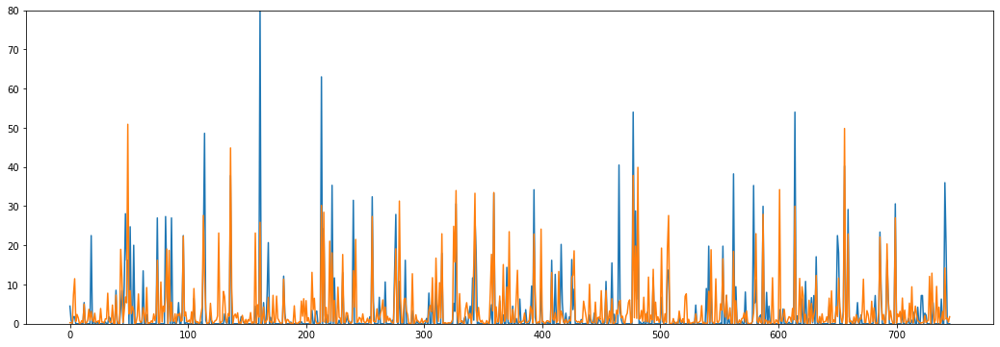

In [ ]:
# Métricas
print("RMSE Mean:", np.round(ann_rmse, 3))

# Visualizamos
figure(num=None, figsize=(18, 6))
plt.ylim([0,80])
plt.plot(y_test)
plt.plot(model.predict(X_test))

# Añadir a la tabla comparativa
model_comparative = AddModel('ANN Sequential (Early Stopping) Model - GridSearchCV', ann_rmse, model_comparative)
model_comparative.sort_values(by=['RMSE'], ascending=True).head()

Podemos ver que una red neuronal en la que evitamos el overfitting puede llegar a mejorar a modelos de scikit-learn en este ejemplo.

Además vemos una forma de tratar de evitar el overfitting para que la red neuronal funcione considerablemente mejor.

Hemos aprendido que con más capas y más neuronas el modelo puede aprender más, pero tiende a overfitting. De ahí que early stopping sea tan interesante.

Por último hemos visto cómo haciendo GridSearch y buscando los mejores parámetros, podemos mejorar bastante nuestro modelo.

## Top 5 Models

In [ ]:
model_comparative.sort_values(by=['RMSE'], ascending=True).head()

,RMSE
ANN Sequential (Early Stopping) Model - Fine Tuning,6.168
ANN Sequential (Early Stopping) Model,6.195
ANN Sequential (Early Stopping) Model - GridSearchCV,6.247
Random Forest Model,7.621
Linear SVM Model,8.160
